<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Other%20Experiments/EURUSD_1D_Close_NoMinMax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import pandas as pd

try:
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator
except:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)

     |████████████████████████████████| 727kB 2.8MB/s 
  Created wheel for Ta-Lib: filename=TA_Lib-0.4.17-cp36-cp36m-linux_x86_64.whl size=2405514 sha256=2739a4763b7fdea70b134ff992453af6d3fd00d14a4ec2ad9f3d0e06427a48fe
  Stored in directory: /root/.cache/pip/wheels/2a/2e/ec/71c565b2e0091e03a2b56abfbfd062f14a01a8d7b20ffe8bd5
Successfully built Ta-Lib


In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURUSD=X"
data_resample = '1D'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

folds = 0 # should be 0, corss validation cause overfitting

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

best_models = {}
ensemble_model_threshold = 0.05
split_percentages = [0.2,0.1] # validation size, test size

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50
cv_rfe = 5

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe', 'Super_learner'] # True for all , ['All','Fwe','RFE','RFECV','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
algos_to_include = [None, 'GLM' ,'XGBoost' ,'DeepLearning'] # [None, 'DRF', 'GLM' ,'XGBoost' ,'GBM' ,'DeepLearning' ,'StackedEnsemble'], None for all
is_EDA = True
is_minmax = False # use minmax
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-01,1.3980,1.4054,1.3955,1.3999,1.3999,0
2009-01-02,1.4003,1.4023,1.3843,1.3923,1.3923,0
2009-01-05,1.3958,1.3958,1.3556,1.3646,1.3646,0
2009-01-06,1.3632,1.3632,1.3318,1.3510,1.3510,0
2009-01-07,1.3499,1.3742,1.3437,1.3611,1.3611,0
...,...,...,...,...,...,...
2018-12-26,1.1413,1.1419,1.1376,1.1416,1.1416,0
2018-12-27,1.1364,1.1434,1.1359,1.1361,1.1361,0
2018-12-28,1.1431,1.1473,1.1431,1.1431,1.1431,0


,Open,High,Low,Close,Adj Close,Volume
count,2605.000000,2605.000000,2605.000000,2605.000000,2605.000000,2605.0
mean,1.258565,1.263361,1.253492,1.258516,1.258516,0.0
std,0.118513,0.118918,0.118288,0.118428,0.118428,0.0
min,1.039400,1.042000,0.760600,1.039000,1.039000,0.0
25%,1.139700,1.143500,1.135900,1.139500,1.139500,0.0
50%,1.280900,1.287000,1.274700,1.281200,1.281200,0.0
75%,1.354800,1.359600,1.350000,1.354700,1.354700,0.0
max,1.512600,1.514500,1.504100,1.512800,1.512800,0.0


0

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2605
Total Missing (%),0.0%
Total size in memory,142.6 KiB
Average record size in memory,56.0 B
Numeric,1
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import os

def fe(last_index = None):
  features_dataset = pd.read_pickle('full_dataset').sort_index()
  if last_index is not None:
    features_dataset = features_dataset[:-last_index]


  periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
  timeperiods = [8, 12, 14, 20, 24, 30]
  matypes = [0,1,2,3,4,5,6,8]
  nbdevs = [2, 3, 4, 5]

  # date features
  features_dataset['day'] = features_dataset.index.day
  features_dataset['dayofweek'] = features_dataset.index.dayofweek
  features_dataset['dayofyear'] = features_dataset.index.dayofyear
  features_dataset['days_in_month'] = features_dataset.index.days_in_month
  features_dataset['hour'] = features_dataset.index.hour
  features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
  features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
  features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
  features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
  features_dataset['minute'] = features_dataset.index.minute
  features_dataset['month'] = features_dataset.index.month
  features_dataset['quarter'] = features_dataset.index.quarter
  features_dataset['second'] = features_dataset.index.second
  features_dataset['week'] = features_dataset.index.week
  features_dataset['weekday'] = features_dataset.index.weekday
  features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
  features_dataset['weekofyear'] = features_dataset.index.weekofyear

  # Overlap Studies
  features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
  features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
  features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                      offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                      accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                      accelerationshort=-4e37, accelerationmaxshort=-4e37)

  for timeperiod in timeperiods:
      features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                            acceleration=timeperiod / 100,
                                                            maximum=timeperiod / 100)
      features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

      for matype in matypes:
          features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                            timeperiod=timeperiod, matype=matype)
          features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                                minperiod=2,
                                                                                maxperiod=timeperiod, matype=matype)
          features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                            timeperiod=timeperiod,
                                                                            vfactor=matype / 10)

          for nbdev in nbdevs:
              features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                  features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

              
  gc.collect()
  # Momentum Indicators
  features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                features_dataset['Close'])

  for timeperiod in timeperiods:
      features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
          features_dataset['High'],
          features_dataset['Low'],
          timeperiod=timeperiod)
      features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                    features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
          'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
      features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], features_dataset['Volume'],
                                                      timeperiod=timeperiod)
      features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                                features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                              features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                              timeperiod=timeperiod)
      features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                          features_dataset['Close'], timeperiod=timeperiod)

      
  gc.collect()
  features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
      features_dataset['Close'], fastperiod=12,
      slowperiod=26,
      signalperiod=9)
  features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
      features_dataset['Close'],
      fastperiod=12,
      fastmatype=0,
      slowperiod=26,
      slowmatype=0,
      signalperiod=9,
      signalmatype=0)

  features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                          features_dataset['Low'],
                                                                          features_dataset['Close'], fastk_period=5,
                                                                          slowk_period=3, slowk_matype=0,
                                                                          slowd_period=3, slowd_matype=0)
  features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                              features_dataset['Low'],
                                                                              features_dataset['Close'], fastk_period=5,
                                                                              fastd_period=3, fastd_matype=0)
  features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                    timeperiod=14,
                                                                                    fastk_period=5, fastd_period=3,
                                                                                    fastd_matype=0)
  features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                      timeperiod1=7, timeperiod2=14, timeperiod3=28)

  # Volume Indicators
  features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                              features_dataset['Volume'])
  features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    features_dataset['Volume'], fastperiod=3, slowperiod=10)
  features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

  gc.collect()
  # Volatility Indicators
  for timeperiod in timeperiods:
      features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  # Price Transform
  features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
  features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
  features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
  features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  gc.collect()
  # Cycle Indicators
  features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
  features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
  features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
  features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
  features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

  # Pattern Recognition
  features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
  features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
  features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
  features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'], penetration=0)
  features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  gc.collect()

  # Statistic Functions
  for timeperiod in timeperiods:
      features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                        timeperiod=timeperiod)
      features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                            timeperiod=timeperiod)
      features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                      timeperiod=timeperiod)
      features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
      features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

      
  gc.collect()
  # Math Transform
  features_dataset['ACOS'] = ACOS(features_dataset['Close'])
  features_dataset['ASIN'] = ASIN(features_dataset['Close'])
  features_dataset['ATAN'] = ATAN(features_dataset['Close'])
  features_dataset['CEIL'] = CEIL(features_dataset['Close'])
  features_dataset['COS'] = COS(features_dataset['Close'])
  features_dataset['COSH'] = COSH(features_dataset['Close'])
  features_dataset['EXP'] = EXP(features_dataset['Close'])
  features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
  features_dataset['LN'] = LN(features_dataset['Close'])
  features_dataset['LOG10'] = LOG10(features_dataset['Close'])
  features_dataset['SIN'] = SIN(features_dataset['Close'])
  features_dataset['SINH'] = SINH(features_dataset['Close'])
  features_dataset['SQRT'] = SQRT(features_dataset['Close'])
  features_dataset['TAN'] = TAN(features_dataset['Close'])
  features_dataset['TANH'] = TANH(features_dataset['Close'])

  gc.collect()
  # Math Operator
  features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
  features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
  features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
  features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

  for timeperiod in timeperiods:
      features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
          features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
      
  gc.collect()


  features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
  features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
  features_dataset.to_pickle('features_dataset' if last_index is None else 'features_dataset_' + str(last_index))
  if last_index is None:
    display(features_dataset)
    display(features_dataset.describe())

  del periods, timeperiods, matypes, nbdevs, features_dataset
  gc.collect()

fe()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# check features data leakage
fe(100)
long_df = pd.read_pickle('features_dataset')[:-100]
short_df =  pd.read_pickle('features_dataset_100')
if False in (long_df.index.values == short_df.index.values):
  print('mismatch INDEX', long_df.index.values == short_df.index.values)

for aCol in long_df.columns.values:
  try:
    if False in (long_df[aCol].values == short_df[aCol].values):
      print('mismatch, ', aCol, long_df[aCol].values == short_df[aCol].values)
  except:
    print('mismatch exception, ', aCol)

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del talib, long_df, short_df
gc.collect()
print('Nothing should be printed above')

Nothing should be printed above


In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]]
longs = label_df[data_label].values[1:] > label_df[data_label].values[:-1] 
shorts = label_df[data_label].values[1:] <= label_df[data_label].values[:-1] 
label_df = label_df[:-1]
label_df[data_label_name] = (longs*1 + shorts*0).astype(int)
scaled_df = features_dataset
scaled_df = pd.DataFrame((minmax_scale(scaled_df, axis=0, feature_range=(0, 1)) if is_minmax else scaled_df), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale, shorts, longs
gc.collect()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

6

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*(1-(split_percentages[0]+split_percentages[1]))),int(len(train_hf)*(1-split_percentages[1]))]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpl_jyz06_
  JVM stdout: /tmp/tmpl_jyz06_/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpl_jyz06_/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,5 months and 19 days !!!
H2O cluster name:,H2O_from_python_unknownUser_3cdp8x
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline
from h2o.exceptions import H2OJobCancelled
from sklearn.metrics import accuracy_score

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num,best_models
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  nfolds = nfolds or folds
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo, keep_cross_validation_predictions=True)
      t_hf = (training_frame or train_hf)
      validation_frame =  t_hf[index_splits[0]:index_splits[1],:] if split_percentages[0] != 0 else None

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=validation_frame, leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except (KeyboardInterrupt, H2OJobCancelled):
      raise Exception('Stopped')
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    best_models[str(feature_name) + '_' + str(model_algo)] = {'id':aml.leader.model_id ,'AUC':getattr(model_performance, "auc")(),
                                                              'path': h2o.save_model(aml.leader,force=True)}
    predicted = aml.leader.predict(t_hf).as_data_frame()

    # predicted['predict'] = (predicted['p1'] >= aml.leader.find_threshold_by_max_metric('f1', train=False, valid=True, xval=False)).astype(int)
    predicted.to_csv(str(feature_name) + '_' + str(model_algo) + '.csv', )
    predicted = predicted[['predict']]
    print(predicted)
    start_idx = max(-index_splits[1],-20)
    predicted = predicted[start_idx:]
    predict_df = pd.read_pickle('predict_df')[start_idx:]

    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.798901,0.558188,0.271978,0.437577,0.191474
1,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.781563,0.586288,0.299145,0.448057,0.200755
2,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.779853,0.590830,0.332845,0.446519,0.199379
3,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.779243,0.567466,0.291819,0.440756,0.194266
4,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.767888,0.620670,0.335958,0.464808,0.216046
5,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.757998,0.567028,0.336691,0.442340,0.195665
6,DeepLearning_1_AutoML_20191208_062142,0.752991,0.663982,0.335836,0.487428,0.237586
7,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.736630,1.742021,0.368681,0.552202,0.304928
8,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.711447,2.410437,0.337607,0.657297,0.432040
9,DeepLearning_grid_1_AutoML_20191208_062142_mod...,0.696520,0.785559,0.392491,0.525069,0.275697


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,1.000000,1.000000,0.007769
1,CDLDRAGONFLYDOJI,0.865147,0.865147,0.006721
2,CDLTAKURI,0.841152,0.841152,0.006535
3,STOCHF_fastk,0.586185,0.586185,0.004554
4,CDLCLOSINGMARUBOZU,0.524715,0.524715,0.004076
...,...,...,...,...
933,BBANDS_middleband_8_1_2,0.100292,0.100292,0.000779
934,BBANDS_middleband_12_5_4,0.098313,0.098313,0.000764
935,CDLCOUNTERATTACK,0.096809,0.096809,0.000752
936,CDL3INSIDE,0.088708,0.088708,0.000689


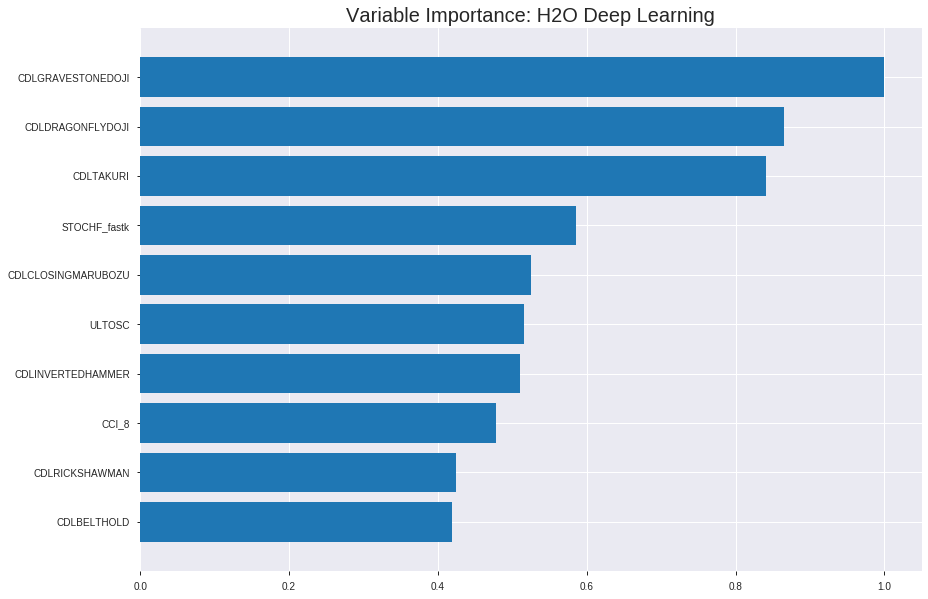

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_062142_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.17110477310026048
RMSE: 0.41364812715671817
LogLoss: 0.5183112396822931
Mean Per-Class Error: 0.2612477703623537
AUC: 0.8281776094276094
pr_auc: 0.8273441443745354
Gini: 0.6563552188552189
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4682671248463466: 


,0,1,Error,Rate
0,463.0,428.0,0.4804,(428.0/891.0)
1,77.0,819.0,0.0859,(77.0/896.0)
Total,540.0,1247.0,0.2826,(505.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4682671,0.7643490,244.0
max f2,0.3458682,0.8713858,294.0
max f0point5,0.6273797,0.7617450,147.0
max accuracy,0.5181945,0.7386682,203.0
max precision,0.9985017,1.0,0.0
max recall,0.0000001,1.0,399.0
max specificity,0.9985017,1.0,0.0
max absolute_mcc,0.5181945,0.4783290,203.0
max min_per_class_accuracy,0.5108307,0.734375,209.0
max mean_per_class_accuracy,0.5181945,0.7387522,203.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 52.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9846057,1.9944196,1.9944196,1.0,0.9896900,1.0,0.9896900,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9787886,1.9944196,1.9944196,1.0,0.9812924,1.0,0.9854912,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9729554,1.9944196,1.9944196,1.0,0.9759685,1.0,0.9823170,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9657244,1.8836186,1.9667194,0.9444444,0.9698892,0.9861111,0.9792100,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.9581202,1.7728175,1.9279390,0.8888889,0.9623329,0.9666667,0.9758346,0.0178571,0.0970982,77.2817460,92.7938988
,6,0.1001679,0.9104591,1.7703275,1.8495735,0.8876404,0.9349764,0.9273743,0.9555196,0.0881696,0.1852679,77.0327548,84.9573524
,7,0.1499720,0.8453425,1.8151460,1.8381405,0.9101124,0.8821036,0.9216418,0.9311389,0.0904018,0.2756696,81.5145967,83.8140492
,8,0.2003358,0.7587449,1.6841766,1.7994345,0.8444444,0.7999733,0.9022346,0.8981643,0.0848214,0.3604911,68.4176587,79.9434482
,9,0.2999440,0.6146853,1.5462355,1.7153497,0.7752809,0.6880671,0.8600746,0.8283932,0.1540179,0.5145089,54.6235453,71.5349730
,10,0.4001119,0.5423027,1.1142009,1.5648523,0.5586592,0.5737820,0.7846154,0.7646514,0.1116071,0.6261161,11.4200918,56.4852335




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19395160963613284
RMSE: 0.44039937515411265
LogLoss: 0.5675633688915003
Mean Per-Class Error: 0.26535511581530913
AUC: 0.805967172879276
pr_auc: 0.7882721831725867
Gini: 0.611934345758552
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4357403144489563: 


,0,1,Error,Rate
0,143.0,122.0,0.4604,(122.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,168.0,343.0,0.2877,(147.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4357403,0.7504244,264.0
max f2,0.4079697,0.8488539,310.0
max f0point5,0.4707701,0.7396450,172.0
max accuracy,0.4633895,0.7358121,195.0
max precision,0.9680249,1.0,0.0
max recall,0.0353590,1.0,390.0
max specificity,0.9680249,1.0,0.0
max absolute_mcc,0.4633895,0.4704821,195.0
max min_per_class_accuracy,0.4594369,0.7283019,206.0
max mean_per_class_accuracy,0.4633895,0.7346449,195.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 46.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9376379,2.0772358,2.0772358,1.0,0.9511141,1.0,0.9511141,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9210816,2.0772358,2.0772358,1.0,0.9273892,1.0,0.9403301,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9047036,2.0772358,2.0772358,1.0,0.9123793,1.0,0.9315955,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.8865355,1.6617886,1.9783198,0.8,0.8954266,0.9523810,0.9229838,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.8667627,2.0772358,1.9973421,1.0,0.8725571,0.9615385,0.9132864,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.7941595,1.7576610,1.8775016,0.8461538,0.8228654,0.9038462,0.8680759,0.0894309,0.1910569,75.7661038,87.7501563
,7,0.1506849,0.6755844,1.9941463,1.9153732,0.96,0.7382908,0.9220779,0.8259379,0.0975610,0.2886179,99.4146341,91.5373245
,8,0.2015656,0.5595256,1.1984053,1.7343910,0.5769231,0.6197511,0.8349515,0.7738907,0.0609756,0.3495935,19.8405253,73.4391033
,9,0.3013699,0.4812585,1.4255540,1.6321138,0.6862745,0.5051078,0.7857143,0.6848782,0.1422764,0.4918699,42.5553961,63.2113821
,10,0.4011742,0.4689764,1.4255540,1.5807258,0.6862745,0.4739362,0.7609756,0.6323999,0.1422764,0.6341463,42.5553961,58.0725758



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 06:41:43,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 06:41:47,5 min 17.218 sec,594 obs/sec,1.2770006,1,2282.0,0.5642092,0.8725208,-0.2733381,0.5569027,0.5363135,1.3296131,0.4946838,0.6194595,1.0650383,-0.5370452,0.5495245,0.5534773,1.7310298,0.5166341
,2019-12-08 06:42:18,5 min 47.464 sec,640 obs/sec,11.3105764,9,20212.0,0.4787610,0.6541109,0.0831444,0.6905921,0.6728619,1.9944196,0.3805260,0.5935724,0.9664164,-0.4112638,0.7289385,0.7065565,2.0772358,0.4109589
,2019-12-08 06:42:43,6 min 12.832 sec,658 obs/sec,20.0761052,16,35876.0,0.4532488,0.5953053,0.1782558,0.7449144,0.7480449,1.8836186,0.3587017,0.4752080,0.6391889,0.0954588,0.7829959,0.7713741,2.0772358,0.3150685
,2019-12-08 06:43:08,6 min 37.708 sec,669 obs/sec,28.8130946,23,51489.0,0.4477020,0.5855232,0.1982454,0.7859103,0.7795665,1.8836186,0.3144936,0.4546934,0.5981320,0.1718708,0.8001917,0.7810497,2.0772358,0.3013699
,2019-12-08 06:43:35,7 min 4.778 sec,682 obs/sec,38.7560157,31,69257.0,0.4288000,0.5460237,0.2645163,0.8144240,0.8134883,1.9944196,0.2921097,0.4538009,0.5988024,0.1751184,0.7952063,0.7808874,2.0772358,0.2994129
,2019-12-08 06:44:02,7 min 31.489 sec,694 obs/sec,48.8164522,39,87235.0,0.4401064,0.5684630,0.2252194,0.7836863,0.7693002,1.8836186,0.3184107,0.4765418,0.6426827,0.0903740,0.7966559,0.7741653,2.0772358,0.2876712
,2019-12-08 06:44:28,7 min 57.473 sec,703 obs/sec,58.7571349,47,104999.0,0.4136481,0.5183112,0.3155755,0.8281776,0.8273441,1.9944196,0.2825965,0.4403994,0.5675634,0.2231195,0.8059672,0.7882722,2.0772358,0.2876712
,2019-12-08 06:44:54,8 min 23.449 sec,711 obs/sec,68.7459429,55,122849.0,0.4174627,0.5222744,0.3028940,0.8340141,0.8347953,1.9944196,0.2506995,0.4514017,0.5932339,0.1838178,0.8058368,0.7887062,2.0772358,0.2798434
,2019-12-08 06:44:56,8 min 26.203 sec,710 obs/sec,68.7459429,55,122849.0,0.4136481,0.5183112,0.3155755,0.8281776,0.8273441,1.9944196,0.2825965,0.4403994,0.5675634,0.2231195,0.8059672,0.7882722,2.0772358,0.2876712


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,1.0,1.0,0.0077690
CDLDRAGONFLYDOJI,0.8651475,0.8651475,0.0067213
CDLTAKURI,0.8411524,0.8411524,0.0065349
STOCHF_fastk,0.5861855,0.5861855,0.0045540
CDLCLOSINGMARUBOZU,0.5247152,0.5247152,0.0040765
---,---,---,---
BBANDS_middleband_8_1_2,0.1002924,0.1002924,0.0007792
BBANDS_middleband_12_5_4,0.0983129,0.0983129,0.0007638
CDLCOUNTERATTACK,0.0968088,0.0968088,0.0007521
CDL3INSIDE,0.0887078,0.0887078,0.0006892



See the whole table with table.as_data_frame()


('accuracy', 0.73046875)

('F1', 0.7692307692307692)

('auc', 0.7989010989010988)

('logloss', 0.5581879494772563)

('mean_per_class_error', 0.271978021978022)

('rmse', 0.43757706346837333)

('mse', 0.1914736864736048)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


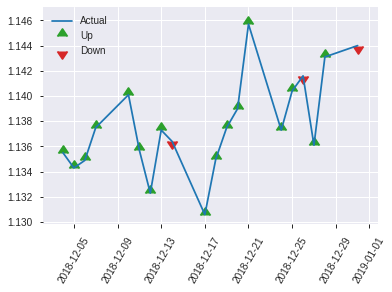


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1914736864736048
RMSE: 0.43757706346837333
LogLoss: 0.5581879494772563
Mean Per-Class Error: 0.271978021978022
AUC: 0.7989010989010988
pr_auc: 0.8018421482770568
Gini: 0.5978021978021977
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4468490063518123: 


,0,1,Error,Rate
0,72.0,54.0,0.4286,(54.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,87.0,169.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4468490,0.7692308,168.0
max f2,0.4172861,0.8731241,212.0
max f0point5,0.4626892,0.7315113,122.0
max accuracy,0.4468490,0.7304688,168.0
max precision,0.9779649,1.0,0.0
max recall,0.0178775,1.0,254.0
max specificity,0.9779649,1.0,0.0
max absolute_mcc,0.4468490,0.4813497,168.0
max min_per_class_accuracy,0.4607189,0.7063492,128.0
max mean_per_class_accuracy,0.4468490,0.7280220,168.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9643466,1.9692308,1.9692308,1.0,0.9721546,1.0,0.9721546,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9541471,1.9692308,1.9692308,1.0,0.9574654,1.0,0.9648100,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9242660,1.9692308,1.9692308,1.0,0.9385707,1.0,0.9582502,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9109003,1.9692308,1.9692308,1.0,0.9169122,1.0,0.9469762,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8864996,1.9692308,1.9692308,1.0,0.8988578,1.0,0.9395734,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8097556,1.9692308,1.9692308,1.0,0.8503804,1.0,0.8949769,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.6391089,1.5147929,1.8177515,0.7692308,0.7581236,0.9230769,0.8493591,0.0769231,0.2769231,51.4792899,81.7751479
,8,0.203125,0.5166595,1.5147929,1.7420118,0.7692308,0.5655191,0.8846154,0.7783991,0.0769231,0.3538462,51.4792899,74.2011834
,9,0.3007812,0.4808250,1.1815385,1.5600400,0.6,0.4915060,0.7922078,0.6852520,0.1153846,0.4692308,18.1538462,56.0039960
,10,0.4023438,0.4708101,1.2118343,1.4721434,0.6153846,0.4759716,0.7475728,0.6324239,0.1230769,0.5923077,21.1834320,47.2143391


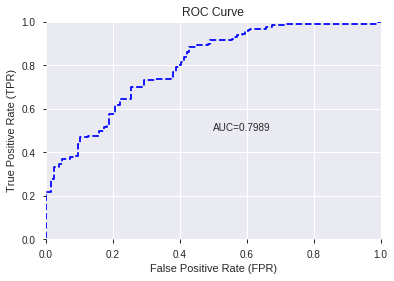

This function is available for GLM models only


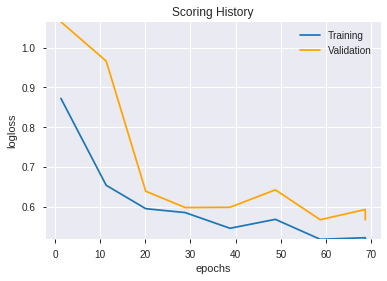

--2019-12-08 06:45:11--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.26.124
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.26.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  16.5MB/s    in 23s     

2019-12-08 06:45:35 (15.5 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unk

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_062142_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_062142_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

938

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'CDLINVERTEDHAMMER',
 'CCI_8',
 'CDLRICKSHAWMAN',
 'CDLBELTHOLD',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'CDLHANGINGMAN',
 'MINUS_DM_8',
 'CDLSHOOTINGSTAR',
 'days_in_month',
 'PLUS_DM_8',
 'CCI_14',
 'CDLHAMMER',
 'SUB',
 'CCI_12',
 'DIV',
 'CDLDOJI',
 'CCI_30',
 'WILLR_14',
 'WILLR_8',
 'aroonup_12',
 'SAREXT',
 'CDLLONGLEGGEDDOJI',
 'PLUS_DI_12',
 'WILLR_12',
 'PLUS_DM_12',
 'PLUS_DI_14',
 'aroonup_8',
 'is_month_end',
 'CDLHIKKAKE',
 'CCI_20',
 'TRANGE',
 'MINUS_DI_12',
 'weekday_name',
 'CORREL_20',
 'STOCHF_fastd',
 'is_month_start',
 'CCI_24',
 'is_quarter_end',
 'HT_DCPERIOD',
 'PLUS_DM_14',
 'CORREL_8',
 'AROONOSC_12',
 'STOCH_slowk']

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_064628_model_6,0.801587,0.511216,0.288828,0.419389,0.175887
1,DeepLearning_grid_1_AutoML_20191208_064628_model_9,0.798107,0.524225,0.312149,0.423174,0.179077
2,DeepLearning_grid_1_AutoML_20191208_064628_model_8,0.797253,0.519831,0.300611,0.421122,0.177344
3,DeepLearning_grid_1_AutoML_20191208_064628_model_3,0.795665,0.533108,0.274847,0.427391,0.182663
4,DeepLearning_grid_1_AutoML_20191208_064628_model_5,0.789530,0.528011,0.275946,0.426337,0.181763
5,DeepLearning_1_AutoML_20191208_064628,0.786203,0.554844,0.293040,0.438070,0.191905
6,DeepLearning_grid_1_AutoML_20191208_064628_model_7,0.778388,0.678528,0.283150,0.466975,0.218066
7,DeepLearning_grid_1_AutoML_20191208_064628_model_4,0.769902,0.698911,0.328144,0.460551,0.212107
8,DeepLearning_grid_1_AutoML_20191208_064628_model_1,0.751282,0.861051,0.348230,0.505585,0.255616
9,DeepLearning_grid_1_AutoML_20191208_064628_model_2,0.728205,0.618276,0.332357,0.463268,0.214617


,variable,relative_importance,scaled_importance,percentage
0,CDLRICKSHAWMAN,1.000000,1.000000,0.032158
1,CDLGRAVESTONEDOJI,0.990301,0.990301,0.031846
2,SUB,0.985158,0.985158,0.031681
3,STOCHF_fastk,0.949409,0.949409,0.030531
4,DIV,0.937324,0.937324,0.030143
5,CCI_8,0.873030,0.873030,0.028075
6,CDLLONGLEGGEDDOJI,0.810724,0.810724,0.026071
7,TRANGE,0.799146,0.799146,0.025699
8,ULTOSC,0.787174,0.787174,0.025314
9,CDLTAKURI,0.779623,0.779623,0.025071


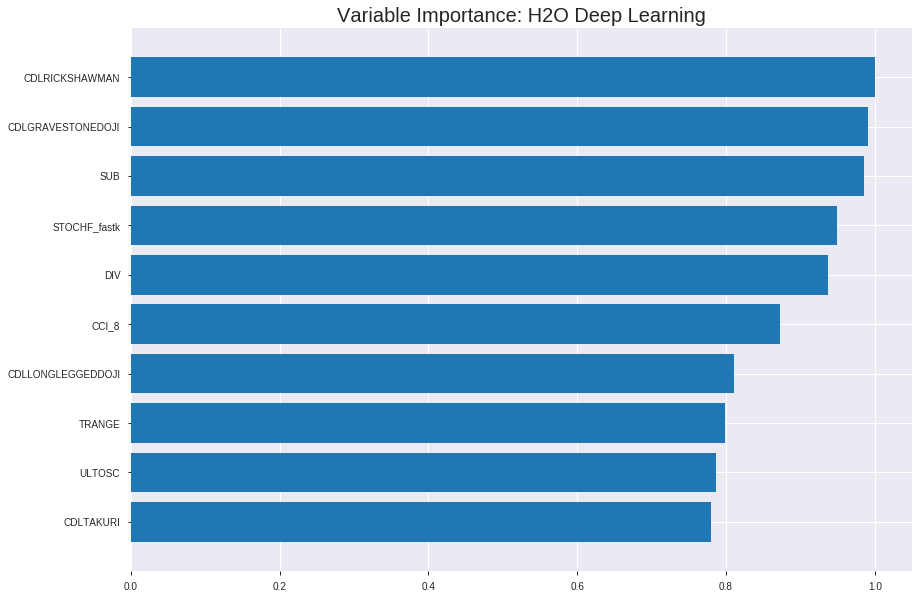

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_064628_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.17290150177634922
RMSE: 0.415814263555676
LogLoss: 0.5091057115170785
Mean Per-Class Error: 0.2783239137405804
AUC: 0.8124549062049062
pr_auc: 0.8146051919987372
Gini: 0.6249098124098125
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3944249822919341: 


,0,1,Error,Rate
0,395.0,496.0,0.5567,(496.0/891.0)
1,40.0,856.0,0.0446,(40.0/896.0)
Total,435.0,1352.0,0.2999,(536.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3944250,0.7615658,281.0
max f2,0.1737427,0.8716323,333.0
max f0point5,0.5706579,0.7255747,176.0
max accuracy,0.5086199,0.7218802,222.0
max precision,0.9988517,1.0,0.0
max recall,0.0052775,1.0,395.0
max specificity,0.9988517,1.0,0.0
max absolute_mcc,0.3944250,0.4644976,281.0
max min_per_class_accuracy,0.5286042,0.7142857,207.0
max mean_per_class_accuracy,0.5086199,0.7216761,222.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.44 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9867151,1.9944196,1.9944196,1.0,0.9914434,1.0,0.9914434,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9754258,1.9944196,1.9944196,1.0,0.9807163,1.0,0.9860798,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9699787,1.8836186,1.9574859,0.9444444,0.9726398,0.9814815,0.9815998,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9645604,1.8836186,1.9390191,0.9444444,0.9666399,0.9722222,0.9778599,0.0189732,0.078125,88.3618552,93.9019097
,5,0.0503637,0.9545358,1.9944196,1.9500992,1.0,0.9595760,0.9777778,0.9742031,0.0200893,0.0982143,99.4419643,95.0099206
,6,0.1001679,0.8993694,1.8823736,1.9164256,0.9438202,0.9291061,0.9608939,0.9517805,0.09375,0.1919643,88.2373596,91.6425579
,7,0.1499720,0.8189265,1.7255091,1.8530242,0.8651685,0.8605552,0.9291045,0.9214856,0.0859375,0.2779018,72.5509129,85.3024220
,8,0.2003358,0.7225777,1.5512153,1.7771505,0.7777778,0.7743966,0.8910615,0.8845079,0.078125,0.3560268,55.1215278,77.7150464
,9,0.2999440,0.6014535,1.3109388,1.6223264,0.6573034,0.6512635,0.8134328,0.8070499,0.1305804,0.4866071,31.0938754,62.2326426
,10,0.4001119,0.5543743,1.1921950,1.5146432,0.5977654,0.5756366,0.7594406,0.7491156,0.1194196,0.6060268,19.2194982,51.4643169




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.17877020172752778
RMSE: 0.4228122535210253
LogLoss: 0.5498088405913404
Mean Per-Class Error: 0.2643503604847369
AUC: 0.8081224114127934
pr_auc: 0.7736404534642248
Gini: 0.6162448228255868
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42074649345073617: 


,0,1,Error,Rate
0,130.0,135.0,0.5094,(135.0/265.0)
1,20.0,226.0,0.0813,(20.0/246.0)
Total,150.0,361.0,0.3033,(155.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4207465,0.7446458,277.0
max f2,0.1948547,0.8512931,323.0
max f0point5,0.6035405,0.7549234,140.0
max accuracy,0.5607803,0.7397260,164.0
max precision,0.9966731,1.0,0.0
max recall,0.0075299,1.0,387.0
max specificity,0.9966731,1.0,0.0
max absolute_mcc,0.5607803,0.4847596,164.0
max min_per_class_accuracy,0.5273675,0.7032520,198.0
max mean_per_class_accuracy,0.5607803,0.7356496,164.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9907369,1.3848238,1.3848238,0.6666667,0.9934526,0.6666667,0.9934526,0.0162602,0.0162602,38.4823848,38.4823848
,2,0.0215264,0.9867155,1.6617886,1.5107169,0.8,0.9886446,0.7272727,0.9912671,0.0162602,0.0325203,66.1788618,51.0716925
,3,0.0313112,0.9740516,2.0772358,1.6877541,1.0,0.9814145,0.8125,0.9881882,0.0203252,0.0528455,107.7235772,68.7754065
,4,0.0410959,0.9687125,1.6617886,1.6815718,0.8,0.9706910,0.8095238,0.9840222,0.0162602,0.0691057,66.1788618,68.1571816
,5,0.0508806,0.9620339,2.0772358,1.7576610,1.0,0.9667465,0.8461538,0.9806999,0.0203252,0.0894309,107.7235772,75.7661038
,6,0.1017613,0.9208135,1.9973421,1.8775016,0.9615385,0.9421010,0.9038462,0.9614005,0.1016260,0.1910569,99.7342089,87.7501563
,7,0.1506849,0.8885611,1.9941463,1.9153732,0.96,0.9033498,0.9220779,0.9425529,0.0975610,0.2886179,99.4146341,91.5373245
,8,0.2015656,0.8256413,1.5978737,1.8352277,0.7692308,0.8584609,0.8834951,0.9213258,0.0813008,0.3699187,59.7873671,83.5227721
,9,0.3013699,0.6487555,1.4662841,1.7130451,0.7058824,0.7327165,0.8246753,0.8588642,0.1463415,0.5162602,46.6284075,71.3045085
,10,0.4011742,0.5503694,1.2626335,1.6009915,0.6078431,0.5866440,0.7707317,0.7911411,0.1260163,0.6422764,26.2633509,60.0991473



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 06:50:15,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 06:50:20,1 min 55.638 sec,3498 obs/sec,9.8186905,1,17546.0,0.4378949,0.5729173,0.2329863,0.7759477,0.7712318,1.9944196,0.3228875,0.4350292,0.6027687,0.2419504,0.7954518,0.7583531,1.3848238,0.2876712
,2019-12-08 06:50:27,2 min 2.694 sec,4533 obs/sec,29.4487969,3,52625.0,0.4158143,0.5091057,0.3083886,0.8124549,0.8146052,1.9944196,0.2999440,0.4228123,0.5498088,0.2839292,0.8081224,0.7736405,1.3848238,0.3033268
,2019-12-08 06:50:34,2 min 9.392 sec,4908 obs/sec,49.0710688,5,87690.0,0.4069067,0.4924160,0.3377027,0.8371362,0.8366911,1.9944196,0.2562955,0.4245440,0.5512745,0.2780516,0.8037506,0.7733244,1.7310298,0.3111546
,2019-12-08 06:50:40,2 min 15.902 sec,5127 obs/sec,68.6759933,7,122724.0,0.3961980,0.4693749,0.3721037,0.8514172,0.8497443,1.9944196,0.2680470,0.4260083,0.5642715,0.2730628,0.8017717,0.7620319,1.7310298,0.2837573
,2019-12-08 06:50:46,2 min 22.179 sec,5301 obs/sec,88.3122552,9,157814.0,0.3873418,0.4505089,0.3998607,0.8645551,0.8552335,1.9944196,0.2495803,0.4294092,0.5724832,0.2614098,0.7981899,0.7617466,1.7310298,0.2876712
,2019-12-08 06:50:53,2 min 28.374 sec,5434 obs/sec,107.9524342,11,192911.0,0.3859730,0.4491949,0.4040946,0.8745365,0.8698241,1.9944196,0.2193621,0.4400419,0.5822919,0.2243803,0.7655622,0.7362890,1.7310298,0.3483366
,2019-12-08 06:50:53,2 min 28.843 sec,5431 obs/sec,107.9524342,11,192911.0,0.4158143,0.5091057,0.3083886,0.8124549,0.8146052,1.9944196,0.2999440,0.4228123,0.5498088,0.2839292,0.8081224,0.7736405,1.3848238,0.3033268


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLRICKSHAWMAN,1.0,1.0,0.0321582
CDLGRAVESTONEDOJI,0.9903014,0.9903014,0.0318463
SUB,0.9851580,0.9851580,0.0316809
STOCHF_fastk,0.9494094,0.9494094,0.0305313
DIV,0.9373235,0.9373235,0.0301426
---,---,---,---
is_month_start,0.4545414,0.4545414,0.0146172
AROONOSC_12,0.4514768,0.4514768,0.0145187
is_quarter_end,0.4322508,0.4322508,0.0139004
CDLSHOOTINGSTAR,0.4308296,0.4308296,0.0138547



See the whole table with table.as_data_frame()


('accuracy', 0.72265625)

('F1', 0.7711598746081505)

('auc', 0.8015873015873016)

('logloss', 0.5112161410669053)

('mean_per_class_error', 0.27905982905982896)

('rmse', 0.41938910278709196)

('mse', 0.175887219536562)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


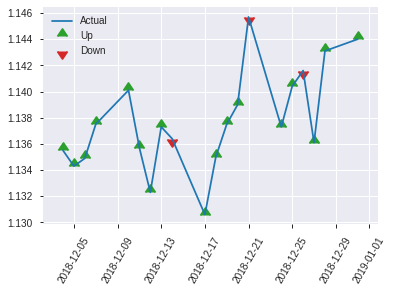


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.175887219536562
RMSE: 0.41938910278709196
LogLoss: 0.5112161410669053
Mean Per-Class Error: 0.27905982905982896
AUC: 0.8015873015873016
pr_auc: 0.8089218875305324
Gini: 0.6031746031746033
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.351787202255505: 


,0,1,Error,Rate
0,60.0,66.0,0.5238,(66.0/126.0)
1,7.0,123.0,0.0538,(7.0/130.0)
Total,67.0,189.0,0.2852,(73.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3517872,0.7711599,188.0
max f2,0.0748509,0.8728011,218.0
max f0point5,0.5280564,0.7213439,93.0
max accuracy,0.4589575,0.7226562,156.0
max precision,0.9891482,1.0,0.0
max recall,0.0303802,1.0,233.0
max specificity,0.9891482,1.0,0.0
max absolute_mcc,0.3517872,0.4803472,188.0
max min_per_class_accuracy,0.4947615,0.7076923,127.0
max mean_per_class_accuracy,0.4589575,0.7209402,156.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9786621,1.9692308,1.9692308,1.0,0.9858700,1.0,0.9858700,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9727264,1.9692308,1.9692308,1.0,0.9747526,1.0,0.9803113,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9678844,1.9692308,1.9692308,1.0,0.9700695,1.0,0.9777508,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9626720,1.9692308,1.9692308,1.0,0.9654931,1.0,0.9744078,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9547473,1.9692308,1.9692308,1.0,0.9590628,1.0,0.9720470,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8790717,1.9692308,1.9692308,1.0,0.9293733,1.0,0.9507101,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8028030,1.8177515,1.9187377,0.9230769,0.8418041,0.9743590,0.9144081,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7139104,1.3633136,1.7798817,0.6923077,0.7470337,0.9038462,0.8725645,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5730849,1.024,1.5344655,0.52,0.6269907,0.7792208,0.7928328,0.1,0.4615385,2.4000000,53.4465534
,10,0.4023438,0.5190797,1.2875740,1.4721434,0.6538462,0.5363401,0.7475728,0.7280871,0.1307692,0.5923077,28.7573964,47.2143391


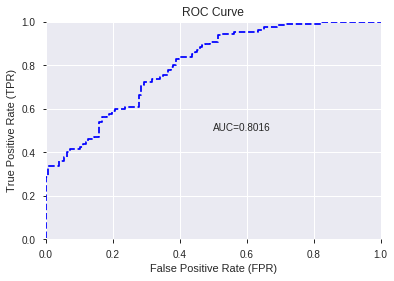

This function is available for GLM models only


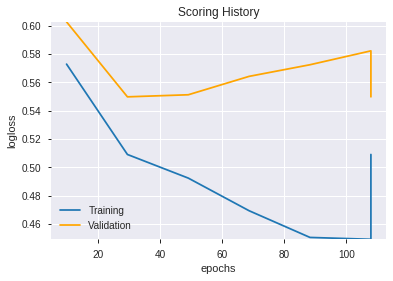

--2019-12-08 06:54:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.224.96
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.224.96|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_064628_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_064628_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_7_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

['CDLRICKSHAWMAN',
 'CDLGRAVESTONEDOJI',
 'SUB',
 'STOCHF_fastk',
 'DIV',
 'CCI_8',
 'CDLLONGLEGGEDDOJI',
 'TRANGE',
 'ULTOSC',
 'CDLTAKURI',
 'CDLDOJI',
 'CDLDRAGONFLYDOJI',
 'days_in_month',
 'WILLR_8',
 'WILLR_12',
 'CORREL_20',
 'SAREXT',
 'WILLR_14',
 'MINUS_DI_8',
 'CORREL_8',
 'MINUS_DM_8',
 'PLUS_DM_8',
 'CDLBELTHOLD',
 'CCI_12',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastd',
 'HT_DCPERIOD',
 'weekday_name',
 'STOCH_slowk',
 'PLUS_DI_8',
 'CCI_14',
 'PLUS_DI_14',
 'is_month_end',
 'CDLHIKKAKE',
 'aroonup_12',
 'aroonup_8',
 'MINUS_DI_12',
 'PLUS_DM_14',
 'CCI_24',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'CCI_20',
 'CDLHANGINGMAN',
 'CCI_30',
 'is_month_start',
 'AROONOSC_12',
 'is_quarter_end',
 'CDLSHOOTINGSTAR',
 'CDLHAMMER']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_065505_model_1,0.815995,0.515048,0.259096,0.41803,0.174749


,variable,relative_importance,scaled_importance,percentage
0,PLUS_DI_12,4.555325,1.000000,0.173706
1,PLUS_DI_14,2.474008,0.543103,0.094340
2,PLUS_DM_12,2.410507,0.529163,0.091919
3,PLUS_DI_8,2.327973,0.511044,0.088771
4,PLUS_DM_14,2.321414,0.509605,0.088521
5,CCI_14,1.257140,0.275971,0.047938
6,CCI_8,1.147658,0.251938,0.043763
7,CCI_12,1.054965,0.231590,0.040228
8,MINUS_DI_8,0.934167,0.205072,0.035622
9,MINUS_DI_12,0.817948,0.179559,0.031190


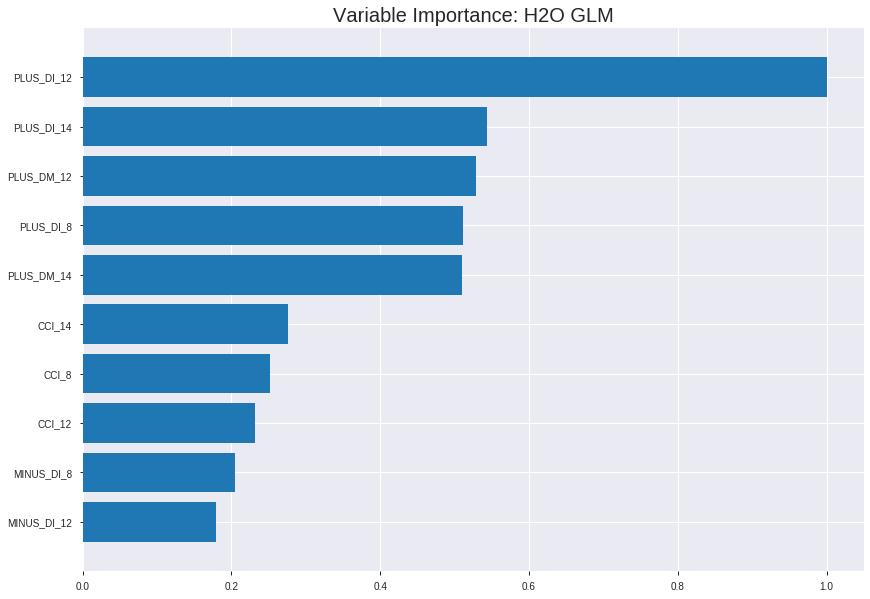

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_065505_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18086806638938374
RMSE: 0.4252858643187941
LogLoss: 0.5377456942369204
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375749
Residual deviance: 1921.903111202754
AIC: 2023.903111202754
AUC: 0.8029670464566298
pr_auc: 0.7943955237964293
Gini: 0.6059340929132595
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4215048870932621: 


,0,1,Error,Rate
0,529.0,362.0,0.4063,(362.0/891.0)
1,133.0,763.0,0.1484,(133.0/896.0)
Total,662.0,1125.0,0.277,(495.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4215049,0.7550717,240.0
max f2,0.2455502,0.8595450,317.0
max f0point5,0.5763541,0.7285032,164.0
max accuracy,0.4283236,0.7229994,236.0
max precision,0.9957909,1.0,0.0
max recall,0.0116708,1.0,396.0
max specificity,0.9957909,1.0,0.0
max absolute_mcc,0.4215049,0.4610184,240.0
max min_per_class_accuracy,0.5157102,0.71875,195.0
max mean_per_class_accuracy,0.4283236,0.7226763,236.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9727636,1.9944196,1.9944196,1.0,0.9849536,1.0,0.9849536,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9615934,1.8836186,1.9390191,0.9444444,0.9674360,0.9722222,0.9761948,0.0189732,0.0390625,88.3618552,93.9019097
,3,0.0302182,0.9487899,1.7728175,1.8836186,0.8888889,0.9547723,0.9444444,0.9690540,0.0178571,0.0569196,77.2817460,88.3618552
,4,0.0402910,0.9378283,1.8836186,1.8836186,0.9444444,0.9427371,0.9444444,0.9624748,0.0189732,0.0758929,88.3618552,88.3618552
,5,0.0503637,0.9267144,1.7728175,1.8614583,0.8888889,0.9319480,0.9333333,0.9563694,0.0178571,0.09375,77.2817460,86.1458333
,6,0.1001679,0.8734735,1.7703275,1.8161475,0.8876404,0.8997162,0.9106145,0.9282011,0.0881696,0.1819196,77.0327548,81.6147496
,7,0.1499720,0.7920131,1.7030999,1.7786056,0.8539326,0.8328064,0.8917910,0.8965215,0.0848214,0.2667411,70.3099920,77.8605577
,8,0.2003358,0.7311402,1.5733755,1.7270114,0.7888889,0.7616299,0.8659218,0.8626102,0.0792411,0.3459821,57.3375496,72.7011423
,9,0.2999440,0.6428246,1.3557572,1.6037218,0.6797753,0.6820283,0.8041045,0.8026408,0.1350446,0.4810268,35.5757173,60.3721765
,10,0.4001119,0.5764424,1.2813311,1.5230114,0.6424581,0.6086465,0.7636364,0.7540744,0.1283482,0.609375,28.1331055,52.3011364




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17626494377155869
RMSE: 0.41983918798935227
LogLoss: 0.5272520250234092
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497436
Residual deviance: 538.8515695739242
AIC: 640.8515695739242
AUC: 0.81491793219819
pr_auc: 0.8071258737973531
Gini: 0.62983586439638
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4249761953284937: 


,0,1,Error,Rate
0,155.0,110.0,0.4151,(110.0/265.0)
1,34.0,212.0,0.1382,(34.0/246.0)
Total,189.0,322.0,0.2818,(144.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4249762,0.7464789,245.0
max f2,0.1801017,0.8497884,336.0
max f0point5,0.7186139,0.7581454,113.0
max accuracy,0.5890904,0.7358121,163.0
max precision,0.9981971,1.0,0.0
max recall,0.0161657,1.0,393.0
max specificity,0.9981971,1.0,0.0
max absolute_mcc,0.6720855,0.4825163,128.0
max min_per_class_accuracy,0.5213332,0.7245283,195.0
max mean_per_class_accuracy,0.4761448,0.7362556,217.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.48 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9776847,2.0772358,2.0772358,1.0,0.9870401,1.0,0.9870401,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9734583,2.0772358,2.0772358,1.0,0.9748199,1.0,0.9814854,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9586955,2.0772358,2.0772358,1.0,0.9669027,1.0,0.9769283,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9476710,2.0772358,2.0772358,1.0,0.9545560,1.0,0.9716016,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9389325,1.6617886,1.9973421,0.8,0.9428748,0.9615385,0.9660772,0.0162602,0.1016260,66.1788618,99.7342089
,6,0.1017613,0.9058261,1.9174484,1.9573952,0.9230769,0.9242572,0.9423077,0.9451672,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8510063,1.7448780,1.8883962,0.84,0.8778344,0.9090909,0.9233059,0.0853659,0.2845528,74.4878049,88.8396157
,8,0.2015656,0.7959491,1.6777674,1.8352277,0.8076923,0.8256334,0.8834951,0.8986507,0.0853659,0.3699187,67.7767355,83.5227721
,9,0.3013699,0.6856582,1.5477443,1.7400222,0.7450980,0.7407535,0.8376623,0.8463601,0.1544715,0.5243902,54.7744301,74.0022173
,10,0.4011742,0.5889922,1.1811733,1.6009915,0.5686275,0.6293871,0.7707317,0.7923814,0.1178862,0.6422764,18.1173282,60.0991473



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 06:55:05,0.000 sec,2,.15E2,51,1.3680891,1.3667628
,2019-12-08 06:55:05,0.022 sec,4,.96E1,51,1.3582218,1.3559763
,2019-12-08 06:55:06,0.039 sec,6,.6E1,51,1.3439839,1.3403173
,2019-12-08 06:55:06,0.056 sec,8,.37E1,51,1.3244986,1.3187364
,2019-12-08 06:55:06,0.069 sec,10,.23E1,51,1.2996942,1.2910309
---,---,---,---,---,---,---,---
,2019-12-08 06:55:06,0.298 sec,50,.1E-3,51,1.0773497,1.0556031
,2019-12-08 06:55:06,0.308 sec,51,.64E-4,51,1.0770654,1.0555200
,2019-12-08 06:55:06,0.328 sec,54,.4E-4,51,1.0762838,1.0550375
,2019-12-08 06:55:06,0.335 sec,55,.25E-4,51,1.0760747,1.0549273



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7421875)

('F1', 0.7642857142857143)

('auc', 0.815995115995116)

('logloss', 0.515047770434673)

('mean_per_class_error', 0.25909645909645906)

('rmse', 0.41802979421356223)

('mse', 0.1747489088502332)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


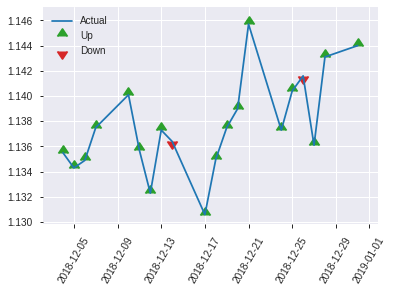


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1747489088502332
RMSE: 0.41802979421356223
LogLoss: 0.515047770434673
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550244
Residual deviance: 263.70445846255257
AIC: 365.70445846255257
AUC: 0.815995115995116
pr_auc: 0.8241383681969089
Gini: 0.631990231990232
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4385072090801703: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,23.0,107.0,0.1769,(23.0/130.0)
Total,106.0,150.0,0.2578,(66.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4385072,0.7642857,149.0
max f2,0.1895920,0.8669355,223.0
max f0point5,0.5656042,0.7641509,99.0
max accuracy,0.4385072,0.7421875,149.0
max precision,0.9809477,1.0,0.0
max recall,0.0531159,1.0,243.0
max specificity,0.9809477,1.0,0.0
max absolute_mcc,0.4385072,0.4890256,149.0
max min_per_class_accuracy,0.4896318,0.7142857,128.0
max mean_per_class_accuracy,0.4385072,0.7409035,149.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9651759,1.9692308,1.9692308,1.0,0.9761522,1.0,0.9761522,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9522600,1.9692308,1.9692308,1.0,0.9578677,1.0,0.9670099,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9497445,1.9692308,1.9692308,1.0,0.9505573,1.0,0.9628968,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9380183,1.9692308,1.9692308,1.0,0.9422769,1.0,0.9572732,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9329018,1.9692308,1.9692308,1.0,0.9349771,1.0,0.9538430,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8485407,1.9692308,1.9692308,1.0,0.9026472,1.0,0.9282451,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7775622,1.8177515,1.9187377,0.9230769,0.8120974,0.9743590,0.8895292,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7249651,1.3633136,1.7798817,0.6923077,0.7488341,0.9038462,0.8543555,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6220577,1.2603077,1.6111888,0.64,0.6688080,0.8181818,0.7941128,0.1230769,0.4846154,26.0307692,61.1188811
,10,0.4023438,0.5604881,1.3633136,1.5486184,0.6923077,0.5876471,0.7864078,0.7419952,0.1384615,0.6230769,36.3313609,54.8618372


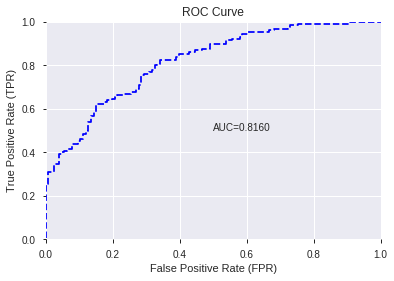

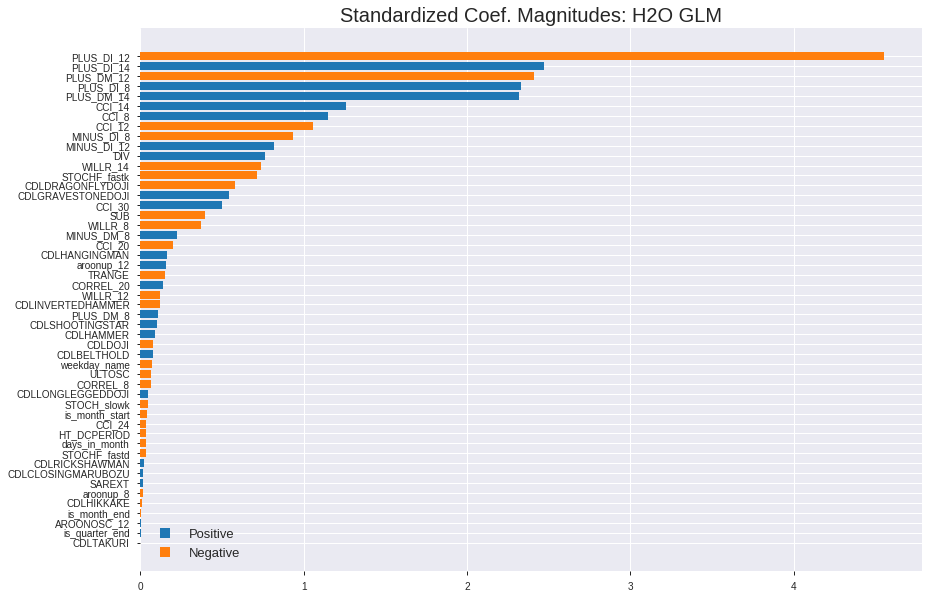

'log_likelihood'
--2019-12-08 06:55:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.109.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.109.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_065505_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_065505_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_12_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_12_s

['PLUS_DI_12',
 'PLUS_DI_14',
 'PLUS_DM_12',
 'PLUS_DI_8',
 'PLUS_DM_14',
 'CCI_14',
 'CCI_8',
 'CCI_12',
 'MINUS_DI_8',
 'MINUS_DI_12',
 'DIV',
 'WILLR_14',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CCI_30',
 'SUB',
 'WILLR_8',
 'MINUS_DM_8',
 'CCI_20',
 'CDLHANGINGMAN',
 'aroonup_12',
 'TRANGE',
 'CORREL_20',
 'WILLR_12',
 'CDLINVERTEDHAMMER',
 'PLUS_DM_8',
 'CDLSHOOTINGSTAR',
 'CDLHAMMER',
 'CDLDOJI',
 'CDLBELTHOLD',
 'weekday_name',
 'ULTOSC',
 'CORREL_8',
 'CDLLONGLEGGEDDOJI',
 'STOCH_slowk',
 'is_month_start',
 'CCI_24',
 'HT_DCPERIOD',
 'days_in_month',
 'STOCHF_fastd',
 'CDLRICKSHAWMAN',
 'CDLCLOSINGMARUBOZU',
 'SAREXT',
 'aroonup_8',
 'CDLHIKKAKE',
 'is_month_end',
 'AROONOSC_12',
 'is_quarter_end',
 'CDLTAKURI']

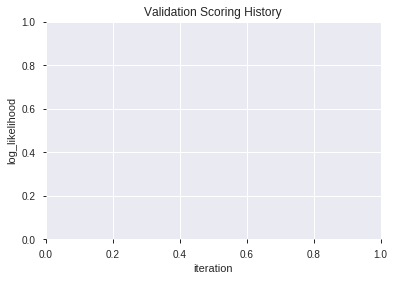

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20191208_065610,0.824786,0.510597,0.280159,0.413822,0.171249
1,XGBoost_grid_1_AutoML_20191208_065610_model_7,0.819414,0.513431,0.267766,0.415984,0.173043
2,XGBoost_grid_1_AutoML_20191208_065610_model_4,0.817155,0.524819,0.292674,0.419628,0.176087
3,XGBoost_grid_1_AutoML_20191208_065610_model_1,0.815568,0.522315,0.288095,0.419184,0.175715
4,XGBoost_grid_1_AutoML_20191208_065610_model_6,0.814225,0.519208,0.293162,0.418494,0.175138
5,XGBoost_grid_1_AutoML_20191208_065610_model_5,0.813614,0.519358,0.268498,0.420835,0.177102
6,XGBoost_3_AutoML_20191208_065610,0.810867,0.521683,0.271978,0.420226,0.176590
7,XGBoost_grid_1_AutoML_20191208_065610_model_2,0.809035,0.527782,0.300488,0.422296,0.178334
8,XGBoost_2_AutoML_20191208_065610,0.804457,0.527005,0.275214,0.422757,0.178723
9,XGBoost_grid_1_AutoML_20191208_065610_model_3,0.796642,0.531663,0.316728,0.425261,0.180847


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,746.096008,1.000000,0.074507
1,CDLTAKURI,725.421997,0.972290,0.072442
2,STOCHF_fastk,623.521667,0.835712,0.062266
3,CDLDRAGONFLYDOJI,529.398071,0.709558,0.052867
4,WILLR_12,505.942200,0.678119,0.050525
5,CCI_8,423.281281,0.567328,0.042270
6,WILLR_8,412.430023,0.552784,0.041186
7,ULTOSC,411.769073,0.551898,0.041120
8,STOCH_slowk,310.028839,0.415535,0.030960
9,MINUS_DM_8,301.278046,0.403806,0.030086


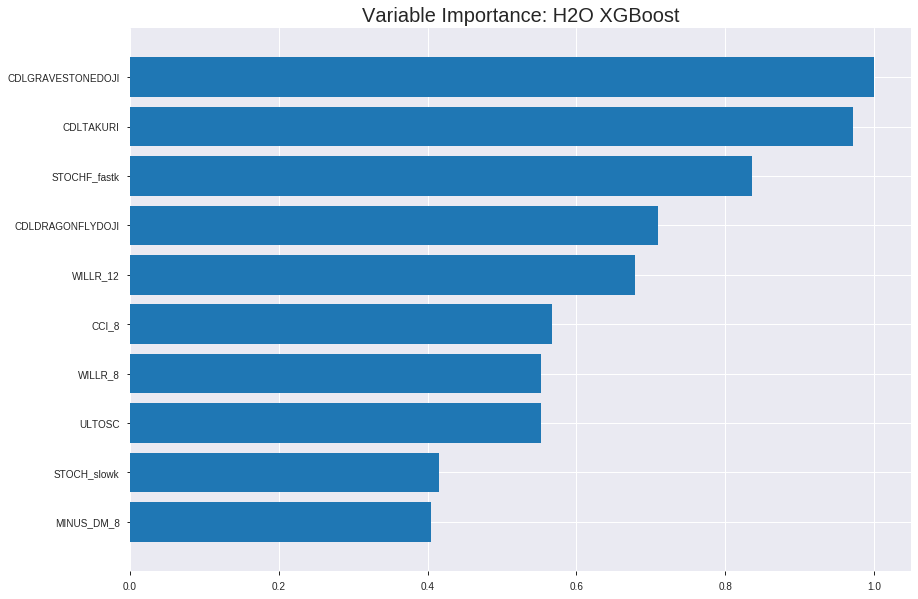

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20191208_065610


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.11117719382544543
RMSE: 0.33343244267084365
LogLoss: 0.37698787125667427
Mean Per-Class Error: 0.10514244628827962
AUC: 0.9518961940836941
pr_auc: 0.9500454025941645
Gini: 0.9037923881673882
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5199566880861918: 


,0,1,Error,Rate
0,788.0,103.0,0.1156,(103.0/891.0)
1,87.0,809.0,0.0971,(87.0/896.0)
Total,875.0,912.0,0.1063,(190.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5199567,0.8949115,192.0
max f2,0.4337025,0.9245242,225.0
max f0point5,0.5935337,0.9088595,159.0
max accuracy,0.5477056,0.8947957,179.0
max precision,0.9514768,1.0,0.0
max recall,0.1099353,1.0,364.0
max specificity,0.9514768,1.0,0.0
max absolute_mcc,0.5477056,0.7904085,179.0
max min_per_class_accuracy,0.5287176,0.8939732,188.0
max mean_per_class_accuracy,0.5477056,0.8948576,179.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9261069,1.9944196,1.9944196,1.0,0.9347262,1.0,0.9347262,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9183467,1.9944196,1.9944196,1.0,0.9228677,1.0,0.9287969,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9128997,1.9944196,1.9944196,1.0,0.9153485,1.0,0.9243141,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9070399,1.9944196,1.9944196,1.0,0.9100626,1.0,0.9207512,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8976776,1.9944196,1.9944196,1.0,0.9021939,1.0,0.9170398,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8595403,1.9944196,1.9944196,1.0,0.8779432,1.0,0.8976007,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8196356,1.9047828,1.9646522,0.9550562,0.8390895,0.9850746,0.8781697,0.0948661,0.2946429,90.4782805,96.4652186
,8,0.2003358,0.7784085,1.9057788,1.9498516,0.9555556,0.7971072,0.9776536,0.8577909,0.0959821,0.390625,90.5778770,94.9851606
,9,0.2999440,0.7004024,1.8487598,1.9162801,0.9269663,0.7358747,0.9608209,0.8173038,0.1841518,0.5747768,84.8759781,91.6280067
,10,0.4001119,0.6148323,1.8161475,1.8912119,0.9106145,0.6552376,0.9482517,0.7767306,0.1819196,0.7566964,81.6147496,89.1211913




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17947718429280085
RMSE: 0.4236474764386079
LogLoss: 0.5369164025018183
Mean Per-Class Error: 0.2541877588587207
AUC: 0.8092882343917779
pr_auc: 0.7865622667579731
Gini: 0.6185764687835558
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44401121139526367: 


,0,1,Error,Rate
0,165.0,100.0,0.3774,(100.0/265.0)
1,41.0,205.0,0.1667,(41.0/246.0)
Total,206.0,305.0,0.2759,(141.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4440112,0.7441016,230.0
max f2,0.1891475,0.8409571,336.0
max f0point5,0.6157221,0.7600382,150.0
max accuracy,0.6157221,0.7495108,150.0
max precision,0.9516283,1.0,0.0
max recall,0.0715953,1.0,386.0
max specificity,0.9516283,1.0,0.0
max absolute_mcc,0.6157221,0.5033022,150.0
max min_per_class_accuracy,0.5219740,0.7320755,190.0
max mean_per_class_accuracy,0.6157221,0.7458122,150.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9224438,1.7310298,1.7310298,0.8333333,0.9310752,0.8333333,0.9310752,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9160077,2.0772358,1.8883962,1.0,0.9193586,0.9090909,0.9257495,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9090209,2.0772358,1.9474085,1.0,0.9123425,0.9375,0.9215598,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9025810,1.6617886,1.8794038,0.8,0.9047587,0.9047619,0.9175595,0.0162602,0.0772358,66.1788618,87.9403794
,5,0.0508806,0.9012250,1.2463415,1.7576610,0.6,0.9019528,0.8461538,0.9145582,0.0121951,0.0894309,24.6341463,75.7661038
,6,0.1017613,0.8733132,1.9174484,1.8375547,0.9230769,0.8859310,0.8846154,0.9002446,0.0975610,0.1869919,91.7448405,83.7554722
,7,0.1506849,0.8517706,1.9941463,1.8883962,0.96,0.8613122,0.9090909,0.8876042,0.0975610,0.2845528,99.4146341,88.8396157
,8,0.2015656,0.8026353,1.7576610,1.8553951,0.8461538,0.8262241,0.8932039,0.8721102,0.0894309,0.3739837,75.7661038,85.5395059
,9,0.3013699,0.7110724,1.5477443,1.7535107,0.7450980,0.7582761,0.8441558,0.8344119,0.1544715,0.5284553,54.7744301,75.3510717
,10,0.4011742,0.6082373,1.2219034,1.6212572,0.5882353,0.6571141,0.7804878,0.7903037,0.1219512,0.6504065,22.1903396,62.1257188



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 06:56:11,0.253 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 06:56:11,0.381 sec,5.0,0.4683553,0.6314155,0.8653236,0.8549790,1.9205522,0.2238388,0.4745221,0.6430994,0.8005522,0.7722081,1.7804878,0.2974560
,2019-12-08 06:56:11,0.430 sec,10.0,0.4444263,0.5858983,0.8856841,0.8733176,1.9944196,0.1958590,0.4578144,0.6104880,0.8040344,0.7738096,2.0772358,0.2641879
,2019-12-08 06:56:11,0.475 sec,15.0,0.4256534,0.5501895,0.8924901,0.8784742,1.9944196,0.1908226,0.4453442,0.5855061,0.8054456,0.7872355,2.0772358,0.3033268
,2019-12-08 06:56:11,0.521 sec,20.0,0.4108656,0.5218405,0.8994809,0.8909728,1.9944196,0.1723559,0.4366975,0.5676500,0.8107148,0.7953625,2.0772358,0.2935421
,2019-12-08 06:56:11,0.582 sec,25.0,0.3992481,0.4993561,0.9063020,0.8991305,1.9944196,0.1689983,0.4310149,0.5555544,0.8135604,0.7977964,2.0772358,0.2700587
,2019-12-08 06:56:11,0.644 sec,30.0,0.3881539,0.4780309,0.9137368,0.9077104,1.9944196,0.1566872,0.4283124,0.5488956,0.8133840,0.7998213,2.0772358,0.2837573
,2019-12-08 06:56:11,0.700 sec,35.0,0.3791071,0.4605692,0.9204477,0.9157796,1.9944196,0.1482932,0.4265257,0.5441050,0.8106075,0.8006069,2.0772358,0.2954990
,2019-12-08 06:56:11,0.756 sec,40.0,0.3718245,0.4463483,0.9242775,0.9200528,1.9944196,0.1421377,0.4250474,0.5404507,0.8116736,0.7968797,2.0772358,0.2876712
,2019-12-08 06:56:11,0.828 sec,45.0,0.3642581,0.4322534,0.9295547,0.9253931,1.9944196,0.1421377,0.4246587,0.5393849,0.8117426,0.7928537,2.0772358,0.2700587


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,746.0960083,1.0,0.0745071
CDLTAKURI,725.4219971,0.9722904,0.0724425
STOCHF_fastk,623.5216675,0.8357124,0.0622665
CDLDRAGONFLYDOJI,529.3980713,0.7095576,0.0528670
WILLR_12,505.9421997,0.6781194,0.0505247
---,---,---,---
CDLLONGLEGGEDDOJI,30.2324429,0.0405208,0.0030191
CDLHANGINGMAN,8.4271975,0.0112951,0.0008416
CDLINVERTEDHAMMER,6.0925717,0.0081659,0.0006084
CDLBELTHOLD,5.4304438,0.0072785,0.0005423



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73828125)

('F1', 0.7672131147540985)

('auc', 0.8247863247863247)

('logloss', 0.5105969584476173)

('mean_per_class_error', 0.2623321123321123)

('rmse', 0.4138223292504234)

('mse', 0.17124892018624582)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


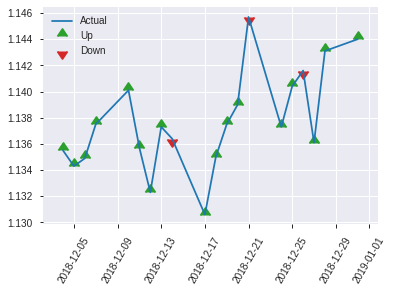


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17124892018624582
RMSE: 0.4138223292504234
LogLoss: 0.5105969584476173
Mean Per-Class Error: 0.2623321123321123
AUC: 0.8247863247863247
pr_auc: 0.8325723490915651
Gini: 0.6495726495726495
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3500414192676544: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,13.0,117.0,0.1,(13.0/130.0)
Total,81.0,175.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3500414,0.7672131,174.0
max f2,0.2343000,0.8686731,210.0
max f0point5,0.6373747,0.7641921,81.0
max accuracy,0.4694869,0.7382812,138.0
max precision,0.9361315,1.0,0.0
max recall,0.0786428,1.0,242.0
max specificity,0.9361315,1.0,0.0
max absolute_mcc,0.5858905,0.4786155,105.0
max min_per_class_accuracy,0.5002381,0.7076923,127.0
max mean_per_class_accuracy,0.4694869,0.7376679,138.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9281688,1.9692308,1.9692308,1.0,0.9332924,1.0,0.9332924,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9226090,1.9692308,1.9692308,1.0,0.9242000,1.0,0.9287462,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9138165,1.9692308,1.9692308,1.0,0.9174960,1.0,0.9259337,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9033818,1.9692308,1.9692308,1.0,0.9066085,1.0,0.9206632,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8924274,1.9692308,1.9692308,1.0,0.8972139,1.0,0.9170556,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8487919,1.8177515,1.8934911,0.9230769,0.8731733,0.9615385,0.8951144,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8169376,1.9692308,1.9187377,1.0,0.8333166,0.9743590,0.8745152,0.1,0.2923077,96.9230769,91.8737673
,8,0.203125,0.7516683,1.5147929,1.8177515,0.7692308,0.7815809,0.9230769,0.8512816,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6524769,1.4178462,1.6879121,0.72,0.6963875,0.8571429,0.8009913,0.1384615,0.5076923,41.7846154,68.7912088
,10,0.4023438,0.5924171,1.1360947,1.5486184,0.5769231,0.6205485,0.7864078,0.7554426,0.1153846,0.6230769,13.6094675,54.8618372


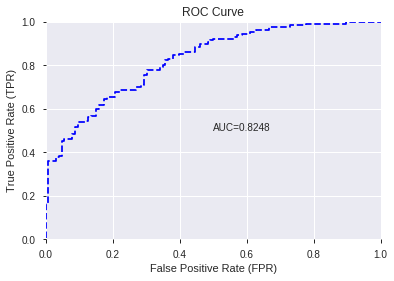

This function is available for GLM models only


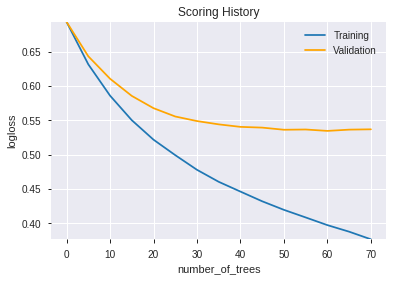

--2019-12-08 06:56:29--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.185.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.185.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20191208_065610',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20191208_065610',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_17_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_17_sid_9d28',
   'type

['CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'WILLR_12',
 'CCI_8',
 'WILLR_8',
 'ULTOSC',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_20',
 'CORREL_8',
 'HT_DCPERIOD',
 'WILLR_14',
 'CCI_14',
 'TRANGE',
 'SUB',
 'SAREXT',
 'MINUS_DI_8',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'aroonup_12',
 'CCI_30',
 'CCI_20',
 'PLUS_DM_12',
 'CCI_12',
 'DIV',
 'PLUS_DI_12',
 'PLUS_DI_8',
 'aroonup_8',
 'CCI_24',
 'PLUS_DM_14',
 'AROONOSC_12',
 'weekday_name',
 'PLUS_DI_14',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'STOCHF_fastd',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLBELTHOLD',
 'CDLHAMMER']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [15]:
# DRF with top DeepLearning features
model_train(feature_name='DLF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_4_AutoML_20191208_065833,0.817643,0.513690,0.280525,0.416290,0.173297
1,GBM_grid_1_AutoML_20191208_065833_model_4,0.816545,0.648198,0.254640,0.477145,0.227667
2,GBM_5_AutoML_20191208_065833,0.812210,0.525108,0.288462,0.420916,0.177170
3,GBM_grid_1_AutoML_20191208_065833_model_5,0.809463,0.684778,0.317094,0.495798,0.245816
4,GBM_3_AutoML_20191208_065833,0.808913,0.520570,0.259829,0.421354,0.177539
5,GBM_grid_1_AutoML_20191208_065833_model_1,0.808364,0.574837,0.279915,0.440655,0.194177
6,GBM_grid_1_AutoML_20191208_065833_model_2,0.802198,0.601599,0.312149,0.453806,0.205940
7,GBM_2_AutoML_20191208_065833,0.797375,0.533347,0.280159,0.426659,0.182038
8,GBM_1_AutoML_20191208_065833,0.796459,0.532256,0.274847,0.426427,0.181840
9,GBM_grid_1_AutoML_20191208_065833_model_3,0.747497,0.766928,0.376252,0.482729,0.233027


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,185.135544,1.000000,0.107100
1,WILLR_8,104.950562,0.566885,0.060713
2,CDLGRAVESTONEDOJI,99.055885,0.535045,0.057303
3,CCI_8,73.060890,0.394635,0.042265
4,STOCHF_fastk,72.132912,0.389622,0.041729
5,WILLR_12,69.327446,0.374469,0.040106
6,ULTOSC,67.395561,0.364034,0.038988
7,HT_DCPERIOD,51.162979,0.276354,0.029598
8,CCI_12,48.049953,0.259539,0.027797
9,TRANGE,47.792583,0.258149,0.027648


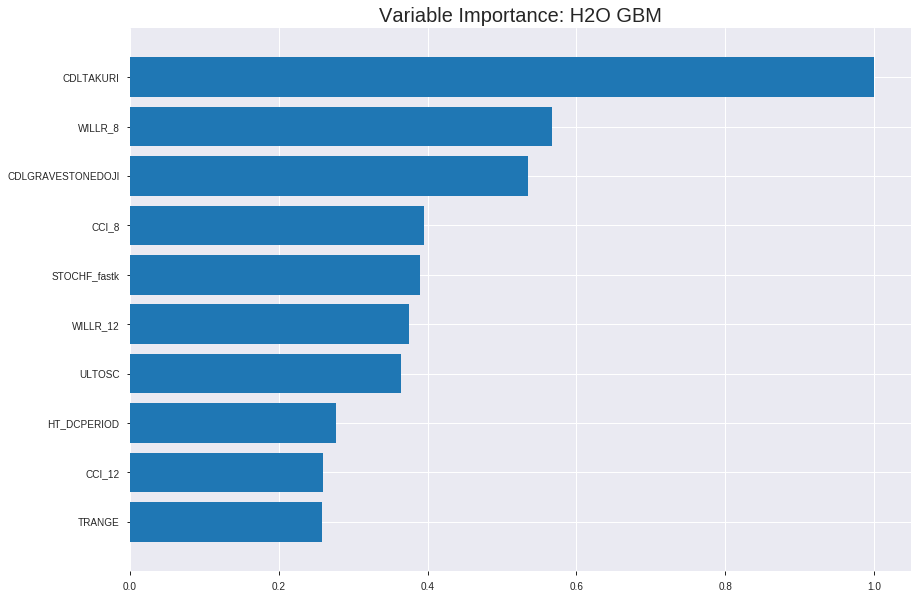

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_4_AutoML_20191208_065833


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.06074434212793959
RMSE: 0.24646367303913083
LogLoss: 0.2529022402271265
Mean Per-Class Error: 0.01844023067981393
AUC: 0.998052198573032
pr_auc: 0.9970473632452123
Gini: 0.9961043971460639
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5392521410633806: 


,0,1,Error,Rate
0,881.0,10.0,0.0112,(10.0/891.0)
1,23.0,873.0,0.0257,(23.0/896.0)
Total,904.0,883.0,0.0185,(33.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5392521,0.9814503,193.0
max f2,0.4399346,0.9843302,221.0
max f0point5,0.5658963,0.9873853,187.0
max accuracy,0.5447984,0.9815333,191.0
max precision,0.9767165,1.0,0.0
max recall,0.3008253,1.0,268.0
max specificity,0.9767165,1.0,0.0
max absolute_mcc,0.5447984,0.9632426,191.0
max min_per_class_accuracy,0.5185426,0.9799107,199.0
max mean_per_class_accuracy,0.5447984,0.9815598,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9530928,1.9944196,1.9944196,1.0,0.9636402,1.0,0.9636402,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9477116,1.9944196,1.9944196,1.0,0.9502202,1.0,0.9569302,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9436468,1.9944196,1.9944196,1.0,0.9452936,1.0,0.9530513,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9373671,1.9944196,1.9944196,1.0,0.9409198,1.0,0.9500184,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9310273,1.9944196,1.9944196,1.0,0.9337950,1.0,0.9467738,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9020840,1.9944196,1.9944196,1.0,0.9171042,1.0,0.9320218,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8692944,1.9944196,1.9944196,1.0,0.8844456,1.0,0.9162223,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8370837,1.9944196,1.9944196,1.0,0.8526328,1.0,0.9002361,0.1004464,0.3995536,99.4419643,99.4419643
,9,0.2999440,0.7682474,1.9944196,1.9944196,1.0,0.8017590,1.0,0.8675329,0.1986607,0.5982143,99.4419643,99.4419643
,10,0.4001119,0.6950875,1.9944196,1.9944196,1.0,0.7361671,1.0,0.8346455,0.1997768,0.7979911,99.4419643,99.4419643




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17705583242100287
RMSE: 0.4207800285434218
LogLoss: 0.5335164474081134
Mean Per-Class Error: 0.2390704095720202
AUC: 0.8154164749194662
pr_auc: 0.7824032757826496
Gini: 0.6308329498389325
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5054241352448542: 


,0,1,Error,Rate
0,190.0,75.0,0.283,(75.0/265.0)
1,48.0,198.0,0.1951,(48.0/246.0)
Total,238.0,273.0,0.2407,(123.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5054241,0.7630058,210.0
max f2,0.1019272,0.8413462,364.0
max f0point5,0.7214667,0.7483370,120.0
max accuracy,0.5054241,0.7592955,210.0
max precision,0.9713809,1.0,0.0
max recall,0.0471474,1.0,387.0
max specificity,0.9713809,1.0,0.0
max absolute_mcc,0.5054241,0.5227259,210.0
max min_per_class_accuracy,0.5445772,0.7479675,192.0
max mean_per_class_accuracy,0.5054241,0.7609296,210.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9569096,1.7310298,1.7310298,0.8333333,0.9646513,0.8333333,0.9646513,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9469118,1.6617886,1.6995565,0.8,0.9504679,0.8181818,0.9582043,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9426049,1.6617886,1.6877541,0.8,0.9443515,0.8125,0.9538753,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.9342701,1.6617886,1.6815718,0.8,0.9394607,0.8095238,0.9504433,0.0162602,0.0691057,66.1788618,68.1571816
,5,0.0508806,0.9297949,2.0772358,1.7576610,1.0,0.9323729,0.8461538,0.9469682,0.0203252,0.0894309,107.7235772,75.7661038
,6,0.1017613,0.8928234,1.8375547,1.7976079,0.8846154,0.9114211,0.8653846,0.9291947,0.0934959,0.1829268,83.7554722,79.7607880
,7,0.1506849,0.8667632,1.9110569,1.8344420,0.92,0.8805934,0.8831169,0.9134150,0.0934959,0.2764228,91.1056911,83.4441981
,8,0.2015656,0.8411527,1.7576610,1.8150604,0.8461538,0.8514822,0.8737864,0.8977815,0.0894309,0.3658537,75.7661038,81.5060384
,9,0.3013699,0.7382549,1.5477443,1.7265336,0.7450980,0.7900460,0.8311688,0.8621029,0.1544715,0.5203252,54.7744301,72.6533629
,10,0.4011742,0.6354539,1.1404432,1.5807258,0.5490196,0.6910258,0.7609756,0.8195422,0.1138211,0.6341463,14.0443169,58.0725758



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 06:58:36,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 06:58:36,0.078 sec,5.0,0.4225663,0.5460553,0.9322766,0.9334947,1.9944196,0.1477336,0.4524583,0.6001028,0.8050238,0.7593994,1.0386179,0.2563601
,2019-12-08 06:58:36,0.154 sec,10.0,0.3775239,0.4631415,0.9544415,0.9564433,1.9944196,0.1191942,0.4340641,0.5619669,0.8098711,0.7735699,1.3848238,0.2641879
,2019-12-08 06:58:36,0.230 sec,15.0,0.3385119,0.3945465,0.9744694,0.9732380,1.9944196,0.0783436,0.4253920,0.5424411,0.8139592,0.7799870,1.7310298,0.2739726
,2019-12-08 06:58:36,0.303 sec,20.0,0.3106195,0.3471555,0.9834888,0.9819892,1.9944196,0.0598769,0.4234108,0.5368208,0.8115355,0.7769839,1.3848238,0.2622309
,2019-12-08 06:58:36,0.373 sec,25.0,0.2870719,0.3101827,0.9911190,0.9895515,1.9944196,0.0436486,0.4244705,0.5396837,0.8104464,0.7776378,1.7310298,0.2504892
,2019-12-08 06:58:36,0.441 sec,30.0,0.2648676,0.2782260,0.9957800,0.9949506,1.9944196,0.0268607,0.4216586,0.5342262,0.8152707,0.7847915,2.0772358,0.2485323
,2019-12-08 06:58:36,0.509 sec,35.0,0.2464637,0.2529022,0.9980522,0.9970474,1.9944196,0.0184667,0.4207800,0.5335164,0.8154165,0.7824033,1.7310298,0.2407045


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,185.1355438,1.0,0.1071000
WILLR_8,104.9505615,0.5668850,0.0607134
CDLGRAVESTONEDOJI,99.0558853,0.5350452,0.0573033
CCI_8,73.0608902,0.3946346,0.0422654
STOCHF_fastk,72.1329117,0.3896222,0.0417285
---,---,---,---
is_month_end,0.3935359,0.0021257,0.0002277
CDLHAMMER,0.0394384,0.0002130,0.0000228
is_quarter_end,0.0,0.0,0.0
CDLHANGINGMAN,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7421875)

('F1', 0.7717041800643087)

('auc', 0.8176434676434677)

('logloss', 0.5136903029598625)

('mean_per_class_error', 0.25897435897435894)

('rmse', 0.4162896113693139)

('mse', 0.17329704053401443)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


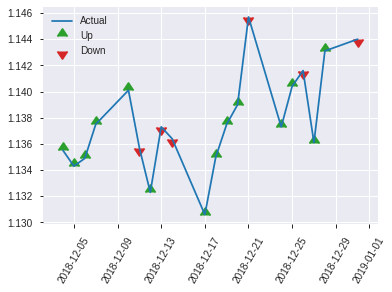


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17329704053401443
RMSE: 0.4162896113693139
LogLoss: 0.5136903029598625
Mean Per-Class Error: 0.25897435897435894
AUC: 0.8176434676434677
pr_auc: 0.82075350600628
Gini: 0.6352869352869355
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34570274308945165: 


,0,1,Error,Rate
0,65.0,61.0,0.4841,(61.0/126.0)
1,10.0,120.0,0.0769,(10.0/130.0)
Total,75.0,181.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3457027,0.7717042,180.0
max f2,0.1775912,0.8663029,212.0
max f0point5,0.6054246,0.7528958,96.0
max accuracy,0.4544098,0.7421875,147.0
max precision,0.9788041,1.0,0.0
max recall,0.0789782,1.0,237.0
max specificity,0.9788041,1.0,0.0
max absolute_mcc,0.4544098,0.4879861,147.0
max min_per_class_accuracy,0.5214759,0.7153846,126.0
max mean_per_class_accuracy,0.4544098,0.7410256,147.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9612368,1.9692308,1.9692308,1.0,0.9712098,1.0,0.9712098,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9466475,1.9692308,1.9692308,1.0,0.9531701,1.0,0.9621899,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9432890,1.9692308,1.9692308,1.0,0.9442010,1.0,0.9576927,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9333561,1.9692308,1.9692308,1.0,0.9372673,1.0,0.9521221,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9274272,1.9692308,1.9692308,1.0,0.9320661,1.0,0.9490366,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8811336,1.8177515,1.8934911,0.9230769,0.9080023,0.9615385,0.9285194,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8488217,1.8177515,1.8682446,0.9230769,0.8636637,0.9487179,0.9069009,0.0923077,0.2846154,81.7751479,86.8244576
,8,0.203125,0.7822427,1.5147929,1.7798817,0.7692308,0.8079566,0.9038462,0.8821648,0.0769231,0.3615385,51.4792899,77.9881657
,9,0.3007812,0.6662286,1.2603077,1.6111888,0.64,0.7238717,0.8181818,0.8307709,0.1230769,0.4846154,26.0307692,61.1188811
,10,0.4023438,0.5884303,1.3633136,1.5486184,0.6923077,0.6258964,0.7864078,0.7790550,0.1384615,0.6230769,36.3313609,54.8618372


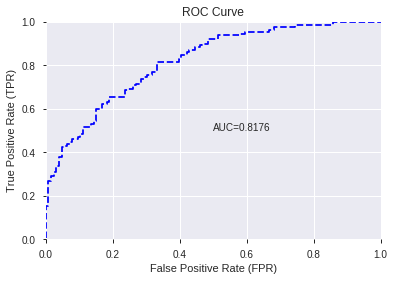

This function is available for GLM models only


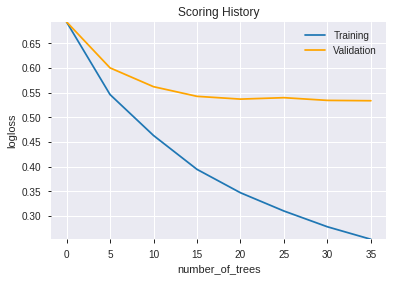

--2019-12-08 06:58:49--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.24.180
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.24.180|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      218.0
            depth:       1
            colId:       49
            colName:     SUB
            leftward:    false
            naVsRest:    false
            splitVal:    0.006508594
            isBitset:    false
            predValue:   -0.42800447
            squaredErr:  14.825686
            leftChild:   Node 5
            rightChil

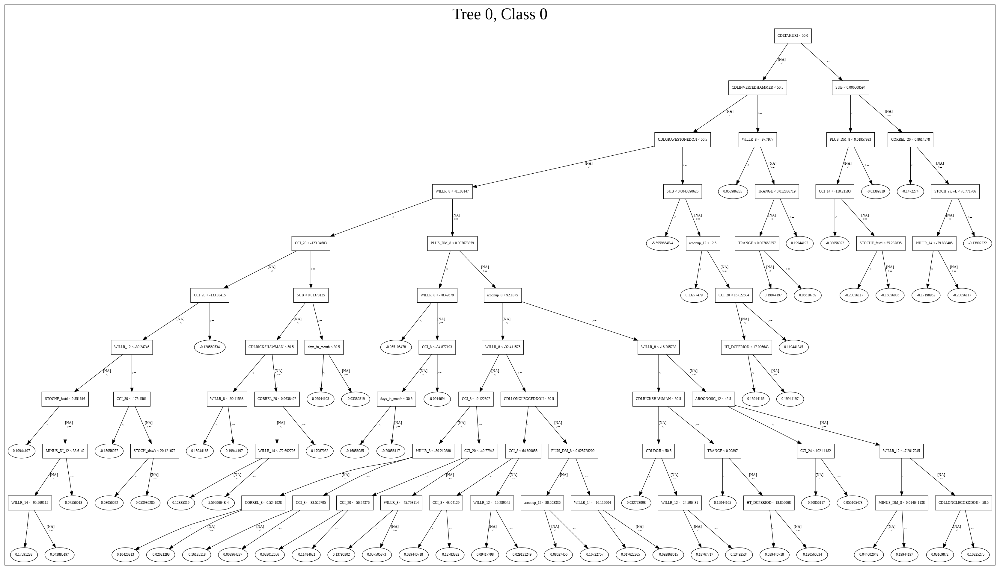

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_4_AutoML_20191208_065833',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_4_AutoML_20191208_065833',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_27_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_27_sid_9d28',
   'type': 'Key<

['CDLTAKURI',
 'WILLR_8',
 'CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'WILLR_12',
 'ULTOSC',
 'HT_DCPERIOD',
 'CCI_12',
 'TRANGE',
 'WILLR_14',
 'CDLDRAGONFLYDOJI',
 'PLUS_DM_8',
 'SUB',
 'STOCH_slowk',
 'MINUS_DI_8',
 'CCI_14',
 'CCI_30',
 'SAREXT',
 'aroonup_12',
 'CORREL_8',
 'MINUS_DI_12',
 'AROONOSC_12',
 'PLUS_DI_14',
 'weekday_name',
 'MINUS_DM_8',
 'DIV',
 'STOCHF_fastd',
 'PLUS_DM_14',
 'CCI_20',
 'PLUS_DI_8',
 'aroonup_8',
 'CCI_24',
 'CORREL_20',
 'PLUS_DM_12',
 'days_in_month',
 'CDLLONGLEGGEDDOJI',
 'PLUS_DI_12',
 'CDLRICKSHAWMAN',
 'CDLDOJI',
 'CDLINVERTEDHAMMER',
 'CDLHIKKAKE',
 'CDLBELTHOLD',
 'is_month_start',
 'CDLCLOSINGMARUBOZU',
 'is_month_end',
 'CDLHAMMER',
 'is_quarter_end',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR']

In [16]:
# GBM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [17]:
# StackedEnsemble with top DeepLearning features
model_train(feature_name='DLF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20191208_065947,0.824786,0.510597,0.280159,0.413822,0.171249
1,GBM_4_AutoML_20191208_065947,0.817643,0.513690,0.280525,0.416290,0.173297
2,GLM_grid_1_AutoML_20191208_065947_model_1,0.815995,0.515048,0.259096,0.418030,0.174749
3,GBM_5_AutoML_20191208_065947,0.812210,0.525108,0.288462,0.420916,0.177170
4,XGBoost_3_AutoML_20191208_065947,0.810867,0.521683,0.271978,0.420226,0.176590
5,GBM_3_AutoML_20191208_065947,0.808913,0.520570,0.259829,0.421354,0.177539
6,XGBoost_2_AutoML_20191208_065947,0.804457,0.527005,0.275214,0.422757,0.178723
7,GBM_2_AutoML_20191208_065947,0.797375,0.533347,0.280159,0.426659,0.182038
8,GBM_1_AutoML_20191208_065947,0.796459,0.532256,0.274847,0.426427,0.181840
9,DRF_1_AutoML_20191208_065947,0.779762,0.542884,0.323565,0.433445,0.187875


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,746.096008,1.000000,0.074507
1,CDLTAKURI,725.421997,0.972290,0.072442
2,STOCHF_fastk,623.521667,0.835712,0.062266
3,CDLDRAGONFLYDOJI,529.398071,0.709558,0.052867
4,WILLR_12,505.942200,0.678119,0.050525
5,CCI_8,423.281281,0.567328,0.042270
6,WILLR_8,412.430023,0.552784,0.041186
7,ULTOSC,411.769073,0.551898,0.041120
8,STOCH_slowk,310.028839,0.415535,0.030960
9,MINUS_DM_8,301.278046,0.403806,0.030086


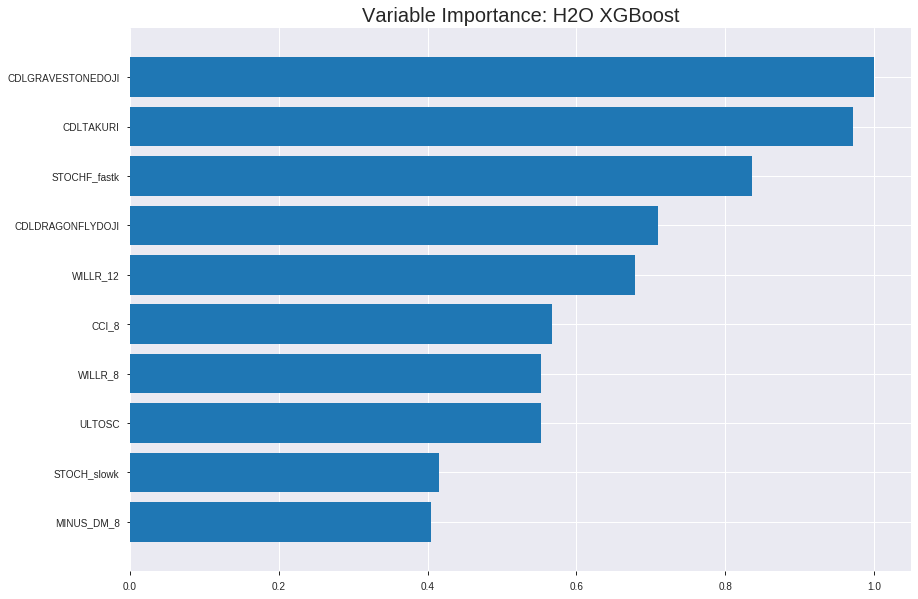

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20191208_065947


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.11117719382544543
RMSE: 0.33343244267084365
LogLoss: 0.37698787125667427
Mean Per-Class Error: 0.10514244628827962
AUC: 0.9518961940836941
pr_auc: 0.9500454025941645
Gini: 0.9037923881673882
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5199566880861918: 


,0,1,Error,Rate
0,788.0,103.0,0.1156,(103.0/891.0)
1,87.0,809.0,0.0971,(87.0/896.0)
Total,875.0,912.0,0.1063,(190.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5199567,0.8949115,192.0
max f2,0.4337025,0.9245242,225.0
max f0point5,0.5935337,0.9088595,159.0
max accuracy,0.5477056,0.8947957,179.0
max precision,0.9514768,1.0,0.0
max recall,0.1099353,1.0,364.0
max specificity,0.9514768,1.0,0.0
max absolute_mcc,0.5477056,0.7904085,179.0
max min_per_class_accuracy,0.5287176,0.8939732,188.0
max mean_per_class_accuracy,0.5477056,0.8948576,179.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9261069,1.9944196,1.9944196,1.0,0.9347262,1.0,0.9347262,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9183467,1.9944196,1.9944196,1.0,0.9228677,1.0,0.9287969,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9128997,1.9944196,1.9944196,1.0,0.9153485,1.0,0.9243141,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9070399,1.9944196,1.9944196,1.0,0.9100626,1.0,0.9207512,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8976776,1.9944196,1.9944196,1.0,0.9021939,1.0,0.9170398,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8595403,1.9944196,1.9944196,1.0,0.8779432,1.0,0.8976007,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8196356,1.9047828,1.9646522,0.9550562,0.8390895,0.9850746,0.8781697,0.0948661,0.2946429,90.4782805,96.4652186
,8,0.2003358,0.7784085,1.9057788,1.9498516,0.9555556,0.7971072,0.9776536,0.8577909,0.0959821,0.390625,90.5778770,94.9851606
,9,0.2999440,0.7004024,1.8487598,1.9162801,0.9269663,0.7358747,0.9608209,0.8173038,0.1841518,0.5747768,84.8759781,91.6280067
,10,0.4001119,0.6148323,1.8161475,1.8912119,0.9106145,0.6552376,0.9482517,0.7767306,0.1819196,0.7566964,81.6147496,89.1211913




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17947718429280085
RMSE: 0.4236474764386079
LogLoss: 0.5369164025018183
Mean Per-Class Error: 0.2541877588587207
AUC: 0.8092882343917779
pr_auc: 0.7865622667579731
Gini: 0.6185764687835558
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44401121139526367: 


,0,1,Error,Rate
0,165.0,100.0,0.3774,(100.0/265.0)
1,41.0,205.0,0.1667,(41.0/246.0)
Total,206.0,305.0,0.2759,(141.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4440112,0.7441016,230.0
max f2,0.1891475,0.8409571,336.0
max f0point5,0.6157221,0.7600382,150.0
max accuracy,0.6157221,0.7495108,150.0
max precision,0.9516283,1.0,0.0
max recall,0.0715953,1.0,386.0
max specificity,0.9516283,1.0,0.0
max absolute_mcc,0.6157221,0.5033022,150.0
max min_per_class_accuracy,0.5219740,0.7320755,190.0
max mean_per_class_accuracy,0.6157221,0.7458122,150.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9224438,1.7310298,1.7310298,0.8333333,0.9310752,0.8333333,0.9310752,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9160077,2.0772358,1.8883962,1.0,0.9193586,0.9090909,0.9257495,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9090209,2.0772358,1.9474085,1.0,0.9123425,0.9375,0.9215598,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9025810,1.6617886,1.8794038,0.8,0.9047587,0.9047619,0.9175595,0.0162602,0.0772358,66.1788618,87.9403794
,5,0.0508806,0.9012250,1.2463415,1.7576610,0.6,0.9019528,0.8461538,0.9145582,0.0121951,0.0894309,24.6341463,75.7661038
,6,0.1017613,0.8733132,1.9174484,1.8375547,0.9230769,0.8859310,0.8846154,0.9002446,0.0975610,0.1869919,91.7448405,83.7554722
,7,0.1506849,0.8517706,1.9941463,1.8883962,0.96,0.8613122,0.9090909,0.8876042,0.0975610,0.2845528,99.4146341,88.8396157
,8,0.2015656,0.8026353,1.7576610,1.8553951,0.8461538,0.8262241,0.8932039,0.8721102,0.0894309,0.3739837,75.7661038,85.5395059
,9,0.3013699,0.7110724,1.5477443,1.7535107,0.7450980,0.7582761,0.8441558,0.8344119,0.1544715,0.5284553,54.7744301,75.3510717
,10,0.4011742,0.6082373,1.2219034,1.6212572,0.5882353,0.6571141,0.7804878,0.7903037,0.1219512,0.6504065,22.1903396,62.1257188



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 06:59:47,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 06:59:47,0.060 sec,5.0,0.4683553,0.6314155,0.8653236,0.8549790,1.9205522,0.2238388,0.4745221,0.6430994,0.8005522,0.7722081,1.7804878,0.2974560
,2019-12-08 06:59:47,0.099 sec,10.0,0.4444263,0.5858983,0.8856841,0.8733176,1.9944196,0.1958590,0.4578144,0.6104880,0.8040344,0.7738096,2.0772358,0.2641879
,2019-12-08 06:59:47,0.137 sec,15.0,0.4256534,0.5501895,0.8924901,0.8784742,1.9944196,0.1908226,0.4453442,0.5855061,0.8054456,0.7872355,2.0772358,0.3033268
,2019-12-08 06:59:47,0.181 sec,20.0,0.4108656,0.5218405,0.8994809,0.8909728,1.9944196,0.1723559,0.4366975,0.5676500,0.8107148,0.7953625,2.0772358,0.2935421
,2019-12-08 06:59:47,0.224 sec,25.0,0.3992481,0.4993561,0.9063020,0.8991305,1.9944196,0.1689983,0.4310149,0.5555544,0.8135604,0.7977964,2.0772358,0.2700587
,2019-12-08 06:59:47,0.267 sec,30.0,0.3881539,0.4780309,0.9137368,0.9077104,1.9944196,0.1566872,0.4283124,0.5488956,0.8133840,0.7998213,2.0772358,0.2837573
,2019-12-08 06:59:47,0.309 sec,35.0,0.3791071,0.4605692,0.9204477,0.9157796,1.9944196,0.1482932,0.4265257,0.5441050,0.8106075,0.8006069,2.0772358,0.2954990
,2019-12-08 06:59:47,0.352 sec,40.0,0.3718245,0.4463483,0.9242775,0.9200528,1.9944196,0.1421377,0.4250474,0.5404507,0.8116736,0.7968797,2.0772358,0.2876712
,2019-12-08 06:59:47,0.401 sec,45.0,0.3642581,0.4322534,0.9295547,0.9253931,1.9944196,0.1421377,0.4246587,0.5393849,0.8117426,0.7928537,2.0772358,0.2700587


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,746.0960083,1.0,0.0745071
CDLTAKURI,725.4219971,0.9722904,0.0724425
STOCHF_fastk,623.5216675,0.8357124,0.0622665
CDLDRAGONFLYDOJI,529.3980713,0.7095576,0.0528670
WILLR_12,505.9421997,0.6781194,0.0505247
---,---,---,---
CDLLONGLEGGEDDOJI,30.2324429,0.0405208,0.0030191
CDLHANGINGMAN,8.4271975,0.0112951,0.0008416
CDLINVERTEDHAMMER,6.0925717,0.0081659,0.0006084
CDLBELTHOLD,5.4304438,0.0072785,0.0005423



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73828125)

('F1', 0.7672131147540985)

('auc', 0.8247863247863247)

('logloss', 0.5105969584476173)

('mean_per_class_error', 0.2623321123321123)

('rmse', 0.4138223292504234)

('mse', 0.17124892018624582)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


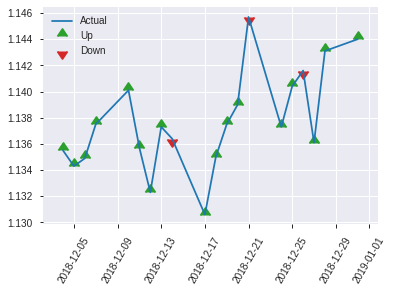


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17124892018624582
RMSE: 0.4138223292504234
LogLoss: 0.5105969584476173
Mean Per-Class Error: 0.2623321123321123
AUC: 0.8247863247863247
pr_auc: 0.8325723490915651
Gini: 0.6495726495726495
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3500414192676544: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,13.0,117.0,0.1,(13.0/130.0)
Total,81.0,175.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3500414,0.7672131,174.0
max f2,0.2343000,0.8686731,210.0
max f0point5,0.6373747,0.7641921,81.0
max accuracy,0.4694869,0.7382812,138.0
max precision,0.9361315,1.0,0.0
max recall,0.0786428,1.0,242.0
max specificity,0.9361315,1.0,0.0
max absolute_mcc,0.5858905,0.4786155,105.0
max min_per_class_accuracy,0.5002381,0.7076923,127.0
max mean_per_class_accuracy,0.4694869,0.7376679,138.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9281688,1.9692308,1.9692308,1.0,0.9332924,1.0,0.9332924,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9226090,1.9692308,1.9692308,1.0,0.9242000,1.0,0.9287462,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9138165,1.9692308,1.9692308,1.0,0.9174960,1.0,0.9259337,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9033818,1.9692308,1.9692308,1.0,0.9066085,1.0,0.9206632,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8924274,1.9692308,1.9692308,1.0,0.8972139,1.0,0.9170556,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8487919,1.8177515,1.8934911,0.9230769,0.8731733,0.9615385,0.8951144,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8169376,1.9692308,1.9187377,1.0,0.8333166,0.9743590,0.8745152,0.1,0.2923077,96.9230769,91.8737673
,8,0.203125,0.7516683,1.5147929,1.8177515,0.7692308,0.7815809,0.9230769,0.8512816,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6524769,1.4178462,1.6879121,0.72,0.6963875,0.8571429,0.8009913,0.1384615,0.5076923,41.7846154,68.7912088
,10,0.4023438,0.5924171,1.1360947,1.5486184,0.5769231,0.6205485,0.7864078,0.7554426,0.1153846,0.6230769,13.6094675,54.8618372


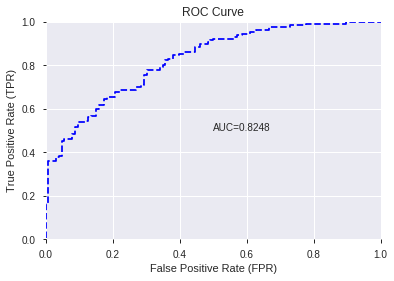

This function is available for GLM models only


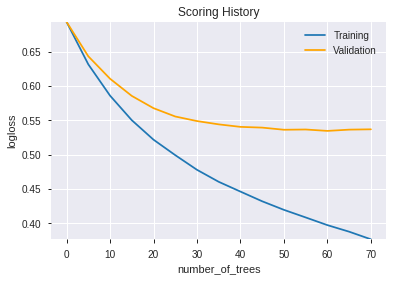

--2019-12-08 07:00:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.143.172
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.143.172|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel

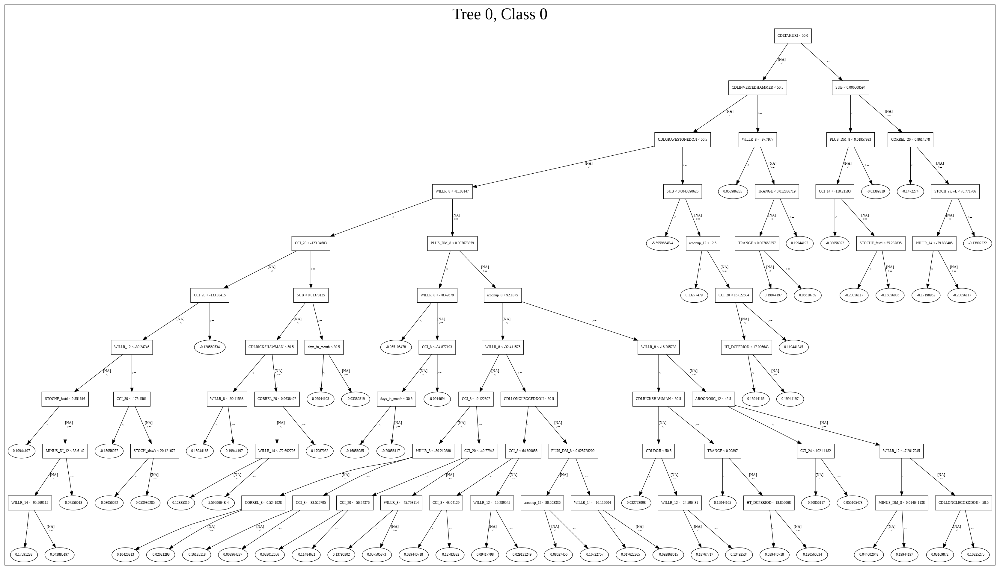

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20191208_065947',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20191208_065947',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_35_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_35_sid_9d28',
   'type

['CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'WILLR_12',
 'CCI_8',
 'WILLR_8',
 'ULTOSC',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_20',
 'CORREL_8',
 'HT_DCPERIOD',
 'WILLR_14',
 'CCI_14',
 'TRANGE',
 'SUB',
 'SAREXT',
 'MINUS_DI_8',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'aroonup_12',
 'CCI_30',
 'CCI_20',
 'PLUS_DM_12',
 'CCI_12',
 'DIV',
 'PLUS_DI_12',
 'PLUS_DI_8',
 'aroonup_8',
 'CCI_24',
 'PLUS_DM_14',
 'AROONOSC_12',
 'weekday_name',
 'PLUS_DI_14',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'STOCHF_fastd',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLBELTHOLD',
 'CDLHAMMER']

In [18]:
# All algos with top DeepLearning features
model_train(feature_name='DLF',model_algo=None,features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_070101_model_1,0.802564,0.536829,0.271123,0.427063,0.182383


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,3.254807e-01,1.000000e+00,2.225749e-02
1,CCI_8,3.049886e-01,9.370406e-01,2.085617e-02
2,STOCHF_fastk,3.027489e-01,9.301593e-01,2.070301e-02
3,MINUS_DI_8,2.373893e-01,7.293497e-01,1.623349e-02
4,CDLDRAGONFLYDOJI,2.363048e-01,7.260178e-01,1.615933e-02
...,...,...,...,...
933,BBANDS_lowerband_14_3_2,5.745783e-05,1.765322e-04,3.929163e-06
934,BBANDS_upperband_30_5_2,5.575671e-05,1.713057e-04,3.812835e-06
935,BBANDS_lowerband_20_3_4,3.281011e-05,1.008051e-04,2.243668e-06
936,BBANDS_middleband_12_3_5,3.022297e-05,9.285641e-05,2.066750e-06


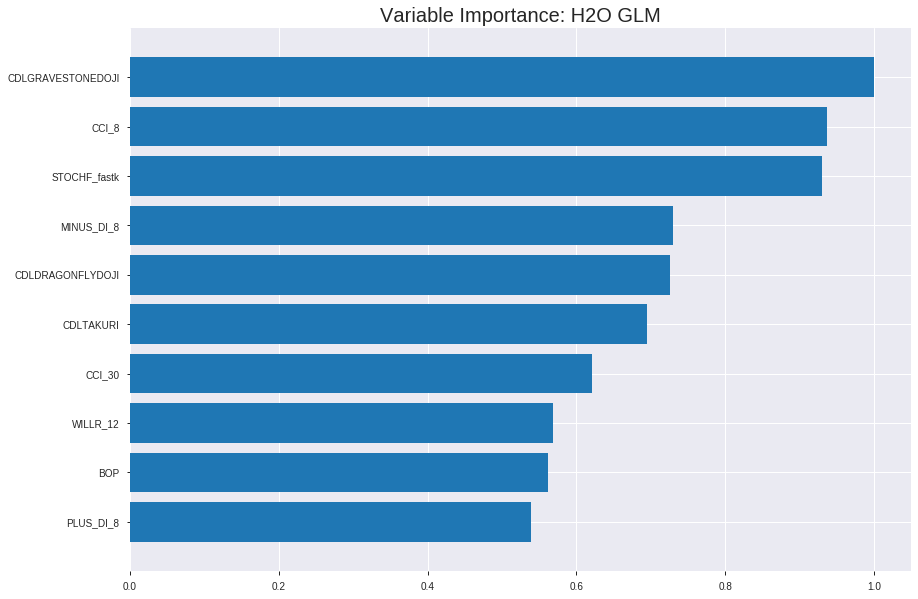

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_070101_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1759333314427463
RMSE: 0.4194440742730147
LogLoss: 0.5242435073742095
Null degrees of freedom: 1786
Residual degrees of freedom: 848
Null deviance: 2477.294033375749
Residual deviance: 1873.646295355425
AIC: 3751.646295355425
AUC: 0.8197732533670034
pr_auc: 0.8178097197766612
Gini: 0.6395465067340067
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4036901194497672: 


,0,1,Error,Rate
0,471.0,420.0,0.4714,(420.0/891.0)
1,94.0,802.0,0.1049,(94.0/896.0)
Total,565.0,1222.0,0.2876,(514.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4036901,0.7573182,256.0
max f2,0.3245143,0.8677851,293.0
max f0point5,0.5425417,0.7459677,180.0
max accuracy,0.5241303,0.7358702,190.0
max precision,0.9925594,1.0,0.0
max recall,0.0463974,1.0,389.0
max specificity,0.9925594,1.0,0.0
max absolute_mcc,0.5241303,0.4725592,190.0
max min_per_class_accuracy,0.5104646,0.7299107,198.0
max mean_per_class_accuracy,0.5241303,0.7359464,190.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9542204,1.9944196,1.9944196,1.0,0.9675077,1.0,0.9675077,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9340423,1.9944196,1.9944196,1.0,0.9412443,1.0,0.9543760,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9218982,1.8836186,1.9574859,0.9444444,0.9278577,0.9814815,0.9455366,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9027064,1.7728175,1.9113188,0.8888889,0.9115794,0.9583333,0.9370473,0.0178571,0.0770089,77.2817460,91.1318824
,5,0.0503637,0.8910255,1.9944196,1.9279390,1.0,0.8976230,0.9666667,0.9291624,0.0200893,0.0970982,99.4419643,92.7938988
,6,0.1001679,0.8356779,1.7927368,1.8607155,0.8988764,0.8634591,0.9329609,0.8964943,0.0892857,0.1863839,79.2736758,86.0715533
,7,0.1499720,0.7560655,1.7479183,1.8232568,0.8764045,0.7930496,0.9141791,0.8621414,0.0870536,0.2734375,74.7918339,82.3256763
,8,0.2003358,0.6923615,1.7284970,1.7994345,0.8666667,0.7261557,0.9022346,0.8279550,0.0870536,0.3604911,72.8497024,79.9434482
,9,0.2999440,0.6177940,1.3221434,1.6409311,0.6629213,0.6568595,0.8227612,0.7711360,0.1316964,0.4921875,32.2143359,64.0931087
,10,0.4001119,0.5574026,1.3147571,1.5592735,0.6592179,0.5870608,0.7818182,0.7250528,0.1316964,0.6238839,31.4757083,55.9273539




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18039485083171686
RMSE: 0.42472914996703115
LogLoss: 0.5393727958747068
Null degrees of freedom: 510
Residual degrees of freedom: -428
Null deviance: 708.5067427497436
Residual deviance: 551.2389973839503
AIC: 2429.2389973839504
AUC: 0.8085826046939715
pr_auc: 0.7904439327190375
Gini: 0.617165209387943
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3898427402121827: 


,0,1,Error,Rate
0,160.0,105.0,0.3962,(105.0/265.0)
1,35.0,211.0,0.1423,(35.0/246.0)
Total,195.0,316.0,0.274,(140.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3898427,0.7508897,244.0
max f2,0.1506036,0.8426573,345.0
max f0point5,0.5626170,0.7399577,144.0
max accuracy,0.4348878,0.7377691,218.0
max precision,0.9840021,1.0,0.0
max recall,0.0377398,1.0,389.0
max specificity,0.9840021,1.0,0.0
max absolute_mcc,0.4348878,0.4823277,218.0
max min_per_class_accuracy,0.4687746,0.7283019,198.0
max mean_per_class_accuracy,0.4348878,0.7400291,218.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9580557,1.7310298,1.7310298,0.8333333,0.9672043,0.8333333,0.9672043,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9421692,2.0772358,1.8883962,1.0,0.9509995,0.9090909,0.9598385,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9208915,2.0772358,1.9474085,1.0,0.9318929,0.9375,0.9511055,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9115117,2.0772358,1.9783198,1.0,0.9163722,0.9523810,0.9428357,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8969519,1.6617886,1.9174484,0.8,0.9045472,0.9230769,0.9354725,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.8430058,2.0772358,1.9973421,1.0,0.8670659,0.9615385,0.9012692,0.1056911,0.2032520,107.7235772,99.7342089
,7,0.1506849,0.7861756,1.6617886,1.8883962,0.8,0.8132776,0.9090909,0.8727005,0.0813008,0.2845528,66.1788618,88.8396157
,8,0.2015656,0.7204544,1.5179800,1.7948930,0.7307692,0.7597062,0.8640777,0.8441777,0.0772358,0.3617886,51.7979987,79.4893046
,9,0.3013699,0.6014097,1.5070142,1.6995565,0.7254902,0.6544459,0.8181818,0.7813444,0.1504065,0.5121951,50.7014188,69.9556541
,10,0.4011742,0.5143489,1.2626335,1.5908586,0.6078431,0.5536349,0.7658537,0.7246948,0.1260163,0.6382114,26.2633509,59.0858616



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:01:02,0.000 sec,2,.15E2,881,1.3638942,1.3637517
,2019-12-08 07:01:03,0.939 sec,4,.11E2,910,1.3566347,1.3563475
,2019-12-08 07:01:05,2.529 sec,6,.82E1,926,1.3474394,1.3468630
,2019-12-08 07:01:06,3.904 sec,8,.6E1,936,1.3359749,1.3348625
,2019-12-08 07:01:07,4.822 sec,10,.43E1,939,1.3220169,1.3200876
---,---,---,---,---,---,---,---
,2019-12-08 07:01:21,18.937 sec,42,.27E-1,939,1.0377488,1.0789424
,2019-12-08 07:01:22,19.928 sec,44,.2E-1,939,1.0280441,1.0806214
,2019-12-08 07:01:23,20.830 sec,46,.14E-1,939,1.0193541,1.0836831
,2019-12-08 07:01:24,21.695 sec,48,.1E-1,939,1.0115292,1.0875745



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73046875)

('F1', 0.7578947368421053)

('auc', 0.8025641025641026)

('logloss', 0.5368294965915109)

('mean_per_class_error', 0.27112332112332105)

('rmse', 0.4270627606296909)

('mse', 0.18238260151665267)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


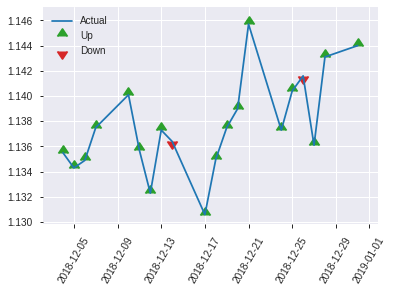


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18238260151665267
RMSE: 0.4270627606296909
LogLoss: 0.5368294965915109
Null degrees of freedom: 255
Residual degrees of freedom: -683
Null deviance: 354.87097666550244
Residual deviance: 274.8567022548536
AIC: 2152.8567022548536
AUC: 0.8025641025641026
pr_auc: 0.8082638076264894
Gini: 0.6051282051282052
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41836114553862896: 


,0,1,Error,Rate
0,79.0,47.0,0.373,(47.0/126.0)
1,22.0,108.0,0.1692,(22.0/130.0)
Total,101.0,155.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4183611,0.7578947,154.0
max f2,0.2577948,0.8683853,216.0
max f0point5,0.4959262,0.7258065,106.0
max accuracy,0.4183611,0.7304688,154.0
max precision,0.9550393,1.0,0.0
max recall,0.0628243,1.0,248.0
max specificity,0.9550393,1.0,0.0
max absolute_mcc,0.4183611,0.4682329,154.0
max min_per_class_accuracy,0.4621607,0.7076923,127.0
max mean_per_class_accuracy,0.4183611,0.7288767,154.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.71 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9464653,1.9692308,1.9692308,1.0,0.9530519,1.0,0.9530519,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9329684,1.9692308,1.9692308,1.0,0.9387026,1.0,0.9458772,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9080030,1.9692308,1.9692308,1.0,0.9114042,1.0,0.9372590,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8906787,1.9692308,1.9692308,1.0,0.8983265,1.0,0.9266410,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8846165,1.9692308,1.9692308,1.0,0.8873948,1.0,0.9206032,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8095800,1.9692308,1.9692308,1.0,0.8482798,1.0,0.8844415,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7310833,1.6662722,1.8682446,0.8461538,0.7735981,0.9487179,0.8474937,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.6692943,1.3633136,1.7420118,0.6923077,0.6916751,0.8846154,0.8085390,0.0692308,0.3538462,36.3313609,74.2011834
,9,0.3007812,0.5642659,1.2603077,1.5856144,0.64,0.6127350,0.8051948,0.7449663,0.1230769,0.4769231,26.0307692,58.5614386
,10,0.4023438,0.5038042,1.2118343,1.4912621,0.6153846,0.5414979,0.7572816,0.6936053,0.1230769,0.6,21.1834320,49.1262136


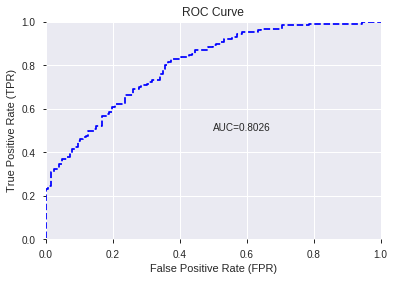

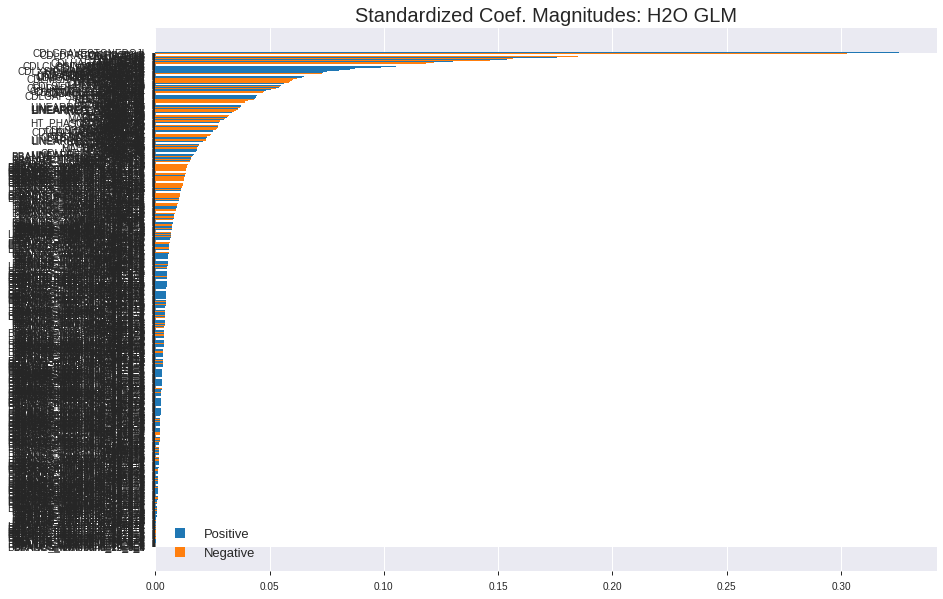

'log_likelihood'
--2019-12-08 07:01:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.47.28
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.47.28|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


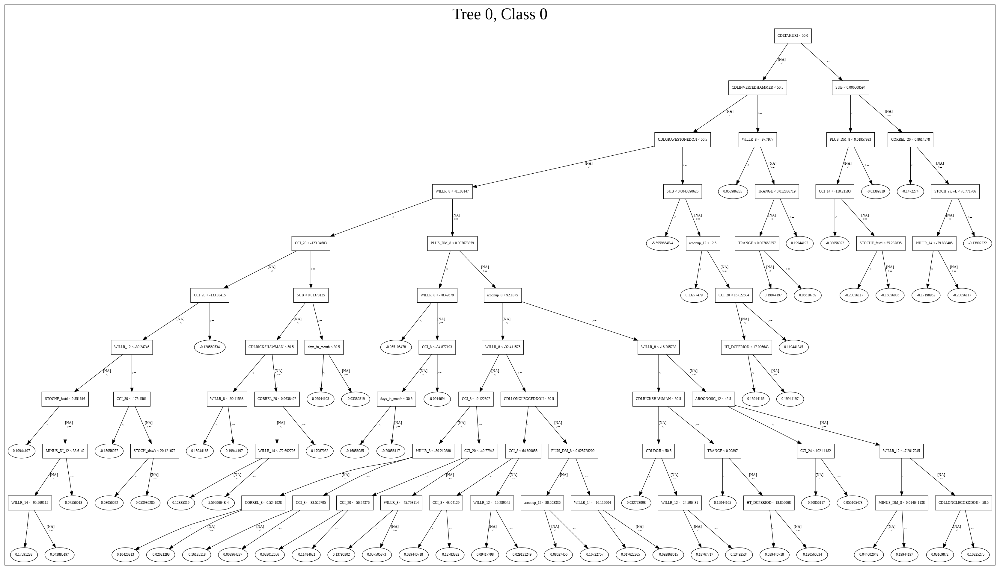

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_070101_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_070101_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_40_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_40_s

['CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CCI_30',
 'WILLR_12',
 'BOP',
 'PLUS_DI_8',
 'DIV',
 'WILLR_14',
 'CCI_14',
 'CCI_24',
 'CCI_20',
 'ULTOSC',
 'WILLR_8',
 'CCI_12',
 'aroonup_12',
 'CDLHARAMICROSS',
 'TAN',
 'WILLR_24',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_20',
 'CDLHANGINGMAN',
 'CORREL_30',
 'PLUS_DI_12',
 'CDLSPINNINGTOP',
 'BETA_24',
 'BETA_8',
 'SUB',
 'AROONOSC_12',
 'CDLXSIDEGAP3METHODS',
 'HT_PHASOR_inphase',
 'MINUS_DM_30',
 'MINUS_DI_14',
 'PLUS_DI_14',
 'CDLADVANCEBLOCK',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'SAREXT',
 'days_in_month',
 'CDL3LINESTRIKE',
 'STOCH_slowd',
 'CDLCOUNTERATTACK',
 'ADXR_8',
 'High',
 'CDLMORNINGDOJISTAR']

938

['CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CCI_30',
 'WILLR_12',
 'BOP',
 'PLUS_DI_8',
 'DIV',
 'WILLR_14',
 'CCI_14',
 'CCI_24',
 'CCI_20',
 'ULTOSC',
 'WILLR_8',
 'CCI_12',
 'aroonup_12',
 'CDLHARAMICROSS',
 'TAN',
 'WILLR_24',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_20',
 'CDLHANGINGMAN',
 'CORREL_30',
 'PLUS_DI_12',
 'CDLSPINNINGTOP',
 'BETA_24',
 'BETA_8',
 'SUB',
 'AROONOSC_12',
 'CDLXSIDEGAP3METHODS',
 'HT_PHASOR_inphase',
 'MINUS_DM_30',
 'MINUS_DI_14',
 'PLUS_DI_14',
 'CDLADVANCEBLOCK',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'SAREXT',
 'days_in_month',
 'CDL3LINESTRIKE',
 'STOCH_slowd',
 'CDLCOUNTERATTACK',
 'ADXR_8',
 'High',
 'CDLMORNINGDOJISTAR']

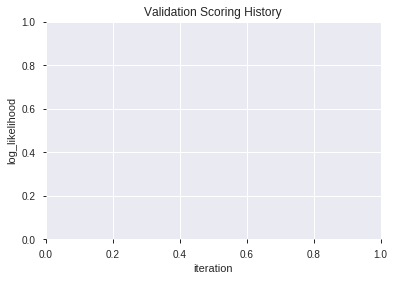

In [19]:
# GLM
features_list = model_train(feature_name='All',model_algo="GLM")
display(features_list[:model_selected_features])
display(len(features_list),features_list[:model_selected_features])

In [20]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [21]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [22]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

In [23]:
# DRF with top GLM features
model_train(feature_name='GLMF',model_algo="DRF",features_list = features_list[:model_selected_features])

[]

In [24]:
# GBM with top GLM features
model_train(feature_name='GLMF',model_algo="GBM",features_list = features_list[:model_selected_features])

[]

In [25]:
# StackedEnsemble with top GLM features
model_train(feature_name='GLMF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

[]

In [26]:
# All algos with top GLM features
model_train(feature_name='GLMF',model_algo=None,features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_070241_model_4,0.818132,0.528774,0.295788,0.420557,0.176868
1,XGBoost_2_AutoML_20191208_070241,0.813187,0.527094,0.300366,0.420799,0.177072
2,XGBoost_grid_1_AutoML_20191208_070241_model_2,0.810745,0.529132,0.324298,0.422001,0.178085
3,XGBoost_1_AutoML_20191208_070241,0.809829,0.527070,0.300000,0.421593,0.177741
4,XGBoost_grid_1_AutoML_20191208_070241_model_7,0.805922,0.531304,0.312271,0.423725,0.179543
5,XGBoost_grid_1_AutoML_20191208_070241_model_3,0.805250,0.529064,0.328144,0.423580,0.179420
6,XGBoost_grid_1_AutoML_20191208_070241_model_6,0.803480,0.532831,0.283883,0.424598,0.180283
7,XGBoost_grid_1_AutoML_20191208_070241_model_1,0.802259,0.534738,0.286996,0.425071,0.180685
8,XGBoost_3_AutoML_20191208_070241,0.800488,0.534823,0.275214,0.425696,0.181217
9,XGBoost_grid_1_AutoML_20191208_070241_model_5,0.798535,0.537309,0.308181,0.427645,0.182880


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,692.503723,1.000000,0.107985
1,CDLDRAGONFLYDOJI,623.510925,0.900372,0.097227
2,CDLTAKURI,543.455444,0.784769,0.084743
3,STOCHF_fastk,534.583130,0.771957,0.083360
4,CCI_8,272.336090,0.393263,0.042467
...,...,...,...,...
144,BBANDS_lowerband_20_3_3,5.117916,0.007390,0.000798
145,ADXR_12,4.975081,0.007184,0.000776
146,NATR_12,4.683388,0.006763,0.000730
147,TRIX_12,4.348453,0.006279,0.000678


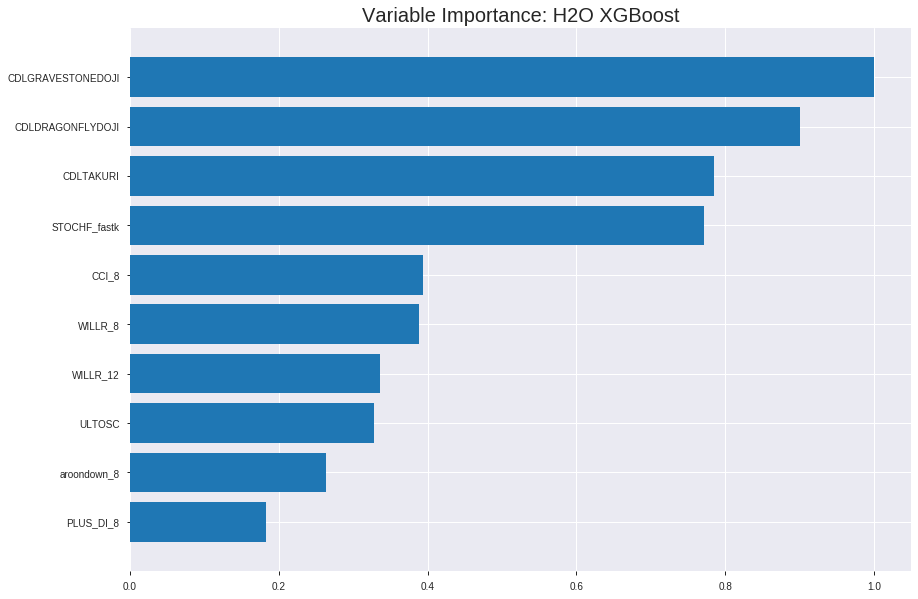

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_070241_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1577027192342065
RMSE: 0.3971180167585028
LogLoss: 0.48883317880707544
Mean Per-Class Error: 0.1959732493586661
AUC: 0.8790434102934103
pr_auc: 0.8703922192403281
Gini: 0.7580868205868205
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47238842844963075: 


,0,1,Error,Rate
0,666.0,225.0,0.2525,(225.0/891.0)
1,126.0,770.0,0.1406,(126.0/896.0)
Total,792.0,995.0,0.1964,(351.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4723884,0.8143839,214.0
max f2,0.3695400,0.8828939,273.0
max f0point5,0.5400168,0.8081792,176.0
max accuracy,0.4814380,0.8041410,209.0
max precision,0.9118782,1.0,0.0
max recall,0.1145604,1.0,379.0
max specificity,0.9118782,1.0,0.0
max absolute_mcc,0.4761527,0.6110119,212.0
max min_per_class_accuracy,0.5057111,0.7968575,195.0
max mean_per_class_accuracy,0.4814380,0.8040268,209.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8853398,1.9944196,1.9944196,1.0,0.8951016,1.0,0.8951016,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8733008,1.9944196,1.9944196,1.0,0.8811038,1.0,0.8881027,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8643793,1.9944196,1.9944196,1.0,0.8689134,1.0,0.8817063,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8576865,1.7728175,1.9390191,0.8888889,0.8611591,0.9722222,0.8765695,0.0178571,0.078125,77.2817460,93.9019097
,5,0.0503637,0.8501295,1.8836186,1.9279390,0.9444444,0.8540650,0.9666667,0.8720686,0.0189732,0.0970982,88.3618552,92.7938988
,6,0.1001679,0.7941800,1.8599644,1.8941416,0.9325843,0.8231898,0.9497207,0.8477657,0.0926339,0.1897321,85.9964386,89.4141560
,7,0.1499720,0.7445992,1.7255091,1.8381405,0.8651685,0.7720727,0.9216418,0.8226289,0.0859375,0.2756696,72.5509129,83.8140492
,8,0.2003358,0.6992287,1.8614583,1.8440025,0.9333333,0.7227493,0.9245810,0.7975195,0.09375,0.3694196,86.1458333,84.4002519
,9,0.2999440,0.6303935,1.6470769,1.7786056,0.8258427,0.6619780,0.8917910,0.7525076,0.1640625,0.5334821,64.7076896,77.8605577
,10,0.4001119,0.5725153,1.3927511,1.6820071,0.6983240,0.6025277,0.8433566,0.7149602,0.1395089,0.6729911,39.2751147,68.2007055




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.18014760203598162
RMSE: 0.42443798373376246
LogLoss: 0.5384457869058866
Mean Per-Class Error: 0.26230250038349445
AUC: 0.811512501917472
pr_auc: 0.7914861986978001
Gini: 0.6230250038349441
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48017042875289917: 


,0,1,Error,Rate
0,179.0,86.0,0.3245,(86.0/265.0)
1,51.0,195.0,0.2073,(51.0/246.0)
Total,230.0,281.0,0.2681,(137.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4801704,0.7400380,218.0
max f2,0.3179181,0.8417997,306.0
max f0point5,0.5961027,0.7504970,149.0
max accuracy,0.5961027,0.7377691,149.0
max precision,0.8954056,1.0,0.0
max recall,0.1258378,1.0,378.0
max specificity,0.8954056,1.0,0.0
max absolute_mcc,0.5961027,0.4824515,149.0
max min_per_class_accuracy,0.5212852,0.7357724,193.0
max mean_per_class_accuracy,0.5212852,0.7376975,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.48 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8753452,2.0772358,2.0772358,1.0,0.8843350,1.0,0.8843350,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8713865,1.6617886,1.8883962,0.8,0.8723677,0.9090909,0.8788953,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.8629833,1.2463415,1.6877541,0.6,0.8678212,0.8125,0.8754347,0.0121951,0.0528455,24.6341463,68.7754065
,4,0.0410959,0.8584574,2.0772358,1.7804878,1.0,0.8610972,0.8571429,0.8720210,0.0203252,0.0731707,107.7235772,78.0487805
,5,0.0508806,0.8510272,2.0772358,1.8375547,1.0,0.8538602,0.8846154,0.8685285,0.0203252,0.0934959,107.7235772,83.7554722
,6,0.1017613,0.8183578,1.9973421,1.9174484,0.9615385,0.8351219,0.9230769,0.8518252,0.1016260,0.1951220,99.7342089,91.7448405
,7,0.1506849,0.7820896,1.8279675,1.8883962,0.88,0.7994776,0.9090909,0.8348292,0.0894309,0.2845528,82.7967480,88.8396157
,8,0.2015656,0.7354894,1.4380863,1.7747257,0.6923077,0.7566595,0.8543689,0.8150971,0.0731707,0.3577236,43.8086304,77.4725708
,9,0.3013699,0.6378383,1.4662841,1.6725795,0.7058824,0.6850399,0.8051948,0.7720262,0.1463415,0.5040650,46.6284075,67.2579453
,10,0.4011742,0.5792450,1.3848238,1.6009915,0.6666667,0.6053751,0.7707317,0.7305666,0.1382114,0.6422764,38.4823848,60.0991473



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:02:58,7.484 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 07:02:59,7.943 sec,5.0,0.4771836,0.6481801,0.8002508,0.5953737,1.7717868,0.3060996,0.4752473,0.6444228,0.7896610,0.4908882,1.8598506,0.3228963
,2019-12-08 07:02:59,8.081 sec,10.0,0.4632449,0.6206401,0.8065601,0.5997082,1.7717868,0.2960269,0.4615016,0.6171372,0.7853735,0.4876696,1.8598506,0.3033268
,2019-12-08 07:02:59,8.216 sec,15.0,0.4526633,0.5993323,0.8182457,0.7794791,1.9231904,0.2607722,0.4520183,0.5976535,0.7921844,0.5633009,1.9432206,0.3307241
,2019-12-08 07:02:59,8.379 sec,20.0,0.4438204,0.5813068,0.8253699,0.8097401,1.8921417,0.2618914,0.4443270,0.5814635,0.7983663,0.7367923,1.9288618,0.3052838
,2019-12-08 07:03:00,8.554 sec,25.0,0.4369127,0.5671106,0.8307761,0.8184692,1.9944196,0.2490207,0.4388215,0.5697117,0.8030910,0.7554732,2.0772358,0.3072407
,2019-12-08 07:03:00,8.714 sec,30.0,0.4311535,0.5554147,0.8375308,0.8233241,1.9944196,0.2462227,0.4349583,0.5612656,0.8028685,0.7750822,2.0772358,0.2994129
,2019-12-08 07:03:00,8.852 sec,35.0,0.4259075,0.5449948,0.8431876,0.8310735,1.9944196,0.2367096,0.4325459,0.5561060,0.8056450,0.7841659,2.0772358,0.3150685
,2019-12-08 07:03:00,8.998 sec,40.0,0.4210104,0.5354539,0.8493498,0.8375059,1.9944196,0.2305540,0.4311363,0.5528839,0.8074321,0.7854453,1.7310298,0.3111546
,2019-12-08 07:03:00,9.141 sec,45.0,0.4164553,0.5262962,0.8532617,0.8412474,1.9944196,0.2238388,0.4293732,0.5489571,0.8090428,0.7865564,1.7310298,0.2641879


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,692.5037231,1.0,0.1079853
CDLDRAGONFLYDOJI,623.5109253,0.9003719,0.0972269
CDLTAKURI,543.4554443,0.7847690,0.0847435
STOCHF_fastk,534.5831299,0.7719570,0.0833600
CCI_8,272.3360901,0.3932630,0.0424666
---,---,---,---
BBANDS_lowerband_20_3_3,5.1179161,0.0073905,0.0007981
ADXR_12,4.9750814,0.0071842,0.0007758
NATR_12,4.6833878,0.0067630,0.0007303
TRIX_12,4.3484526,0.0062793,0.0006781



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7421875)

('F1', 0.7540983606557377)

('auc', 0.8181318681318682)

('logloss', 0.5287736440985128)

('mean_per_class_error', 0.25799755799755797)

('rmse', 0.4205566942703562)

('mse', 0.17686793309560986)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


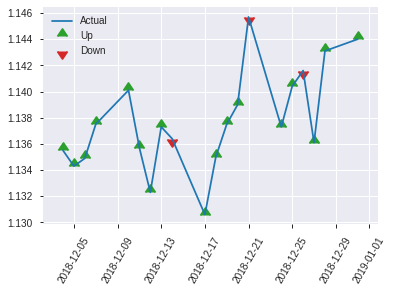


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17686793309560986
RMSE: 0.4205566942703562
LogLoss: 0.5287736440985128
Mean Per-Class Error: 0.25799755799755797
AUC: 0.8181318681318682
pr_auc: 0.8331444541909977
Gini: 0.6362637362637364
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3848046660423279: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,81.0,175.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3848047,0.7540984,174.0
max f2,0.2693501,0.8630137,209.0
max f0point5,0.5580564,0.7656827,102.0
max accuracy,0.5030313,0.7421875,131.0
max precision,0.8930295,1.0,0.0
max recall,0.1148559,1.0,246.0
max specificity,0.8930295,1.0,0.0
max absolute_mcc,0.5580564,0.4890922,102.0
max min_per_class_accuracy,0.5076250,0.7380952,128.0
max mean_per_class_accuracy,0.5030313,0.7420024,131.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8828881,1.9692308,1.9692308,1.0,0.8900497,1.0,0.8900497,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8728056,1.9692308,1.9692308,1.0,0.8753261,1.0,0.8826879,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8586312,1.9692308,1.9692308,1.0,0.8680048,1.0,0.8790172,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8521426,1.9692308,1.9692308,1.0,0.8537177,1.0,0.8721173,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8425888,1.9692308,1.9692308,1.0,0.8500977,1.0,0.8687297,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8202561,1.9692308,1.9692308,1.0,0.8290013,1.0,0.8488655,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7614207,1.9692308,1.9692308,1.0,0.7866981,1.0,0.8281430,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7026529,1.2118343,1.7798817,0.6153846,0.7298044,0.9038462,0.8035584,0.0615385,0.3615385,21.1834320,77.9881657
,9,0.3007812,0.6217188,1.4966154,1.6879121,0.76,0.6530217,0.8571429,0.7546828,0.1461538,0.5076923,49.6615385,68.7912088
,10,0.4023438,0.5580564,1.2875740,1.5868559,0.6538462,0.5895551,0.8058252,0.7130001,0.1307692,0.6384615,28.7573964,58.6855863


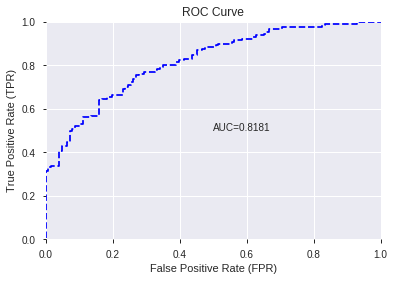

This function is available for GLM models only


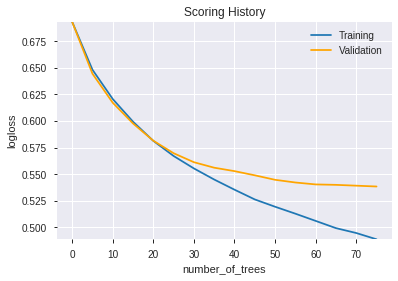

--2019-12-08 07:03:19--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.108.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.108.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

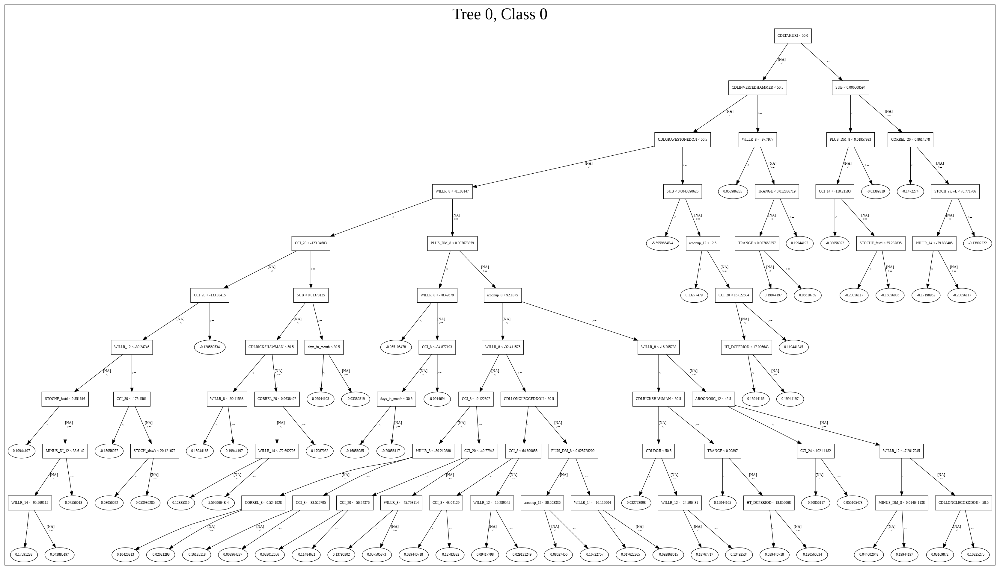

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_070241_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_070241_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_45_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

149

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'aroondown_8',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'aroonup_12',
 'WILLR_14',
 'CCI_14',
 'LINEARREG_ANGLE_8',
 'CCI_20',
 'CCI_24',
 'HT_DCPERIOD',
 'PLUS_DM_8',
 'CORREL_20',
 'CMO_8',
 'STOCH_slowk',
 'ADX_8',
 'BETA_8',
 'STDDEV_12',
 'dayofyear',
 'CCI_12',
 'HT_PHASOR_quadrature',
 'MINUS_DM_8',
 'STDDEV_24',
 'BBANDS_upperband_30_2_5',
 'ATR_24',
 'days_in_month',
 'aroonup_8',
 'BOP',
 'DIV',
 'STDDEV_8',
 'PLUS_DI_14',
 'TRANGE',
 'KAMA_14',
 'BETA_20',
 'STOCHRSI_fastk',
 'aroondown_12',
 'BETA_30',
 'NATR_24',
 'TRIX_14',
 'MACDEXT_hist',
 'STOCH_slowd',
 'CORREL_30',
 'PLUS_DI_24']

In [27]:
# XGBoost
features_list = model_train(feature_name='All',model_algo="XGBoost")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_070415_model_9,0.800977,0.533614,0.279548,0.425846,0.181345
1,DeepLearning_grid_1_AutoML_20191208_070415_model_8,0.791514,0.543301,0.270635,0.432752,0.187275
2,DeepLearning_grid_1_AutoML_20191208_070415_model_3,0.787424,0.540006,0.319841,0.429649,0.184598
3,DeepLearning_grid_1_AutoML_20191208_070415_model_6,0.782357,0.544620,0.303236,0.433907,0.188275
4,DeepLearning_1_AutoML_20191208_070415,0.776618,0.558763,0.319231,0.440702,0.194219
5,DeepLearning_grid_1_AutoML_20191208_070415_model_2,0.769048,0.595986,0.380708,0.452650,0.204892
6,DeepLearning_grid_1_AutoML_20191208_070415_model_5,0.764652,0.560861,0.308059,0.440881,0.194376
7,DeepLearning_grid_1_AutoML_20191208_070415_model_4,0.743346,0.714118,0.340415,0.479692,0.230105
8,DeepLearning_grid_1_AutoML_20191208_070415_model_1,0.743284,0.725636,0.328632,0.484749,0.234981
9,DeepLearning_grid_1_AutoML_20191208_070415_model_7,0.739011,0.661284,0.327778,0.480964,0.231327


,variable,relative_importance,scaled_importance,percentage
0,DIV,1.000000,1.000000,0.048054
1,TRANGE,0.846670,0.846670,0.040686
2,CDLGRAVESTONEDOJI,0.757882,0.757882,0.036419
3,CDLDRAGONFLYDOJI,0.604017,0.604017,0.029026
4,CDLTAKURI,0.563857,0.563857,0.027096
5,ULTOSC,0.525589,0.525589,0.025257
6,BETA_8,0.487724,0.487724,0.023437
7,dayofyear,0.481545,0.481545,0.023140
8,MINUS_DM_8,0.478725,0.478725,0.023005
9,CORREL_20,0.462011,0.462011,0.022202


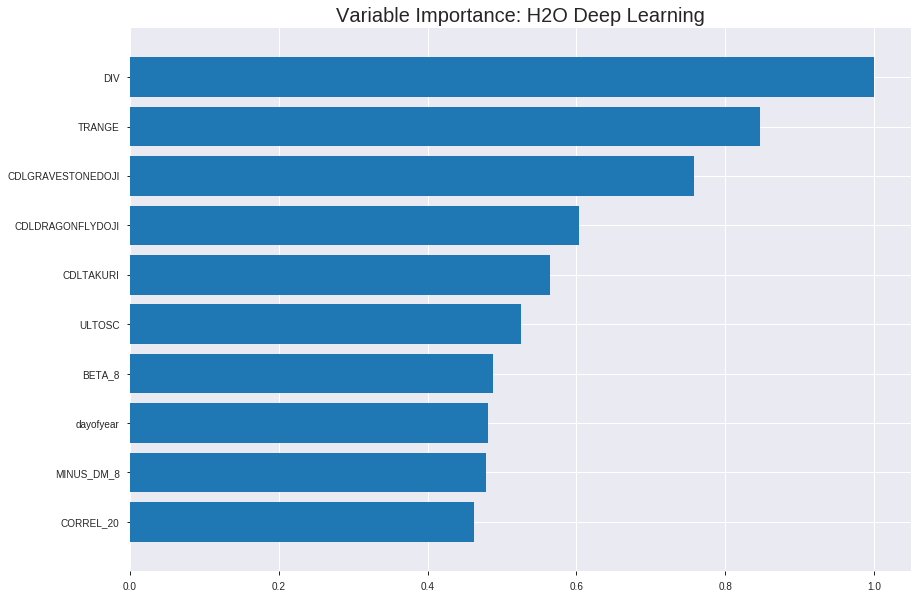

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_070415_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.15453235150748082
RMSE: 0.3931060308714187
LogLoss: 0.47038273438079237
Mean Per-Class Error: 0.22219153338945008
AUC: 0.8641687209395543
pr_auc: 0.8589068573365062
Gini: 0.7283374418791086
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4343295659721577: 


,0,1,Error,Rate
0,525.0,366.0,0.4108,(366.0/891.0)
1,72.0,824.0,0.0804,(72.0/896.0)
Total,597.0,1190.0,0.2451,(438.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4343296,0.7900288,240.0
max f2,0.3230773,0.8771040,286.0
max f0point5,0.5736154,0.7992021,165.0
max accuracy,0.5084575,0.7778400,200.0
max precision,0.9968734,1.0,0.0
max recall,0.0031731,1.0,399.0
max specificity,0.9968734,1.0,0.0
max absolute_mcc,0.5520817,0.5600509,175.0
max min_per_class_accuracy,0.5117948,0.7755331,198.0
max mean_per_class_accuracy,0.5084575,0.7778085,200.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 51.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9881823,1.9944196,1.9944196,1.0,0.9933614,1.0,0.9933614,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9796961,1.9944196,1.9944196,1.0,0.9850250,1.0,0.9891932,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9697650,1.9944196,1.9944196,1.0,0.9754532,1.0,0.9846132,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9613841,1.9944196,1.9944196,1.0,0.9663687,1.0,0.9800521,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9522383,1.9944196,1.9944196,1.0,0.9574143,1.0,0.9755245,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8912047,1.8823736,1.9387096,0.9438202,0.9230800,0.9720670,0.9494488,0.09375,0.1941964,88.2373596,93.8709597
,7,0.1499720,0.8323692,1.7927368,1.8902335,0.8988764,0.8599569,0.9477612,0.9197295,0.0892857,0.2834821,79.2736758,89.0233542
,8,0.2003358,0.7735999,1.6620164,1.8328605,0.8333333,0.8034521,0.9189944,0.8904977,0.0837054,0.3671875,66.2016369,83.2860510
,9,0.2999440,0.6568651,1.5798493,1.7488381,0.7921348,0.7144029,0.8768657,0.8320185,0.1573661,0.5245536,57.9849268,74.8838120
,10,0.4001119,0.5737040,1.4484612,1.6736389,0.7262570,0.6167311,0.8391608,0.7781214,0.1450893,0.6696429,44.8461193,67.3638861




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1803202273960286
RMSE: 0.424641292617697
LogLoss: 0.5468232411576066
Mean Per-Class Error: 0.24618806565424145
AUC: 0.8099708544255254
pr_auc: 0.7807051207818309
Gini: 0.6199417088510508
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4170287613394235: 


,0,1,Error,Rate
0,152.0,113.0,0.4264,(113.0/265.0)
1,29.0,217.0,0.1179,(29.0/246.0)
Total,181.0,330.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4170288,0.7534722,252.0
max f2,0.1166788,0.8379694,352.0
max f0point5,0.6503631,0.7516340,134.0
max accuracy,0.5200557,0.7534247,200.0
max precision,0.9950974,1.0,0.0
max recall,0.0427749,1.0,388.0
max specificity,0.9950974,1.0,0.0
max absolute_mcc,0.5200557,0.5072738,200.0
max min_per_class_accuracy,0.5328450,0.7479675,194.0
max mean_per_class_accuracy,0.5200557,0.7538119,200.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9826428,2.0772358,2.0772358,1.0,0.9891511,1.0,0.9891511,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9762149,1.6617886,1.8883962,0.8,0.9788053,0.9090909,0.9844485,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.9701349,1.6617886,1.8175813,0.8,0.9729746,0.875,0.9808629,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.9632271,2.0772358,1.8794038,1.0,0.9657282,0.9047619,0.9772594,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.9541380,1.2463415,1.7576610,0.6,0.9593508,0.8461538,0.9738154,0.0121951,0.0894309,24.6341463,75.7661038
,6,0.1017613,0.9039878,1.7576610,1.7576610,0.8461538,0.9290360,0.8461538,0.9514257,0.0894309,0.1788618,75.7661038,75.7661038
,7,0.1506849,0.8337079,1.9941463,1.8344420,0.96,0.8642406,0.8831169,0.9231189,0.0975610,0.2764228,99.4146341,83.4441981
,8,0.2015656,0.7642642,1.8375547,1.8352277,0.8846154,0.8033325,0.8834951,0.8928815,0.0934959,0.3699187,83.7554722,83.5227721
,9,0.3013699,0.6706528,1.3440937,1.6725795,0.6470588,0.7134573,0.8051948,0.8334618,0.1341463,0.5040650,34.4093735,67.2579453
,10,0.4011742,0.5946934,1.2626335,1.5705929,0.6078431,0.6314396,0.7560976,0.7832026,0.1260163,0.6300813,26.2633509,57.0592901



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:10:58,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:11:02,2 min 12.488 sec,1483 obs/sec,3.7459429,1,6694.0,0.4533629,0.5912336,0.1778420,0.7386126,0.7422715,1.9944196,0.3564633,0.4681302,0.6246280,0.1222029,0.7646341,0.7535225,2.0772358,0.3561644
,2019-12-08 07:11:13,2 min 23.255 sec,1845 obs/sec,14.9585898,4,26731.0,0.4291767,0.5461247,0.2632236,0.7976184,0.7875485,1.8836186,0.2932289,0.4323354,0.5547775,0.2513093,0.7976070,0.7708458,1.7310298,0.2661448
,2019-12-08 07:11:21,2 min 31.374 sec,2144 obs/sec,26.1740347,7,46773.0,0.4229039,0.5355091,0.2846035,0.8092745,0.7999119,1.8836186,0.2954673,0.4321306,0.5582112,0.2520184,0.7989569,0.7726429,1.7310298,0.2681018
,2019-12-08 07:11:31,2 min 41.234 sec,2382 obs/sec,41.1415781,11,73520.0,0.4126111,0.5162841,0.3190031,0.8301905,0.8247667,1.9944196,0.2546167,0.4306406,0.5658942,0.2571678,0.8051158,0.7820172,2.0772358,0.2778865
,2019-12-08 07:11:41,2 min 50.888 sec,2523 obs/sec,56.0727476,15,100202.0,0.4175175,0.5231077,0.3027112,0.8355492,0.8294067,1.9944196,0.2686066,0.4266190,0.5503226,0.2709771,0.8065117,0.7748338,2.0772358,0.2622309
,2019-12-08 07:11:50,2 min 59.972 sec,2644 obs/sec,71.0397314,19,126948.0,0.4026262,0.4943067,0.3515636,0.8452300,0.8437504,1.9944196,0.2579743,0.4364211,0.5922179,0.2370919,0.7947615,0.7711133,2.0772358,0.2857143
,2019-12-08 07:11:59,3 min 8.855 sec,2738 obs/sec,85.9574706,23,153606.0,0.3931060,0.4703827,0.3818658,0.8641687,0.8589069,1.9944196,0.2451035,0.4246413,0.5468232,0.2777205,0.8099709,0.7807051,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
DIV,1.0,1.0,0.0480543
TRANGE,0.8466700,0.8466700,0.0406861
CDLGRAVESTONEDOJI,0.7578823,0.7578823,0.0364195
CDLDRAGONFLYDOJI,0.6040169,0.6040169,0.0290256
CDLTAKURI,0.5638573,0.5638573,0.0270958
---,---,---,---
CCI_14,0.3051776,0.3051776,0.0146651
KAMA_14,0.2915960,0.2915960,0.0140124
STOCH_slowd,0.2899299,0.2899299,0.0139324
CCI_24,0.2683409,0.2683409,0.0128949



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.7593220338983052)

('auc', 0.8009768009768009)

('logloss', 0.5336136361619002)

('mean_per_class_error', 0.2539072039072039)

('rmse', 0.42584586707173766)

('mse', 0.18134470250208004)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


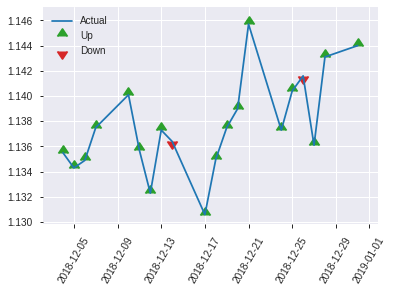


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.18134470250208004
RMSE: 0.42584586707173766
LogLoss: 0.5336136361619002
Mean Per-Class Error: 0.2539072039072039
AUC: 0.8009768009768009
pr_auc: 0.814107348245602
Gini: 0.6019536019536018
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37217047434413314: 


,0,1,Error,Rate
0,73.0,53.0,0.4206,(53.0/126.0)
1,18.0,112.0,0.1385,(18.0/130.0)
Total,91.0,165.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3721705,0.7593220,164.0
max f2,0.2182756,0.8594816,212.0
max f0point5,0.4839310,0.7507740,128.0
max accuracy,0.4839310,0.7460938,128.0
max precision,0.9886473,1.0,0.0
max recall,0.0325597,1.0,248.0
max specificity,0.9886473,1.0,0.0
max absolute_mcc,0.4839310,0.4921405,128.0
max min_per_class_accuracy,0.4839310,0.7460317,128.0
max mean_per_class_accuracy,0.4839310,0.7460928,128.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9774679,1.9692308,1.9692308,1.0,0.9849227,1.0,0.9849227,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9709675,1.9692308,1.9692308,1.0,0.9748969,1.0,0.9799098,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9526865,1.9692308,1.9692308,1.0,0.9616499,1.0,0.9753449,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9444323,1.9692308,1.9692308,1.0,0.9481111,1.0,0.9679175,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9340196,1.9692308,1.9692308,1.0,0.9399527,1.0,0.9636152,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8560258,1.9692308,1.9692308,1.0,0.8925860,1.0,0.9281006,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7755281,1.8177515,1.9187377,0.9230769,0.8278919,0.9743590,0.8946977,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7103208,1.5147929,1.8177515,0.7692308,0.7412851,0.9230769,0.8563445,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6225923,0.9452308,1.5344655,0.48,0.6686339,0.7792208,0.7953995,0.0923077,0.4615385,-5.4769231,53.4465534
,10,0.4023438,0.5237341,1.2118343,1.4530246,0.6153846,0.5698226,0.7378641,0.7384578,0.1230769,0.5846154,21.1834320,45.3024645


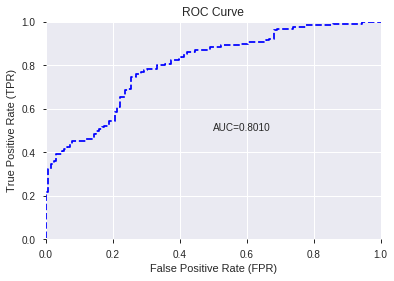

This function is available for GLM models only


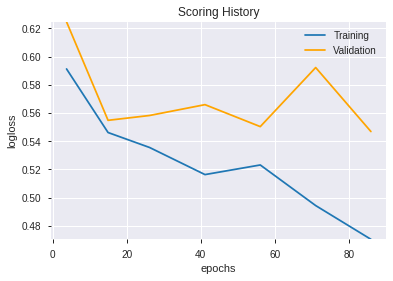

--2019-12-08 07:12:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.94.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.94.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


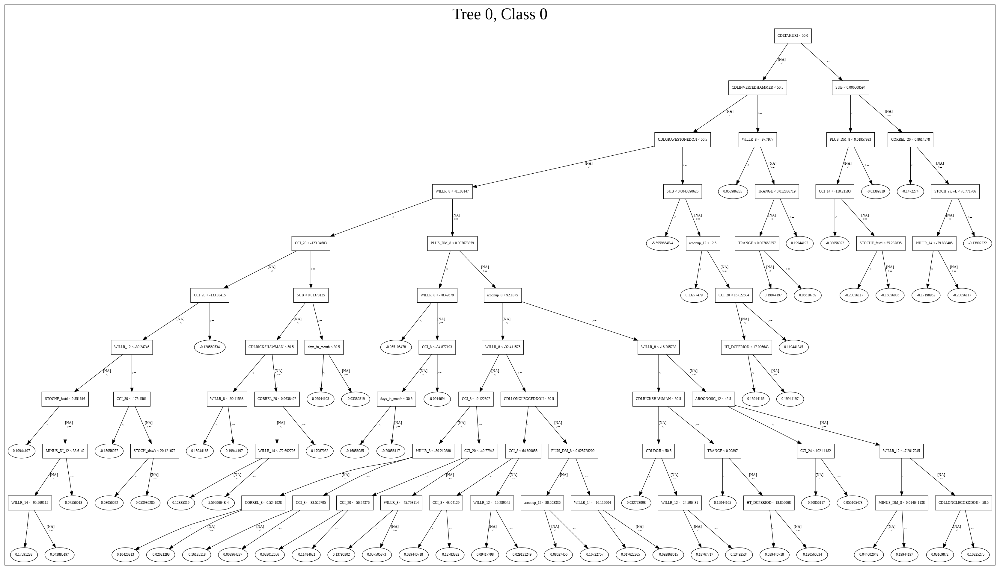

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_070415_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_070415_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['DIV',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'ULTOSC',
 'BETA_8',
 'dayofyear',
 'MINUS_DM_8',
 'CORREL_20',
 'STOCHF_fastk',
 'days_in_month',
 'BETA_20',
 'PLUS_DI_24',
 'CORREL_30',
 'CCI_8',
 'MINUS_DI_8',
 'BOP',
 'STDDEV_12',
 'ATR_24',
 'PLUS_DI_8',
 'HT_DCPERIOD',
 'NATR_24',
 'ADX_8',
 'MACDEXT_hist',
 'STDDEV_24',
 'aroonup_8',
 'BBANDS_upperband_30_2_5',
 'PLUS_DI_14',
 'PLUS_DM_8',
 'BETA_30',
 'STDDEV_8',
 'aroonup_12',
 'STOCHRSI_fastk',
 'aroondown_12',
 'TRIX_14',
 'WILLR_8',
 'CMO_8',
 'STOCH_slowk',
 'LINEARREG_ANGLE_8',
 'HT_PHASOR_quadrature',
 'aroondown_8',
 'CCI_12',
 'WILLR_14',
 'WILLR_12',
 'CCI_14',
 'KAMA_14',
 'STOCH_slowd',
 'CCI_24',
 'CCI_20']

In [28]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_071306_model_1,0.820208,0.509739,0.271734,0.415246,0.172429


,variable,relative_importance,scaled_importance,percentage
0,STOCHF_fastk,0.614836,1.000000,0.069683
1,CCI_8,0.586653,0.954161,0.066488
2,CMO_8,0.524929,0.853770,0.059493
3,MINUS_DI_8,0.435231,0.707881,0.049327
4,CDLGRAVESTONEDOJI,0.429383,0.698370,0.048664
5,PLUS_DI_8,0.399400,0.649604,0.045266
6,LINEARREG_ANGLE_8,0.384099,0.624717,0.043532
7,DIV,0.362027,0.588818,0.041030
8,WILLR_14,0.359863,0.585298,0.040785
9,WILLR_12,0.306387,0.498323,0.034724


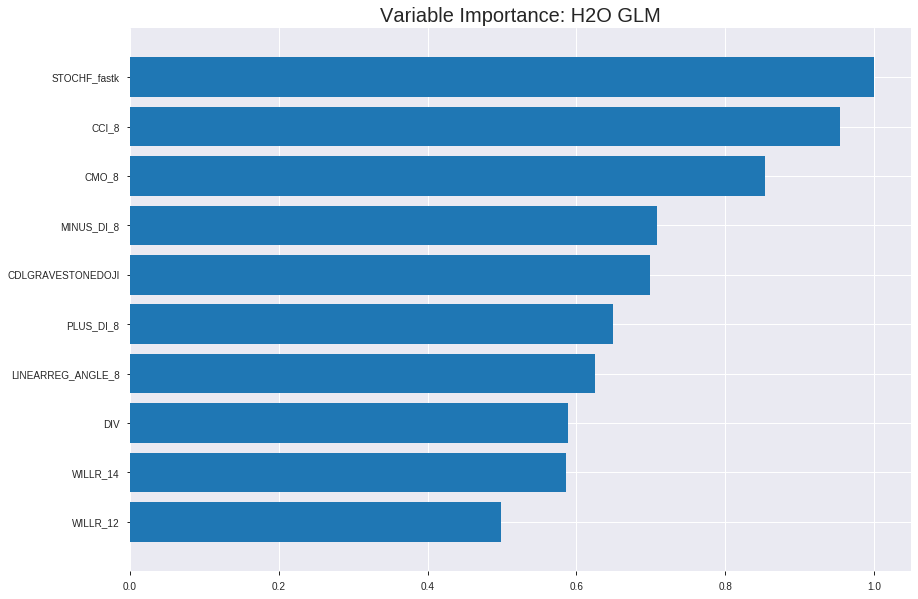

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_071306_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1791915022283944
RMSE: 0.4233101726020701
LogLoss: 0.5324297727765254
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375749
Residual deviance: 1902.9040079033016
AIC: 2004.9040079033016
AUC: 0.8080695346320347
pr_auc: 0.8010219914639934
Gini: 0.6161390692640694
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3910317556543192: 


,0,1,Error,Rate
0,462.0,429.0,0.4815,(429.0/891.0)
1,97.0,799.0,0.1083,(97.0/896.0)
Total,559.0,1228.0,0.2943,(526.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3910318,0.7523540,258.0
max f2,0.2282463,0.8604150,327.0
max f0point5,0.5267829,0.7326779,191.0
max accuracy,0.5050186,0.7319530,202.0
max precision,0.9956786,1.0,0.0
max recall,0.0368289,1.0,388.0
max specificity,0.9956786,1.0,0.0
max absolute_mcc,0.5050186,0.4639185,202.0
max min_per_class_accuracy,0.5102034,0.7299107,200.0
max mean_per_class_accuracy,0.5050186,0.7319337,202.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9681387,1.8836186,1.8836186,0.9444444,0.9803926,0.9444444,0.9803926,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9477079,1.9944196,1.9390191,1.0,0.9553802,0.9722222,0.9678864,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9363825,1.7728175,1.8836186,0.8888889,0.9424389,0.9444444,0.9594039,0.0178571,0.0569196,77.2817460,88.3618552
,4,0.0402910,0.9227234,1.7728175,1.8559183,0.8888889,0.9295250,0.9305556,0.9519342,0.0178571,0.0747768,77.2817460,85.5918279
,5,0.0503637,0.9176061,1.8836186,1.8614583,0.9444444,0.9199759,0.9333333,0.9455425,0.0189732,0.09375,88.3618552,86.1458333
,6,0.1001679,0.8573612,1.8823736,1.8718575,0.9438202,0.8894979,0.9385475,0.9176768,0.09375,0.1875,88.2373596,87.1857542
,7,0.1499720,0.7756230,1.6582815,1.8009312,0.8314607,0.8169389,0.9029851,0.8842228,0.0825893,0.2700893,65.8281501,80.0931170
,8,0.2003358,0.7130879,1.5068948,1.7270114,0.7555556,0.7468412,0.8659218,0.8496855,0.0758929,0.3459821,50.6894841,72.7011423
,9,0.2999440,0.6265746,1.4341894,1.6297683,0.7191011,0.6663639,0.8171642,0.7888063,0.1428571,0.4888393,43.4189406,62.9768290
,10,0.4001119,0.5675093,1.2256210,1.5285902,0.6145251,0.5951197,0.7664336,0.7403169,0.1227679,0.6116071,22.5621010,52.8590160




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1756791030358588
RMSE: 0.41914091071602494
LogLoss: 0.5269427417473598
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497436
Residual deviance: 538.5354820658017
AIC: 640.5354820658017
AUC: 0.8168200644270595
pr_auc: 0.7999194654651356
Gini: 0.6336401288541189
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4216836617035267: 


,0,1,Error,Rate
0,174.0,91.0,0.3434,(91.0/265.0)
1,36.0,210.0,0.1463,(36.0/246.0)
Total,210.0,301.0,0.2485,(127.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4216837,0.7678245,238.0
max f2,0.2399505,0.8453237,317.0
max f0point5,0.6251535,0.7584270,131.0
max accuracy,0.4862464,0.7514677,202.0
max precision,0.9944132,1.0,0.0
max recall,0.0530127,1.0,379.0
max specificity,0.9944132,1.0,0.0
max absolute_mcc,0.4216837,0.5181925,238.0
max min_per_class_accuracy,0.4806265,0.7509434,205.0
max mean_per_class_accuracy,0.4216837,0.7551312,238.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9733751,2.0772358,2.0772358,1.0,0.9819511,1.0,0.9819511,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9650808,1.6617886,1.8883962,0.8,0.9674119,0.9090909,0.9753424,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.9469823,2.0772358,1.9474085,1.0,0.9530558,0.9375,0.9683778,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9362234,2.0772358,1.9783198,1.0,0.9427647,0.9523810,0.9622795,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9313855,2.0772358,1.9973421,1.0,0.9339784,0.9615385,0.9568369,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8839493,1.8375547,1.9174484,0.8846154,0.9039024,0.9230769,0.9303697,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.8250935,1.6617886,1.8344420,0.8,0.8541854,0.8831169,0.9056345,0.0813008,0.2764228,66.1788618,83.4441981
,8,0.2015656,0.7768584,1.5978737,1.7747257,0.7692308,0.8006275,0.8543689,0.8791279,0.0813008,0.3577236,59.7873671,77.4725708
,9,0.3013699,0.6448088,1.6292045,1.7265336,0.7843137,0.7080635,0.8311688,0.8224767,0.1626016,0.5203252,62.9204527,72.6533629
,10,0.4011742,0.5489648,1.1811733,1.5908586,0.5686275,0.5930062,0.7658537,0.7653889,0.1178862,0.6382114,18.1173282,59.0858616



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:13:06,0.000 sec,2,.15E2,51,1.3719144,1.3708842
,2019-12-08 07:13:06,0.008 sec,4,.96E1,51,1.3639212,1.3621496
,2019-12-08 07:13:06,0.014 sec,6,.6E1,51,1.3521244,1.3492032
,2019-12-08 07:13:06,0.022 sec,8,.37E1,51,1.3354285,1.3307805
,2019-12-08 07:13:06,0.030 sec,10,.23E1,51,1.3131604,1.3060204
---,---,---,---,---,---,---,---
,2019-12-08 07:13:06,0.124 sec,36,.47E-2,51,1.0608770,1.0550008
,2019-12-08 07:13:06,0.134 sec,38,.29E-2,51,1.0582290,1.0570451
,2019-12-08 07:13:06,0.140 sec,40,.18E-2,51,1.0565112,1.0594458
,2019-12-08 07:13:06,0.146 sec,42,.11E-2,51,1.0553767,1.0618899



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7661016949152543)

('auc', 0.8202075702075702)

('logloss', 0.5097393481656832)

('mean_per_class_error', 0.26520146520146515)

('rmse', 0.415246061985904)

('mse', 0.17242929199480125)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


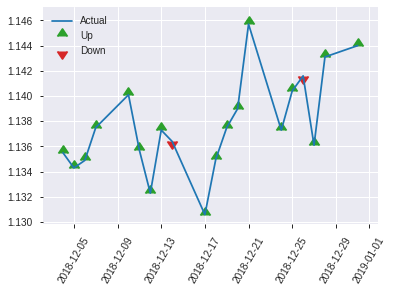


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17242929199480125
RMSE: 0.415246061985904
LogLoss: 0.5097393481656832
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550244
Residual deviance: 260.9865462608298
AIC: 362.9865462608298
AUC: 0.8202075702075702
pr_auc: 0.83119625378216
Gini: 0.6404151404151404
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3947126932386621: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,17.0,113.0,0.1308,(17.0/130.0)
Total,91.0,165.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3947127,0.7661017,164.0
max f2,0.2771535,0.8686731,210.0
max f0point5,0.5252863,0.7490975,105.0
max accuracy,0.4991046,0.734375,121.0
max precision,0.9732605,1.0,0.0
max recall,0.0637298,1.0,241.0
max specificity,0.9732605,1.0,0.0
max absolute_mcc,0.3947127,0.4768325,164.0
max min_per_class_accuracy,0.4756322,0.7301587,128.0
max mean_per_class_accuracy,0.4991046,0.7347985,121.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9667534,1.9692308,1.9692308,1.0,0.9712696,1.0,0.9712696,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9463169,1.9692308,1.9692308,1.0,0.9580225,1.0,0.9646461,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9372926,1.9692308,1.9692308,1.0,0.9393909,1.0,0.9583323,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9284951,1.9692308,1.9692308,1.0,0.9329028,1.0,0.9513970,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9165456,1.9692308,1.9692308,1.0,0.9210310,1.0,0.9467253,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8686478,1.9692308,1.9692308,1.0,0.8921296,1.0,0.9194274,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7789336,1.9692308,1.9692308,1.0,0.8305216,1.0,0.8897921,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7054631,1.3633136,1.8177515,0.6923077,0.7383411,0.9230769,0.8519294,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.6078348,1.1815385,1.6111888,0.6,0.6492185,0.8181818,0.7861142,0.1153846,0.4846154,18.1538462,61.1188811
,10,0.4023438,0.5329680,1.2875740,1.5294996,0.6538462,0.5653799,0.7766990,0.7303948,0.1307692,0.6153846,28.7573964,52.9499627


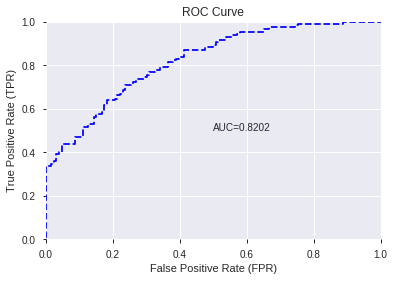

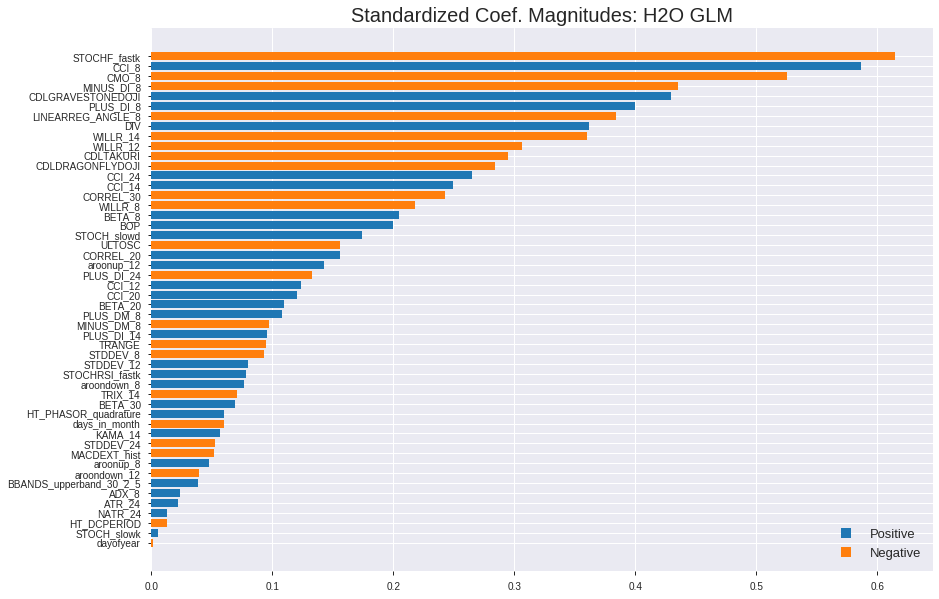

'log_likelihood'
--2019-12-08 07:13:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.144.43
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.144.43|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


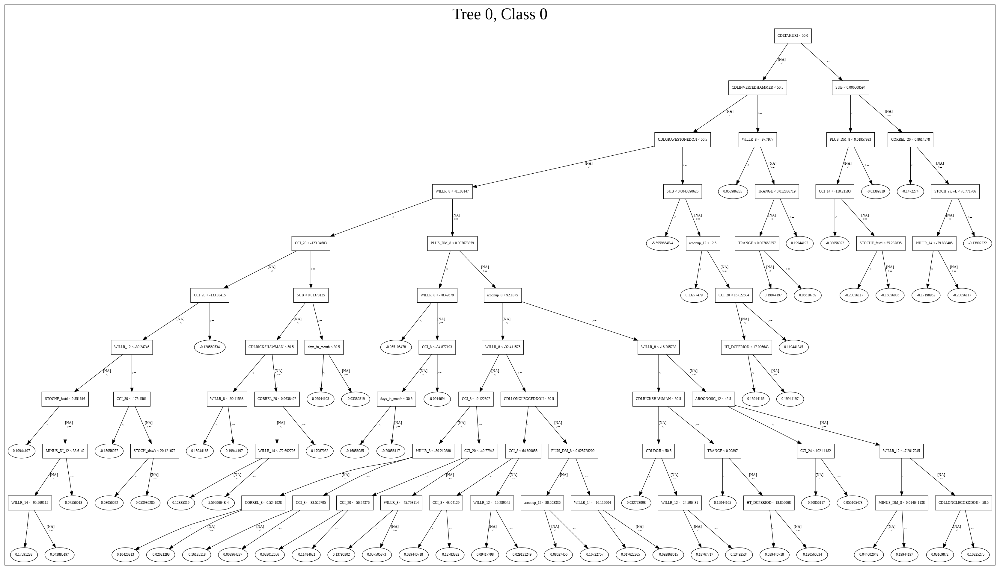

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_071306_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_071306_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_55_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_55_s

['STOCHF_fastk',
 'CCI_8',
 'CMO_8',
 'MINUS_DI_8',
 'CDLGRAVESTONEDOJI',
 'PLUS_DI_8',
 'LINEARREG_ANGLE_8',
 'DIV',
 'WILLR_14',
 'WILLR_12',
 'CDLTAKURI',
 'CDLDRAGONFLYDOJI',
 'CCI_24',
 'CCI_14',
 'CORREL_30',
 'WILLR_8',
 'BETA_8',
 'BOP',
 'STOCH_slowd',
 'ULTOSC',
 'CORREL_20',
 'aroonup_12',
 'PLUS_DI_24',
 'CCI_12',
 'CCI_20',
 'BETA_20',
 'PLUS_DM_8',
 'MINUS_DM_8',
 'PLUS_DI_14',
 'TRANGE',
 'STDDEV_8',
 'STDDEV_12',
 'STOCHRSI_fastk',
 'aroondown_8',
 'TRIX_14',
 'BETA_30',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'KAMA_14',
 'STDDEV_24',
 'MACDEXT_hist',
 'aroonup_8',
 'aroondown_12',
 'BBANDS_upperband_30_2_5',
 'ADX_8',
 'ATR_24',
 'NATR_24',
 'HT_DCPERIOD',
 'STOCH_slowk',
 'dayofyear']

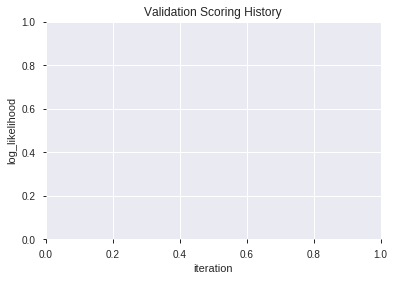

In [29]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_071411_model_4,0.828449,0.519834,0.284005,0.416123,0.173158
1,XGBoost_grid_1_AutoML_20191208_071411_model_7,0.822527,0.517176,0.239499,0.415306,0.172479
2,XGBoost_1_AutoML_20191208_071411,0.821245,0.522733,0.259341,0.418105,0.174812
3,XGBoost_3_AutoML_20191208_071411,0.820879,0.520957,0.251160,0.417679,0.174456
4,XGBoost_grid_1_AutoML_20191208_071411_model_2,0.820330,0.520337,0.275824,0.417578,0.174372
5,XGBoost_grid_1_AutoML_20191208_071411_model_5,0.820269,0.517129,0.280525,0.417441,0.174257
6,XGBoost_grid_1_AutoML_20191208_071411_model_3,0.810623,0.529793,0.287485,0.422234,0.178281
7,XGBoost_2_AutoML_20191208_071411,0.810317,0.529390,0.279304,0.422492,0.178499
8,XGBoost_grid_1_AutoML_20191208_071411_model_1,0.802930,0.538639,0.303602,0.426768,0.182131
9,XGBoost_grid_1_AutoML_20191208_071411_model_6,0.797314,0.534940,0.316239,0.426713,0.182084


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,687.486084,1.000000,0.107943
1,CDLDRAGONFLYDOJI,623.279785,0.906607,0.097862
2,STOCHF_fastk,590.623352,0.859106,0.092735
3,CDLTAKURI,543.363464,0.790363,0.085314
4,CCI_8,416.272156,0.605499,0.065360
5,WILLR_8,393.032898,0.571696,0.061711
6,WILLR_12,225.110382,0.327440,0.035345
7,ULTOSC,218.268661,0.317488,0.034271
8,aroondown_8,208.329056,0.303030,0.032710
9,PLUS_DI_8,152.844208,0.222323,0.023998


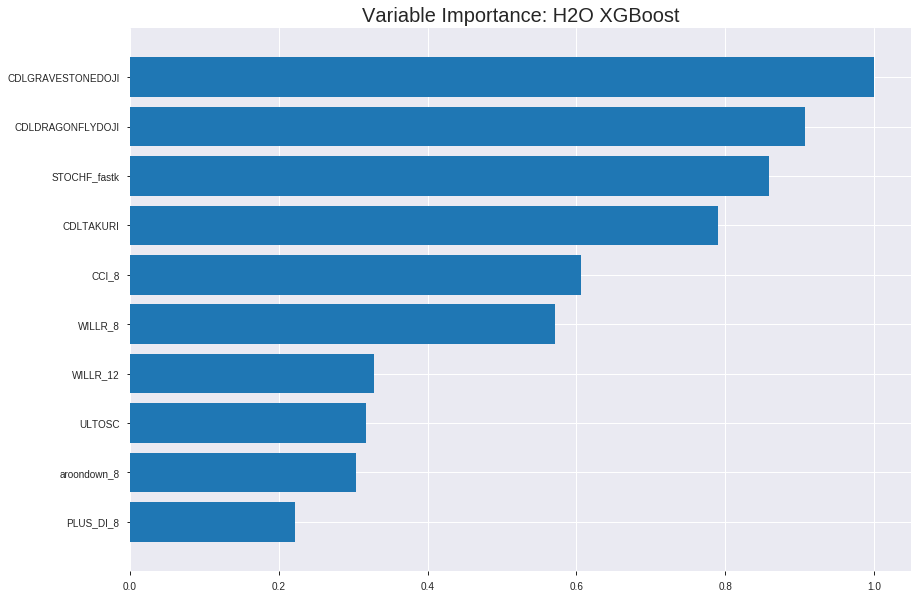

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_071411_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15729977962023642
RMSE: 0.3966103624720822
LogLoss: 0.4865949332699385
Mean Per-Class Error: 0.20042500901875904
AUC: 0.8732701519159853
pr_auc: 0.863780077183745
Gini: 0.7465403038319707
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4560742924610774: 


,0,1,Error,Rate
0,627.0,264.0,0.2963,(264.0/891.0)
1,109.0,787.0,0.1217,(109.0/896.0)
Total,736.0,1051.0,0.2087,(373.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4560743,0.8084232,216.0
max f2,0.3616020,0.8791547,267.0
max f0point5,0.5605111,0.8046715,160.0
max accuracy,0.4928557,0.7996642,196.0
max precision,0.9119270,1.0,0.0
max recall,0.1077499,1.0,380.0
max specificity,0.9119270,1.0,0.0
max absolute_mcc,0.4928557,0.6004360,196.0
max min_per_class_accuracy,0.5091451,0.7878788,186.0
max mean_per_class_accuracy,0.4928557,0.7995750,196.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8968591,1.9944196,1.9944196,1.0,0.9038581,1.0,0.9038581,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8848904,1.9944196,1.9944196,1.0,0.8905558,1.0,0.8972069,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8778847,1.8836186,1.9574859,0.9444444,0.8819469,0.9814815,0.8921203,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.8697542,1.9944196,1.9667194,1.0,0.8733217,0.9861111,0.8874206,0.0200893,0.0792411,99.4419643,96.6719370
,5,0.0503637,0.8612109,1.7728175,1.9279390,0.8888889,0.8653543,0.9666667,0.8830074,0.0178571,0.0970982,77.2817460,92.7938988
,6,0.1001679,0.8127400,1.8823736,1.9052836,0.9438202,0.8361802,0.9553073,0.8597246,0.09375,0.1908482,88.2373596,90.5283569
,7,0.1499720,0.7625323,1.7927368,1.8679079,0.8988764,0.7883477,0.9365672,0.8360211,0.0892857,0.2801339,79.2736758,86.7907949
,8,0.2003358,0.7175964,1.7063368,1.8272895,0.8555556,0.7398566,0.9162011,0.8118456,0.0859375,0.3660714,70.6336806,82.7289505
,9,0.2999440,0.6329661,1.6358723,1.7637218,0.8202247,0.6727220,0.8843284,0.7656441,0.1629464,0.5290179,63.5872291,76.3721848
,10,0.4001119,0.5691348,1.4373192,1.6820071,0.7206704,0.6012450,0.8433566,0.7244869,0.1439732,0.6729911,43.7319184,68.2007055




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17612242728037292
RMSE: 0.41966942619206005
LogLoss: 0.5290324962227247
Mean Per-Class Error: 0.2518561129007516
AUC: 0.8183540420309864
pr_auc: 0.7973778939402764
Gini: 0.6367080840619728
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42486217617988586: 


,0,1,Error,Rate
0,157.0,108.0,0.4075,(108.0/265.0)
1,35.0,211.0,0.1423,(35.0/246.0)
Total,192.0,319.0,0.2798,(143.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4248622,0.7469027,247.0
max f2,0.3011094,0.8466570,307.0
max f0point5,0.5929552,0.7581574,156.0
max accuracy,0.5719642,0.7495108,171.0
max precision,0.9139113,1.0,0.0
max recall,0.1248992,1.0,378.0
max specificity,0.9139113,1.0,0.0
max absolute_mcc,0.5929552,0.4995906,156.0
max min_per_class_accuracy,0.5207095,0.7433962,195.0
max mean_per_class_accuracy,0.5529885,0.7481439,180.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8945190,2.0772358,2.0772358,1.0,0.9065728,1.0,0.9065728,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8754335,2.0772358,2.0772358,1.0,0.8819369,1.0,0.8953747,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8694422,1.6617886,1.9474085,0.8,0.8706774,0.9375,0.8876568,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8663737,1.6617886,1.8794038,0.8,0.8672800,0.9047619,0.8828052,0.0162602,0.0772358,66.1788618,87.9403794
,5,0.0508806,0.8615564,2.0772358,1.9174484,1.0,0.8635451,0.9230769,0.8791013,0.0203252,0.0975610,107.7235772,91.7448405
,6,0.1017613,0.8332707,1.8375547,1.8775016,0.8846154,0.8445948,0.9038462,0.8618481,0.0934959,0.1910569,83.7554722,87.7501563
,7,0.1506849,0.7936118,1.6617886,1.8074649,0.8,0.8109056,0.8701299,0.8453083,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7483777,1.6777674,1.7747257,0.8076923,0.7761654,0.8543689,0.8278547,0.0853659,0.3577236,67.7767355,77.4725708
,9,0.3013699,0.6633936,1.5477443,1.6995565,0.7450980,0.7101007,0.8181818,0.7888583,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5904174,1.3848238,1.6212572,0.6666667,0.6234704,0.7804878,0.7477130,0.1382114,0.6504065,38.4823848,62.1257188



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:14:16,2.435 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 07:14:16,2.479 sec,5.0,0.4770523,0.6479285,0.8017382,0.5958456,1.7717868,0.2898713,0.4752125,0.6443561,0.7897224,0.4919682,1.8598506,0.3287671
,2019-12-08 07:14:16,2.505 sec,10.0,0.4629391,0.6200705,0.8093585,0.6023456,1.7717868,0.2708450,0.4614404,0.6170202,0.7847446,0.4879484,1.8598506,0.3365949
,2019-12-08 07:14:16,2.530 sec,15.0,0.4522771,0.5987076,0.8224313,0.7768387,1.9357602,0.2797985,0.4534881,0.6007142,0.7863399,0.6504433,1.8526697,0.2837573
,2019-12-08 07:14:16,2.557 sec,20.0,0.4426754,0.5793562,0.8280999,0.8114874,1.8282180,0.2462227,0.4425378,0.5782277,0.8030603,0.7331266,1.9288618,0.2994129
,2019-12-08 07:14:17,2.585 sec,25.0,0.4365231,0.5666010,0.8295686,0.8130045,1.9944196,0.2557359,0.4382748,0.5688871,0.8050314,0.7844168,2.0772358,0.3072407
,2019-12-08 07:14:17,2.615 sec,30.0,0.4305885,0.5544253,0.8367642,0.8247308,1.9944196,0.2439843,0.4335317,0.5586507,0.8086516,0.7849739,2.0772358,0.3091977
,2019-12-08 07:14:17,2.645 sec,35.0,0.4259024,0.5449872,0.8392820,0.8285280,1.9944196,0.2389480,0.4308261,0.5531273,0.8106918,0.7925631,2.0772358,0.3072407
,2019-12-08 07:14:17,2.681 sec,40.0,0.4213476,0.5358881,0.8426740,0.8314871,1.9944196,0.2428651,0.4278455,0.5468808,0.8149103,0.7985384,2.0772358,0.2994129
,2019-12-08 07:14:17,2.715 sec,45.0,0.4166234,0.5264733,0.8492471,0.8383442,1.9944196,0.2260772,0.4260818,0.5427003,0.8169735,0.8024510,2.0772358,0.2818004


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,687.4860840,1.0,0.1079433
CDLDRAGONFLYDOJI,623.2797852,0.9066071,0.0978622
STOCHF_fastk,590.6233521,0.8591059,0.0927348
CDLTAKURI,543.3634644,0.7903629,0.0853144
CCI_8,416.2721558,0.6054990,0.0653596
---,---,---,---
HT_PHASOR_quadrature,25.4862061,0.0370716,0.0040016
PLUS_DI_14,23.8600235,0.0347062,0.0037463
STDDEV_24,18.4536171,0.0268422,0.0028974
STOCHRSI_fastk,17.2961731,0.0251586,0.0027157



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.75390625)

('F1', 0.7631578947368421)

('auc', 0.8284493284493285)

('logloss', 0.5198341444894132)

('mean_per_class_error', 0.24621489621489623)

('rmse', 0.4161227891909518)

('mse', 0.1731581756840573)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


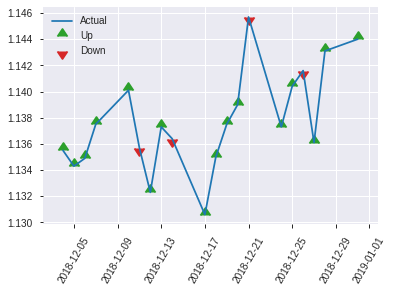


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1731581756840573
RMSE: 0.4161227891909518
LogLoss: 0.5198341444894132
Mean Per-Class Error: 0.24621489621489623
AUC: 0.8284493284493285
pr_auc: 0.8405375878505552
Gini: 0.656898656898657
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3706682324409485: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,82.0,174.0,0.2812,(72.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3706682,0.7631579,173.0
max f2,0.2813261,0.8677686,205.0
max f0point5,0.6113360,0.7847534,78.0
max accuracy,0.5004335,0.7539062,130.0
max precision,0.9104905,1.0,0.0
max recall,0.1207565,1.0,241.0
max specificity,0.9104905,1.0,0.0
max absolute_mcc,0.4960576,0.5076515,132.0
max min_per_class_accuracy,0.5086265,0.7460317,128.0
max mean_per_class_accuracy,0.5004335,0.7537851,130.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8932352,1.9692308,1.9692308,1.0,0.9018687,1.0,0.9018687,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8852488,1.9692308,1.9692308,1.0,0.8894086,1.0,0.8956386,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8695557,1.9692308,1.9692308,1.0,0.8801951,1.0,0.8917778,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8613068,1.9692308,1.9692308,1.0,0.8634732,1.0,0.8840584,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8525088,1.9692308,1.9692308,1.0,0.8560400,1.0,0.8797478,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8181506,1.9692308,1.9692308,1.0,0.8392011,1.0,0.8594745,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7666176,1.9692308,1.9692308,1.0,0.7909640,1.0,0.8366376,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.6968279,1.3633136,1.8177515,0.6923077,0.7256645,0.9230769,0.8088944,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.6116338,1.5753846,1.7390609,0.8,0.6510123,0.8831169,0.7576339,0.1538462,0.5230769,57.5384615,73.9060939
,10,0.4023438,0.5634349,1.0603550,1.5677371,0.5384615,0.5911700,0.7961165,0.7156139,0.1076923,0.6307692,6.0355030,56.7737117


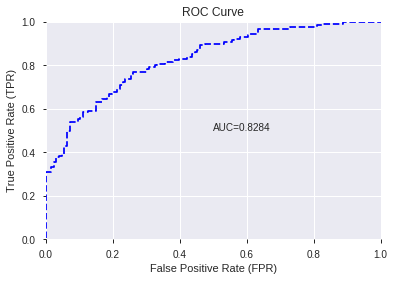

This function is available for GLM models only


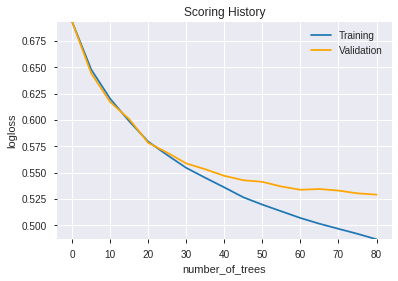

--2019-12-08 07:14:29--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.128.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.128.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

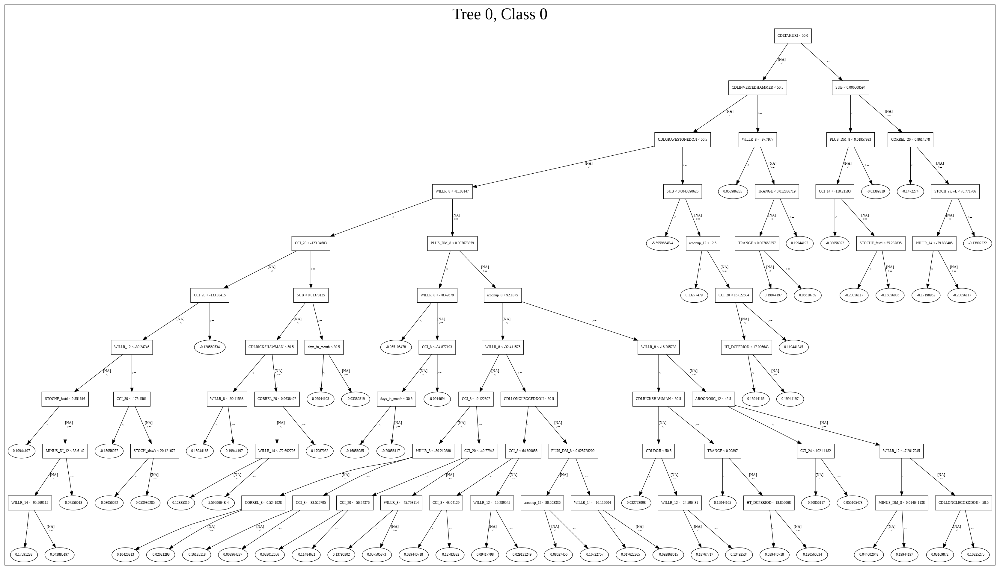

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_071411_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_071411_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_60_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'CDLTAKURI',
 'CCI_8',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'aroondown_8',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'aroonup_12',
 'LINEARREG_ANGLE_8',
 'CCI_20',
 'CORREL_20',
 'WILLR_14',
 'ADX_8',
 'ATR_24',
 'CCI_14',
 'BBANDS_upperband_30_2_5',
 'PLUS_DM_8',
 'TRIX_14',
 'CCI_24',
 'BETA_8',
 'HT_DCPERIOD',
 'MINUS_DM_8',
 'dayofyear',
 'DIV',
 'STOCH_slowk',
 'STDDEV_12',
 'CMO_8',
 'BETA_30',
 'CORREL_30',
 'BOP',
 'aroonup_8',
 'BETA_20',
 'MACDEXT_hist',
 'PLUS_DI_24',
 'days_in_month',
 'STOCH_slowd',
 'NATR_24',
 'CCI_12',
 'STDDEV_8',
 'TRANGE',
 'HT_PHASOR_quadrature',
 'PLUS_DI_14',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'KAMA_14']

In [30]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [31]:
# DRF with top XGBoost features
model_train(feature_name='XGBF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_071633,0.828022,0.512022,0.231197,0.413405,0.170904
1,GBM_1_AutoML_20191208_071633,0.812027,0.523747,0.275824,0.420501,0.176821
2,GBM_2_AutoML_20191208_071633,0.809768,0.525014,0.268010,0.421908,0.178007
3,GBM_grid_1_AutoML_20191208_071633_model_1,0.807448,0.585496,0.320208,0.445726,0.198672
4,GBM_3_AutoML_20191208_071633,0.806777,0.535463,0.259585,0.424460,0.180166
5,GBM_grid_1_AutoML_20191208_071633_model_5,0.802259,0.685676,0.275458,0.496251,0.246265
6,GBM_grid_1_AutoML_20191208_071633_model_2,0.798962,0.594571,0.290476,0.450469,0.202922
7,GBM_4_AutoML_20191208_071633,0.796947,0.549184,0.275458,0.430719,0.185519
8,GBM_grid_1_AutoML_20191208_071633_model_4,0.794261,0.649009,0.282662,0.477579,0.228081
9,GBM_grid_1_AutoML_20191208_071633_model_3,0.753175,0.766458,0.347741,0.486316,0.236503


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,145.580994,1.000000,0.155294
1,CDLGRAVESTONEDOJI,108.555595,0.745671,0.115798
2,CDLDRAGONFLYDOJI,81.996315,0.563235,0.087467
3,STOCHF_fastk,71.688301,0.492429,0.076471
4,WILLR_8,60.390278,0.414823,0.064419
5,CCI_8,54.613792,0.375144,0.058258
6,WILLR_12,41.080276,0.282182,0.043821
7,aroondown_8,24.334927,0.167157,0.025959
8,aroonup_12,23.883734,0.164058,0.025477
9,ULTOSC,20.200752,0.138760,0.021549


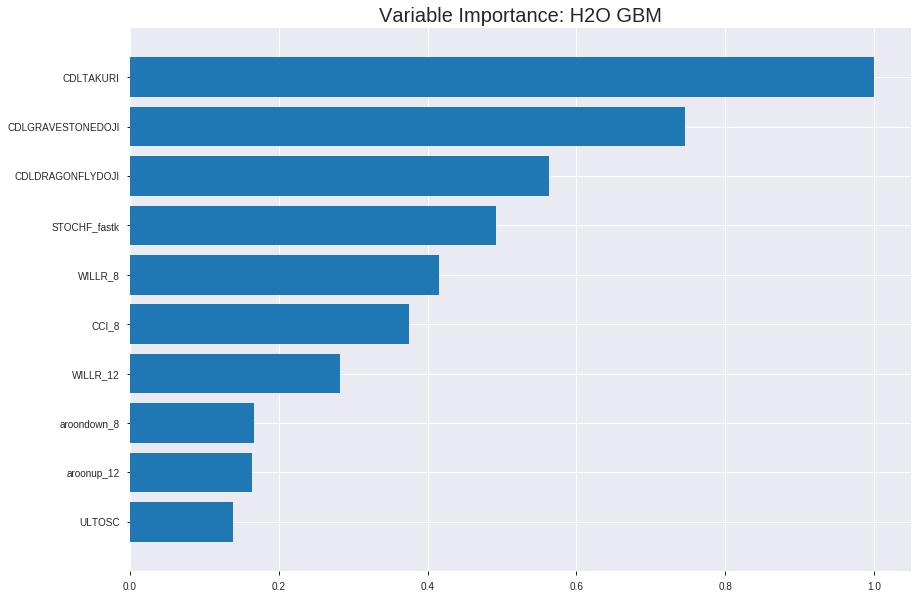

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_071633


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1452183826271542
RMSE: 0.3810752978443423
LogLoss: 0.4558799655517061
Mean Per-Class Error: 0.18976596320346317
AUC: 0.8906957722061889
pr_auc: 0.8835708630502712
Gini: 0.7813915444123778
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4394234368711757: 


,0,1,Error,Rate
0,639.0,252.0,0.2828,(252.0/891.0)
1,98.0,798.0,0.1094,(98.0/896.0)
Total,737.0,1050.0,0.1959,(350.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4394234,0.8201439,229.0
max f2,0.3386200,0.8876589,276.0
max f0point5,0.5910659,0.8324382,157.0
max accuracy,0.4913579,0.8102966,206.0
max precision,0.9414304,1.0,0.0
max recall,0.0843375,1.0,382.0
max specificity,0.9414304,1.0,0.0
max absolute_mcc,0.5502811,0.6231907,177.0
max min_per_class_accuracy,0.5096487,0.8058036,196.0
max mean_per_class_accuracy,0.4913579,0.8102340,206.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9188127,1.9944196,1.9944196,1.0,0.9293947,1.0,0.9293947,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9107902,1.9944196,1.9944196,1.0,0.9145378,1.0,0.9219662,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9016148,1.9944196,1.9944196,1.0,0.9072415,1.0,0.9170580,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8915240,1.8836186,1.9667194,0.9444444,0.8964004,0.9861111,0.9118936,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.8823652,1.8836186,1.9500992,0.9444444,0.8870403,0.9777778,0.9069229,0.0189732,0.0982143,88.3618552,95.0099206
,6,0.1001679,0.8412793,1.8599644,1.9052836,0.9325843,0.8644395,0.9553073,0.8857999,0.0926339,0.1908482,85.9964386,90.5283569
,7,0.1499720,0.7988008,1.8599644,1.8902335,0.9325843,0.8187975,0.9477612,0.8635491,0.0926339,0.2834821,85.9964386,89.0233542
,8,0.2003358,0.7449293,1.8171379,1.8718575,0.9111111,0.7752037,0.9385475,0.8413394,0.0915179,0.375,81.7137897,87.1857542
,9,0.2999440,0.6611909,1.6582815,1.8009312,0.8314607,0.6990153,0.9029851,0.7940750,0.1651786,0.5401786,65.8281501,80.0931170
,10,0.4001119,0.5848360,1.5487393,1.7377950,0.7765363,0.6228756,0.8713287,0.7512153,0.1551339,0.6953125,54.8739276,73.7795017




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17277041760305897
RMSE: 0.4156566102001254
LogLoss: 0.5204800256032004
Mean Per-Class Error: 0.2528685381193434
AUC: 0.8214450069028992
pr_auc: 0.7949266428867974
Gini: 0.6428900138057985
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3598052217437385: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,169.0,342.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3598052,0.7585034,268.0
max f2,0.2482968,0.8513709,319.0
max f0point5,0.6415071,0.7578947,137.0
max accuracy,0.5104579,0.7475538,193.0
max precision,0.9392345,1.0,0.0
max recall,0.0837315,1.0,388.0
max specificity,0.9392345,1.0,0.0
max absolute_mcc,0.5104579,0.4943388,193.0
max min_per_class_accuracy,0.4972020,0.7398374,197.0
max mean_per_class_accuracy,0.5104579,0.7471315,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9066204,2.0772358,2.0772358,1.0,0.9222040,1.0,0.9222040,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8995273,2.0772358,2.0772358,1.0,0.9019689,1.0,0.9130062,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8912461,1.2463415,1.8175813,0.6,0.8950980,0.875,0.9074099,0.0121951,0.0569106,24.6341463,81.7581301
,4,0.0410959,0.8873869,2.0772358,1.8794038,1.0,0.8888962,0.9047619,0.9030019,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8836342,1.6617886,1.8375547,0.8,0.8855030,0.8846154,0.8996367,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8490066,1.9174484,1.8775016,0.9230769,0.8656688,0.9038462,0.8826528,0.0975610,0.1910569,91.7448405,87.7501563
,7,0.1506849,0.8165290,1.6617886,1.8074649,0.8,0.8316610,0.8701299,0.8660970,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7840043,1.6777674,1.7747257,0.8076923,0.8022385,0.8543689,0.8499774,0.0853659,0.3577236,67.7767355,77.4725708
,9,0.3013699,0.6798649,1.5477443,1.6995565,0.7450980,0.7357006,0.8181818,0.8121325,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5680162,1.3440937,1.6111243,0.6470588,0.6268590,0.7756098,0.7660401,0.1341463,0.6463415,34.4093735,61.1124331



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:16:38,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 07:16:38,0.053 sec,5.0,0.4581532,0.6110873,0.8103255,0.7431091,1.8856331,0.2937885,0.4564344,0.6077386,0.8087820,0.6917517,1.7310298,0.2661448
,2019-12-08 07:16:38,0.090 sec,10.0,0.4380936,0.5705154,0.8258672,0.8013783,1.6922348,0.2686066,0.4393337,0.5720949,0.8091272,0.7851532,2.0772358,0.2915851
,2019-12-08 07:16:38,0.133 sec,15.0,0.4256046,0.5444402,0.8356719,0.8223462,1.7728175,0.2462227,0.4293602,0.5504127,0.8152017,0.7926040,1.9288618,0.2837573
,2019-12-08 07:16:38,0.174 sec,20.0,0.4154202,0.5234912,0.8455487,0.8337380,1.9944196,0.2434247,0.4246179,0.5393560,0.8151097,0.7879251,1.9041328,0.3052838
,2019-12-08 07:16:38,0.217 sec,25.0,0.4074470,0.5075143,0.8556642,0.8464581,1.9944196,0.2294348,0.4217595,0.5331840,0.8173109,0.7915927,2.0772358,0.2974560
,2019-12-08 07:16:38,0.262 sec,30.0,0.3999817,0.4926617,0.8662593,0.8573075,1.9944196,0.2210409,0.4197189,0.5293697,0.8194278,0.7910548,1.7310298,0.2544031
,2019-12-08 07:16:38,0.303 sec,35.0,0.3929234,0.4787128,0.8751722,0.8668030,1.9944196,0.2221600,0.4181588,0.5257224,0.8194662,0.7977964,2.0772358,0.2915851
,2019-12-08 07:16:38,0.345 sec,40.0,0.3865025,0.4659829,0.8834363,0.8767568,1.9944196,0.2081701,0.4166647,0.5223963,0.8213376,0.7984113,2.0772358,0.2778865
,2019-12-08 07:16:38,0.387 sec,45.0,0.3810753,0.4558800,0.8906958,0.8835709,1.9944196,0.1958590,0.4156566,0.5204800,0.8214450,0.7949266,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,145.5809937,1.0,0.1552939
CDLGRAVESTONEDOJI,108.5555954,0.7456715,0.1157982
CDLDRAGONFLYDOJI,81.9963150,0.5632350,0.0874670
STOCHF_fastk,71.6883011,0.4924290,0.0764712
WILLR_8,60.3902779,0.4148225,0.0644194
---,---,---,---
STOCH_slowk,4.2052860,0.0288862,0.0044859
MINUS_DM_8,3.3135939,0.0227612,0.0035347
CORREL_30,2.0135589,0.0138312,0.0021479
KAMA_14,1.9164637,0.0131642,0.0020443



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7822878228782287)

('auc', 0.8280219780219781)

('logloss', 0.5120220964185227)

('mean_per_class_error', 0.23119658119658126)

('rmse', 0.41340516460883886)

('mse', 0.17090383012526117)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


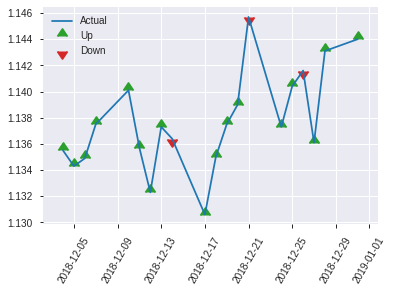


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17090383012526117
RMSE: 0.41340516460883886
LogLoss: 0.5120220964185227
Mean Per-Class Error: 0.23119658119658126
AUC: 0.8280219780219781
pr_auc: 0.8329162606521099
Gini: 0.6560439560439562
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45642792562956436: 


,0,1,Error,Rate
0,91.0,35.0,0.2778,(35.0/126.0)
1,24.0,106.0,0.1846,(24.0/130.0)
Total,115.0,141.0,0.2305,(59.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4564279,0.7822878,140.0
max f2,0.2465982,0.8677686,205.0
max f0point5,0.4564279,0.7636888,140.0
max accuracy,0.4564279,0.7695312,140.0
max precision,0.9220742,1.0,0.0
max recall,0.1155405,1.0,234.0
max specificity,0.9220742,1.0,0.0
max absolute_mcc,0.4564279,0.5403352,140.0
max min_per_class_accuracy,0.5018499,0.7380952,128.0
max mean_per_class_accuracy,0.4564279,0.7688034,140.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9124868,1.9692308,1.9692308,1.0,0.9181161,1.0,0.9181161,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9007695,1.9692308,1.9692308,1.0,0.9072333,1.0,0.9126747,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8961298,1.9692308,1.9692308,1.0,0.8983997,1.0,0.9091059,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8872315,1.9692308,1.9692308,1.0,0.8923984,1.0,0.9045493,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8773614,1.9692308,1.9692308,1.0,0.8835690,1.0,0.9013216,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8406826,1.9692308,1.9692308,1.0,0.8576043,1.0,0.8794630,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7880279,1.8177515,1.9187377,0.9230769,0.8125205,0.9743590,0.8571488,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7260631,1.3633136,1.7798817,0.6923077,0.7594207,0.9038462,0.8327168,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6314414,1.4178462,1.6623377,0.72,0.6773080,0.8441558,0.7822594,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5497797,1.1360947,1.5294996,0.5769231,0.5942579,0.7766990,0.7348027,0.1153846,0.6153846,13.6094675,52.9499627


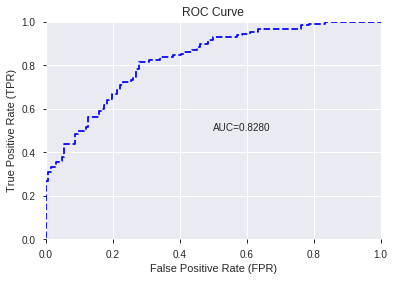

This function is available for GLM models only


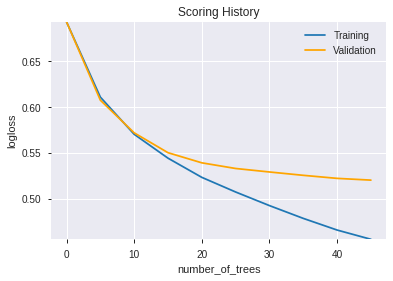

--2019-12-08 07:16:50--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       38
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            

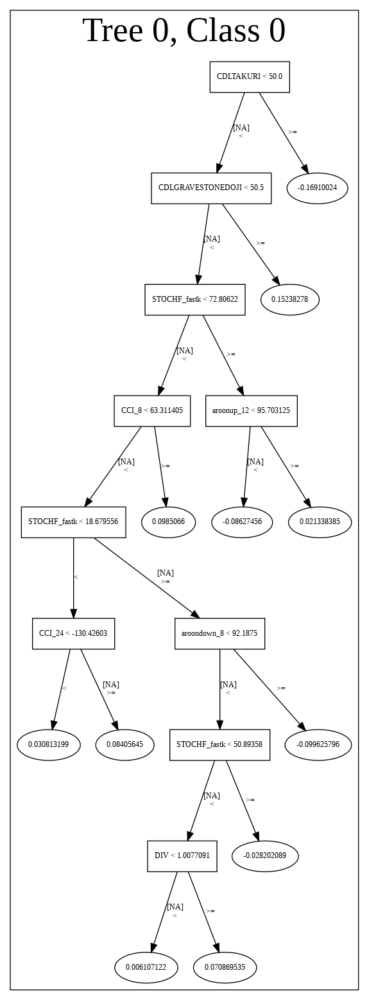

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_071633',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_071633',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_70_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_70_sid_9d28',
   'type': 'Key<

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'WILLR_12',
 'aroondown_8',
 'aroonup_12',
 'ULTOSC',
 'LINEARREG_ANGLE_8',
 'MINUS_DI_8',
 'CCI_20',
 'aroonup_8',
 'CORREL_20',
 'aroondown_12',
 'PLUS_DM_8',
 'ATR_24',
 'PLUS_DI_8',
 'CCI_12',
 'CCI_14',
 'WILLR_14',
 'ADX_8',
 'DIV',
 'STDDEV_12',
 'HT_DCPERIOD',
 'NATR_24',
 'dayofyear',
 'BBANDS_upperband_30_2_5',
 'STOCH_slowd',
 'CCI_24',
 'TRIX_14',
 'PLUS_DI_24',
 'PLUS_DI_14',
 'BOP',
 'TRANGE',
 'CMO_8',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'MACDEXT_hist',
 'STDDEV_8',
 'BETA_8',
 'BETA_20',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_30',
 'KAMA_14',
 'BETA_30']

In [32]:
# GBM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [33]:
# StackedEnsemble with top XGBoost features
model_train(feature_name='XGBF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_071747,0.828022,0.512022,0.231197,0.413405,0.170904
1,XGBoost_1_AutoML_20191208_071747,0.821245,0.522733,0.259341,0.418105,0.174812
2,XGBoost_3_AutoML_20191208_071747,0.820879,0.520957,0.251160,0.417679,0.174456
3,GLM_grid_1_AutoML_20191208_071747_model_1,0.820208,0.509739,0.271734,0.415246,0.172429
4,GBM_1_AutoML_20191208_071747,0.812027,0.523747,0.275824,0.420501,0.176821
5,XGBoost_2_AutoML_20191208_071747,0.810317,0.529390,0.279304,0.422492,0.178499
6,GBM_2_AutoML_20191208_071747,0.809768,0.525014,0.268010,0.421908,0.178007
7,GBM_3_AutoML_20191208_071747,0.806777,0.535463,0.259585,0.424460,0.180166
8,GBM_4_AutoML_20191208_071747,0.796947,0.549184,0.275458,0.430719,0.185519
9,DRF_1_AutoML_20191208_071747,0.761966,0.576451,0.368315,0.446371,0.199247


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,145.580994,1.000000,0.155294
1,CDLGRAVESTONEDOJI,108.555595,0.745671,0.115798
2,CDLDRAGONFLYDOJI,81.996315,0.563235,0.087467
3,STOCHF_fastk,71.688301,0.492429,0.076471
4,WILLR_8,60.390278,0.414823,0.064419
5,CCI_8,54.613792,0.375144,0.058258
6,WILLR_12,41.080276,0.282182,0.043821
7,aroondown_8,24.334927,0.167157,0.025959
8,aroonup_12,23.883734,0.164058,0.025477
9,ULTOSC,20.200752,0.138760,0.021549


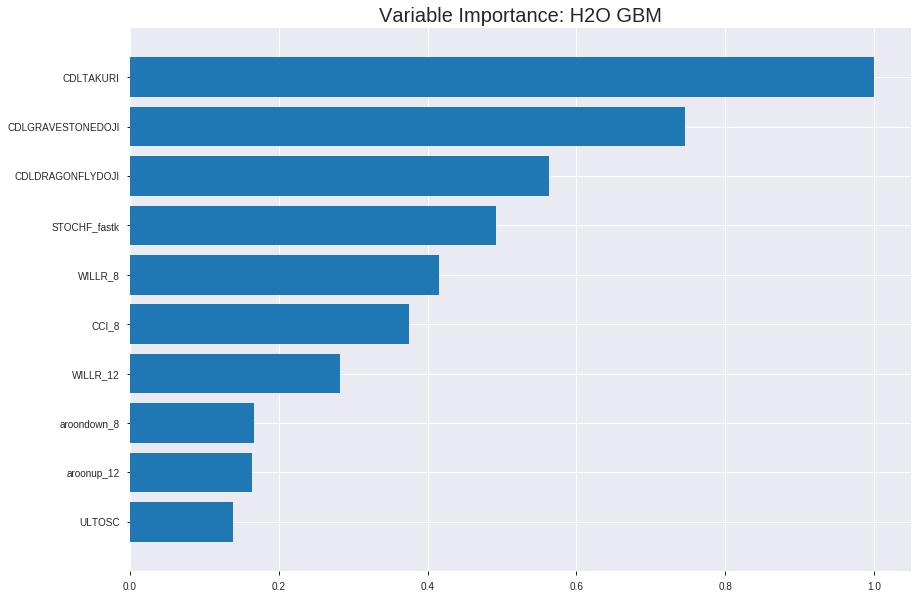

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_071747


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1452183826271542
RMSE: 0.3810752978443423
LogLoss: 0.4558799655517061
Mean Per-Class Error: 0.18976596320346317
AUC: 0.8906957722061889
pr_auc: 0.8835708630502712
Gini: 0.7813915444123778
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4394234368711757: 


,0,1,Error,Rate
0,639.0,252.0,0.2828,(252.0/891.0)
1,98.0,798.0,0.1094,(98.0/896.0)
Total,737.0,1050.0,0.1959,(350.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4394234,0.8201439,229.0
max f2,0.3386200,0.8876589,276.0
max f0point5,0.5910659,0.8324382,157.0
max accuracy,0.4913579,0.8102966,206.0
max precision,0.9414304,1.0,0.0
max recall,0.0843375,1.0,382.0
max specificity,0.9414304,1.0,0.0
max absolute_mcc,0.5502811,0.6231907,177.0
max min_per_class_accuracy,0.5096487,0.8058036,196.0
max mean_per_class_accuracy,0.4913579,0.8102340,206.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9188127,1.9944196,1.9944196,1.0,0.9293947,1.0,0.9293947,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9107902,1.9944196,1.9944196,1.0,0.9145378,1.0,0.9219662,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9016148,1.9944196,1.9944196,1.0,0.9072415,1.0,0.9170580,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8915240,1.8836186,1.9667194,0.9444444,0.8964004,0.9861111,0.9118936,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.8823652,1.8836186,1.9500992,0.9444444,0.8870403,0.9777778,0.9069229,0.0189732,0.0982143,88.3618552,95.0099206
,6,0.1001679,0.8412793,1.8599644,1.9052836,0.9325843,0.8644395,0.9553073,0.8857999,0.0926339,0.1908482,85.9964386,90.5283569
,7,0.1499720,0.7988008,1.8599644,1.8902335,0.9325843,0.8187975,0.9477612,0.8635491,0.0926339,0.2834821,85.9964386,89.0233542
,8,0.2003358,0.7449293,1.8171379,1.8718575,0.9111111,0.7752037,0.9385475,0.8413394,0.0915179,0.375,81.7137897,87.1857542
,9,0.2999440,0.6611909,1.6582815,1.8009312,0.8314607,0.6990153,0.9029851,0.7940750,0.1651786,0.5401786,65.8281501,80.0931170
,10,0.4001119,0.5848360,1.5487393,1.7377950,0.7765363,0.6228756,0.8713287,0.7512153,0.1551339,0.6953125,54.8739276,73.7795017




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17277041760305897
RMSE: 0.4156566102001254
LogLoss: 0.5204800256032004
Mean Per-Class Error: 0.2528685381193434
AUC: 0.8214450069028992
pr_auc: 0.7949266428867974
Gini: 0.6428900138057985
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3598052217437385: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,169.0,342.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3598052,0.7585034,268.0
max f2,0.2482968,0.8513709,319.0
max f0point5,0.6415071,0.7578947,137.0
max accuracy,0.5104579,0.7475538,193.0
max precision,0.9392345,1.0,0.0
max recall,0.0837315,1.0,388.0
max specificity,0.9392345,1.0,0.0
max absolute_mcc,0.5104579,0.4943388,193.0
max min_per_class_accuracy,0.4972020,0.7398374,197.0
max mean_per_class_accuracy,0.5104579,0.7471315,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9066204,2.0772358,2.0772358,1.0,0.9222040,1.0,0.9222040,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8995273,2.0772358,2.0772358,1.0,0.9019689,1.0,0.9130062,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8912461,1.2463415,1.8175813,0.6,0.8950980,0.875,0.9074099,0.0121951,0.0569106,24.6341463,81.7581301
,4,0.0410959,0.8873869,2.0772358,1.8794038,1.0,0.8888962,0.9047619,0.9030019,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8836342,1.6617886,1.8375547,0.8,0.8855030,0.8846154,0.8996367,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8490066,1.9174484,1.8775016,0.9230769,0.8656688,0.9038462,0.8826528,0.0975610,0.1910569,91.7448405,87.7501563
,7,0.1506849,0.8165290,1.6617886,1.8074649,0.8,0.8316610,0.8701299,0.8660970,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7840043,1.6777674,1.7747257,0.8076923,0.8022385,0.8543689,0.8499774,0.0853659,0.3577236,67.7767355,77.4725708
,9,0.3013699,0.6798649,1.5477443,1.6995565,0.7450980,0.7357006,0.8181818,0.8121325,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5680162,1.3440937,1.6111243,0.6470588,0.6268590,0.7756098,0.7660401,0.1341463,0.6463415,34.4093735,61.1124331



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:17:56,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 07:17:56,0.045 sec,5.0,0.4581532,0.6110873,0.8103255,0.7431091,1.8856331,0.2937885,0.4564344,0.6077386,0.8087820,0.6917517,1.7310298,0.2661448
,2019-12-08 07:17:56,0.085 sec,10.0,0.4380936,0.5705154,0.8258672,0.8013783,1.6922348,0.2686066,0.4393337,0.5720949,0.8091272,0.7851532,2.0772358,0.2915851
,2019-12-08 07:17:56,0.128 sec,15.0,0.4256046,0.5444402,0.8356719,0.8223462,1.7728175,0.2462227,0.4293602,0.5504127,0.8152017,0.7926040,1.9288618,0.2837573
,2019-12-08 07:17:56,0.169 sec,20.0,0.4154202,0.5234912,0.8455487,0.8337380,1.9944196,0.2434247,0.4246179,0.5393560,0.8151097,0.7879251,1.9041328,0.3052838
,2019-12-08 07:17:56,0.211 sec,25.0,0.4074470,0.5075143,0.8556642,0.8464581,1.9944196,0.2294348,0.4217595,0.5331840,0.8173109,0.7915927,2.0772358,0.2974560
,2019-12-08 07:17:56,0.253 sec,30.0,0.3999817,0.4926617,0.8662593,0.8573075,1.9944196,0.2210409,0.4197189,0.5293697,0.8194278,0.7910548,1.7310298,0.2544031
,2019-12-08 07:17:56,0.298 sec,35.0,0.3929234,0.4787128,0.8751722,0.8668030,1.9944196,0.2221600,0.4181588,0.5257224,0.8194662,0.7977964,2.0772358,0.2915851
,2019-12-08 07:17:56,0.341 sec,40.0,0.3865025,0.4659829,0.8834363,0.8767568,1.9944196,0.2081701,0.4166647,0.5223963,0.8213376,0.7984113,2.0772358,0.2778865
,2019-12-08 07:17:56,0.383 sec,45.0,0.3810753,0.4558800,0.8906958,0.8835709,1.9944196,0.1958590,0.4156566,0.5204800,0.8214450,0.7949266,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,145.5809937,1.0,0.1552939
CDLGRAVESTONEDOJI,108.5555954,0.7456715,0.1157982
CDLDRAGONFLYDOJI,81.9963150,0.5632350,0.0874670
STOCHF_fastk,71.6883011,0.4924290,0.0764712
WILLR_8,60.3902779,0.4148225,0.0644194
---,---,---,---
STOCH_slowk,4.2052860,0.0288862,0.0044859
MINUS_DM_8,3.3135939,0.0227612,0.0035347
CORREL_30,2.0135589,0.0138312,0.0021479
KAMA_14,1.9164637,0.0131642,0.0020443



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7822878228782287)

('auc', 0.8280219780219781)

('logloss', 0.5120220964185227)

('mean_per_class_error', 0.23119658119658126)

('rmse', 0.41340516460883886)

('mse', 0.17090383012526117)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


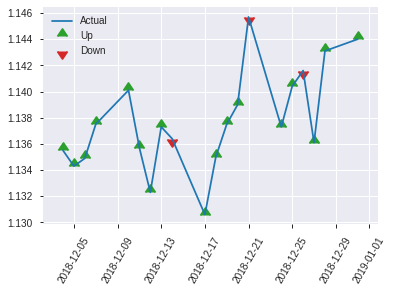


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17090383012526117
RMSE: 0.41340516460883886
LogLoss: 0.5120220964185227
Mean Per-Class Error: 0.23119658119658126
AUC: 0.8280219780219781
pr_auc: 0.8329162606521099
Gini: 0.6560439560439562
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45642792562956436: 


,0,1,Error,Rate
0,91.0,35.0,0.2778,(35.0/126.0)
1,24.0,106.0,0.1846,(24.0/130.0)
Total,115.0,141.0,0.2305,(59.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4564279,0.7822878,140.0
max f2,0.2465982,0.8677686,205.0
max f0point5,0.4564279,0.7636888,140.0
max accuracy,0.4564279,0.7695312,140.0
max precision,0.9220742,1.0,0.0
max recall,0.1155405,1.0,234.0
max specificity,0.9220742,1.0,0.0
max absolute_mcc,0.4564279,0.5403352,140.0
max min_per_class_accuracy,0.5018499,0.7380952,128.0
max mean_per_class_accuracy,0.4564279,0.7688034,140.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9124868,1.9692308,1.9692308,1.0,0.9181161,1.0,0.9181161,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9007695,1.9692308,1.9692308,1.0,0.9072333,1.0,0.9126747,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8961298,1.9692308,1.9692308,1.0,0.8983997,1.0,0.9091059,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8872315,1.9692308,1.9692308,1.0,0.8923984,1.0,0.9045493,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8773614,1.9692308,1.9692308,1.0,0.8835690,1.0,0.9013216,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8406826,1.9692308,1.9692308,1.0,0.8576043,1.0,0.8794630,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7880279,1.8177515,1.9187377,0.9230769,0.8125205,0.9743590,0.8571488,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7260631,1.3633136,1.7798817,0.6923077,0.7594207,0.9038462,0.8327168,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6314414,1.4178462,1.6623377,0.72,0.6773080,0.8441558,0.7822594,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5497797,1.1360947,1.5294996,0.5769231,0.5942579,0.7766990,0.7348027,0.1153846,0.6153846,13.6094675,52.9499627


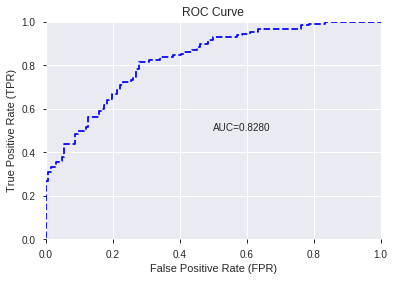

This function is available for GLM models only


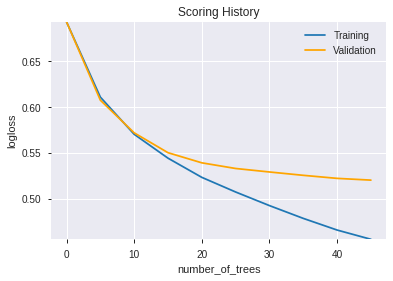

--2019-12-08 07:18:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.1.228
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.1.228|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       38
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            righ

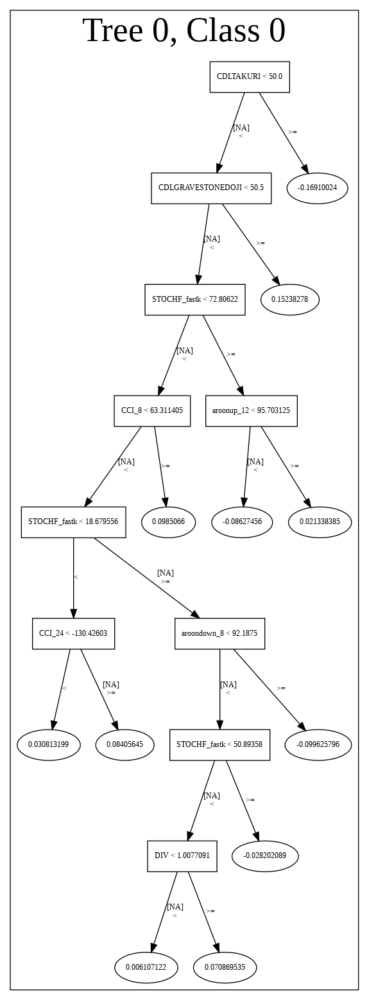

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_071747',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_071747',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_78_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_78_sid_9d28',
   'type': 'Key<

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'WILLR_12',
 'aroondown_8',
 'aroonup_12',
 'ULTOSC',
 'LINEARREG_ANGLE_8',
 'MINUS_DI_8',
 'CCI_20',
 'aroonup_8',
 'CORREL_20',
 'aroondown_12',
 'PLUS_DM_8',
 'ATR_24',
 'PLUS_DI_8',
 'CCI_12',
 'CCI_14',
 'WILLR_14',
 'ADX_8',
 'DIV',
 'STDDEV_12',
 'HT_DCPERIOD',
 'NATR_24',
 'dayofyear',
 'BBANDS_upperband_30_2_5',
 'STOCH_slowd',
 'CCI_24',
 'TRIX_14',
 'PLUS_DI_24',
 'PLUS_DI_14',
 'BOP',
 'TRANGE',
 'CMO_8',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'MACDEXT_hist',
 'STDDEV_8',
 'BETA_8',
 'BETA_20',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_30',
 'KAMA_14',
 'BETA_30']

In [34]:
# All algos with top XGBoost features
model_train(feature_name='XGBF',model_algo=None,features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [36]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [37]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [38]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [39]:
# DRF with top PCA features
model_train(feature_name='PCA',model_algo="DRF",training_frame=training_frame)

[]

In [40]:
# GBM with top PCA features
model_train(feature_name='PCA',model_algo="GBM",training_frame=training_frame)

[]

In [41]:
# StackedEnsemble with top PCA features
model_train(feature_name='PCA',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [42]:
# All algos with top PCA features
model_train(feature_name='PCA',model_algo=None,training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [44]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [45]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [46]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [47]:
# DRF with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DRF",training_frame=training_frame)

[]

In [48]:
# GBM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GBM",training_frame=training_frame)

[]

In [49]:
# StackedEnsemble with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [50]:
# All algos with Generalized Low Rank
model_train(feature_name='GLRM',model_algo=None,training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [52]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [53]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [54]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [55]:
# DRF with low correlation features
model_train(feature_name='HCF',model_algo="DRF",features_list=features_list)

[]

In [56]:
# GBM with low correlation features
model_train(feature_name='HCF',model_algo="GBM",features_list=features_list)

[]

In [57]:
# StackedEnsemble with low correlation features
model_train(feature_name='HCF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [58]:
# All algos with low correlation features
model_train(feature_name='HCF',model_algo=None,features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [60]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [61]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [62]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [63]:
# DRF with Low Variance features
model_train(feature_name='LVF',model_algo="DRF",features_list=features_list)

[]

In [64]:
# GBM with Low Variance features
model_train(feature_name='LVF',model_algo="GBM",features_list=features_list)

[]

In [65]:
# StackedEnsemble with Low Variance features
model_train(feature_name='LVF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [66]:
# All algos with Low Variance features
model_train(feature_name='LVF',model_algo=None,features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [68]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [69]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [70]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [71]:
# DRF with Select k best features
model_train(feature_name='KBest',model_algo="DRF",features_list=features_list)

[]

In [72]:
# GBM with Select k best features
model_train(feature_name='KBest',model_algo="GBM",features_list=features_list)

[]

In [73]:
# StackedEnsemble with Select k best features
model_train(feature_name='KBest',model_algo="StackedEnsemble",features_list=features_list)

[]

In [74]:
# All algos with Select k best features
model_train(feature_name='KBest',model_algo=None,features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [76]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [77]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [78]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [79]:
# DRF with Select Percentile features
model_train(feature_name='Percentile',model_algo="DRF",features_list=features_list)

[]

In [80]:
# GBM with Select Percentile features
model_train(feature_name='Percentile',model_algo="GBM",features_list=features_list)

[]

In [81]:
# StackedEnsemble with Select Percentile features
model_train(feature_name='Percentile',model_algo="StackedEnsemble",features_list=features_list)

[]

In [82]:
# All algos with Select Percentile features
model_train(feature_name='Percentile',model_algo=None,features_list=features_list)

[]

In [83]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [829] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


17

['MINUS_DI_8',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'ULTOSC',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLTAKURI']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20191208_071902,0.804396,0.543880,0.287118,0.429668,0.184615
1,DeepLearning_grid_1_AutoML_20191208_071902_model_6,0.793101,0.531537,0.303236,0.426244,0.181684
2,DeepLearning_grid_1_AutoML_20191208_071902_model_9,0.792063,0.540450,0.315507,0.430139,0.185020
3,DeepLearning_grid_1_AutoML_20191208_071902_model_5,0.791941,0.536038,0.331868,0.428528,0.183636
4,DeepLearning_grid_1_AutoML_20191208_071902_model_2,0.791209,0.567738,0.332357,0.440715,0.194229
5,DeepLearning_grid_1_AutoML_20191208_071902_model_8,0.786569,0.534739,0.319597,0.429585,0.184544
6,DeepLearning_grid_1_AutoML_20191208_071902_model_1,0.781258,0.573913,0.340537,0.433937,0.188301
7,DeepLearning_grid_1_AutoML_20191208_071902_model_3,0.776984,0.553707,0.344017,0.434710,0.188973
8,DeepLearning_grid_1_AutoML_20191208_071902_model_4,0.767155,0.561136,0.376740,0.439450,0.193116
9,DeepLearning_grid_1_AutoML_20191208_071902_model_7,0.741880,0.582347,0.360745,0.451607,0.203949


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,1.000000,1.000000,0.093743
1,CDLCLOSINGMARUBOZU,0.811389,0.811389,0.076062
2,CDLINVERTEDHAMMER,0.768646,0.768646,0.072055
3,STOCHF_fastd,0.768063,0.768063,0.072000
4,CDLSHOOTINGSTAR,0.735142,0.735142,0.068914
5,WILLR_12,0.642958,0.642958,0.060273
6,STOCHF_fastk,0.632430,0.632430,0.059286
7,CDLGRAVESTONEDOJI,0.611402,0.611402,0.057315
8,MINUS_DI_8,0.603305,0.603305,0.056555
9,WILLR_8,0.596321,0.596321,0.055901


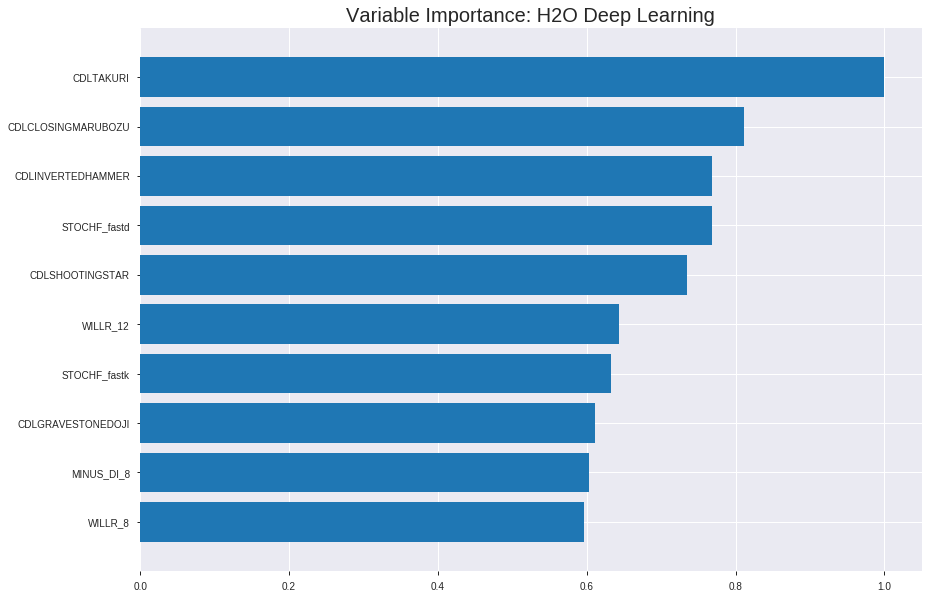

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20191208_071902


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1999312532980254
RMSE: 0.44713672774446234
LogLoss: 0.5820131446178972
Mean Per-Class Error: 0.30403426627384955
AUC: 0.7712041045374378
pr_auc: 0.7587650843205638
Gini: 0.5424082090748756
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27057532286573127: 


,0,1,Error,Rate
0,401.0,490.0,0.5499,(490.0/891.0)
1,90.0,806.0,0.1004,(90.0/896.0)
Total,491.0,1296.0,0.3246,(580.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2705753,0.7354015,290.0
max f2,0.1370664,0.8553655,348.0
max f0point5,0.5104229,0.6988771,161.0
max accuracy,0.3738676,0.6961388,237.0
max precision,0.9742718,1.0,0.0
max recall,0.0127723,1.0,396.0
max specificity,0.9742718,1.0,0.0
max absolute_mcc,0.3256549,0.3960976,262.0
max min_per_class_accuracy,0.4114540,0.6897321,217.0
max mean_per_class_accuracy,0.3738676,0.6959657,237.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 42.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9163903,1.7728175,1.7728175,0.8888889,0.9393618,0.8888889,0.9393618,0.0178571,0.0178571,77.2817460,77.2817460
,2,0.0201455,0.8951954,1.9944196,1.8836186,1.0,0.9047653,0.9444444,0.9220635,0.0200893,0.0379464,99.4419643,88.3618552
,3,0.0302182,0.8688092,1.9944196,1.9205522,1.0,0.8826031,0.9629630,0.9089101,0.0200893,0.0580357,99.4419643,92.0552249
,4,0.0402910,0.8571835,1.4404142,1.8005177,0.7222222,0.8621643,0.9027778,0.8972236,0.0145089,0.0725446,44.0414187,80.0517733
,5,0.0503637,0.8474551,1.7728175,1.7949777,0.8888889,0.8523189,0.9,0.8882427,0.0178571,0.0904018,77.2817460,79.4977679
,6,0.1001679,0.7769668,1.7255091,1.7604375,0.8651685,0.8110462,0.8826816,0.8498601,0.0859375,0.1763393,72.5509129,76.0437450
,7,0.1499720,0.7187216,1.6582815,1.7265125,0.8314607,0.7472120,0.8656716,0.8157717,0.0825893,0.2589286,65.8281501,72.6512527
,8,0.2003358,0.6575855,1.3074529,1.6211623,0.6555556,0.6881033,0.8128492,0.7836763,0.0658482,0.3247768,30.7452877,62.1162335
,9,0.2999440,0.5525235,1.3669618,1.5367450,0.6853933,0.6019519,0.7705224,0.7233275,0.1361607,0.4609375,36.6961778,53.6744986
,10,0.4001119,0.4731647,1.2256210,1.4588552,0.6145251,0.5088239,0.7314685,0.6696266,0.1227679,0.5837054,22.5621010,45.8855207




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19081212094924388
RMSE: 0.43682046764001786
LogLoss: 0.5661939441968505
Mean Per-Class Error: 0.28087129927903054
AUC: 0.7817379966252492
pr_auc: 0.7513744519280817
Gini: 0.5634759932504985
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43446633381161404: 


,0,1,Error,Rate
0,170.0,95.0,0.3585,(95.0/265.0)
1,50.0,196.0,0.2033,(50.0/246.0)
Total,220.0,291.0,0.2838,(145.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4344663,0.7299814,230.0
max f2,0.1213935,0.8420685,356.0
max f0point5,0.5132030,0.7130435,184.0
max accuracy,0.5132030,0.7181996,184.0
max precision,0.9744362,1.0,0.0
max recall,0.0161346,1.0,394.0
max specificity,0.9744362,1.0,0.0
max absolute_mcc,0.4344663,0.4422440,230.0
max min_per_class_accuracy,0.4786924,0.7094340,204.0
max mean_per_class_accuracy,0.4344663,0.7191287,230.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 46.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9145116,1.7310298,1.7310298,0.8333333,0.9458692,0.8333333,0.9458692,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.8926937,1.6617886,1.6995565,0.8,0.9054630,0.8181818,0.9275027,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.8694647,1.6617886,1.6877541,0.8,0.8782981,0.8125,0.9121263,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.8628735,2.0772358,1.7804878,1.0,0.8654259,0.8571429,0.9010071,0.0203252,0.0731707,107.7235772,78.0487805
,5,0.0508806,0.8468242,1.6617886,1.7576610,0.8,0.8560827,0.8461538,0.8923678,0.0162602,0.0894309,66.1788618,75.7661038
,6,0.1017613,0.7962845,1.9174484,1.8375547,0.9230769,0.8188047,0.8846154,0.8555863,0.0975610,0.1869919,91.7448405,83.7554722
,7,0.1506849,0.7577696,1.8279675,1.8344420,0.88,0.7782986,0.8831169,0.8304929,0.0894309,0.2764228,82.7967480,83.4441981
,8,0.2015656,0.7091902,1.3581926,1.7142237,0.6538462,0.7351050,0.8252427,0.8064144,0.0691057,0.3455285,35.8192620,71.4223696
,9,0.3013699,0.6199425,1.3440937,1.5916482,0.6470588,0.6549069,0.7662338,0.7562398,0.1341463,0.4796748,34.4093735,59.1648189
,10,0.4011742,0.5426001,1.2626335,1.5097958,0.6078431,0.5766046,0.7268293,0.7115501,0.1260163,0.6056911,26.2633509,50.9795756



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:19:02,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:19:02,0.042 sec,137461 obs/sec,1.0,1,1787.0,0.4663570,0.6766382,0.1300378,0.7280901,0.6895456,1.3296131,0.3391158,0.4668385,0.6782800,0.1270404,0.7499847,0.6960408,1.3848238,0.3542074
,2019-12-08 07:19:02,0.152 sec,163944 obs/sec,10.0,10,17870.0,0.4471367,0.5820131,0.2002687,0.7712041,0.7587651,1.7728175,0.3245663,0.4368205,0.5661939,0.2356949,0.7817380,0.7513745,1.7310298,0.2837573


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,1.0,1.0,0.0937428
CDLCLOSINGMARUBOZU,0.8113887,0.8113887,0.0760618
CDLINVERTEDHAMMER,0.7686464,0.7686464,0.0720550
STOCHF_fastd,0.7680632,0.7680632,0.0720004
CDLSHOOTINGSTAR,0.7351424,0.7351424,0.0689143
WILLR_12,0.6429585,0.6429585,0.0602727
STOCHF_fastk,0.6324303,0.6324303,0.0592858
CDLGRAVESTONEDOJI,0.6114022,0.6114022,0.0573145
MINUS_DI_8,0.6033045,0.6033045,0.0565554
WILLR_8,0.5963209,0.5963209,0.0559008


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7491408934707904)

('auc', 0.8043956043956043)

('logloss', 0.5438804203492824)

('mean_per_class_error', 0.27264957264957257)

('rmse', 0.4296681157592161)

('mse', 0.1846146897000751)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


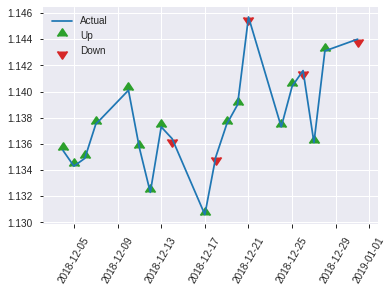


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1846146897000751
RMSE: 0.4296681157592161
LogLoss: 0.5438804203492824
Mean Per-Class Error: 0.27264957264957257
AUC: 0.8043956043956043
pr_auc: 0.8228373050985588
Gini: 0.6087912087912086
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36400129718916907: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,21.0,109.0,0.1615,(21.0/130.0)
Total,95.0,161.0,0.2852,(73.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3640013,0.7491409,160.0
max f2,0.1360804,0.8611482,228.0
max f0point5,0.5499331,0.7511211,78.0
max accuracy,0.4383904,0.7265625,115.0
max precision,0.9605297,1.0,0.0
max recall,0.0337975,1.0,247.0
max specificity,0.9605297,1.0,0.0
max absolute_mcc,0.4383904,0.4566566,115.0
max min_per_class_accuracy,0.4238353,0.7142857,128.0
max mean_per_class_accuracy,0.4383904,0.7273504,115.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 43.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9170841,1.9692308,1.9692308,1.0,0.9419491,1.0,0.9419491,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8800283,1.9692308,1.9692308,1.0,0.8941908,1.0,0.9180700,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8643211,1.9692308,1.9692308,1.0,0.8731744,1.0,0.9068461,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8531705,1.9692308,1.9692308,1.0,0.8570162,1.0,0.8932561,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8395000,1.9692308,1.9692308,1.0,0.8488897,1.0,0.8864305,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.7762807,1.9692308,1.9692308,1.0,0.8151806,1.0,0.8508055,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.6829186,1.9692308,1.9692308,1.0,0.7406329,1.0,0.8140813,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.6263422,1.3633136,1.8177515,0.6923077,0.6538715,0.9230769,0.7740289,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.5506053,1.3390769,1.6623377,0.68,0.5860383,0.8441558,0.7129930,0.1307692,0.5,33.9076923,66.2337662
,10,0.4023438,0.4624098,0.9846154,1.4912621,0.5,0.5090790,0.7572816,0.6615195,0.1,0.6,-1.5384615,49.1262136


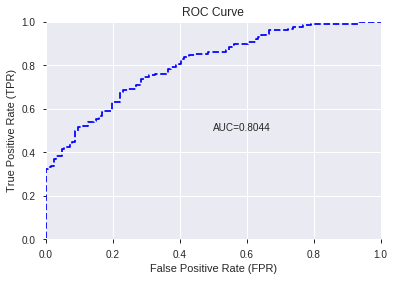

This function is available for GLM models only


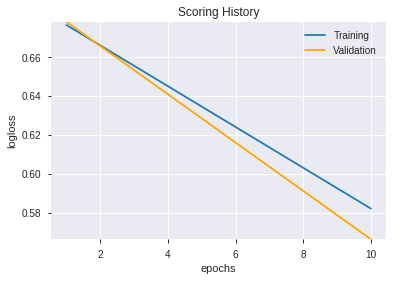

--2019-12-08 07:25:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.112.235
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.112.235|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


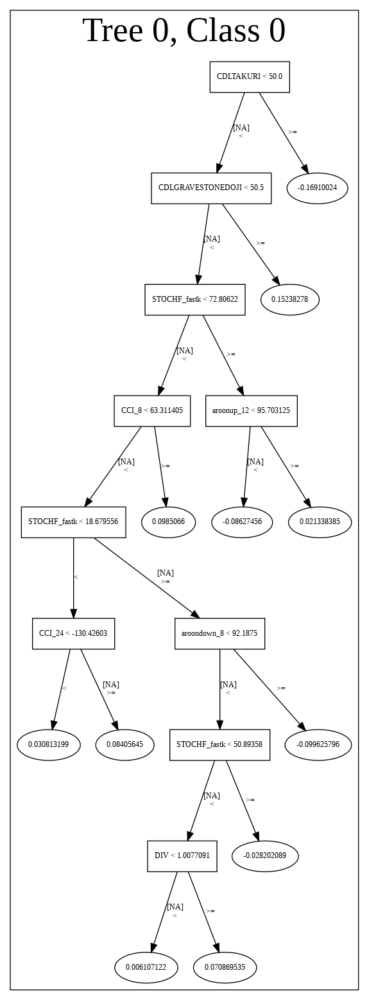

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20191208_071902',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20191208_071902',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_83_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_83_sid_9d28'

['CDLTAKURI',
 'CDLCLOSINGMARUBOZU',
 'CDLINVERTEDHAMMER',
 'STOCHF_fastd',
 'CDLSHOOTINGSTAR',
 'WILLR_12',
 'STOCHF_fastk',
 'CDLGRAVESTONEDOJI',
 'MINUS_DI_8',
 'WILLR_8',
 'STOCH_slowk',
 'CDLDRAGONFLYDOJI',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'ULTOSC',
 'CDLHANGINGMAN',
 'PLUS_DI_8']

In [84]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_072623_model_1,0.800122,0.536323,0.303846,0.428153,0.183315


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.651133,1.000000,0.175063
1,CDLDRAGONFLYDOJI,0.537906,0.826108,0.144621
2,STOCHF_fastk,0.479270,0.736056,0.128856
3,PLUS_DI_8,0.399239,0.613146,0.107339
4,WILLR_8,0.304940,0.468323,0.081986
5,WILLR_12,0.291749,0.448063,0.078439
6,MINUS_DI_8,0.246252,0.378190,0.066207
7,ULTOSC,0.182282,0.279946,0.049008
8,CDLTAKURI,0.169446,0.260233,0.045557
9,CDLHANGINGMAN,0.100203,0.153890,0.026940


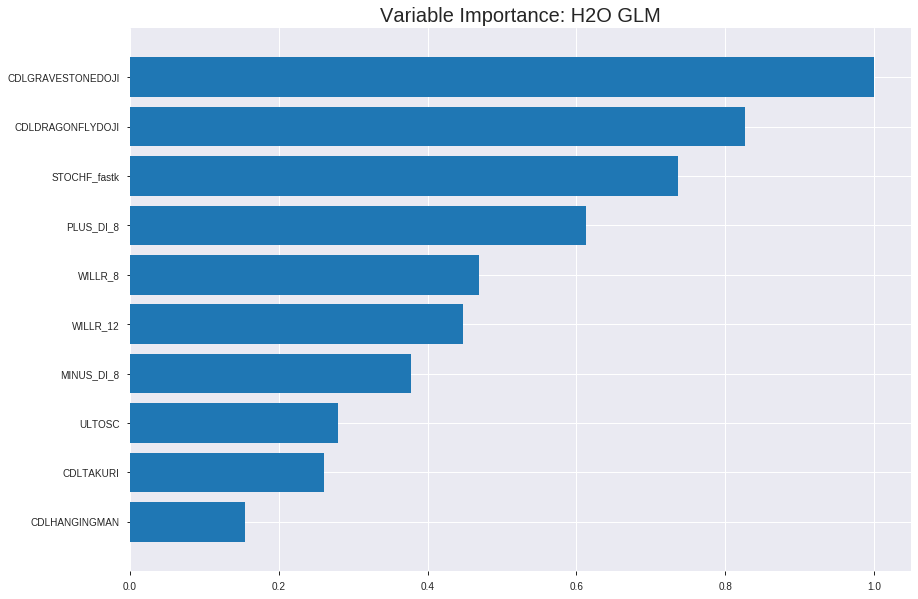

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_072623_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19660620500267043
RMSE: 0.44340298262717
LogLoss: 0.5735790078876001
Null degrees of freedom: 1786
Residual degrees of freedom: 1769
Null deviance: 2477.294033375749
Residual deviance: 2049.971374190283
AIC: 2085.971374190283
AUC: 0.7620795003607503
pr_auc: 0.7502495140226577
Gini: 0.5241590007215007
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4229164584175424: 


,0,1,Error,Rate
0,404.0,487.0,0.5466,(487.0/891.0)
1,108.0,788.0,0.1205,(108.0/896.0)
Total,512.0,1275.0,0.333,(595.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4229165,0.7259327,257.0
max f2,0.3129811,0.8564996,312.0
max f0point5,0.5362049,0.6985670,179.0
max accuracy,0.5362049,0.6883044,179.0
max precision,0.9715117,1.0,0.0
max recall,0.0185214,1.0,394.0
max specificity,0.9715117,1.0,0.0
max absolute_mcc,0.5362049,0.3818001,179.0
max min_per_class_accuracy,0.5067810,0.6846240,200.0
max mean_per_class_accuracy,0.5362049,0.6885259,179.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9518641,1.7728175,1.7728175,0.8888889,0.9585353,0.8888889,0.9585353,0.0178571,0.0178571,77.2817460,77.2817460
,2,0.0201455,0.9392760,1.6620164,1.7174169,0.8333333,0.9461015,0.8611111,0.9523184,0.0167411,0.0345982,66.2016369,71.7416915
,3,0.0302182,0.9285292,1.7728175,1.7358838,0.8888889,0.9331691,0.8703704,0.9459353,0.0178571,0.0524554,77.2817460,73.5883763
,4,0.0402910,0.9194311,1.7728175,1.7451172,0.8888889,0.9237415,0.875,0.9403868,0.0178571,0.0703125,77.2817460,74.5117188
,5,0.0503637,0.9103958,1.9944196,1.7949777,1.0,0.9139110,0.9,0.9350917,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8505142,1.8151460,1.8050055,0.9101124,0.8852209,0.9050279,0.9102956,0.0904018,0.1808036,81.5145967,80.5005487
,7,0.1499720,0.6992555,1.5238262,1.7116288,0.7640449,0.7624484,0.8582090,0.8611971,0.0758929,0.2566964,52.3826244,71.1628798
,8,0.2003358,0.6487284,1.3960937,1.6323043,0.7,0.6722742,0.8184358,0.8137025,0.0703125,0.3270089,39.6093750,63.2304345
,9,0.2999440,0.5863765,1.2997341,1.5218613,0.6516854,0.6163972,0.7630597,0.7481795,0.1294643,0.4564732,29.9734149,52.1861257
,10,0.4001119,0.5422185,1.2144790,1.4449082,0.6089385,0.5631074,0.7244755,0.7018467,0.1216518,0.578125,21.4479000,44.4908217




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19081348626170783
RMSE: 0.43682203042166706
LogLoss: 0.5557420354946759
Null degrees of freedom: 510
Residual degrees of freedom: 493
Null deviance: 708.5067427497436
Residual deviance: 567.9683602755589
AIC: 603.9683602755589
AUC: 0.7912409878815769
pr_auc: 0.7876542914243245
Gini: 0.5824819757631539
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46151898575381356: 


,0,1,Error,Rate
0,129.0,136.0,0.5132,(136.0/265.0)
1,26.0,220.0,0.1057,(26.0/246.0)
Total,155.0,356.0,0.317,(162.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4615190,0.7308970,264.0
max f2,0.1270845,0.8426184,347.0
max f0point5,0.5845006,0.7117117,171.0
max accuracy,0.5439195,0.7221135,206.0
max precision,0.9742009,1.0,0.0
max recall,0.0378364,1.0,393.0
max specificity,0.9742009,1.0,0.0
max absolute_mcc,0.5393899,0.4484055,209.0
max min_per_class_accuracy,0.5564761,0.7132075,195.0
max mean_per_class_accuracy,0.5393899,0.7237690,209.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9515497,2.0772358,2.0772358,1.0,0.9616576,1.0,0.9616576,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9455249,2.0772358,2.0772358,1.0,0.9482198,1.0,0.9555495,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9384401,2.0772358,2.0772358,1.0,0.9411699,1.0,0.9510559,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9329461,2.0772358,2.0772358,1.0,0.9348659,1.0,0.9472012,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9289602,2.0772358,2.0772358,1.0,0.9314363,1.0,0.9441694,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8967363,1.9174484,1.9973421,0.9230769,0.9125326,0.9615385,0.9283510,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.8291616,1.8279675,1.9423503,0.88,0.8740980,0.9350649,0.9107364,0.0894309,0.2926829,82.7967480,94.2350333
,8,0.2015656,0.7196611,1.1984053,1.7545584,0.5769231,0.7742370,0.8446602,0.8762802,0.0609756,0.3536585,19.8405253,75.4558371
,9,0.3013699,0.6325835,1.2219034,1.5781596,0.5882353,0.6655461,0.7597403,0.8064917,0.1219512,0.4756098,22.1903396,57.8159645
,10,0.4011742,0.5902454,1.3440937,1.5199286,0.6470588,0.6129140,0.7317073,0.7583333,0.1341463,0.6097561,34.4093735,51.9928614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:26:23,0.000 sec,2,.15E2,18,1.3705000,1.3685180
,2019-12-08 07:26:23,0.004 sec,4,.96E1,18,1.3619330,1.3587170
,2019-12-08 07:26:23,0.007 sec,6,.6E1,18,1.3495477,1.3445004
,2019-12-08 07:26:23,0.011 sec,8,.37E1,18,1.3325683,1.3249252
,2019-12-08 07:26:23,0.013 sec,10,.23E1,18,1.3108649,1.2997694
---,---,---,---,---,---,---,---
,2019-12-08 07:26:23,0.050 sec,40,.11E-2,18,1.1469477,1.1115711
,2019-12-08 07:26:23,0.052 sec,41,.7E-3,18,1.1468217,1.1116714
,2019-12-08 07:26:23,0.053 sec,42,.43E-3,18,1.1467495,1.1117672
,2019-12-08 07:26:23,0.055 sec,43,.27E-3,18,1.1467110,1.1118472



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7508090614886731)

('auc', 0.8001221001221002)

('logloss', 0.5363229170983967)

('mean_per_class_error', 0.2638583638583638)

('rmse', 0.4281530963345878)

('mse', 0.18331507390089485)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


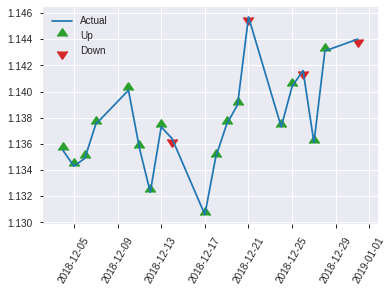


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18331507390089485
RMSE: 0.4281530963345878
LogLoss: 0.5363229170983967
Null degrees of freedom: 255
Residual degrees of freedom: 238
Null deviance: 354.87097666550244
Residual deviance: 274.59733355437913
AIC: 310.59733355437913
AUC: 0.8001221001221002
pr_auc: 0.8171579465828352
Gini: 0.6002442002442003
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4451068186055771: 


,0,1,Error,Rate
0,63.0,63.0,0.5,(63.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,77.0,179.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4451068,0.7508091,178.0
max f2,0.3016795,0.8622995,227.0
max f0point5,0.5549622,0.7641509,99.0
max accuracy,0.5549622,0.734375,99.0
max precision,0.9644670,1.0,0.0
max recall,0.0651923,1.0,246.0
max specificity,0.9644670,1.0,0.0
max absolute_mcc,0.5549622,0.4839463,99.0
max min_per_class_accuracy,0.5182426,0.7,126.0
max mean_per_class_accuracy,0.5549622,0.7361416,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9562114,1.9692308,1.9692308,1.0,0.9618125,1.0,0.9618125,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9488604,1.9692308,1.9692308,1.0,0.9512172,1.0,0.9565149,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9387755,1.9692308,1.9692308,1.0,0.9443869,1.0,0.9534829,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9322645,1.9692308,1.9692308,1.0,0.9346384,1.0,0.9483435,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9285843,1.9692308,1.9692308,1.0,0.9305958,1.0,0.9456130,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8714818,1.9692308,1.9692308,1.0,0.8965564,1.0,0.9210847,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7449633,1.8177515,1.9187377,0.9230769,0.8230672,0.9743590,0.8884122,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6686081,1.3633136,1.7798817,0.6923077,0.6949107,0.9038462,0.8400368,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5946357,1.3390769,1.6367632,0.68,0.6250822,0.8311688,0.7702464,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5514821,1.3633136,1.5677371,0.6923077,0.5675973,0.7961165,0.7190922,0.1384615,0.6307692,36.3313609,56.7737117


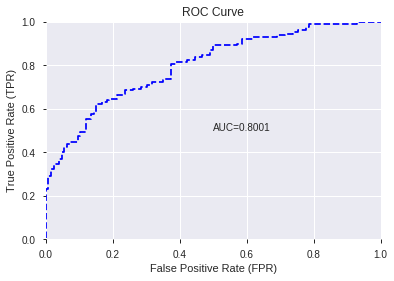

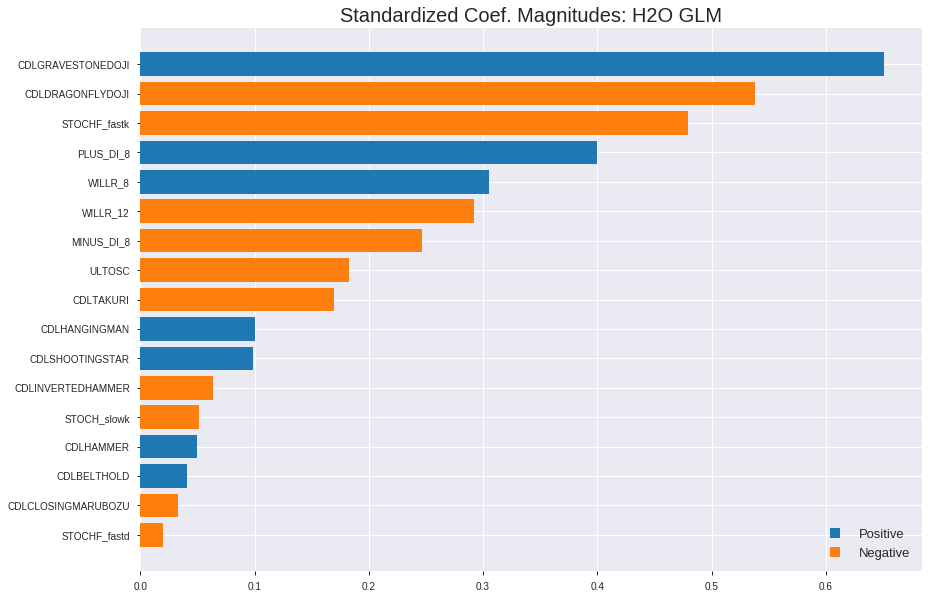

'log_likelihood'
--2019-12-08 07:26:31--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.186.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.186.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


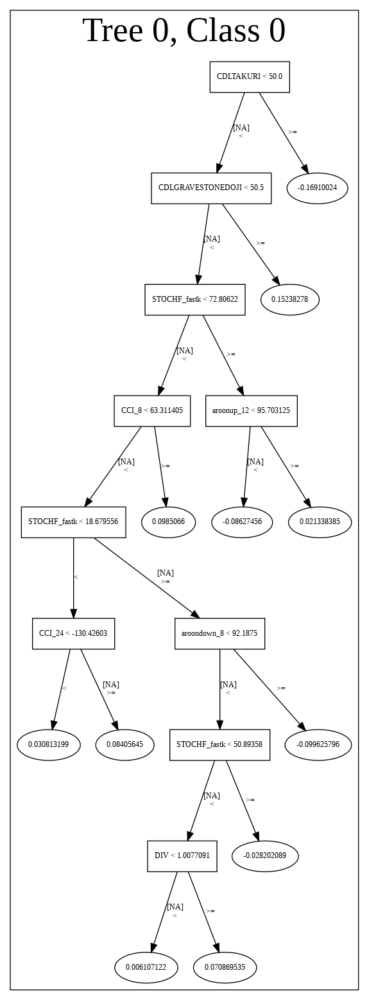

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_072623_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_072623_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_88_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_88_s

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'MINUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'STOCH_slowk',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastd']

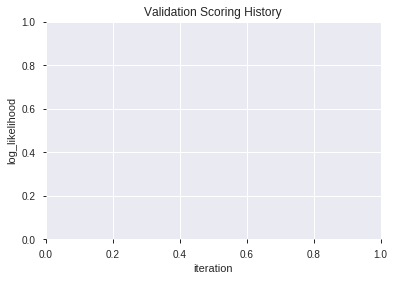

In [85]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_072728_model_6,0.798291,0.531790,0.284005,0.425833,0.181333
1,XGBoost_grid_1_AutoML_20191208_072728_model_3,0.794383,0.537571,0.295665,0.428081,0.183253
2,XGBoost_grid_1_AutoML_20191208_072728_model_1,0.789927,0.540850,0.311050,0.430301,0.185159
3,XGBoost_grid_1_AutoML_20191208_072728_model_4,0.788400,0.550442,0.299756,0.432627,0.187166
4,XGBoost_3_AutoML_20191208_072728,0.787546,0.542821,0.336203,0.430674,0.185480
5,XGBoost_2_AutoML_20191208_072728,0.786691,0.545744,0.303602,0.431690,0.186356
6,XGBoost_grid_1_AutoML_20191208_072728_model_2,0.786630,0.546874,0.315751,0.432339,0.186917
7,XGBoost_grid_1_AutoML_20191208_072728_model_7,0.771856,0.559885,0.348230,0.439343,0.193023
8,XGBoost_grid_1_AutoML_20191208_072728_model_5,0.771429,0.566076,0.318620,0.444036,0.197168
9,XGBoost_1_AutoML_20191208_072728,0.767033,0.566873,0.356044,0.442399,0.195717


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,853.794067,1.000000,0.110414
1,PLUS_DI_8,846.876282,0.991898,0.109520
2,STOCHF_fastk,810.510376,0.949304,0.104817
3,ULTOSC,809.185547,0.947753,0.104645
4,MINUS_DI_8,784.437134,0.918766,0.101445
5,CDLDRAGONFLYDOJI,766.403992,0.897645,0.099113
6,WILLR_12,760.650696,0.890907,0.098369
7,WILLR_8,653.228027,0.765089,0.084477
8,STOCH_slowk,640.839966,0.750579,0.082875
9,CDLTAKURI,638.538025,0.747883,0.082577


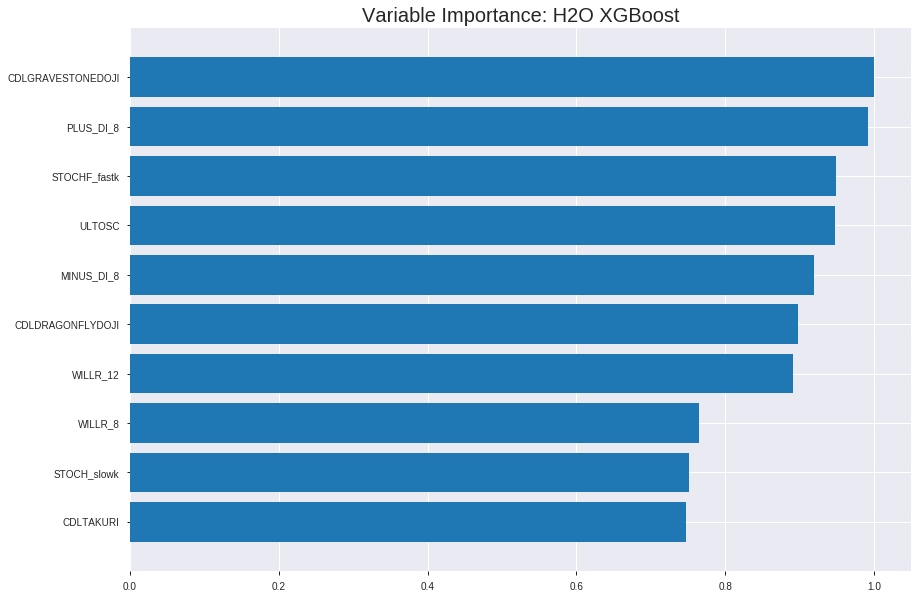

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_072728_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16268963414951162
RMSE: 0.4033480310470247
LogLoss: 0.4928307591580402
Mean Per-Class Error: 0.2282798220298221
AUC: 0.8571829405162739
pr_auc: 0.8562673507402657
Gini: 0.7143658810325477
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45489906271298725: 


,0,1,Error,Rate
0,608.0,283.0,0.3176,(283.0/891.0)
1,144.0,752.0,0.1607,(144.0/896.0)
Total,752.0,1035.0,0.2389,(427.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4548991,0.7788711,220.0
max f2,0.3057667,0.8780971,299.0
max f0point5,0.5457663,0.7868020,169.0
max accuracy,0.5072601,0.7716844,189.0
max precision,0.9325550,1.0,0.0
max recall,0.1392551,1.0,356.0
max specificity,0.9325550,1.0,0.0
max absolute_mcc,0.5072601,0.5435956,189.0
max min_per_class_accuracy,0.5004028,0.7676768,193.0
max mean_per_class_accuracy,0.5072601,0.7717202,189.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9176781,1.9944196,1.9944196,1.0,0.9247716,1.0,0.9247716,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9032960,1.9944196,1.9944196,1.0,0.9102649,1.0,0.9175182,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8960737,1.9944196,1.9944196,1.0,0.8995386,1.0,0.9115250,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8894988,1.9944196,1.9944196,1.0,0.8932476,1.0,0.9069557,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8806649,1.9944196,1.9944196,1.0,0.8843051,1.0,0.9024256,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8280855,1.9496012,1.9721356,0.9775281,0.8577429,0.9888268,0.8802090,0.0970982,0.1975446,94.9601224,97.2135625
,7,0.1499720,0.7503627,1.7703275,1.9051173,0.8876404,0.7867895,0.9552239,0.8491854,0.0881696,0.2857143,77.0327548,90.5117271
,8,0.2003358,0.7007910,1.6620164,1.8440025,0.8333333,0.7240705,0.9245810,0.8177319,0.0837054,0.3694196,66.2016369,84.4002519
,9,0.2999440,0.6233167,1.5462355,1.7451172,0.7752809,0.6580122,0.875,0.7646907,0.1540179,0.5234375,54.6235453,74.5117188
,10,0.4001119,0.5567459,1.3147571,1.6373767,0.6592179,0.5879402,0.8209790,0.7204412,0.1316964,0.6551339,31.4757083,63.7376686




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.18869657574437834
RMSE: 0.4343921911641349
LogLoss: 0.5567656741957819
Mean Per-Class Error: 0.2715984046632919
AUC: 0.7952293296517872
pr_auc: 0.7743580499096658
Gini: 0.5904586593035743
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47079598903656006: 


,0,1,Error,Rate
0,158.0,107.0,0.4038,(107.0/265.0)
1,41.0,205.0,0.1667,(41.0/246.0)
Total,199.0,312.0,0.2896,(148.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4707960,0.7347670,244.0
max f2,0.3155800,0.8469751,325.0
max f0point5,0.6503665,0.7330097,150.0
max accuracy,0.6000571,0.7299413,178.0
max precision,0.9320232,1.0,0.0
max recall,0.0669960,1.0,391.0
max specificity,0.9320232,1.0,0.0
max absolute_mcc,0.6000571,0.4587780,178.0
max min_per_class_accuracy,0.5745032,0.7073171,193.0
max mean_per_class_accuracy,0.6000571,0.7284016,178.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9216251,1.7310298,1.7310298,0.8333333,0.9264549,0.8333333,0.9264549,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9160556,1.6617886,1.6995565,0.8,0.9187374,0.8181818,0.9229469,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9069054,2.0772358,1.8175813,1.0,0.9122182,0.875,0.9195942,0.0203252,0.0569106,107.7235772,81.7581301
,4,0.0410959,0.9008962,2.0772358,1.8794038,1.0,0.9029246,0.9047619,0.9156252,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8972335,2.0772358,1.9174484,1.0,0.8987998,0.9230769,0.9123896,0.0203252,0.0975610,107.7235772,91.7448405
,6,0.1017613,0.8687868,1.9973421,1.9573952,0.9615385,0.8836460,0.9423077,0.8980178,0.1016260,0.1991870,99.7342089,95.7395247
,7,0.1506849,0.8361443,1.6617886,1.8614191,0.8,0.8529014,0.8961039,0.8833696,0.0813008,0.2804878,66.1788618,86.1419069
,8,0.2015656,0.7911620,1.6777674,1.8150604,0.8076923,0.8168988,0.8737864,0.8665906,0.0853659,0.3658537,67.7767355,81.5060384
,9,0.3013699,0.6964100,1.1811733,1.6051367,0.5686275,0.7309462,0.7727273,0.8216694,0.1178862,0.4837398,18.1173282,60.5136733
,10,0.4011742,0.6392134,1.4255540,1.5604600,0.6862745,0.6681986,0.7512195,0.7834889,0.1422764,0.6260163,42.5553961,56.0460044



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:27:35,4.618 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 07:27:35,4.659 sec,5.0,0.4769365,0.6476667,0.7912070,0.7618556,1.9320940,0.3128148,0.4764478,0.6467230,0.7736156,0.7200422,1.5978737,0.3346380
,2019-12-08 07:27:35,4.689 sec,10.0,0.4608509,0.6158778,0.8022268,0.8036072,1.9944196,0.3021824,0.4628572,0.6196626,0.7732781,0.7530982,1.4837398,0.2739726
,2019-12-08 07:27:35,4.719 sec,15.0,0.4493619,0.5924072,0.8082900,0.8099088,1.9944196,0.2909905,0.4525313,0.5984704,0.7843304,0.7615133,1.3848238,0.2818004
,2019-12-08 07:27:35,4.747 sec,20.0,0.4413795,0.5752669,0.8116858,0.8143331,1.9944196,0.3021824,0.4457892,0.5838886,0.7877052,0.7657686,1.3848238,0.2935421
,2019-12-08 07:27:35,4.776 sec,25.0,0.4345892,0.5606928,0.8159422,0.8188677,1.9944196,0.2949077,0.4416274,0.5747026,0.7902056,0.7711460,1.3848238,0.2720157
,2019-12-08 07:27:35,4.804 sec,30.0,0.4294272,0.5490233,0.8199129,0.8225808,1.9944196,0.2825965,0.4391761,0.5688755,0.7919850,0.7747287,2.0772358,0.2720157
,2019-12-08 07:27:35,4.834 sec,35.0,0.4251409,0.5393989,0.8257025,0.8274905,1.9944196,0.2758814,0.4371821,0.5640351,0.7945927,0.7775801,2.0772358,0.3091977
,2019-12-08 07:27:35,4.865 sec,40.0,0.4208255,0.5300474,0.8314889,0.8332439,1.9944196,0.2585339,0.4358979,0.5608868,0.7945774,0.7745126,1.7310298,0.3131115
,2019-12-08 07:27:36,4.899 sec,45.0,0.4170155,0.5217969,0.8374294,0.8399717,1.9944196,0.2607722,0.4353020,0.5594220,0.7938411,0.7742461,1.7310298,0.3072407


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,853.7940674,1.0,0.1104144
PLUS_DI_8,846.8762817,0.9918976,0.1095197
STOCHF_fastk,810.5103760,0.9493043,0.1048168
ULTOSC,809.1855469,0.9477526,0.1046455
MINUS_DI_8,784.4371338,0.9187662,0.1014450
CDLDRAGONFLYDOJI,766.4039917,0.8976450,0.0991129
WILLR_12,760.6506958,0.8909065,0.0983689
WILLR_8,653.2280273,0.7650885,0.0844768
STOCH_slowk,640.8399658,0.7505791,0.0828747
CDLTAKURI,638.5380249,0.7478829,0.0825770


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71875)

('F1', 0.7631578947368421)

('auc', 0.7982905982905983)

('logloss', 0.5317898451647489)

('mean_per_class_error', 0.28327228327228327)

('rmse', 0.4258325601867852)

('mse', 0.18133336931523208)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


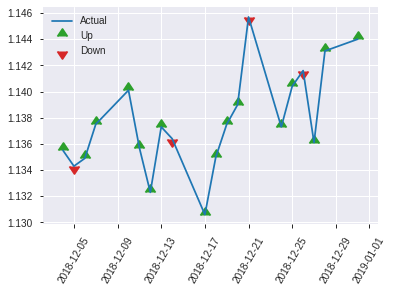


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18133336931523208
RMSE: 0.4258325601867852
LogLoss: 0.5317898451647489
Mean Per-Class Error: 0.28327228327228327
AUC: 0.7982905982905983
pr_auc: 0.811778567990835
Gini: 0.5965811965811967
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4184782803058624: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,82.0,174.0,0.2812,(72.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4184783,0.7631579,173.0
max f2,0.2906013,0.8660352,218.0
max f0point5,0.7156214,0.7369942,53.0
max accuracy,0.4458503,0.71875,161.0
max precision,0.9384878,1.0,0.0
max recall,0.1517645,1.0,235.0
max specificity,0.9384878,1.0,0.0
max absolute_mcc,0.4184783,0.4628597,173.0
max min_per_class_accuracy,0.5163443,0.7063492,128.0
max mean_per_class_accuracy,0.4458503,0.7167277,161.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9205291,1.9692308,1.9692308,1.0,0.9340003,1.0,0.9340003,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9079903,1.9692308,1.9692308,1.0,0.9100737,1.0,0.9220370,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9057526,1.9692308,1.9692308,1.0,0.9065692,1.0,0.9181700,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9028849,1.9692308,1.9692308,1.0,0.9045512,1.0,0.9144558,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8967579,1.9692308,1.9692308,1.0,0.8998371,1.0,0.9122068,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8705732,1.9692308,1.9692308,1.0,0.8840013,1.0,0.8981040,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8043183,1.8177515,1.9187377,0.9230769,0.8386415,0.9743590,0.8782832,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7183164,1.6662722,1.8556213,0.8461538,0.7491467,0.9423077,0.8459990,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.6342802,0.8664615,1.5344655,0.44,0.6745982,0.7792208,0.7903494,0.0846154,0.4615385,-13.3538462,53.4465534
,10,0.4023438,0.5780438,1.2875740,1.4721434,0.6538462,0.6005669,0.7475728,0.7424432,0.1307692,0.5923077,28.7573964,47.2143391


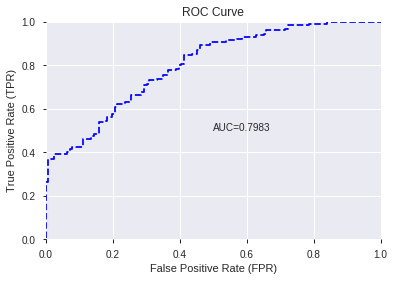

This function is available for GLM models only


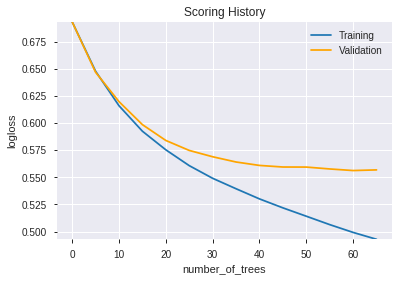

--2019-12-08 07:27:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.177.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.177.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel

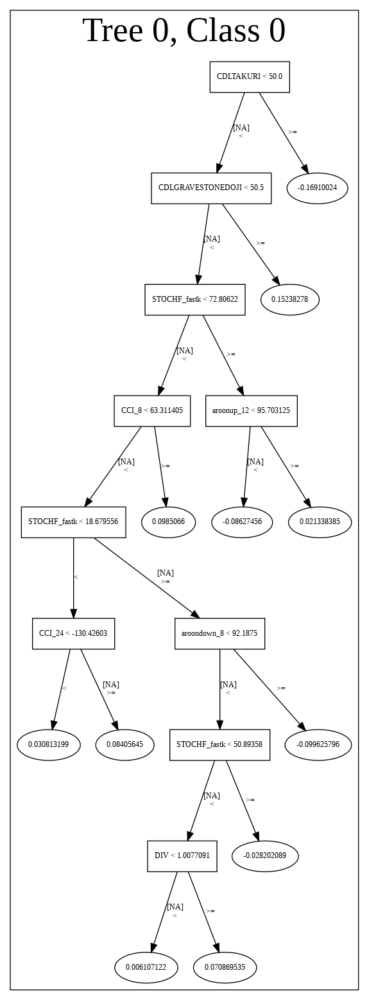

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_072728_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_072728_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_93_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CDLGRAVESTONEDOJI',
 'PLUS_DI_8',
 'STOCHF_fastk',
 'ULTOSC',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'WILLR_12',
 'WILLR_8',
 'STOCH_slowk',
 'CDLTAKURI',
 'STOCHF_fastd',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER']

In [86]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [87]:
# DRF with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191208_072948,0.797558,0.534885,0.295665,0.427535,0.182786
1,GBM_5_AutoML_20191208_072948,0.790354,0.542086,0.320085,0.429820,0.184745
2,GBM_1_AutoML_20191208_072948,0.788767,0.544760,0.311050,0.431738,0.186398
3,GBM_4_AutoML_20191208_072948,0.788523,0.543417,0.368437,0.433080,0.187558
4,GBM_grid_1_AutoML_20191208_072948_model_2,0.785989,0.608056,0.307448,0.457127,0.208965
5,GBM_3_AutoML_20191208_072948,0.785531,0.544201,0.356288,0.433449,0.187878
6,GBM_grid_1_AutoML_20191208_072948_model_4,0.784432,0.662321,0.335958,0.484396,0.234640
7,GBM_grid_1_AutoML_20191208_072948_model_1,0.777656,0.601706,0.323199,0.454161,0.206262
8,GBM_grid_1_AutoML_20191208_072948_model_5,0.763492,0.686355,0.376618,0.496593,0.246604
9,GBM_grid_1_AutoML_20191208_072948_model_3,0.730586,0.751509,0.375885,0.494805,0.244832


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,149.001816,1.000000,0.130913
1,STOCHF_fastk,139.254059,0.934580,0.122348
2,MINUS_DI_8,130.296143,0.874460,0.114478
3,WILLR_12,119.685768,0.803250,0.105156
4,PLUS_DI_8,112.586899,0.755608,0.098919
5,ULTOSC,108.177307,0.726013,0.095044
6,WILLR_8,100.412178,0.673899,0.088222
7,CDLGRAVESTONEDOJI,99.802498,0.669807,0.087686
8,STOCHF_fastd,63.608772,0.426899,0.055887
9,STOCH_slowk,54.602097,0.366453,0.047973


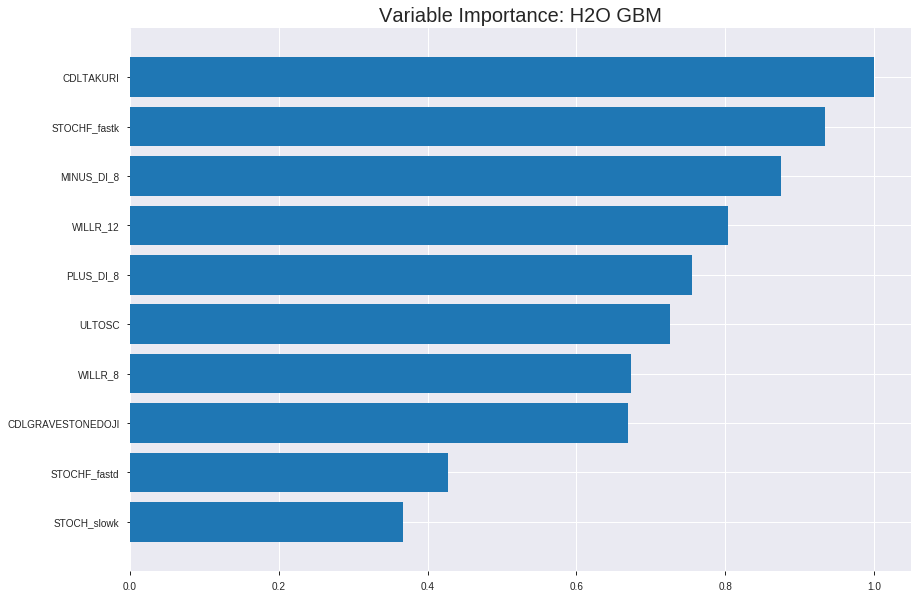

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191208_072948


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.12943397426922237
RMSE: 0.3597693348094337
LogLoss: 0.4156272347875675
Mean Per-Class Error: 0.16736624679333012
AUC: 0.9265058822350489
pr_auc: 0.9280050769817355
Gini: 0.8530117644700979
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44618081130018483: 


,0,1,Error,Rate
0,666.0,225.0,0.2525,(225.0/891.0)
1,75.0,821.0,0.0837,(75.0/896.0)
Total,741.0,1046.0,0.1679,(300.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4461808,0.8455201,224.0
max f2,0.3628615,0.9077660,261.0
max f0point5,0.6023980,0.8604260,152.0
max accuracy,0.4978141,0.8326805,200.0
max precision,0.9583447,1.0,0.0
max recall,0.2439072,1.0,316.0
max specificity,0.9583447,1.0,0.0
max absolute_mcc,0.4461808,0.6736513,224.0
max min_per_class_accuracy,0.5110819,0.8282828,193.0
max mean_per_class_accuracy,0.4978141,0.8326338,200.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9369750,1.9944196,1.9944196,1.0,0.9450253,1.0,0.9450253,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9289985,1.9944196,1.9944196,1.0,0.9330678,1.0,0.9390466,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9202405,1.9944196,1.9944196,1.0,0.9238065,1.0,0.9339665,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9125145,1.9944196,1.9944196,1.0,0.9172868,1.0,0.9297966,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9067895,1.9944196,1.9944196,1.0,0.9100939,1.0,0.9258561,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8588108,1.9944196,1.9944196,1.0,0.8834111,1.0,0.9047521,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.7990859,1.9944196,1.9944196,1.0,0.8281199,1.0,0.8793034,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.7436004,1.9722594,1.9888486,0.9888889,0.7711630,0.9972067,0.8521172,0.0993304,0.3984375,97.2259425,98.8848638
,9,0.2999440,0.6608527,1.7703275,1.9162801,0.8876404,0.6985490,0.9608209,0.8011188,0.1763393,0.5747768,77.0327548,91.6280067
,10,0.4001119,0.5841495,1.3816091,1.7824254,0.6927374,0.6205769,0.8937063,0.7559202,0.1383929,0.7131696,38.1609138,78.2425387




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19146381507456928
RMSE: 0.4375657837109402
LogLoss: 0.5632876321805466
Mean Per-Class Error: 0.27653014265991716
AUC: 0.7901288541187298
pr_auc: 0.7588968153220174
Gini: 0.5802577082374596
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3730410414063205: 


,0,1,Error,Rate
0,124.0,141.0,0.5321,(141.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,147.0,364.0,0.3209,(164.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3730410,0.7311475,283.0
max f2,0.2140369,0.8415493,340.0
max f0point5,0.6823472,0.7200811,140.0
max accuracy,0.6038624,0.7240705,184.0
max precision,0.9552103,1.0,0.0
max recall,0.0766525,1.0,384.0
max specificity,0.9552103,1.0,0.0
max absolute_mcc,0.6019657,0.4471661,185.0
max min_per_class_accuracy,0.5922963,0.7154472,189.0
max mean_per_class_accuracy,0.6019657,0.7234699,185.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9427099,1.7310298,1.7310298,0.8333333,0.9492177,0.8333333,0.9492177,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9357044,1.6617886,1.6995565,0.8,0.9388665,0.8181818,0.9445126,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9289728,1.6617886,1.6877541,0.8,0.9325991,0.8125,0.9407896,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.9215517,2.0772358,1.7804878,1.0,0.9241345,0.8571429,0.9368241,0.0203252,0.0731707,107.7235772,78.0487805
,5,0.0508806,0.9140826,2.0772358,1.8375547,1.0,0.9178797,0.8846154,0.9331810,0.0203252,0.0934959,107.7235772,83.7554722
,6,0.1017613,0.8753314,1.7576610,1.7976079,0.8461538,0.8946653,0.8653846,0.9139231,0.0894309,0.1829268,75.7661038,79.7607880
,7,0.1506849,0.8460237,1.7448780,1.7804878,0.84,0.8584645,0.8571429,0.8959171,0.0853659,0.2682927,74.4878049,78.0487805
,8,0.2015656,0.8146425,1.5978737,1.7343910,0.7692308,0.8285544,0.8349515,0.8789129,0.0813008,0.3495935,59.7873671,73.4391033
,9,0.3013699,0.7262418,1.4255540,1.6321138,0.6862745,0.7703207,0.7857143,0.8429506,0.1422764,0.4918699,42.5553961,63.2113821
,10,0.4011742,0.6582578,1.2219034,1.5300615,0.5882353,0.6883023,0.7365854,0.8044771,0.1219512,0.6138211,22.1903396,53.0061471



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:29:49,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 07:29:49,0.032 sec,5.0,0.4503805,0.5964812,0.8421179,0.8439582,1.9944196,0.2602126,0.4604193,0.6151632,0.7790075,0.7583519,2.0772358,0.2915851
,2019-12-08 07:29:49,0.059 sec,10.0,0.4238297,0.5426996,0.8548143,0.8596355,1.9944196,0.2462227,0.4429979,0.5784505,0.7910109,0.7657999,2.0772358,0.2661448
,2019-12-08 07:29:49,0.087 sec,15.0,0.4078174,0.5082668,0.8670103,0.8730614,1.9944196,0.2395076,0.4378577,0.5652232,0.7924988,0.7705633,1.7310298,0.2739726
,2019-12-08 07:29:49,0.116 sec,20.0,0.3919546,0.4762641,0.8869711,0.8903730,1.9944196,0.2126469,0.4357362,0.5597658,0.7937644,0.7642182,1.7310298,0.3091977
,2019-12-08 07:29:49,0.144 sec,25.0,0.3804046,0.4535408,0.9018966,0.9050410,1.9944196,0.2104085,0.4382882,0.5642610,0.7884415,0.7614757,1.7310298,0.3228963
,2019-12-08 07:29:49,0.171 sec,30.0,0.3694045,0.4331230,0.9155093,0.9158708,1.9944196,0.1829882,0.4366412,0.5605081,0.7918776,0.7622772,1.7310298,0.3170254
,2019-12-08 07:29:49,0.197 sec,35.0,0.3597693,0.4156272,0.9265059,0.9280051,1.9944196,0.1678791,0.4375658,0.5632876,0.7901289,0.7588968,1.7310298,0.3209393


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,149.0018158,1.0,0.1309127
STOCHF_fastk,139.2540588,0.9345796,0.1223484
MINUS_DI_8,130.2961426,0.8744601,0.1144779
WILLR_12,119.6857681,0.8032504,0.1051557
PLUS_DI_8,112.5868988,0.7556076,0.0989186
ULTOSC,108.1773071,0.7260133,0.0950444
WILLR_8,100.4121780,0.6738990,0.0882219
CDLGRAVESTONEDOJI,99.8024979,0.6698073,0.0876863
STOCHF_fastd,63.6087723,0.4268993,0.0558865
STOCH_slowk,54.6020966,0.3664526,0.0479733


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71484375)

('F1', 0.7524752475247525)

('auc', 0.7975579975579975)

('logloss', 0.5348846565749205)

('mean_per_class_error', 0.2841880341880342)

('rmse', 0.4275349975855657)

('mse', 0.18278617416048967)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


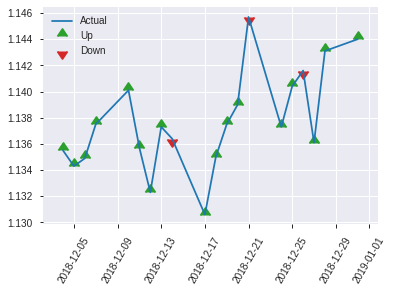


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.18278617416048967
RMSE: 0.4275349975855657
LogLoss: 0.5348846565749205
Mean Per-Class Error: 0.2841880341880342
AUC: 0.7975579975579975
pr_auc: 0.8148508308649918
Gini: 0.595115995115995
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.401189107139692: 


,0,1,Error,Rate
0,67.0,59.0,0.4683,(59.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,83.0,173.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4011891,0.7524752,172.0
max f2,0.1932957,0.8602151,223.0
max f0point5,0.7215861,0.7460733,62.0
max accuracy,0.5783779,0.7148438,112.0
max precision,0.9464374,1.0,0.0
max recall,0.1364159,1.0,236.0
max specificity,0.9464374,1.0,0.0
max absolute_mcc,0.7215861,0.4536384,62.0
max min_per_class_accuracy,0.5254894,0.7063492,128.0
max mean_per_class_accuracy,0.5783779,0.7158120,112.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9378659,1.9692308,1.9692308,1.0,0.9409466,1.0,0.9409466,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9279355,1.9692308,1.9692308,1.0,0.9332343,1.0,0.9370905,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9220761,1.9692308,1.9692308,1.0,0.9242852,1.0,0.9338892,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9209011,1.9692308,1.9692308,1.0,0.9213405,1.0,0.9304668,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9197389,1.9692308,1.9692308,1.0,0.9200293,1.0,0.9288610,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8805787,1.9692308,1.9692308,1.0,0.9028867,1.0,0.9158738,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8253474,1.6662722,1.8682446,0.8461538,0.8505832,0.9487179,0.8941103,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.7711770,1.6662722,1.8177515,0.8461538,0.7987314,0.9230769,0.8702656,0.0846154,0.3692308,66.6272189,81.7751479
,9,0.3007812,0.6632077,1.1027692,1.5856144,0.56,0.7125974,0.8051948,0.8190746,0.1076923,0.4769231,10.2769231,58.5614386
,10,0.4023438,0.6062947,1.2118343,1.4912621,0.6153846,0.6362198,0.7572816,0.7729171,0.1230769,0.6,21.1834320,49.1262136


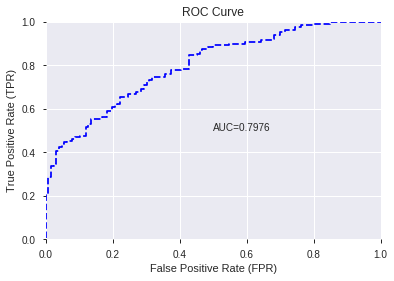

This function is available for GLM models only


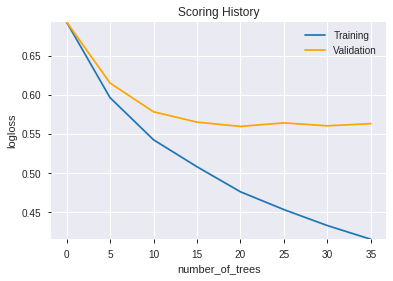

--2019-12-08 07:30:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.241.188
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.241.188|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1497.0
            depth:       1
            colId:       0
            colName:     MINUS_DI_8
            leftward:    true
            naVsRest:    false
            splitVal:    19.03952
            isBitset:    false
            predValue:   -0.04114514
            squaredErr:  371.8851
            leftChild:   Node 5
            right

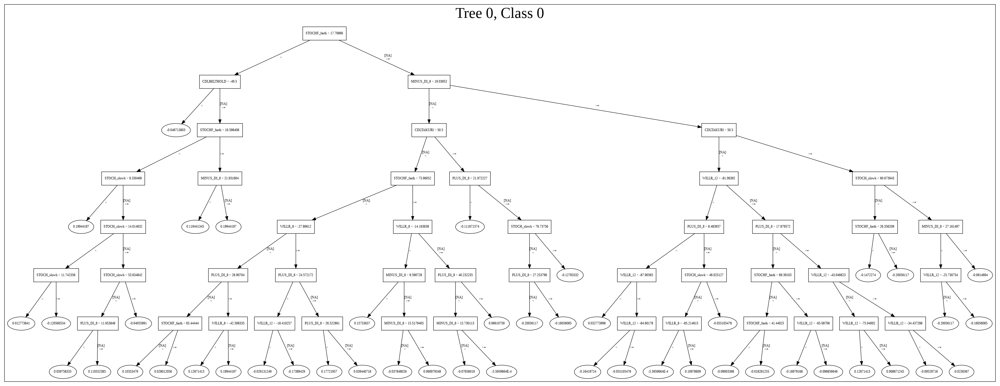

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191208_072948',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191208_072948',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_103_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_103_sid_9d28',
   'type': 'Ke

['CDLTAKURI',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'WILLR_12',
 'PLUS_DI_8',
 'ULTOSC',
 'WILLR_8',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastd',
 'STOCH_slowk',
 'CDLDRAGONFLYDOJI',
 'CDLBELTHOLD',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLHANGINGMAN']

In [88]:
# GBM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GBM",features_list=features_list)

In [89]:
# StackedEnsemble with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_073100_model_1,0.800122,0.536323,0.303846,0.428153,0.183315
1,GBM_2_AutoML_20191208_073100,0.797558,0.534885,0.295665,0.427535,0.182786
2,GBM_5_AutoML_20191208_073100,0.790354,0.542086,0.320085,0.429820,0.184745
3,GBM_1_AutoML_20191208_073100,0.788767,0.544760,0.311050,0.431738,0.186398
4,GBM_4_AutoML_20191208_073100,0.788523,0.543417,0.368437,0.433080,0.187558
5,XGBoost_3_AutoML_20191208_073100,0.787546,0.542821,0.336203,0.430674,0.185480
6,XGBoost_2_AutoML_20191208_073100,0.786691,0.545744,0.303602,0.431690,0.186356
7,GBM_3_AutoML_20191208_073100,0.785531,0.544201,0.356288,0.433449,0.187878
8,DRF_1_AutoML_20191208_073100,0.770024,0.556928,0.332967,0.440907,0.194399
9,XGBoost_1_AutoML_20191208_073100,0.767033,0.566873,0.356044,0.442399,0.195717


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.651133,1.000000,0.175063
1,CDLDRAGONFLYDOJI,0.537906,0.826108,0.144621
2,STOCHF_fastk,0.479270,0.736056,0.128856
3,PLUS_DI_8,0.399239,0.613146,0.107339
4,WILLR_8,0.304940,0.468323,0.081986
5,WILLR_12,0.291749,0.448063,0.078439
6,MINUS_DI_8,0.246252,0.378190,0.066207
7,ULTOSC,0.182282,0.279946,0.049008
8,CDLTAKURI,0.169446,0.260233,0.045557
9,CDLHANGINGMAN,0.100203,0.153890,0.026940


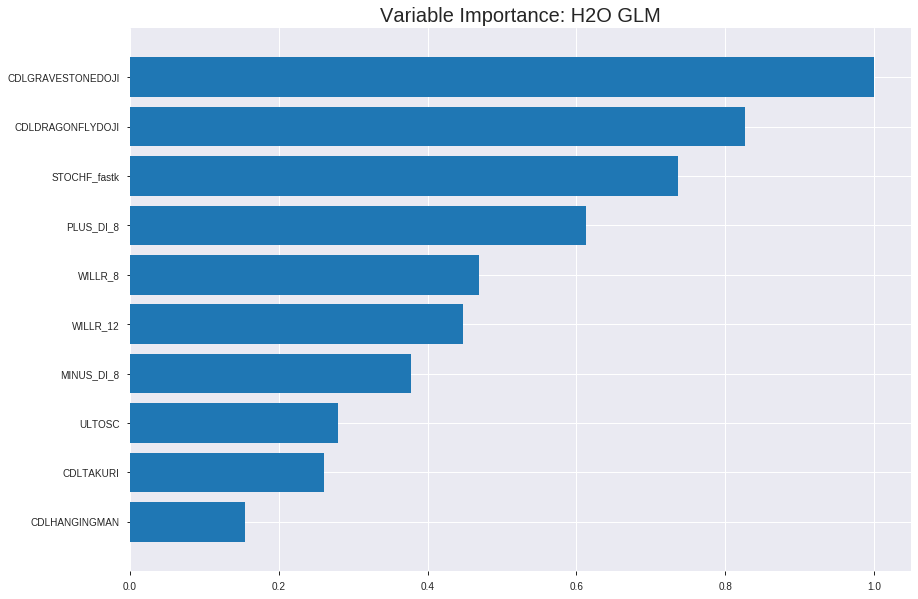

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_073100_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19660620500267043
RMSE: 0.44340298262717
LogLoss: 0.5735790078876001
Null degrees of freedom: 1786
Residual degrees of freedom: 1769
Null deviance: 2477.294033375749
Residual deviance: 2049.971374190283
AIC: 2085.971374190283
AUC: 0.7620795003607503
pr_auc: 0.7502495140226577
Gini: 0.5241590007215007
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4229164584175424: 


,0,1,Error,Rate
0,404.0,487.0,0.5466,(487.0/891.0)
1,108.0,788.0,0.1205,(108.0/896.0)
Total,512.0,1275.0,0.333,(595.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4229165,0.7259327,257.0
max f2,0.3129811,0.8564996,312.0
max f0point5,0.5362049,0.6985670,179.0
max accuracy,0.5362049,0.6883044,179.0
max precision,0.9715117,1.0,0.0
max recall,0.0185214,1.0,394.0
max specificity,0.9715117,1.0,0.0
max absolute_mcc,0.5362049,0.3818001,179.0
max min_per_class_accuracy,0.5067810,0.6846240,200.0
max mean_per_class_accuracy,0.5362049,0.6885259,179.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9518641,1.7728175,1.7728175,0.8888889,0.9585353,0.8888889,0.9585353,0.0178571,0.0178571,77.2817460,77.2817460
,2,0.0201455,0.9392760,1.6620164,1.7174169,0.8333333,0.9461015,0.8611111,0.9523184,0.0167411,0.0345982,66.2016369,71.7416915
,3,0.0302182,0.9285292,1.7728175,1.7358838,0.8888889,0.9331691,0.8703704,0.9459353,0.0178571,0.0524554,77.2817460,73.5883763
,4,0.0402910,0.9194311,1.7728175,1.7451172,0.8888889,0.9237415,0.875,0.9403868,0.0178571,0.0703125,77.2817460,74.5117188
,5,0.0503637,0.9103958,1.9944196,1.7949777,1.0,0.9139110,0.9,0.9350917,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8505142,1.8151460,1.8050055,0.9101124,0.8852209,0.9050279,0.9102956,0.0904018,0.1808036,81.5145967,80.5005487
,7,0.1499720,0.6992555,1.5238262,1.7116288,0.7640449,0.7624484,0.8582090,0.8611971,0.0758929,0.2566964,52.3826244,71.1628798
,8,0.2003358,0.6487284,1.3960937,1.6323043,0.7,0.6722742,0.8184358,0.8137025,0.0703125,0.3270089,39.6093750,63.2304345
,9,0.2999440,0.5863765,1.2997341,1.5218613,0.6516854,0.6163972,0.7630597,0.7481795,0.1294643,0.4564732,29.9734149,52.1861257
,10,0.4001119,0.5422185,1.2144790,1.4449082,0.6089385,0.5631074,0.7244755,0.7018467,0.1216518,0.578125,21.4479000,44.4908217




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19081348626170783
RMSE: 0.43682203042166706
LogLoss: 0.5557420354946759
Null degrees of freedom: 510
Residual degrees of freedom: 493
Null deviance: 708.5067427497436
Residual deviance: 567.9683602755589
AIC: 603.9683602755589
AUC: 0.7912409878815769
pr_auc: 0.7876542914243245
Gini: 0.5824819757631539
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46151898575381356: 


,0,1,Error,Rate
0,129.0,136.0,0.5132,(136.0/265.0)
1,26.0,220.0,0.1057,(26.0/246.0)
Total,155.0,356.0,0.317,(162.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4615190,0.7308970,264.0
max f2,0.1270845,0.8426184,347.0
max f0point5,0.5845006,0.7117117,171.0
max accuracy,0.5439195,0.7221135,206.0
max precision,0.9742009,1.0,0.0
max recall,0.0378364,1.0,393.0
max specificity,0.9742009,1.0,0.0
max absolute_mcc,0.5393899,0.4484055,209.0
max min_per_class_accuracy,0.5564761,0.7132075,195.0
max mean_per_class_accuracy,0.5393899,0.7237690,209.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9515497,2.0772358,2.0772358,1.0,0.9616576,1.0,0.9616576,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9455249,2.0772358,2.0772358,1.0,0.9482198,1.0,0.9555495,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9384401,2.0772358,2.0772358,1.0,0.9411699,1.0,0.9510559,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9329461,2.0772358,2.0772358,1.0,0.9348659,1.0,0.9472012,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9289602,2.0772358,2.0772358,1.0,0.9314363,1.0,0.9441694,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8967363,1.9174484,1.9973421,0.9230769,0.9125326,0.9615385,0.9283510,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.8291616,1.8279675,1.9423503,0.88,0.8740980,0.9350649,0.9107364,0.0894309,0.2926829,82.7967480,94.2350333
,8,0.2015656,0.7196611,1.1984053,1.7545584,0.5769231,0.7742370,0.8446602,0.8762802,0.0609756,0.3536585,19.8405253,75.4558371
,9,0.3013699,0.6325835,1.2219034,1.5781596,0.5882353,0.6655461,0.7597403,0.8064917,0.1219512,0.4756098,22.1903396,57.8159645
,10,0.4011742,0.5902454,1.3440937,1.5199286,0.6470588,0.6129140,0.7317073,0.7583333,0.1341463,0.6097561,34.4093735,51.9928614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:31:03,0.000 sec,2,.15E2,18,1.3705000,1.3685180
,2019-12-08 07:31:03,0.003 sec,4,.96E1,18,1.3619330,1.3587170
,2019-12-08 07:31:03,0.006 sec,6,.6E1,18,1.3495477,1.3445004
,2019-12-08 07:31:03,0.008 sec,8,.37E1,18,1.3325683,1.3249252
,2019-12-08 07:31:03,0.010 sec,10,.23E1,18,1.3108649,1.2997694
---,---,---,---,---,---,---,---
,2019-12-08 07:31:03,0.052 sec,40,.11E-2,18,1.1469477,1.1115711
,2019-12-08 07:31:03,0.054 sec,41,.7E-3,18,1.1468217,1.1116714
,2019-12-08 07:31:03,0.055 sec,42,.43E-3,18,1.1467495,1.1117672
,2019-12-08 07:31:03,0.057 sec,43,.27E-3,18,1.1467110,1.1118472



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7508090614886731)

('auc', 0.8001221001221002)

('logloss', 0.5363229170983967)

('mean_per_class_error', 0.2638583638583638)

('rmse', 0.4281530963345878)

('mse', 0.18331507390089485)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


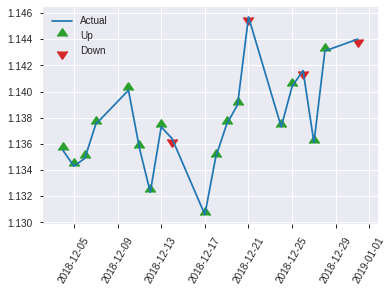


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18331507390089485
RMSE: 0.4281530963345878
LogLoss: 0.5363229170983967
Null degrees of freedom: 255
Residual degrees of freedom: 238
Null deviance: 354.87097666550244
Residual deviance: 274.59733355437913
AIC: 310.59733355437913
AUC: 0.8001221001221002
pr_auc: 0.8171579465828352
Gini: 0.6002442002442003
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4451068186055771: 


,0,1,Error,Rate
0,63.0,63.0,0.5,(63.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,77.0,179.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4451068,0.7508091,178.0
max f2,0.3016795,0.8622995,227.0
max f0point5,0.5549622,0.7641509,99.0
max accuracy,0.5549622,0.734375,99.0
max precision,0.9644670,1.0,0.0
max recall,0.0651923,1.0,246.0
max specificity,0.9644670,1.0,0.0
max absolute_mcc,0.5549622,0.4839463,99.0
max min_per_class_accuracy,0.5182426,0.7,126.0
max mean_per_class_accuracy,0.5549622,0.7361416,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9562114,1.9692308,1.9692308,1.0,0.9618125,1.0,0.9618125,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9488604,1.9692308,1.9692308,1.0,0.9512172,1.0,0.9565149,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9387755,1.9692308,1.9692308,1.0,0.9443869,1.0,0.9534829,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9322645,1.9692308,1.9692308,1.0,0.9346384,1.0,0.9483435,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9285843,1.9692308,1.9692308,1.0,0.9305958,1.0,0.9456130,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8714818,1.9692308,1.9692308,1.0,0.8965564,1.0,0.9210847,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7449633,1.8177515,1.9187377,0.9230769,0.8230672,0.9743590,0.8884122,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6686081,1.3633136,1.7798817,0.6923077,0.6949107,0.9038462,0.8400368,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5946357,1.3390769,1.6367632,0.68,0.6250822,0.8311688,0.7702464,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5514821,1.3633136,1.5677371,0.6923077,0.5675973,0.7961165,0.7190922,0.1384615,0.6307692,36.3313609,56.7737117


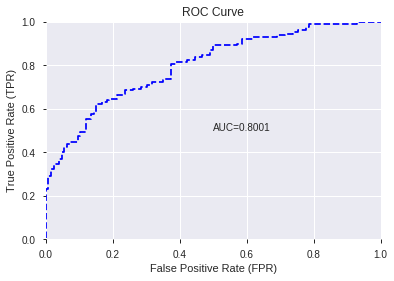

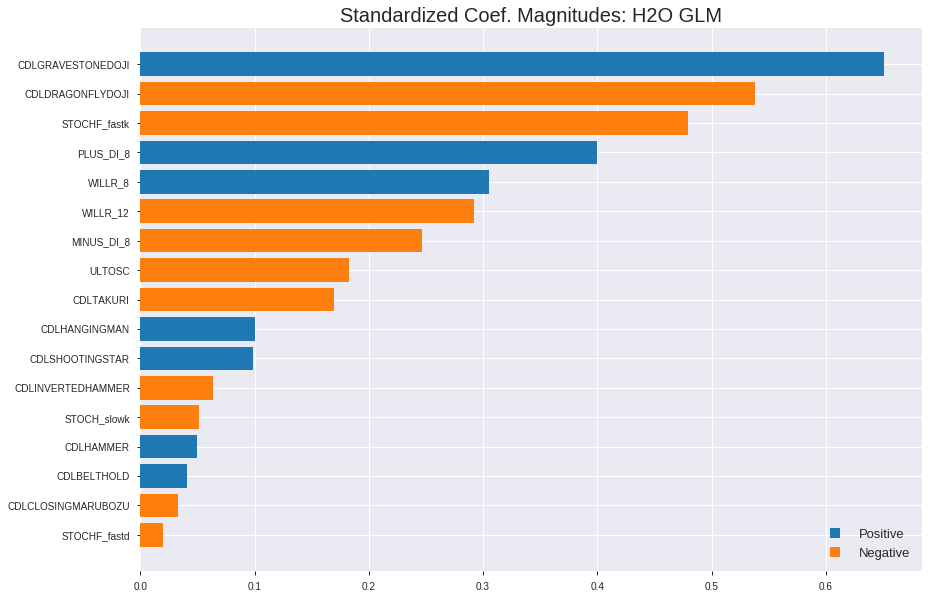

'log_likelihood'
--2019-12-08 07:31:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.226.88
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.226.88|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


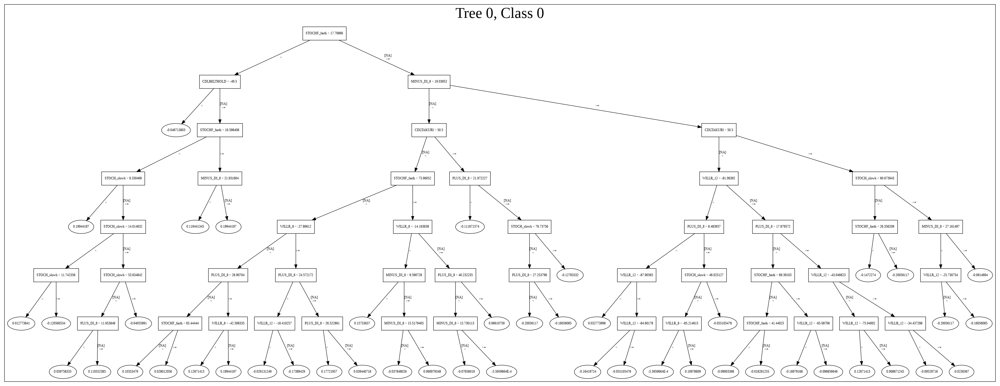

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_073100_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_073100_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_111_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_111

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'MINUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'STOCH_slowk',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastd']

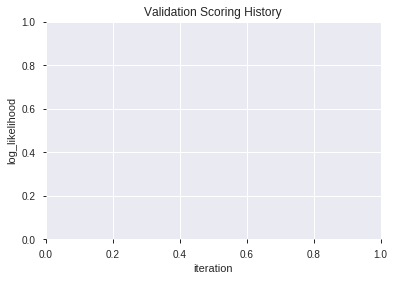

In [90]:
# All algos with Select Family-wise error features
model_train(feature_name='Fwe',model_algo=None,features_list=features_list)

In [91]:
# recursive feature elimination
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFE
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFE(ExtraTreeClassifier(random_state=1,criterion='entropy'), n_features_to_select=select_rfe, step=1).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFE, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BBANDS_middleband_14_3_4',
 'BBANDS_upperband_14_5_4',
 'BBANDS_upperband_20_2_3',
 'BBANDS_upperband_20_6_3',
 'BOP',
 'aroonup_8',
 'AROONOSC_8',
 'CCI_8',
 'CMO_8',
 'DX_8',
 'MINUS_DM_8',
 'MOM_8',
 'WILLR_8',
 'aroondown_12',
 'CCI_12',
 'MINUS_DI_12',
 'MINUS_DM_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'ROCP_12',
 'ROCR100_12',
 'ADXR_14',
 'aroondown_14',
 'CCI_14',
 'MINUS_DI_14',
 'PLUS_DM_14',
 'ROCR100_14',
 'WILLR_14',
 'ADX_20',
 'DX_20',
 'WILLR_20',
 'ADX_24',
 'CCI_24',
 'MINUS_DI_24',
 'aroondown_30',
 'RSI_30',
 'STOCH_slowk',
 'STOCH_slowd',
 'STOCHF_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'TRANGE',
 'HT_PHASOR_inphase',
 'HT_PHASOR_quadrature',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'CDLSPINNINGTOP',
 'CDLTAKURI',
 'LINEARREG_ANGLE_12',
 'CORREL_20']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_073224_model_9,0.854457,0.475637,0.243712,0.397178,0.157751
1,DeepLearning_grid_1_AutoML_20191208_073224_model_3,0.826068,0.513225,0.272344,0.417279,0.174122
2,DeepLearning_grid_1_AutoML_20191208_073224_model_8,0.825153,0.508897,0.267277,0.413247,0.170773
3,DeepLearning_1_AutoML_20191208_073224,0.824725,0.511867,0.272589,0.416430,0.173414
4,DeepLearning_grid_1_AutoML_20191208_073224_model_6,0.818193,0.503183,0.300733,0.411821,0.169596
5,DeepLearning_grid_1_AutoML_20191208_073224_model_7,0.814835,0.539086,0.296398,0.428817,0.183884
6,DeepLearning_grid_1_AutoML_20191208_073224_model_2,0.809951,0.544698,0.312515,0.427269,0.182559
7,DeepLearning_grid_1_AutoML_20191208_073224_model_1,0.763370,0.772920,0.372772,0.491696,0.241765
8,DeepLearning_grid_1_AutoML_20191208_073224_model_4,0.755495,0.685451,0.323565,0.480184,0.230576
9,DeepLearning_grid_1_AutoML_20191208_073224_model_5,0.725031,0.597343,0.355922,0.457515,0.209320


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,1.000000,1.000000,0.041616
1,TRANGE,0.985660,0.985660,0.041019
2,CDLGRAVESTONEDOJI,0.930202,0.930202,0.038711
3,CDLRICKSHAWMAN,0.835144,0.835144,0.034755
4,STOCHF_fastk,0.708726,0.708726,0.029494
5,MINUS_DM_8,0.645771,0.645771,0.026874
6,CCI_8,0.638151,0.638151,0.026557
7,DX_8,0.620452,0.620452,0.025821
8,CORREL_20,0.567960,0.567960,0.023636
9,ULTOSC,0.553015,0.553015,0.023014


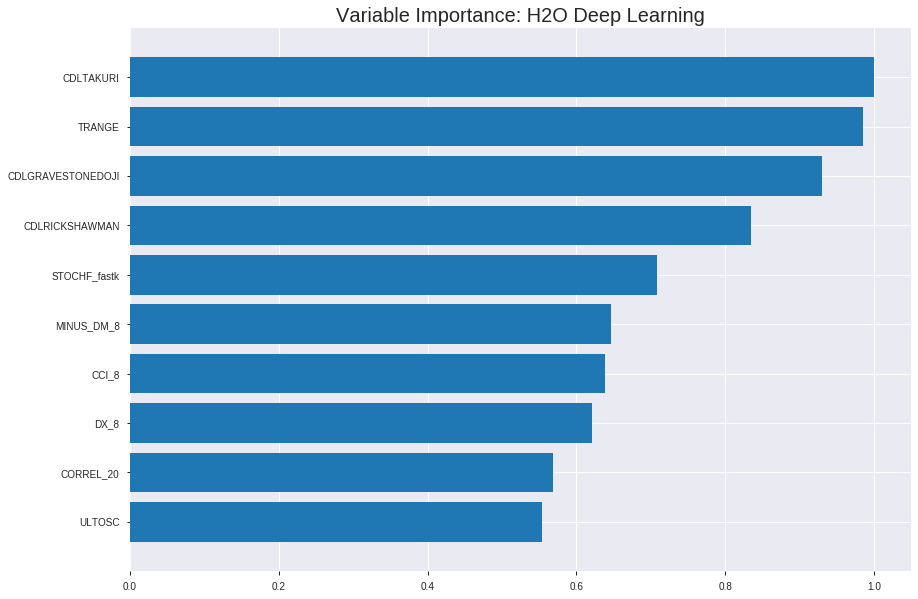

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_073224_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.16391156816930044
RMSE: 0.40485993648334784
LogLoss: 0.49124030965960896
Mean Per-Class Error: 0.24483863936988937
AUC: 0.8439704585537918
pr_auc: 0.8393051077046663
Gini: 0.6879409171075836
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4893272393727314: 


,0,1,Error,Rate
0,553.0,338.0,0.3793,(338.0/891.0)
1,99.0,797.0,0.1105,(99.0/896.0)
Total,652.0,1135.0,0.2445,(437.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4893272,0.7848351,227.0
max f2,0.3816487,0.8778317,277.0
max f0point5,0.5650629,0.7620922,170.0
max accuracy,0.5004113,0.7554561,220.0
max precision,0.9926353,1.0,0.0
max recall,0.0232233,1.0,392.0
max specificity,0.9926353,1.0,0.0
max absolute_mcc,0.4893272,0.5298799,227.0
max min_per_class_accuracy,0.5250585,0.7433036,198.0
max mean_per_class_accuracy,0.5004113,0.7551614,220.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 52.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9767092,1.9944196,1.9944196,1.0,0.9847697,1.0,0.9847697,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9689089,1.9944196,1.9944196,1.0,0.9728452,1.0,0.9788074,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9592377,1.8836186,1.9574859,0.9444444,0.9631087,0.9814815,0.9735745,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9499996,1.7728175,1.9113188,0.8888889,0.9541885,0.9583333,0.9687280,0.0178571,0.0770089,77.2817460,91.1318824
,5,0.0503637,0.9436549,1.8836186,1.9057788,0.9444444,0.9463254,0.9555556,0.9642475,0.0189732,0.0959821,88.3618552,90.5778770
,6,0.1001679,0.9045197,1.9047828,1.9052836,0.9550562,0.9239743,0.9553073,0.9442234,0.0948661,0.1908482,90.4782805,90.5283569
,7,0.1499720,0.8497113,1.7927368,1.8679079,0.8988764,0.8748800,0.9365672,0.9211952,0.0892857,0.2801339,79.2736758,86.7907949
,8,0.2003358,0.7864624,1.6841766,1.8217185,0.8444444,0.8201844,0.9134078,0.8958014,0.0848214,0.3649554,68.4176587,82.1718501
,9,0.2999440,0.6147551,1.4678032,1.7041869,0.7359551,0.7017697,0.8544776,0.8313655,0.1462054,0.5111607,46.7803220,70.4186934
,10,0.4001119,0.5543323,1.2367630,1.5871675,0.6201117,0.5787453,0.7958042,0.7681221,0.1238839,0.6350446,23.6763019,58.7167520




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1838816894013253
RMSE: 0.42881428311254427
LogLoss: 0.5513319615699127
Mean Per-Class Error: 0.26187298665439485
AUC: 0.8020401902132228
pr_auc: 0.78099248176918
Gini: 0.6040803804264456
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4588015623034797: 


,0,1,Error,Rate
0,165.0,100.0,0.3774,(100.0/265.0)
1,42.0,204.0,0.1707,(42.0/246.0)
Total,207.0,304.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4588016,0.7418182,233.0
max f2,0.2070107,0.8375270,315.0
max f0point5,0.5655727,0.7495069,155.0
max accuracy,0.5200113,0.7397260,182.0
max precision,0.9851265,1.0,0.0
max recall,0.0398680,1.0,383.0
max specificity,0.9851265,1.0,0.0
max absolute_mcc,0.5655727,0.4817350,155.0
max min_per_class_accuracy,0.5014037,0.7283019,198.0
max mean_per_class_accuracy,0.5176618,0.7381270,184.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9668257,2.0772358,2.0772358,1.0,0.9770944,1.0,0.9770944,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9581498,2.0772358,2.0772358,1.0,0.9615444,1.0,0.9700263,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9519464,1.6617886,1.9474085,0.8,0.9556883,0.9375,0.9655456,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.9462476,2.0772358,1.9783198,1.0,0.9488031,0.9523810,0.9615593,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9406399,2.0772358,1.9973421,1.0,0.9438627,0.9615385,0.9581561,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.9032412,1.6777674,1.8375547,0.8076923,0.9228121,0.8846154,0.9404841,0.0853659,0.1869919,67.7767355,83.7554722
,7,0.1506849,0.8574977,1.5786992,1.7535107,0.76,0.8795123,0.8441558,0.9206881,0.0772358,0.2642276,57.8699187,75.3510717
,8,0.2015656,0.8277284,1.8375547,1.7747257,0.8846154,0.8426164,0.8543689,0.9009807,0.0934959,0.3577236,83.7554722,77.4725708
,9,0.3013699,0.6706361,1.4255540,1.6590909,0.6862745,0.7542695,0.7987013,0.8523945,0.1422764,0.5,42.5553961,65.9090909
,10,0.4011742,0.5415874,1.4255540,1.6009915,0.6862745,0.5947010,0.7707317,0.7882854,0.1422764,0.6422764,42.5553961,60.0991473



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:39:06,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:39:10,2 min 16.102 sec,1189 obs/sec,2.6664801,1,4765.0,0.4777914,0.6475537,0.0868545,0.7301362,0.7304742,1.9944196,0.3732513,0.4902571,0.6763504,0.0372609,0.7507670,0.7393691,2.0772358,0.3502935
,2019-12-08 07:39:21,2 min 26.587 sec,1751 obs/sec,13.3027420,5,23772.0,0.4386813,0.5658137,0.2302290,0.7885909,0.7840012,1.8836186,0.3072188,0.4317992,0.5610779,0.2531652,0.7960730,0.7612099,1.7310298,0.2994129
,2019-12-08 07:39:31,2 min 37.150 sec,2040 obs/sec,26.5763850,10,47492.0,0.4423135,0.5712396,0.2174290,0.7839299,0.7777244,1.7728175,0.3049804,0.4405083,0.5734202,0.2227350,0.7856113,0.7408412,1.3848238,0.3287671
,2019-12-08 07:39:41,2 min 46.610 sec,2237 obs/sec,39.8707331,15,71249.0,0.4147764,0.5149881,0.3118367,0.8172931,0.8152666,1.9944196,0.2937885,0.4313886,0.5662109,0.2545851,0.7955821,0.7666106,1.7310298,0.2857143
,2019-12-08 07:39:50,2 min 55.715 sec,2369 obs/sec,53.1561276,20,94990.0,0.4217345,0.5277502,0.2885546,0.8177396,0.8144180,1.9944196,0.2775602,0.4311675,0.5543982,0.2553490,0.7952984,0.7828719,2.0772358,0.2837573
,2019-12-08 07:39:59,3 min 4.611 sec,2470 obs/sec,66.4655848,25,118774.0,0.4116612,0.5063555,0.3221350,0.8304260,0.8262657,1.9944196,0.2534975,0.4322316,0.5732883,0.2516688,0.8060976,0.7906968,2.0772358,0.2798434
,2019-12-08 07:40:09,3 min 14.728 sec,2567 obs/sec,82.3670957,31,147190.0,0.4048599,0.4912403,0.3443486,0.8439705,0.8393051,1.9944196,0.2445439,0.4288143,0.5513320,0.2634550,0.8020402,0.7809925,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,1.0,1.0,0.0416161
TRANGE,0.9856597,0.9856597,0.0410193
CDLGRAVESTONEDOJI,0.9302024,0.9302024,0.0387114
CDLRICKSHAWMAN,0.8351440,0.8351440,0.0347554
STOCHF_fastk,0.7087262,0.7087262,0.0294944
---,---,---,---
STOCH_slowd,0.3541101,0.3541101,0.0147367
AROONOSC_8,0.3535353,0.3535353,0.0147128
CCI_24,0.3533097,0.3533097,0.0147034
BBANDS_upperband_20_2_3,0.3500463,0.3500463,0.0145676



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7816901408450705)

('auc', 0.8544566544566544)

('logloss', 0.47563712187534646)

('mean_per_class_error', 0.22851037851037848)

('rmse', 0.3971783477777837)

('mse', 0.15775063994349012)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


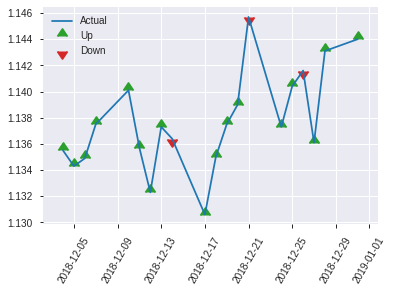


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.15775063994349012
RMSE: 0.3971783477777837
LogLoss: 0.47563712187534646
Mean Per-Class Error: 0.22851037851037848
AUC: 0.8544566544566544
pr_auc: 0.862693028119105
Gini: 0.7089133089133088
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4919268171086767: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,19.0,111.0,0.1462,(19.0/130.0)
Total,102.0,154.0,0.2422,(62.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4919268,0.7816901,153.0
max f2,0.3605919,0.8811189,194.0
max f0point5,0.5336099,0.8108108,96.0
max accuracy,0.5336099,0.7695312,96.0
max precision,0.9798264,1.0,0.0
max recall,0.0215613,1.0,251.0
max specificity,0.9798264,1.0,0.0
max absolute_mcc,0.5336099,0.5595717,96.0
max min_per_class_accuracy,0.5114303,0.7539683,129.0
max mean_per_class_accuracy,0.5336099,0.7714896,96.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9770100,1.9692308,1.9692308,1.0,0.9782527,1.0,0.9782527,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9666553,1.9692308,1.9692308,1.0,0.9709845,1.0,0.9746186,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9607654,1.9692308,1.9692308,1.0,0.9647503,1.0,0.9721516,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9534409,1.9692308,1.9692308,1.0,0.9562680,1.0,0.9678197,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9422469,1.9692308,1.9692308,1.0,0.9484044,1.0,0.9648327,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8814518,1.9692308,1.9692308,1.0,0.9141639,1.0,0.9394983,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8559039,1.8177515,1.9187377,0.9230769,0.8694663,0.9743590,0.9161543,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8060422,1.8177515,1.8934911,0.9230769,0.8329468,0.9615385,0.8953524,0.0923077,0.3846154,81.7751479,89.3491124
,9,0.3007812,0.5954044,1.4178462,1.7390609,0.72,0.7064908,0.8831169,0.8340337,0.1384615,0.5230769,41.7846154,73.9060939
,10,0.4023438,0.5262843,1.2875740,1.6250934,0.6538462,0.5559048,0.8252427,0.7638264,0.1307692,0.6538462,28.7573964,62.5093353


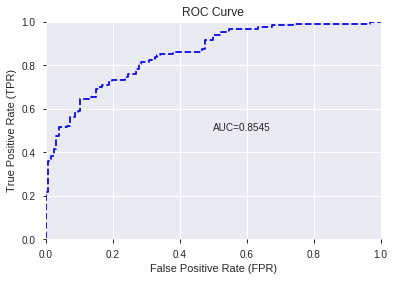

This function is available for GLM models only


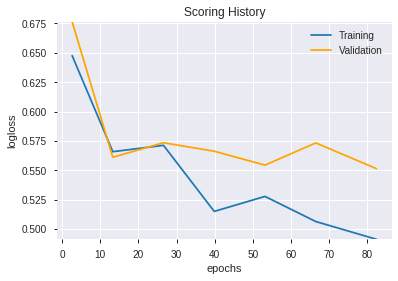

--2019-12-08 07:40:19--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.177.171
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.177.171|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


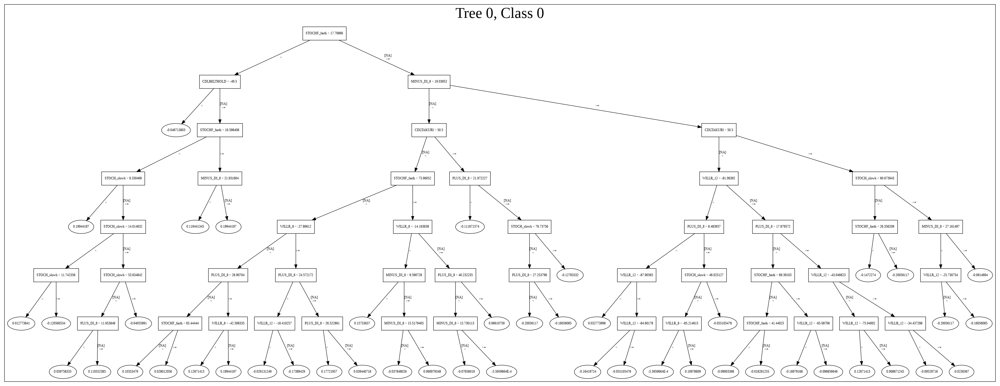

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_073224_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_073224_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_116_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['CDLTAKURI',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'STOCHF_fastk',
 'MINUS_DM_8',
 'CCI_8',
 'DX_8',
 'CORREL_20',
 'ULTOSC',
 'MINUS_DI_24',
 'MINUS_DI_14',
 'PLUS_DI_12',
 'MINUS_DM_12',
 'BOP',
 'WILLR_8',
 'RSI_30',
 'CDLSPINNINGTOP',
 'MINUS_DI_12',
 'PLUS_DM_12',
 'aroondown_30',
 'STOCHRSI_fastd',
 'aroonup_8',
 'aroondown_14',
 'STOCH_slowk',
 'ADXR_14',
 'PLUS_DM_14',
 'CCI_14',
 'aroondown_12',
 'CCI_12',
 'HT_PHASOR_inphase',
 'HT_PHASOR_quadrature',
 'ADX_20',
 'DX_20',
 'BBANDS_upperband_20_6_3',
 'CMO_8',
 'ADX_24',
 'WILLR_14',
 'WILLR_20',
 'LINEARREG_ANGLE_12',
 'ROCR100_14',
 'MOM_8',
 'ROCP_12',
 'BBANDS_middleband_14_3_4',
 'ROCR100_12',
 'STOCH_slowd',
 'AROONOSC_8',
 'CCI_24',
 'BBANDS_upperband_20_2_3',
 'BBANDS_upperband_14_5_4']

In [92]:
# DeepLearning with recursive feature elimination
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_074115_model_1,0.81685,0.511675,0.297009,0.416639,0.173588


,variable,relative_importance,scaled_importance,percentage
0,CCI_8,0.838198,1.000000,0.089067
1,STOCHF_fastk,0.659680,0.787021,0.070097
2,CDLTAKURI,0.547266,0.652908,0.058152
3,CCI_24,0.511408,0.610128,0.054342
4,CDLGRAVESTONEDOJI,0.456487,0.544606,0.048506
5,WILLR_14,0.395710,0.472097,0.042048
6,CCI_14,0.391917,0.467571,0.041645
7,MINUS_DM_12,0.388224,0.463165,0.041253
8,MINUS_DI_12,0.384770,0.459044,0.040886
9,WILLR_8,0.374706,0.447038,0.039816


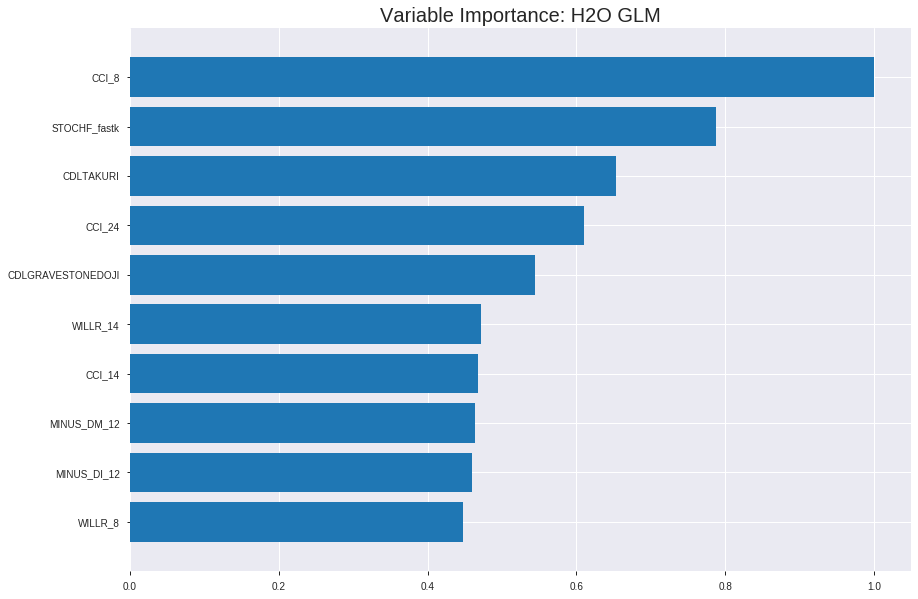

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_074115_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18214103880837945
RMSE: 0.42677984817512116
LogLoss: 0.5389096571742168
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375749
Residual deviance: 1926.063114740651
AIC: 2028.063114740651
AUC: 0.800958493666827
pr_auc: 0.7924046099546197
Gini: 0.6019169873336541
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3558072984563027: 


,0,1,Error,Rate
0,405.0,486.0,0.5455,(486.0/891.0)
1,65.0,831.0,0.0725,(65.0/896.0)
Total,470.0,1317.0,0.3083,(551.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3558073,0.7510167,277.0
max f2,0.3035551,0.8601399,300.0
max f0point5,0.5375910,0.7309730,190.0
max accuracy,0.5352001,0.7229994,191.0
max precision,0.9975632,1.0,0.0
max recall,0.0423240,1.0,387.0
max specificity,0.9975632,1.0,0.0
max absolute_mcc,0.4742149,0.4492848,222.0
max min_per_class_accuracy,0.5129534,0.7149270,202.0
max mean_per_class_accuracy,0.5352001,0.7231116,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9624021,1.8836186,1.8836186,0.9444444,0.9783102,0.9444444,0.9783102,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9475157,1.9944196,1.9390191,1.0,0.9534117,0.9722222,0.9658610,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9351057,1.8836186,1.9205522,0.9444444,0.9419515,0.9629630,0.9578912,0.0189732,0.0580357,88.3618552,92.0552249
,4,0.0402910,0.9213240,1.9944196,1.9390191,1.0,0.9282257,0.9722222,0.9504748,0.0200893,0.078125,99.4419643,93.9019097
,5,0.0503637,0.9145565,1.7728175,1.9057788,0.8888889,0.9175085,0.9555556,0.9438815,0.0178571,0.0959821,77.2817460,90.5778770
,6,0.1001679,0.8538818,1.7030999,1.8050055,0.8539326,0.8858121,0.9050279,0.9150090,0.0848214,0.1808036,70.3099920,80.5005487
,7,0.1499720,0.7653311,1.6582815,1.7562800,0.8314607,0.8101137,0.8805970,0.8801744,0.0825893,0.2633929,65.8281501,75.6279984
,8,0.2003358,0.7110126,1.5068948,1.6935854,0.7555556,0.7376185,0.8491620,0.8443363,0.0758929,0.3392857,50.6894841,69.3585395
,9,0.2999440,0.6300463,1.4117802,1.6000008,0.7078652,0.6695576,0.8022388,0.7862942,0.140625,0.4799107,41.1780197,60.0000833
,10,0.4001119,0.5665173,1.2924731,1.5230114,0.6480447,0.5973249,0.7636364,0.7389858,0.1294643,0.609375,29.2473065,52.3011364




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1753424231178327
RMSE: 0.4187390871626778
LogLoss: 0.5250170348264459
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497436
Residual deviance: 536.5674095926278
AIC: 638.5674095926278
AUC: 0.8172419082681392
pr_auc: 0.7981325393148647
Gini: 0.6344838165362785
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.446711162335488: 


,0,1,Error,Rate
0,178.0,87.0,0.3283,(87.0/265.0)
1,41.0,205.0,0.1667,(41.0/246.0)
Total,219.0,292.0,0.2505,(128.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4467112,0.7620818,220.0
max f2,0.2021020,0.8451705,324.0
max f0point5,0.5009808,0.7405892,186.0
max accuracy,0.4523587,0.7514677,216.0
max precision,0.9929847,1.0,0.0
max recall,0.0454852,1.0,381.0
max specificity,0.9929847,1.0,0.0
max absolute_mcc,0.4523587,0.5117750,216.0
max min_per_class_accuracy,0.4896196,0.7358491,190.0
max mean_per_class_accuracy,0.4523587,0.7541111,216.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9679768,1.7310298,1.7310298,0.8333333,0.9814575,0.8333333,0.9814575,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9628770,2.0772358,1.8883962,1.0,0.9652306,0.9090909,0.9740816,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9513478,2.0772358,1.9474085,1.0,0.9573607,0.9375,0.9688563,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9372652,2.0772358,1.9783198,1.0,0.9451311,0.9523810,0.9632075,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9263975,2.0772358,1.9973421,1.0,0.9291586,0.9615385,0.9566596,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8717645,1.9174484,1.9573952,0.9230769,0.8994716,0.9423077,0.9280656,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8293712,1.5786992,1.8344420,0.76,0.8504216,0.8831169,0.9028565,0.0772358,0.2764228,57.8699187,83.4441981
,8,0.2015656,0.7732367,1.6777674,1.7948930,0.8076923,0.8005818,0.8640777,0.8770396,0.0853659,0.3617886,67.7767355,79.4893046
,9,0.3013699,0.6358586,1.5477443,1.7130451,0.7450980,0.7018576,0.8246753,0.8190248,0.1544715,0.5162602,54.7744301,71.3045085
,10,0.4011742,0.5621467,1.1404432,1.5705929,0.5490196,0.5964680,0.7560976,0.7636570,0.1138211,0.6300813,14.0443169,57.0592901



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:41:16,0.000 sec,2,.15E2,51,1.3750807,1.3744636
,2019-12-08 07:41:16,0.009 sec,4,.96E1,51,1.3687861,1.3675894
,2019-12-08 07:41:16,0.018 sec,6,.6E1,51,1.3593927,1.3571998
,2019-12-08 07:41:16,0.027 sec,8,.37E1,51,1.3458412,1.3419729
,2019-12-08 07:41:16,0.036 sec,10,.23E1,51,1.3272179,1.3206399
---,---,---,---,---,---,---,---
,2019-12-08 07:41:16,0.167 sec,38,.29E-2,51,1.0743718,1.0502078
,2019-12-08 07:41:16,0.177 sec,40,.18E-2,51,1.0716683,1.0512552
,2019-12-08 07:41:16,0.188 sec,42,.11E-2,51,1.0695313,1.0530608
,2019-12-08 07:41:16,0.197 sec,44,.7E-3,51,1.0679110,1.0553711



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7692307692307693)

('auc', 0.8168498168498168)

('logloss', 0.5116745603997087)

('mean_per_class_error', 0.266056166056166)

('rmse', 0.41663901062714875)

('mse', 0.17358806517636938)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


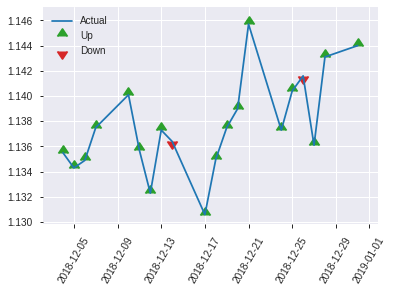


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17358806517636938
RMSE: 0.41663901062714875
LogLoss: 0.5116745603997087
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550244
Residual deviance: 261.97737492465086
AIC: 363.97737492465086
AUC: 0.8168498168498168
pr_auc: 0.8250472831297648
Gini: 0.6336996336996337
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3038624969730612: 


,0,1,Error,Rate
0,56.0,70.0,0.5556,(70.0/126.0)
1,5.0,125.0,0.0385,(5.0/130.0)
Total,61.0,195.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3038625,0.7692308,194.0
max f2,0.2888018,0.8762170,198.0
max f0point5,0.5063355,0.7400722,105.0
max accuracy,0.4612043,0.734375,135.0
max precision,0.9771941,1.0,0.0
max recall,0.0630717,1.0,241.0
max specificity,0.9771941,1.0,0.0
max absolute_mcc,0.3783040,0.4813497,168.0
max min_per_class_accuracy,0.4684803,0.7142857,128.0
max mean_per_class_accuracy,0.4612043,0.7339438,135.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9622149,1.9692308,1.9692308,1.0,0.9739527,1.0,0.9739527,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9508690,1.9692308,1.9692308,1.0,0.9536705,1.0,0.9638116,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9359721,1.9692308,1.9692308,1.0,0.9396440,1.0,0.9577697,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9288653,1.9692308,1.9692308,1.0,0.9325769,1.0,0.9508990,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9174947,1.9692308,1.9692308,1.0,0.9275758,1.0,0.9473108,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8627531,1.9692308,1.9692308,1.0,0.8917359,1.0,0.9195233,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7576107,1.9692308,1.9692308,1.0,0.8251812,1.0,0.8880760,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.6947550,1.3633136,1.8177515,0.6923077,0.7245468,0.9230769,0.8471937,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.5733403,1.1815385,1.6111888,0.6,0.6205320,0.8181818,0.7736022,0.1153846,0.4846154,18.1538462,61.1188811
,10,0.4023438,0.5217303,1.2875740,1.5294996,0.6538462,0.5456406,0.7766990,0.7160585,0.1307692,0.6153846,28.7573964,52.9499627


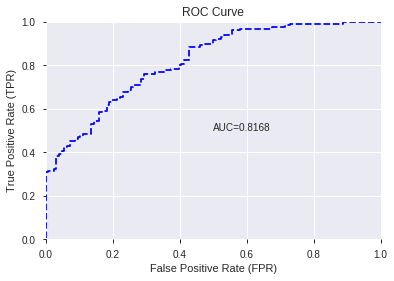

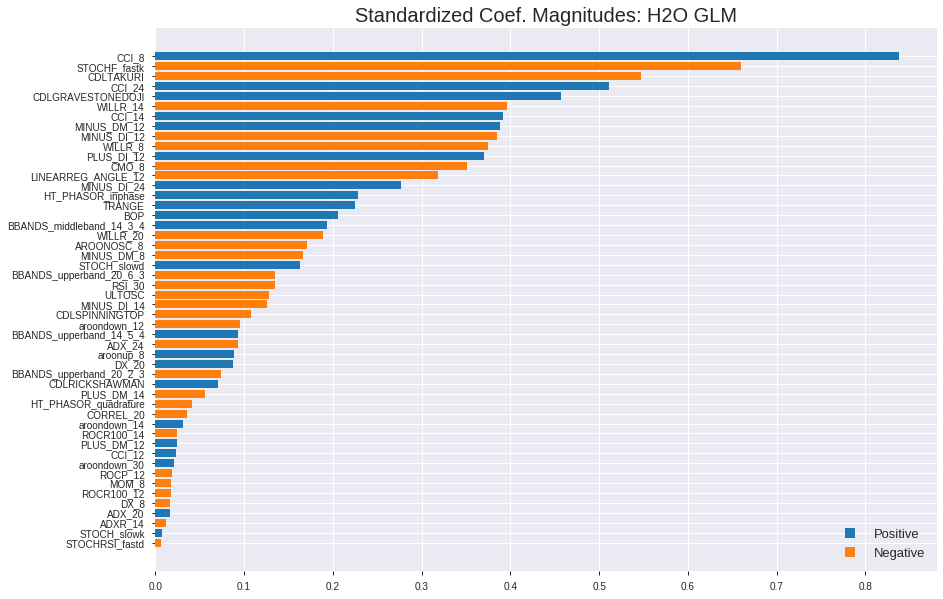

'log_likelihood'
--2019-12-08 07:41:24--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.138.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.138.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


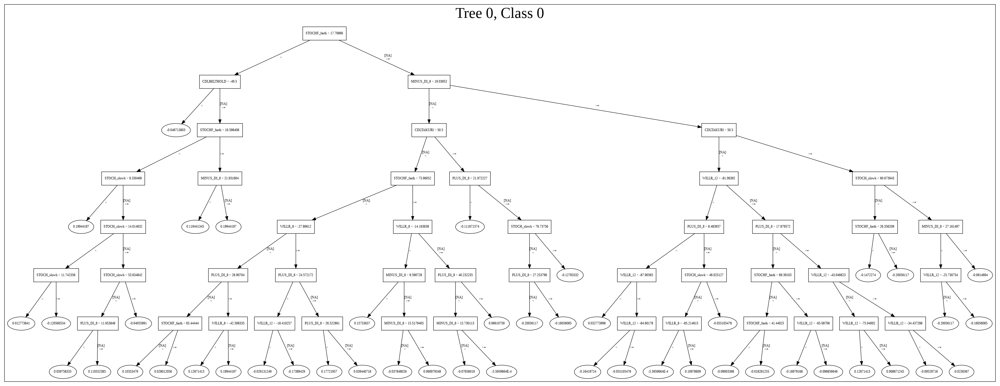

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_074115_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_074115_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_121_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_121

['CCI_8',
 'STOCHF_fastk',
 'CDLTAKURI',
 'CCI_24',
 'CDLGRAVESTONEDOJI',
 'WILLR_14',
 'CCI_14',
 'MINUS_DM_12',
 'MINUS_DI_12',
 'WILLR_8',
 'PLUS_DI_12',
 'CMO_8',
 'LINEARREG_ANGLE_12',
 'MINUS_DI_24',
 'HT_PHASOR_inphase',
 'TRANGE',
 'BOP',
 'BBANDS_middleband_14_3_4',
 'WILLR_20',
 'AROONOSC_8',
 'MINUS_DM_8',
 'STOCH_slowd',
 'BBANDS_upperband_20_6_3',
 'RSI_30',
 'ULTOSC',
 'MINUS_DI_14',
 'CDLSPINNINGTOP',
 'aroondown_12',
 'BBANDS_upperband_14_5_4',
 'ADX_24',
 'aroonup_8',
 'DX_20',
 'BBANDS_upperband_20_2_3',
 'CDLRICKSHAWMAN',
 'PLUS_DM_14',
 'HT_PHASOR_quadrature',
 'CORREL_20',
 'aroondown_14',
 'ROCR100_14',
 'PLUS_DM_12',
 'CCI_12',
 'aroondown_30',
 'ROCP_12',
 'MOM_8',
 'ROCR100_12',
 'DX_8',
 'ADX_20',
 'ADXR_14',
 'STOCH_slowk',
 'STOCHRSI_fastd']

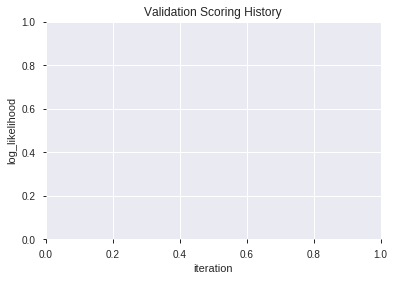

In [93]:
# GLM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_074221_model_2,0.818803,0.524276,0.287973,0.419415,0.175909
1,XGBoost_grid_1_AutoML_20191208_074221_model_6,0.818803,0.516866,0.276435,0.417186,0.174044
2,XGBoost_2_AutoML_20191208_074221,0.814347,0.522096,0.283394,0.419137,0.175676
3,XGBoost_grid_1_AutoML_20191208_074221_model_3,0.813858,0.527183,0.287973,0.421101,0.177326
4,XGBoost_1_AutoML_20191208_074221,0.812088,0.525931,0.242979,0.420982,0.177226
5,XGBoost_3_AutoML_20191208_074221,0.811600,0.526441,0.300366,0.421264,0.177463
6,XGBoost_grid_1_AutoML_20191208_074221_model_5,0.808669,0.532073,0.296032,0.424654,0.180331
7,XGBoost_grid_1_AutoML_20191208_074221_model_4,0.808364,0.533499,0.300122,0.423539,0.179385
8,XGBoost_grid_1_AutoML_20191208_074221_model_1,0.806105,0.529478,0.299878,0.423633,0.179465
9,XGBoost_grid_1_AutoML_20191208_074221_model_7,0.804945,0.533934,0.287363,0.425229,0.180820


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,1631.805664,1.000000,0.166128
1,CDLGRAVESTONEDOJI,902.723999,0.553206,0.091903
2,STOCHF_fastk,848.823853,0.520175,0.086416
3,CCI_8,642.707031,0.393862,0.065432
4,WILLR_8,599.170654,0.367183,0.060999
5,BOP,499.299927,0.305980,0.050832
6,ULTOSC,398.503082,0.244210,0.040570
7,WILLR_14,225.542099,0.138216,0.022962
8,CORREL_20,223.178955,0.136768,0.022721
9,STOCH_slowd,221.323624,0.135631,0.022532


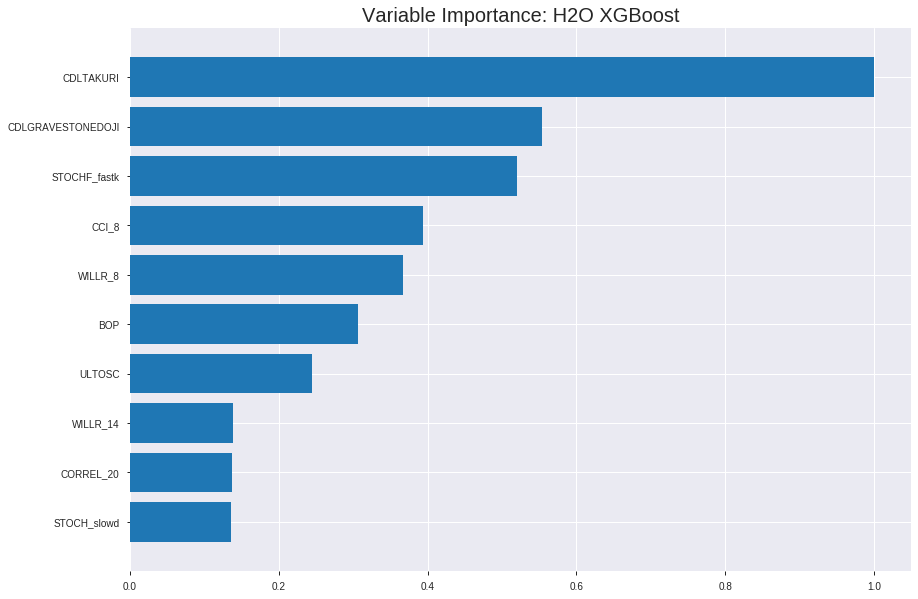

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_074221_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13988128235894573
RMSE: 0.3740070619105283
LogLoss: 0.44465906203199257
Mean Per-Class Error: 0.16504955307038638
AUC: 0.9187084135000801
pr_auc: 0.9144026929991023
Gini: 0.8374168270001603
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46603449061512947: 


,0,1,Error,Rate
0,674.0,217.0,0.2435,(217.0/891.0)
1,79.0,817.0,0.0882,(79.0/896.0)
Total,753.0,1034.0,0.1656,(296.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4660345,0.8466321,217.0
max f2,0.3983170,0.9081420,252.0
max f0point5,0.5774475,0.8482143,155.0
max accuracy,0.5198341,0.8349189,188.0
max precision,0.9383904,1.0,0.0
max recall,0.1788377,1.0,343.0
max specificity,0.9383904,1.0,0.0
max absolute_mcc,0.4660345,0.6766998,217.0
max min_per_class_accuracy,0.5128675,0.8314732,191.0
max mean_per_class_accuracy,0.5198341,0.8349504,188.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9157686,1.9944196,1.9944196,1.0,0.9254492,1.0,0.9254492,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9029253,1.9944196,1.9944196,1.0,0.9092129,1.0,0.9173311,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8959019,1.9944196,1.9944196,1.0,0.9003529,1.0,0.9116717,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8844517,1.9944196,1.9944196,1.0,0.8901609,1.0,0.9062940,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8764112,1.8836186,1.9722594,0.9444444,0.8810560,0.9888889,0.9012464,0.0189732,0.0993304,88.3618552,97.2259425
,6,0.1001679,0.8271362,1.9720104,1.9721356,0.9887640,0.8518537,0.9888268,0.8766880,0.0982143,0.1975446,97.2010433,97.2135625
,7,0.1499720,0.7621329,1.8823736,1.9423266,0.9438202,0.7947833,0.9738806,0.8494883,0.09375,0.2912946,88.2373596,94.2326592
,8,0.2003358,0.7105242,1.8836186,1.9275676,0.9444444,0.7336899,0.9664804,0.8203770,0.0948661,0.3861607,88.3618552,92.7567588
,9,0.2999440,0.6378539,1.7703275,1.8753498,0.8876404,0.6747484,0.9402985,0.7720152,0.1763393,0.5625,77.0327548,87.5349813
,10,0.4001119,0.5705539,1.4484612,1.7684784,0.7262570,0.6016444,0.8867133,0.7293630,0.1450893,0.7075893,44.8461193,76.8478397




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17998654941272407
RMSE: 0.42424821674666363
LogLoss: 0.5355797688170537
Mean Per-Class Error: 0.2673722963644731
AUC: 0.8084752262616965
pr_auc: 0.787733470865532
Gini: 0.6169504525233931
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4121818244457245: 


,0,1,Error,Rate
0,149.0,116.0,0.4377,(116.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,179.0,332.0,0.2857,(146.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4121818,0.7474048,260.0
max f2,0.3278930,0.8442504,303.0
max f0point5,0.6150764,0.7346723,141.0
max accuracy,0.5422229,0.7299413,182.0
max precision,0.9213424,1.0,0.0
max recall,0.1003924,1.0,381.0
max specificity,0.9213424,1.0,0.0
max absolute_mcc,0.4659260,0.4687413,226.0
max min_per_class_accuracy,0.5132525,0.7235772,198.0
max mean_per_class_accuracy,0.4659260,0.7326277,226.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.49 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9066232,2.0772358,2.0772358,1.0,0.9160395,1.0,0.9160395,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8977758,2.0772358,2.0772358,1.0,0.9025331,1.0,0.9099002,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8893846,1.6617886,1.9474085,0.8,0.8912549,0.9375,0.9040736,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8803870,1.2463415,1.7804878,0.6,0.8854401,0.8571429,0.8996370,0.0121951,0.0731707,24.6341463,78.0487805
,5,0.0508806,0.8739161,2.0772358,1.8375547,1.0,0.8779500,0.8846154,0.8954664,0.0203252,0.0934959,107.7235772,83.7554722
,6,0.1017613,0.8453917,2.0772358,1.9573952,1.0,0.8602936,0.9423077,0.8778800,0.1056911,0.1991870,107.7235772,95.7395247
,7,0.1506849,0.8005390,1.8279675,1.9153732,0.88,0.8276360,0.9220779,0.8615670,0.0894309,0.2886179,82.7967480,91.5373245
,8,0.2015656,0.7293167,1.7576610,1.8755624,0.8461538,0.7755720,0.9029126,0.8398595,0.0894309,0.3780488,75.7661038,87.5562396
,9,0.3013699,0.6453512,1.2626335,1.6725795,0.6078431,0.6881614,0.8051948,0.7896219,0.1260163,0.5040650,26.2633509,67.2579453
,10,0.4011742,0.5669577,1.0997131,1.5300615,0.5294118,0.6044060,0.7365854,0.7435438,0.1097561,0.6138211,9.9713056,53.0061471



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:42:24,0.676 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-08 07:42:25,0.719 sec,5.0,0.4792728,0.6523017,0.8098940,0.6250399,1.8725384,0.3133744,0.4801892,0.6540445,0.7716828,0.4994380,1.9110569,0.3209393
,2019-12-08 07:42:25,0.745 sec,10.0,0.4641291,0.6226179,0.8214148,0.6775878,1.9348847,0.2921097,0.4667493,0.6274962,0.7792376,0.6053238,1.9849142,0.3228963
,2019-12-08 07:42:25,0.776 sec,15.0,0.4521876,0.5990220,0.8345734,0.7491779,1.9439280,0.2663682,0.4564008,0.6066761,0.7896380,0.7101116,1.8695122,0.2974560
,2019-12-08 07:42:25,0.809 sec,20.0,0.4426393,0.5796350,0.8400448,0.7742236,1.9611793,0.2574147,0.4486020,0.5904192,0.7969627,0.7223122,1.9618338,0.2876712
,2019-12-08 07:42:25,0.843 sec,25.0,0.4348337,0.5635911,0.8457742,0.8212237,1.9944196,0.2585339,0.4421547,0.5768223,0.8042721,0.7644665,2.0772358,0.2857143
,2019-12-08 07:42:25,0.877 sec,30.0,0.4278393,0.5489702,0.8500093,0.8283791,1.9944196,0.2484611,0.4372791,0.5661831,0.8065731,0.7656806,2.0772358,0.2857143
,2019-12-08 07:42:25,0.915 sec,35.0,0.4219165,0.5366871,0.8591802,0.8430030,1.9944196,0.2333520,0.4353054,0.5611150,0.8043642,0.7774481,2.0772358,0.2857143
,2019-12-08 07:42:25,0.952 sec,40.0,0.4158716,0.5244313,0.8639063,0.8615521,1.9944196,0.2283156,0.4321647,0.5543302,0.8065271,0.7933684,2.0772358,0.2915851
,2019-12-08 07:42:25,0.990 sec,45.0,0.4099315,0.5124718,0.8731894,0.8667086,1.9944196,0.2260772,0.4307852,0.5507509,0.8068569,0.7937708,2.0772358,0.2837573


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,1631.8056641,1.0,0.1661280
CDLGRAVESTONEDOJI,902.7239990,0.5532056,0.0919030
STOCHF_fastk,848.8238525,0.5201746,0.0864156
CCI_8,642.7070312,0.3938625,0.0654316
WILLR_8,599.1706543,0.3671826,0.0609993
---,---,---,---
ROCP_12,43.0334778,0.0263717,0.0043811
LINEARREG_ANGLE_12,28.4047832,0.0174070,0.0028918
aroondown_30,21.7824783,0.0133487,0.0022176
AROONOSC_8,9.3768978,0.0057463,0.0009546



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7421875)

('F1', 0.760655737704918)

('auc', 0.8188034188034188)

('logloss', 0.5242764387716039)

('mean_per_class_error', 0.256043956043956)

('rmse', 0.4194149003665366)

('mse', 0.17590885864947184)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


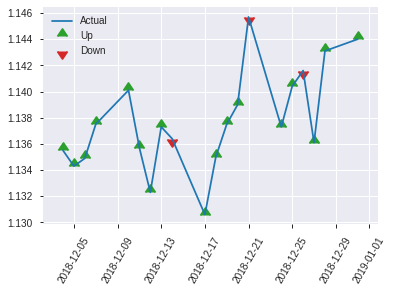


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17590885864947184
RMSE: 0.4194149003665366
LogLoss: 0.5242764387716039
Mean Per-Class Error: 0.256043956043956
AUC: 0.8188034188034188
pr_auc: 0.8335168728864302
Gini: 0.6376068376068376
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3977983295917511: 


,0,1,Error,Rate
0,67.0,59.0,0.4683,(59.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,81.0,175.0,0.2852,(73.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3977983,0.7606557,174.0
max f2,0.1852377,0.86,229.0
max f0point5,0.6236511,0.7746479,73.0
max accuracy,0.5564138,0.7421875,99.0
max precision,0.9206589,1.0,0.0
max recall,0.0869912,1.0,244.0
max specificity,0.9206589,1.0,0.0
max absolute_mcc,0.5564138,0.4999611,99.0
max min_per_class_accuracy,0.5025216,0.7222222,128.0
max mean_per_class_accuracy,0.5564138,0.7439560,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9060869,1.9692308,1.9692308,1.0,0.9151558,1.0,0.9151558,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9002014,1.9692308,1.9692308,1.0,0.9026585,1.0,0.9089071,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8890200,1.9692308,1.9692308,1.0,0.8947729,1.0,0.9053736,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8797615,1.9692308,1.9692308,1.0,0.8830892,1.0,0.8992960,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8766794,1.9692308,1.9692308,1.0,0.8781687,1.0,0.8960457,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8318106,1.9692308,1.9692308,1.0,0.8573982,1.0,0.8767219,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7876091,1.8177515,1.9187377,0.9230769,0.8060644,0.9743590,0.8531694,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7098360,1.6662722,1.8556213,0.8461538,0.7412494,0.9423077,0.8251894,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.6195901,1.4178462,1.7134865,0.72,0.6631980,0.8701299,0.7725948,0.1384615,0.5153846,41.7846154,71.3486513
,10,0.4023438,0.5531230,1.2118343,1.5868559,0.6153846,0.5846022,0.8058252,0.7251404,0.1230769,0.6384615,21.1834320,58.6855863


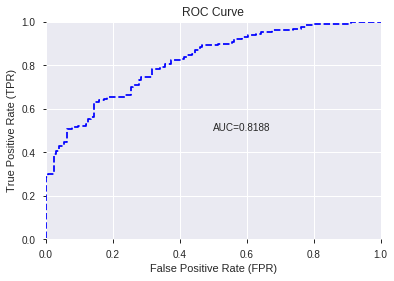

This function is available for GLM models only


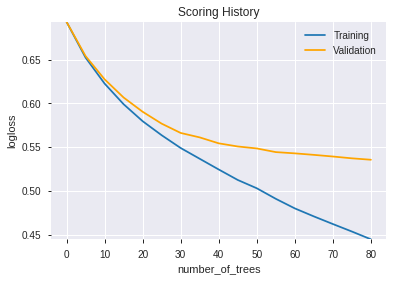

--2019-12-08 07:42:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.220
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.220|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

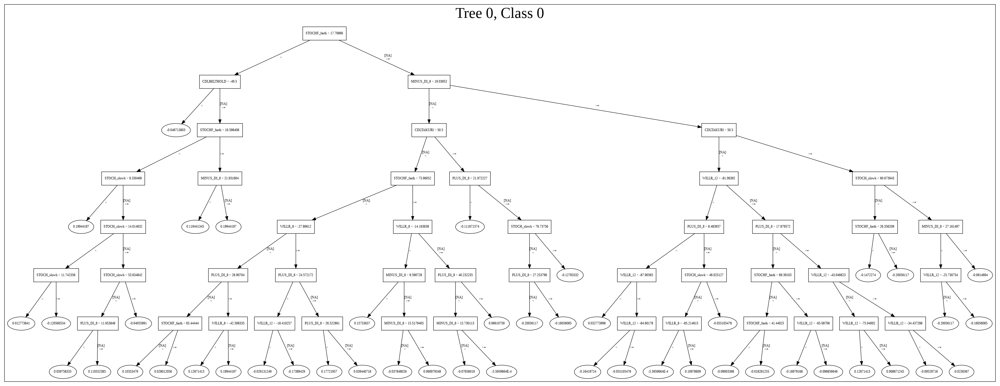

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_074221_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_074221_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_126_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'BOP',
 'ULTOSC',
 'WILLR_14',
 'CORREL_20',
 'STOCH_slowd',
 'TRANGE',
 'CCI_24',
 'DX_8',
 'MINUS_DI_24',
 'ADXR_14',
 'STOCHRSI_fastd',
 'aroonup_8',
 'RSI_30',
 'STOCH_slowk',
 'HT_PHASOR_quadrature',
 'HT_PHASOR_inphase',
 'PLUS_DI_12',
 'CCI_14',
 'aroondown_12',
 'MINUS_DM_12',
 'MINUS_DM_8',
 'BBANDS_upperband_20_2_3',
 'DX_20',
 'BBANDS_upperband_20_6_3',
 'CDLRICKSHAWMAN',
 'ADX_24',
 'PLUS_DM_14',
 'ROCR100_14',
 'MINUS_DI_12',
 'PLUS_DM_12',
 'aroondown_14',
 'CMO_8',
 'WILLR_20',
 'CCI_12',
 'BBANDS_middleband_14_3_4',
 'MINUS_DI_14',
 'CDLSPINNINGTOP',
 'ADX_20',
 'BBANDS_upperband_14_5_4',
 'MOM_8',
 'ROCP_12',
 'LINEARREG_ANGLE_12',
 'aroondown_30',
 'AROONOSC_8',
 'ROCR100_12']

In [94]:
# XGBoost with recursive feature elimination
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [95]:
# DRF with recursive feature elimination
model_train(feature_name='RFE',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_074444,0.826190,0.512955,0.280403,0.414437,0.171758
1,GBM_2_AutoML_20191208_074444,0.824237,0.513202,0.264164,0.415221,0.172409
2,GBM_3_AutoML_20191208_074444,0.820940,0.513263,0.263309,0.417235,0.174085
3,GBM_grid_1_AutoML_20191208_074444_model_1,0.817094,0.579471,0.259096,0.442642,0.195932
4,GBM_1_AutoML_20191208_074444,0.815507,0.524569,0.234310,0.419985,0.176388
5,GBM_4_AutoML_20191208_074444,0.815201,0.516586,0.271368,0.419178,0.175710
6,GBM_grid_1_AutoML_20191208_074444_model_2,0.809921,0.595129,0.279426,0.450527,0.202975
7,GBM_grid_1_AutoML_20191208_074444_model_4,0.806532,0.655372,0.254762,0.480834,0.231201
8,GBM_grid_1_AutoML_20191208_074444_model_5,0.790659,0.685593,0.300122,0.496209,0.246224
9,GBM_grid_1_AutoML_20191208_074444_model_3,0.780342,0.672699,0.294444,0.455096,0.207112


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,176.761810,1.000000,0.181589
1,CDLGRAVESTONEDOJI,130.445389,0.737973,0.134008
2,STOCHF_fastk,76.813705,0.434561,0.078911
3,WILLR_8,72.820381,0.411969,0.074809
4,CCI_8,67.711639,0.383067,0.069561
5,ULTOSC,45.020267,0.254695,0.046250
6,CCI_14,29.997841,0.169708,0.030817
7,aroonup_8,25.180569,0.142455,0.025868
8,WILLR_14,24.153042,0.136642,0.024813
9,aroondown_14,20.337933,0.115058,0.020893


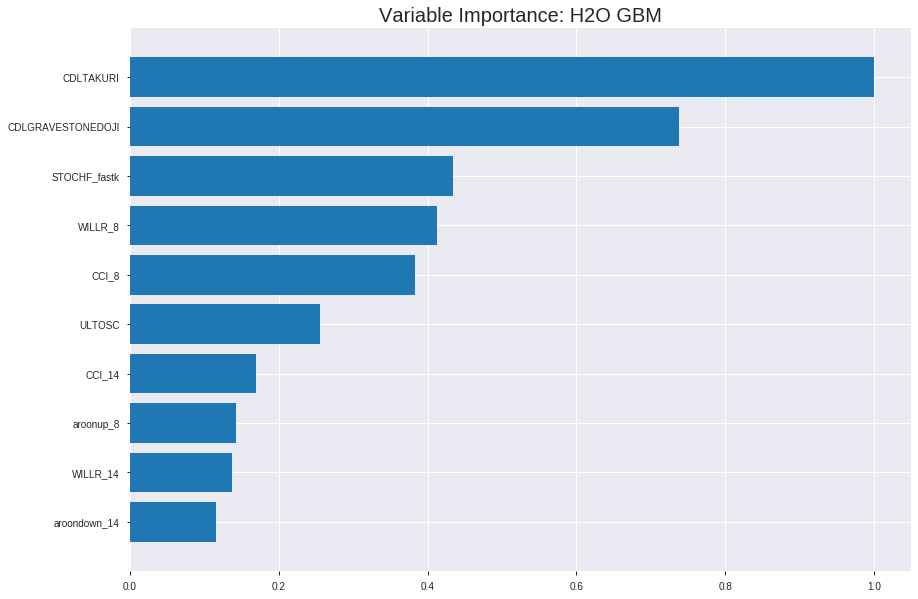

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_074444


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1433607061950761
RMSE: 0.3786300386856226
LogLoss: 0.45138397403250946
Mean Per-Class Error: 0.17735452240660576
AUC: 0.8953886584094917
pr_auc: 0.8900118144936429
Gini: 0.7907773168189833
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44192261598526894: 


,0,1,Error,Rate
0,635.0,256.0,0.2873,(256.0/891.0)
1,89.0,807.0,0.0993,(89.0/896.0)
Total,724.0,1063.0,0.1931,(345.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4419226,0.8238897,229.0
max f2,0.3556044,0.8900578,267.0
max f0point5,0.5417195,0.8285714,181.0
max accuracy,0.5234350,0.8226077,191.0
max precision,0.9521641,1.0,0.0
max recall,0.0714919,1.0,385.0
max specificity,0.9521641,1.0,0.0
max absolute_mcc,0.5234350,0.6454931,191.0
max min_per_class_accuracy,0.5099996,0.8203125,197.0
max mean_per_class_accuracy,0.5234350,0.8226455,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9253543,1.9944196,1.9944196,1.0,0.9370509,1.0,0.9370509,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9118687,1.9944196,1.9944196,1.0,0.9170763,1.0,0.9270636,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9006431,1.8836186,1.9574859,0.9444444,0.9056940,0.9814815,0.9199404,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.8948434,1.8836186,1.9390191,0.9444444,0.8977085,0.9722222,0.9143824,0.0189732,0.078125,88.3618552,93.9019097
,5,0.0503637,0.8854897,1.8836186,1.9279390,0.9444444,0.8905449,0.9666667,0.9096149,0.0189732,0.0970982,88.3618552,92.7938988
,6,0.1001679,0.8389727,1.9720104,1.9498516,0.9887640,0.8635481,0.9776536,0.8867102,0.0982143,0.1953125,97.2010433,94.9851606
,7,0.1499720,0.7907247,1.8375552,1.9125591,0.9213483,0.8184210,0.9589552,0.8640321,0.0915179,0.2868304,83.7555177,91.2559135
,8,0.2003358,0.7466660,1.7728175,1.8774285,0.8888889,0.7680857,0.9413408,0.8399115,0.0892857,0.3761161,77.2817460,87.7428546
,9,0.2999440,0.6619523,1.7030999,1.8195358,0.8539326,0.7045206,0.9123134,0.7949496,0.1696429,0.5457589,70.3099920,81.9535831
,10,0.4001119,0.5861041,1.3927511,1.7126904,0.6983240,0.6239760,0.8587413,0.7521464,0.1395089,0.6852679,39.2751147,71.2690435




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17686486354758607
RMSE: 0.4205530448678098
LogLoss: 0.5277381144148929
Mean Per-Class Error: 0.26302346985734015
AUC: 0.8134759932504985
pr_auc: 0.7984041611879011
Gini: 0.6269519865009969
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37938310825786636: 


,0,1,Error,Rate
0,148.0,117.0,0.4415,(117.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,178.0,333.0,0.2877,(147.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3793831,0.7461140,259.0
max f2,0.3002557,0.8455344,296.0
max f0point5,0.6208313,0.7392197,138.0
max accuracy,0.5506166,0.7377691,176.0
max precision,0.9405133,1.0,0.0
max recall,0.0933707,1.0,381.0
max specificity,0.9405133,1.0,0.0
max absolute_mcc,0.5506166,0.4744561,176.0
max min_per_class_accuracy,0.5171928,0.7276423,192.0
max mean_per_class_accuracy,0.4966453,0.7369765,204.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9257744,2.0772358,2.0772358,1.0,0.9343881,1.0,0.9343881,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9184970,2.0772358,2.0772358,1.0,0.9211450,1.0,0.9283685,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9055249,1.6617886,1.9474085,0.8,0.9122475,0.9375,0.9233307,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8985443,2.0772358,1.9783198,1.0,0.9027160,0.9523810,0.9184224,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8909690,1.6617886,1.9174484,0.8,0.8957522,0.9230769,0.9140628,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.8610275,1.9973421,1.9573952,0.9615385,0.8745011,0.9423077,0.8942819,0.1016260,0.1991870,99.7342089,95.7395247
,7,0.1506849,0.8245735,1.5786992,1.8344420,0.76,0.8415047,0.8831169,0.8771465,0.0772358,0.2764228,57.8699187,83.4441981
,8,0.2015656,0.7851295,1.7576610,1.8150604,0.8461538,0.8069014,0.8737864,0.8594147,0.0894309,0.3658537,75.7661038,81.5060384
,9,0.3013699,0.6778253,1.5070142,1.7130451,0.7254902,0.7330551,0.8246753,0.8175684,0.1504065,0.5162602,50.7014188,71.3045085
,10,0.4011742,0.5899725,1.0589829,1.5503272,0.5098039,0.6262765,0.7463415,0.7699787,0.1056911,0.6219512,5.8982943,55.0327186



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:44:48,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 07:44:48,0.052 sec,5.0,0.4591695,0.6131469,0.8077670,0.5994752,1.7717868,0.2881925,0.4596748,0.6139244,0.7922841,0.4942233,1.8598506,0.3091977
,2019-12-08 07:44:48,0.094 sec,10.0,0.4394228,0.5736694,0.8226849,0.8028086,1.9944196,0.2674874,0.4441627,0.5819227,0.7955208,0.7746344,2.0772358,0.3013699
,2019-12-08 07:44:48,0.137 sec,15.0,0.4264471,0.5471683,0.8363978,0.8283674,1.9944196,0.2462227,0.4371434,0.5665038,0.7995858,0.7929173,2.0772358,0.2974560
,2019-12-08 07:44:48,0.183 sec,20.0,0.4167969,0.5266830,0.8461656,0.8353252,1.9944196,0.2473419,0.4320583,0.5538605,0.7994478,0.7935309,2.0772358,0.2818004
,2019-12-08 07:44:48,0.226 sec,25.0,0.4089055,0.5103624,0.8550529,0.8462671,1.9944196,0.2389480,0.4277981,0.5446034,0.8062510,0.7912736,2.0772358,0.2778865
,2019-12-08 07:44:48,0.275 sec,30.0,0.4026026,0.4973810,0.8634980,0.8577754,1.9944196,0.2411863,0.4245241,0.5372670,0.8108299,0.7992743,2.0772358,0.2759295
,2019-12-08 07:44:48,0.319 sec,35.0,0.3955276,0.4836472,0.8732789,0.8683504,1.9944196,0.2076105,0.4224854,0.5331818,0.8135987,0.7974264,2.0772358,0.2641879
,2019-12-08 07:44:48,0.366 sec,40.0,0.3896038,0.4722608,0.8815242,0.8748778,1.9944196,0.1986570,0.4212282,0.5299959,0.8151173,0.7990015,2.0772358,0.2759295
,2019-12-08 07:44:48,0.413 sec,45.0,0.3838182,0.4610831,0.8887185,0.8837374,1.9944196,0.1846670,0.4212825,0.5297295,0.8122488,0.7947457,2.0772358,0.2935421


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,176.7618103,1.0,0.1815887
CDLGRAVESTONEDOJI,130.4453888,0.7379727,0.1340075
STOCHF_fastk,76.8137054,0.4345605,0.0789113
WILLR_8,72.8203812,0.4119690,0.0748089
CCI_8,67.7116394,0.3830671,0.0695607
---,---,---,---
BBANDS_middleband_14_3_4,2.5744998,0.0145648,0.0026448
BBANDS_upperband_20_6_3,1.4839509,0.0083952,0.0015245
ROCP_12,1.2883272,0.0072885,0.0013235
MINUS_DI_14,1.1623259,0.0065757,0.0011941



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7578125)

('F1', 0.7702265372168284)

('auc', 0.8261904761904761)

('logloss', 0.5129553207408662)

('mean_per_class_error', 0.24041514041514045)

('rmse', 0.41443673187195884)

('mse', 0.17175780472470992)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


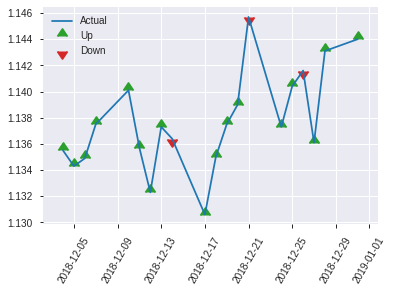


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17175780472470992
RMSE: 0.41443673187195884
LogLoss: 0.5129553207408662
Mean Per-Class Error: 0.24041514041514045
AUC: 0.8261904761904761
pr_auc: 0.8353450047299199
Gini: 0.6523809523809523
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36054405633357345: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,11.0,119.0,0.0846,(11.0/130.0)
Total,77.0,179.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3605441,0.7702265,178.0
max f2,0.3220795,0.8661972,189.0
max f0point5,0.5830662,0.7924528,99.0
max accuracy,0.5830662,0.7578125,99.0
max precision,0.9396306,1.0,0.0
max recall,0.0853742,1.0,245.0
max specificity,0.9396306,1.0,0.0
max absolute_mcc,0.5830662,0.5319907,99.0
max min_per_class_accuracy,0.5144818,0.7301587,128.0
max mean_per_class_accuracy,0.5830662,0.7595849,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9183087,1.9692308,1.9692308,1.0,0.9325786,1.0,0.9325786,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9081941,1.9692308,1.9692308,1.0,0.9103938,1.0,0.9214862,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9024340,1.9692308,1.9692308,1.0,0.9041017,1.0,0.9171401,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8973194,1.9692308,1.9692308,1.0,0.9008173,1.0,0.9126884,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8836170,1.9692308,1.9692308,1.0,0.8898119,1.0,0.9091690,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8496370,1.9692308,1.9692308,1.0,0.8667272,1.0,0.8879481,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8099307,1.8177515,1.9187377,0.9230769,0.8299194,0.9743590,0.8686052,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7551747,1.3633136,1.7798817,0.6923077,0.7761849,0.9038462,0.8455001,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6482617,1.4178462,1.6623377,0.72,0.7016173,0.8441558,0.7987849,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5757859,1.5147929,1.6250934,0.7692308,0.6098936,0.8252427,0.7511036,0.1538462,0.6538462,51.4792899,62.5093353


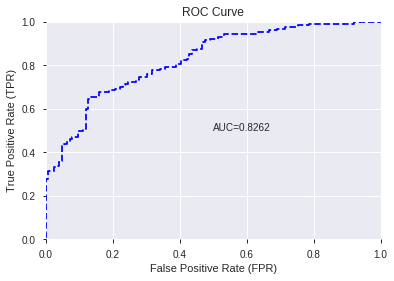

This function is available for GLM models only


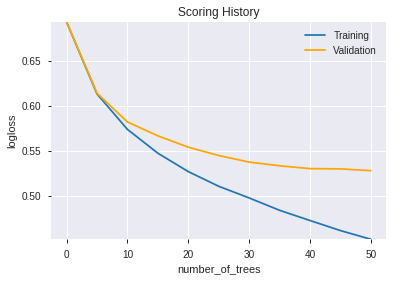

--2019-12-08 07:45:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.162.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.162.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       44
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            

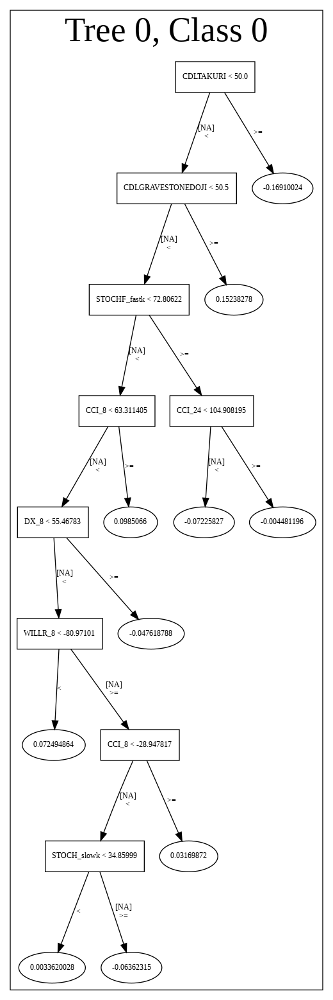

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_074444',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_074444',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_136_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_136_sid_9d28',
   'type': 'Ke

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'ULTOSC',
 'CCI_14',
 'aroonup_8',
 'WILLR_14',
 'aroondown_14',
 'PLUS_DI_12',
 'CORREL_20',
 'DX_8',
 'CCI_24',
 'LINEARREG_ANGLE_12',
 'aroondown_12',
 'STOCH_slowk',
 'STOCHRSI_fastd',
 'ADXR_14',
 'CCI_12',
 'STOCH_slowd',
 'TRANGE',
 'MINUS_DI_12',
 'HT_PHASOR_quadrature',
 'HT_PHASOR_inphase',
 'PLUS_DM_14',
 'BOP',
 'CDLRICKSHAWMAN',
 'ADX_20',
 'WILLR_20',
 'RSI_30',
 'MINUS_DM_12',
 'MINUS_DI_24',
 'aroondown_30',
 'ROCR100_12',
 'ADX_24',
 'CDLSPINNINGTOP',
 'ROCR100_14',
 'MOM_8',
 'MINUS_DM_8',
 'CMO_8',
 'BBANDS_upperband_20_2_3',
 'PLUS_DM_12',
 'BBANDS_upperband_14_5_4',
 'AROONOSC_8',
 'BBANDS_middleband_14_3_4',
 'BBANDS_upperband_20_6_3',
 'ROCP_12',
 'MINUS_DI_14',
 'DX_20']

In [96]:
# GBM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GBM",features_list=features_list)

In [97]:
# StackedEnsemble with recursive feature elimination
model_train(feature_name='RFE',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_074558,0.826190,0.512955,0.280403,0.414437,0.171758
1,GBM_2_AutoML_20191208_074558,0.824237,0.513202,0.264164,0.415221,0.172409
2,GBM_3_AutoML_20191208_074558,0.820940,0.513263,0.263309,0.417235,0.174085
3,GLM_grid_1_AutoML_20191208_074558_model_1,0.816850,0.511675,0.297009,0.416639,0.173588
4,GBM_1_AutoML_20191208_074558,0.815507,0.524569,0.234310,0.419985,0.176388
5,GBM_4_AutoML_20191208_074558,0.815201,0.516586,0.271368,0.419178,0.175710
6,XGBoost_2_AutoML_20191208_074558,0.814347,0.522096,0.283394,0.419137,0.175676
7,XGBoost_1_AutoML_20191208_074558,0.812088,0.525931,0.242979,0.420982,0.177226
8,XGBoost_3_AutoML_20191208_074558,0.811600,0.526441,0.300366,0.421264,0.177463
9,DRF_1_AutoML_20191208_074558,0.758028,0.714242,0.298291,0.449196,0.201777


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,176.761810,1.000000,0.181589
1,CDLGRAVESTONEDOJI,130.445389,0.737973,0.134008
2,STOCHF_fastk,76.813705,0.434561,0.078911
3,WILLR_8,72.820381,0.411969,0.074809
4,CCI_8,67.711639,0.383067,0.069561
5,ULTOSC,45.020267,0.254695,0.046250
6,CCI_14,29.997841,0.169708,0.030817
7,aroonup_8,25.180569,0.142455,0.025868
8,WILLR_14,24.153042,0.136642,0.024813
9,aroondown_14,20.337933,0.115058,0.020893


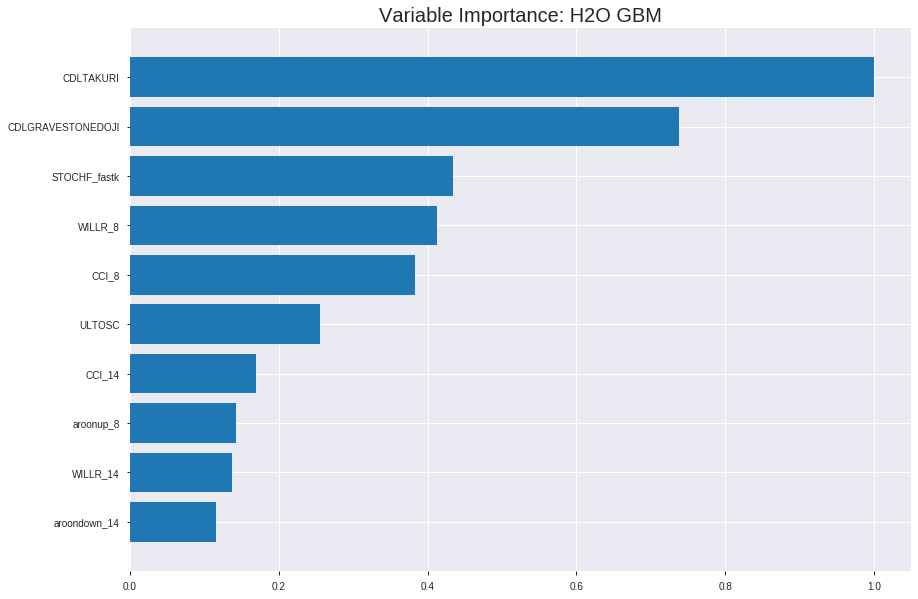

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_074558


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1433607061950761
RMSE: 0.3786300386856226
LogLoss: 0.45138397403250946
Mean Per-Class Error: 0.17735452240660576
AUC: 0.8953886584094917
pr_auc: 0.8900118144936429
Gini: 0.7907773168189833
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44192261598526894: 


,0,1,Error,Rate
0,635.0,256.0,0.2873,(256.0/891.0)
1,89.0,807.0,0.0993,(89.0/896.0)
Total,724.0,1063.0,0.1931,(345.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4419226,0.8238897,229.0
max f2,0.3556044,0.8900578,267.0
max f0point5,0.5417195,0.8285714,181.0
max accuracy,0.5234350,0.8226077,191.0
max precision,0.9521641,1.0,0.0
max recall,0.0714919,1.0,385.0
max specificity,0.9521641,1.0,0.0
max absolute_mcc,0.5234350,0.6454931,191.0
max min_per_class_accuracy,0.5099996,0.8203125,197.0
max mean_per_class_accuracy,0.5234350,0.8226455,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9253543,1.9944196,1.9944196,1.0,0.9370509,1.0,0.9370509,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9118687,1.9944196,1.9944196,1.0,0.9170763,1.0,0.9270636,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9006431,1.8836186,1.9574859,0.9444444,0.9056940,0.9814815,0.9199404,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.8948434,1.8836186,1.9390191,0.9444444,0.8977085,0.9722222,0.9143824,0.0189732,0.078125,88.3618552,93.9019097
,5,0.0503637,0.8854897,1.8836186,1.9279390,0.9444444,0.8905449,0.9666667,0.9096149,0.0189732,0.0970982,88.3618552,92.7938988
,6,0.1001679,0.8389727,1.9720104,1.9498516,0.9887640,0.8635481,0.9776536,0.8867102,0.0982143,0.1953125,97.2010433,94.9851606
,7,0.1499720,0.7907247,1.8375552,1.9125591,0.9213483,0.8184210,0.9589552,0.8640321,0.0915179,0.2868304,83.7555177,91.2559135
,8,0.2003358,0.7466660,1.7728175,1.8774285,0.8888889,0.7680857,0.9413408,0.8399115,0.0892857,0.3761161,77.2817460,87.7428546
,9,0.2999440,0.6619523,1.7030999,1.8195358,0.8539326,0.7045206,0.9123134,0.7949496,0.1696429,0.5457589,70.3099920,81.9535831
,10,0.4001119,0.5861041,1.3927511,1.7126904,0.6983240,0.6239760,0.8587413,0.7521464,0.1395089,0.6852679,39.2751147,71.2690435




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17686486354758607
RMSE: 0.4205530448678098
LogLoss: 0.5277381144148929
Mean Per-Class Error: 0.26302346985734015
AUC: 0.8134759932504985
pr_auc: 0.7984041611879011
Gini: 0.6269519865009969
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37938310825786636: 


,0,1,Error,Rate
0,148.0,117.0,0.4415,(117.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,178.0,333.0,0.2877,(147.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3793831,0.7461140,259.0
max f2,0.3002557,0.8455344,296.0
max f0point5,0.6208313,0.7392197,138.0
max accuracy,0.5506166,0.7377691,176.0
max precision,0.9405133,1.0,0.0
max recall,0.0933707,1.0,381.0
max specificity,0.9405133,1.0,0.0
max absolute_mcc,0.5506166,0.4744561,176.0
max min_per_class_accuracy,0.5171928,0.7276423,192.0
max mean_per_class_accuracy,0.4966453,0.7369765,204.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9257744,2.0772358,2.0772358,1.0,0.9343881,1.0,0.9343881,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9184970,2.0772358,2.0772358,1.0,0.9211450,1.0,0.9283685,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9055249,1.6617886,1.9474085,0.8,0.9122475,0.9375,0.9233307,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8985443,2.0772358,1.9783198,1.0,0.9027160,0.9523810,0.9184224,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8909690,1.6617886,1.9174484,0.8,0.8957522,0.9230769,0.9140628,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.8610275,1.9973421,1.9573952,0.9615385,0.8745011,0.9423077,0.8942819,0.1016260,0.1991870,99.7342089,95.7395247
,7,0.1506849,0.8245735,1.5786992,1.8344420,0.76,0.8415047,0.8831169,0.8771465,0.0772358,0.2764228,57.8699187,83.4441981
,8,0.2015656,0.7851295,1.7576610,1.8150604,0.8461538,0.8069014,0.8737864,0.8594147,0.0894309,0.3658537,75.7661038,81.5060384
,9,0.3013699,0.6778253,1.5070142,1.7130451,0.7254902,0.7330551,0.8246753,0.8175684,0.1504065,0.5162602,50.7014188,71.3045085
,10,0.4011742,0.5899725,1.0589829,1.5503272,0.5098039,0.6262765,0.7463415,0.7699787,0.1056911,0.6219512,5.8982943,55.0327186



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:46:07,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-08 07:46:07,0.051 sec,5.0,0.4591695,0.6131469,0.8077670,0.5994752,1.7717868,0.2881925,0.4596748,0.6139244,0.7922841,0.4942233,1.8598506,0.3091977
,2019-12-08 07:46:07,0.097 sec,10.0,0.4394228,0.5736694,0.8226849,0.8028086,1.9944196,0.2674874,0.4441627,0.5819227,0.7955208,0.7746344,2.0772358,0.3013699
,2019-12-08 07:46:07,0.141 sec,15.0,0.4264471,0.5471683,0.8363978,0.8283674,1.9944196,0.2462227,0.4371434,0.5665038,0.7995858,0.7929173,2.0772358,0.2974560
,2019-12-08 07:46:07,0.191 sec,20.0,0.4167969,0.5266830,0.8461656,0.8353252,1.9944196,0.2473419,0.4320583,0.5538605,0.7994478,0.7935309,2.0772358,0.2818004
,2019-12-08 07:46:07,0.241 sec,25.0,0.4089055,0.5103624,0.8550529,0.8462671,1.9944196,0.2389480,0.4277981,0.5446034,0.8062510,0.7912736,2.0772358,0.2778865
,2019-12-08 07:46:07,0.313 sec,30.0,0.4026026,0.4973810,0.8634980,0.8577754,1.9944196,0.2411863,0.4245241,0.5372670,0.8108299,0.7992743,2.0772358,0.2759295
,2019-12-08 07:46:07,0.357 sec,35.0,0.3955276,0.4836472,0.8732789,0.8683504,1.9944196,0.2076105,0.4224854,0.5331818,0.8135987,0.7974264,2.0772358,0.2641879
,2019-12-08 07:46:07,0.402 sec,40.0,0.3896038,0.4722608,0.8815242,0.8748778,1.9944196,0.1986570,0.4212282,0.5299959,0.8151173,0.7990015,2.0772358,0.2759295
,2019-12-08 07:46:07,0.455 sec,45.0,0.3838182,0.4610831,0.8887185,0.8837374,1.9944196,0.1846670,0.4212825,0.5297295,0.8122488,0.7947457,2.0772358,0.2935421


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,176.7618103,1.0,0.1815887
CDLGRAVESTONEDOJI,130.4453888,0.7379727,0.1340075
STOCHF_fastk,76.8137054,0.4345605,0.0789113
WILLR_8,72.8203812,0.4119690,0.0748089
CCI_8,67.7116394,0.3830671,0.0695607
---,---,---,---
BBANDS_middleband_14_3_4,2.5744998,0.0145648,0.0026448
BBANDS_upperband_20_6_3,1.4839509,0.0083952,0.0015245
ROCP_12,1.2883272,0.0072885,0.0013235
MINUS_DI_14,1.1623259,0.0065757,0.0011941



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7578125)

('F1', 0.7702265372168284)

('auc', 0.8261904761904761)

('logloss', 0.5129553207408662)

('mean_per_class_error', 0.24041514041514045)

('rmse', 0.41443673187195884)

('mse', 0.17175780472470992)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


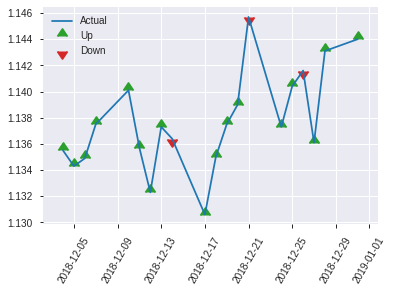


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17175780472470992
RMSE: 0.41443673187195884
LogLoss: 0.5129553207408662
Mean Per-Class Error: 0.24041514041514045
AUC: 0.8261904761904761
pr_auc: 0.8353450047299199
Gini: 0.6523809523809523
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36054405633357345: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,11.0,119.0,0.0846,(11.0/130.0)
Total,77.0,179.0,0.2773,(71.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3605441,0.7702265,178.0
max f2,0.3220795,0.8661972,189.0
max f0point5,0.5830662,0.7924528,99.0
max accuracy,0.5830662,0.7578125,99.0
max precision,0.9396306,1.0,0.0
max recall,0.0853742,1.0,245.0
max specificity,0.9396306,1.0,0.0
max absolute_mcc,0.5830662,0.5319907,99.0
max min_per_class_accuracy,0.5144818,0.7301587,128.0
max mean_per_class_accuracy,0.5830662,0.7595849,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9183087,1.9692308,1.9692308,1.0,0.9325786,1.0,0.9325786,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9081941,1.9692308,1.9692308,1.0,0.9103938,1.0,0.9214862,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9024340,1.9692308,1.9692308,1.0,0.9041017,1.0,0.9171401,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8973194,1.9692308,1.9692308,1.0,0.9008173,1.0,0.9126884,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8836170,1.9692308,1.9692308,1.0,0.8898119,1.0,0.9091690,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8496370,1.9692308,1.9692308,1.0,0.8667272,1.0,0.8879481,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8099307,1.8177515,1.9187377,0.9230769,0.8299194,0.9743590,0.8686052,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7551747,1.3633136,1.7798817,0.6923077,0.7761849,0.9038462,0.8455001,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6482617,1.4178462,1.6623377,0.72,0.7016173,0.8441558,0.7987849,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5757859,1.5147929,1.6250934,0.7692308,0.6098936,0.8252427,0.7511036,0.1538462,0.6538462,51.4792899,62.5093353


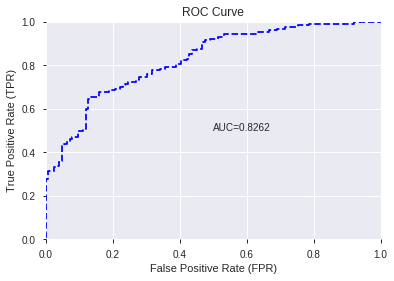

This function is available for GLM models only


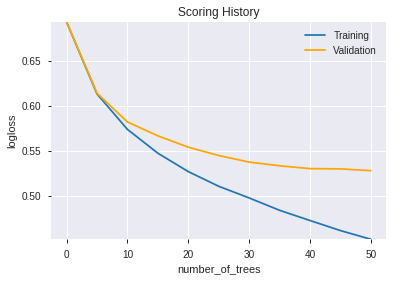

--2019-12-08 07:46:15--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.233.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.233.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       44
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            

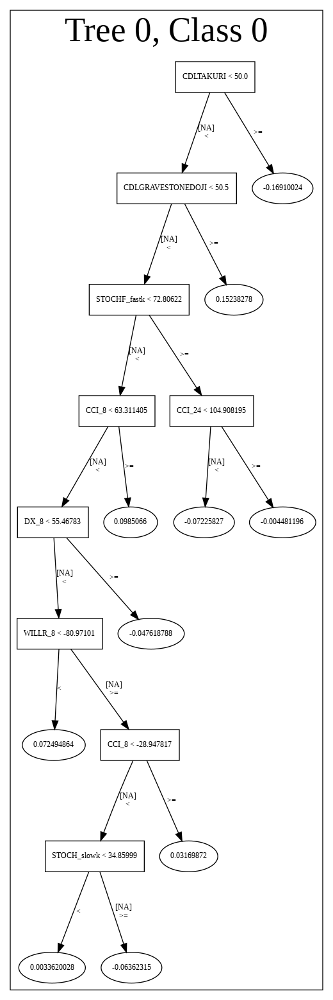

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_074558',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_074558',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_144_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_144_sid_9d28',
   'type': 'Ke

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'ULTOSC',
 'CCI_14',
 'aroonup_8',
 'WILLR_14',
 'aroondown_14',
 'PLUS_DI_12',
 'CORREL_20',
 'DX_8',
 'CCI_24',
 'LINEARREG_ANGLE_12',
 'aroondown_12',
 'STOCH_slowk',
 'STOCHRSI_fastd',
 'ADXR_14',
 'CCI_12',
 'STOCH_slowd',
 'TRANGE',
 'MINUS_DI_12',
 'HT_PHASOR_quadrature',
 'HT_PHASOR_inphase',
 'PLUS_DM_14',
 'BOP',
 'CDLRICKSHAWMAN',
 'ADX_20',
 'WILLR_20',
 'RSI_30',
 'MINUS_DM_12',
 'MINUS_DI_24',
 'aroondown_30',
 'ROCR100_12',
 'ADX_24',
 'CDLSPINNINGTOP',
 'ROCR100_14',
 'MOM_8',
 'MINUS_DM_8',
 'CMO_8',
 'BBANDS_upperband_20_2_3',
 'PLUS_DM_12',
 'BBANDS_upperband_14_5_4',
 'AROONOSC_8',
 'BBANDS_middleband_14_3_4',
 'BBANDS_upperband_20_6_3',
 'ROCP_12',
 'MINUS_DI_14',
 'DX_20']

In [98]:
# All algos with recursive feature elimination
model_train(feature_name='RFE',model_algo=None,features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFECV' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=cv_rfe).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

In [100]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DeepLearning",features_list=features_list)

[]

In [101]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GLM",features_list=features_list)

[]

In [102]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="XGBoost",features_list=features_list)

[]

In [103]:
# DRF with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DRF",features_list=features_list)

[]

In [104]:
# GBM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GBM",features_list=features_list)

[]

In [105]:
# StackedEnsemble with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="StackedEnsemble",features_list=features_list)

[]

In [106]:
# All algos with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo=None,features_list=features_list)

[]

In [107]:
# Stacked ensemble

## filter models based on ensemble_model_threshold
models_arr = []
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_arr.append(best_models[model_name]['id'])

from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

try:
  ensemble = H2OStackedEnsembleEstimator(seed=1,
                                        base_models=models_arr)

  ensemble.train(y=data_label_name, training_frame=train_hf[:index_splits[0],:], blending_frame =train_hf[index_splits[0]:index_splits[1],:])
except:
  pass

try:
  display(ensemble)
  model_performance = ensemble.model_performance(test_data=train_hf[index_splits[1]:,:])
  display(model_performance)
  for k in models_summary:
    result = getattr(model_performance, k)()
    result = result[0][1] if isinstance(result,list) else result
    models_summary[k] = models_summary[k].append(pd.DataFrame({'StackedEnsemble':[result]},index=['All']))
    display((k,result))
except Exception as e:
  print(e)

stackedensemble Model Build progress: |███████████████████████████████████| 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_model_python_1575786092935_4966
No model summary for this model


ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.11812049239966894
RMSE: 0.3436866194655663
LogLoss: 0.38953772521951213
Null degrees of freedom: 1786
Residual degrees of freedom: 1780
Null deviance: 2480.1522530898064
Residual deviance: 1392.2078299345362
AIC: 1406.2078299345362
AUC: 0.9343446869488536
pr_auc: 0.9303700976842775
Gini: 0.8686893738977073
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4570853202771208: 


,0,1,Error,Rate
0,751.0,140.0,0.1571,(140.0/891.0)
1,96.0,800.0,0.1071,(96.0/896.0)
Total,847.0,940.0,0.1321,(236.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4570853,0.8714597,218.0
max f2,0.3043729,0.9093763,283.0
max f0point5,0.5474495,0.8791209,179.0
max accuracy,0.4795426,0.8690543,208.0
max precision,0.9273057,1.0,0.0
max recall,0.1075899,1.0,368.0
max specificity,0.9273057,1.0,0.0
max absolute_mcc,0.4719036,0.7382751,211.0
max min_per_class_accuracy,0.4871845,0.8675645,205.0
max mean_per_class_accuracy,0.4795426,0.8690345,208.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 47.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9171430,1.9944196,1.9944196,1.0,0.9216588,1.0,0.9216588,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9115325,1.9944196,1.9944196,1.0,0.9141390,1.0,0.9178989,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9066533,1.9944196,1.9944196,1.0,0.9085449,1.0,0.9147809,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9023088,1.9944196,1.9944196,1.0,0.9046139,1.0,0.9122392,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8996711,1.9944196,1.9944196,1.0,0.9009456,1.0,0.9099804,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8712645,1.9944196,1.9944196,1.0,0.8863895,1.0,0.8982509,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8168394,1.8375552,1.9423266,0.9213483,0.8417957,0.9738806,0.8795027,0.0915179,0.2912946,83.7555177,94.2326592
,8,0.2003358,0.7604775,1.8614583,1.9219966,0.9333333,0.7866390,0.9636872,0.8561571,0.09375,0.3850446,86.1458333,92.1996583
,9,0.2999440,0.6747073,1.8599644,1.9013963,0.9325843,0.7165180,0.9533582,0.8097844,0.1852679,0.5703125,85.9964386,90.1396339
,10,0.4001119,0.5798382,1.6378753,1.8354240,0.8212291,0.6318141,0.9202797,0.7652296,0.1640625,0.734375,63.7875349,83.5423951



ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.16916727430599915
RMSE: 0.41129949465808874
LogLoss: 0.503560151311256
Null degrees of freedom: 255
Residual degrees of freedom: 249
Null deviance: 355.54311469335516
Residual deviance: 257.8227974713631
AIC: 271.8227974713631
AUC: 0.834004884004884
pr_auc: 0.839621125145283
Gini: 0.6680097680097681
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29117541970992367: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,9.0,121.0,0.0692,(9.0/130.0)
Total,75.0,181.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2911754,0.7781350,180.0
max f2,0.1515138,0.8719346,213.0
max f0point5,0.4408807,0.7615385,129.0
max accuracy,0.4408807,0.7578125,129.0
max precision,0.9231495,1.0,0.0
max recall,0.0704962,1.0,239.0
max specificity,0.9231495,1.0,0.0
max absolute_mcc,0.4408807,0.5155067,129.0
max min_per_class_accuracy,0.4408807,0.7539683,129.0
max mean_per_class_accuracy,0.4408807,0.7577534,129.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 46.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9152248,1.9692308,1.9692308,1.0,0.9194004,1.0,0.9194004,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9136983,1.9692308,1.9692308,1.0,0.9144823,1.0,0.9169414,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9084851,1.9692308,1.9692308,1.0,0.9121017,1.0,0.9157314,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9054810,1.9692308,1.9692308,1.0,0.9060241,1.0,0.9130840,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8928050,1.9692308,1.9692308,1.0,0.9008307,1.0,0.9111989,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8727834,1.9692308,1.9692308,1.0,0.8844403,1.0,0.8978196,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8190879,1.8177515,1.9187377,0.9230769,0.8521580,0.9743590,0.8825991,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7608572,1.5147929,1.8177515,0.7692308,0.7878201,0.9230769,0.8589043,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6113868,1.4178462,1.6879121,0.72,0.6733402,0.8571429,0.7986562,0.1384615,0.5076923,41.7846154,68.7912088
,10,0.4023438,0.5098868,1.1360947,1.5486184,0.5769231,0.5627454,0.7864078,0.7391059,0.1153846,0.6230769,13.6094675,54.8618372


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7578125)

('F1', 0.7781350482315113)

('auc', 0.834004884004884)

('logloss', 0.503560151311256)

('mean_per_class_error', 0.24224664224664227)

('rmse', 0.41129949465808874)

('mse', 0.16916727430599915)

Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_074715_model_1,0.831380,0.516777,0.259829,0.415292,0.172468
1,DeepLearning_grid_1_AutoML_20191208_074715_model_59,0.815018,2.749590,0.258730,0.525152,0.275785
2,DeepLearning_grid_1_AutoML_20191208_074715_model_25,0.814347,1.782444,0.280159,0.519943,0.270341
3,DeepLearning_grid_1_AutoML_20191208_074715_model_4,0.813980,2.384712,0.272955,0.519472,0.269851
4,GBM_grid_1_AutoML_20191208_074715_model_7,0.811935,0.577911,0.276923,0.442001,0.195364
...,...,...,...,...,...,...
187,DeepLearning_grid_1_AutoML_20191208_074715_model_36,0.736569,2.071221,0.269902,0.525152,0.275785
188,DeepLearning_grid_1_AutoML_20191208_074715_model_51,0.733516,3.679040,0.273748,0.526773,0.277490
189,DeepLearning_grid_1_AutoML_20191208_074715_model_52,0.731197,3.100858,0.273871,0.514946,0.265169
190,DeepLearning_grid_1_AutoML_20191208_074715_model_44,0.729548,1.703133,0.281807,0.518749,0.269101


,variable,relative_importance,scaled_importance,percentage
0,DLF_['GBM']predict,0.150210,1.000000,0.105070
1,DLF_['GBM'],0.123172,0.819994,0.086156
2,DLF_Nonepredict,0.082189,0.547158,0.057490
3,DLF_['XGBoost']predict,0.082159,0.546958,0.057469
4,DLF_None,0.079518,0.529377,0.055621
5,DLF_['XGBoost'],0.079509,0.529318,0.055615
6,RFE_['XGBoost'],0.060712,0.404181,0.042467
7,RFE_['XGBoost']predict,0.056253,0.374493,0.039348
8,RFE_None,0.052043,0.346468,0.036403
9,RFE_['GBM'],0.052027,0.346363,0.036392


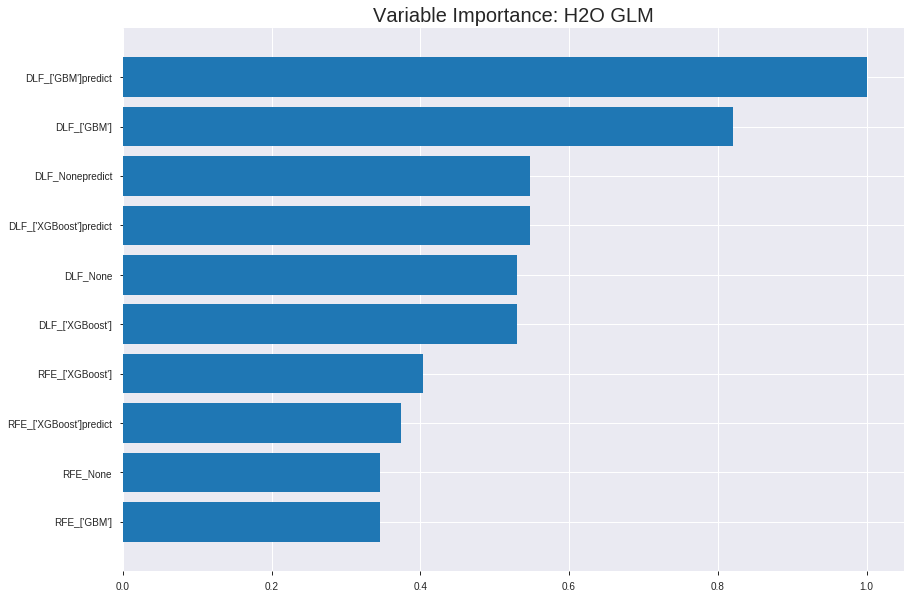

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_074715_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.10687133009508118
RMSE: 0.32691180782449747
LogLoss: 0.3717343770270674
Null degrees of freedom: 1786
Residual degrees of freedom: 1758
Null deviance: 2477.2940333757524
Residual deviance: 1328.5786634947387
AIC: 1386.5786634947387
AUC: 0.9561456579685746
pr_auc: 0.9548478423932208
Gini: 0.9122913159371493
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5855971402784338: 


,0,1,Error,Rate
0,812.0,79.0,0.0887,(79.0/891.0)
1,97.0,799.0,0.1083,(97.0/896.0)
Total,909.0,878.0,0.0985,(176.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5855971,0.9007892,171.0
max f2,0.4181188,0.9193548,231.0
max f0point5,0.6254283,0.9216309,151.0
max accuracy,0.5855971,0.9015109,171.0
max precision,0.8589449,1.0,0.0
max recall,0.1374175,1.0,368.0
max specificity,0.8589449,1.0,0.0
max absolute_mcc,0.5855971,0.8031944,171.0
max min_per_class_accuracy,0.5768414,0.8984375,176.0
max mean_per_class_accuracy,0.5855971,0.9015383,171.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8516344,1.9944196,1.9944196,1.0,0.8547506,1.0,0.8547506,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8475253,1.9944196,1.9944196,1.0,0.8494169,1.0,0.8520837,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8443707,1.9944196,1.9944196,1.0,0.8458559,1.0,0.8500078,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8409631,1.9944196,1.9944196,1.0,0.8424612,1.0,0.8481211,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8382506,1.9944196,1.9944196,1.0,0.8398099,1.0,0.8464589,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8205593,1.9944196,1.9944196,1.0,0.8302545,1.0,0.8384020,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.7943872,1.8599644,1.9497685,0.9325843,0.8075555,0.9776119,0.8281582,0.0926339,0.2924107,85.9964386,94.9768457
,8,0.2003358,0.7685435,1.9722594,1.9554226,0.9888889,0.7803358,0.9804469,0.8161358,0.0993304,0.3917411,97.2259425,95.5422611
,9,0.2999440,0.7219777,1.9496012,1.9534894,0.9775281,0.7452485,0.9794776,0.7925949,0.1941964,0.5859375,94.9601224,95.3489389
,10,0.4001119,0.6665407,1.7492954,1.9023695,0.8770950,0.6982995,0.9538462,0.7689880,0.1752232,0.7611607,74.9295441,90.2369505




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17139851687363172
RMSE: 0.4140030396912947
LogLoss: 0.518241956871968
Null degrees of freedom: 510
Residual degrees of freedom: 482
Null deviance: 708.5067427497428
Residual deviance: 529.6432799231513
AIC: 587.6432799231513
AUC: 0.8285933425371989
pr_auc: 0.8082787556979608
Gini: 0.6571866850743977
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2921772645177379: 


,0,1,Error,Rate
0,148.0,117.0,0.4415,(117.0/265.0)
1,22.0,224.0,0.0894,(22.0/246.0)
Total,170.0,341.0,0.272,(139.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2921773,0.7632027,266.0
max f2,0.2722384,0.8508246,273.0
max f0point5,0.6357719,0.7599309,165.0
max accuracy,0.6357719,0.7612524,165.0
max precision,0.8590322,1.0,0.0
max recall,0.1089993,1.0,388.0
max specificity,0.8590322,1.0,0.0
max absolute_mcc,0.6357719,0.5218935,165.0
max min_per_class_accuracy,0.5967669,0.7547170,184.0
max mean_per_class_accuracy,0.6357719,0.7596104,165.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.50 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8490814,2.0772358,2.0772358,1.0,0.8529954,1.0,0.8529954,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8453840,2.0772358,2.0772358,1.0,0.8463549,1.0,0.8499770,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8421882,1.6617886,1.9474085,0.8,0.8439613,0.9375,0.8480971,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8397639,2.0772358,1.9783198,1.0,0.8409182,0.9523810,0.8463878,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8390957,1.2463415,1.8375547,0.6,0.8394635,0.8846154,0.8450562,0.0121951,0.0934959,24.6341463,83.7554722
,6,0.1017613,0.8270583,1.9973421,1.9174484,0.9615385,0.8331279,0.9230769,0.8390921,0.1016260,0.1951220,99.7342089,91.7448405
,7,0.1506849,0.8108493,1.7448780,1.8614191,0.84,0.8208245,0.8961039,0.8331611,0.0853659,0.2804878,74.4878049,86.1419069
,8,0.2015656,0.7907336,1.7576610,1.8352277,0.8461538,0.8014236,0.8834951,0.8251496,0.0894309,0.3699187,75.7661038,83.5227721
,9,0.3013699,0.7346083,1.4662841,1.7130451,0.7058824,0.7647659,0.8246753,0.8051524,0.1463415,0.5162602,46.6284075,71.3045085
,10,0.4011742,0.6657383,1.3848238,1.6313900,0.6666667,0.7005204,0.7853659,0.7791220,0.1382114,0.6544715,38.4823848,63.1390046



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:47:18,0.000 sec,2,.48E2,29,1.2815585,1.3056414
,2019-12-08 07:47:18,0.005 sec,4,.3E2,29,1.2312580,1.2684451
,2019-12-08 07:47:18,0.010 sec,6,.18E2,29,1.1655042,1.2218496
,2019-12-08 07:47:18,0.013 sec,8,.11E2,29,1.0861050,1.1694482
,2019-12-08 07:47:18,0.017 sec,10,.71E1,29,0.9988808,1.1183824
,2019-12-08 07:47:18,0.022 sec,12,.44E1,29,0.9100697,1.0761003
,2019-12-08 07:47:18,0.025 sec,14,.27E1,29,0.8244660,1.0481460
,2019-12-08 07:47:18,0.029 sec,16,.17E1,29,0.7434688,1.0364839
,2019-12-08 07:47:18,0.033 sec,18,.11E1,29,0.6656665,1.0400964
,2019-12-08 07:47:18,0.037 sec,20,.66E0,29,0.5889158,1.0565880


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.7739726027397261)

('auc', 0.8313797313797314)

('logloss', 0.516776612129561)

('mean_per_class_error', 0.25305250305250304)

('rmse', 0.4152921630253564)

('mse', 0.17246758067027917)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


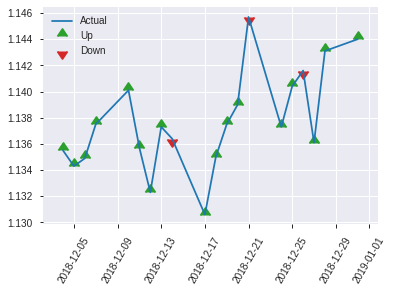


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17246758067027917
RMSE: 0.4152921630253564
LogLoss: 0.516776612129561
Null degrees of freedom: 255
Residual degrees of freedom: 227
Null deviance: 354.8709766655029
Residual deviance: 264.58962541033526
AIC: 322.58962541033526
AUC: 0.8313797313797314
pr_auc: 0.8400702115334335
Gini: 0.6627594627594628
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3872268233736948: 


,0,1,Error,Rate
0,77.0,49.0,0.3889,(49.0/126.0)
1,17.0,113.0,0.1308,(17.0/130.0)
Total,94.0,162.0,0.2578,(66.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3872268,0.7739726,161.0
max f2,0.2369442,0.8720113,190.0
max f0point5,0.7104833,0.7674419,74.0
max accuracy,0.6149613,0.7460938,114.0
max precision,0.8549969,1.0,0.0
max recall,0.1094435,1.0,242.0
max specificity,0.8549969,1.0,0.0
max absolute_mcc,0.3872268,0.4981796,161.0
max min_per_class_accuracy,0.5756800,0.7230769,126.0
max mean_per_class_accuracy,0.6149613,0.7469475,114.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8497589,1.9692308,1.9692308,1.0,0.8529893,1.0,0.8529893,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8465808,1.9692308,1.9692308,1.0,0.8483819,1.0,0.8506856,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8448691,1.9692308,1.9692308,1.0,0.8458817,1.0,0.8494846,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8370722,1.9692308,1.9692308,1.0,0.8413773,1.0,0.8472735,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8362155,1.9692308,1.9692308,1.0,0.8366475,1.0,0.8456388,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8223797,1.9692308,1.9692308,1.0,0.8301714,1.0,0.8379051,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8001200,1.8177515,1.9187377,0.9230769,0.8106976,0.9743590,0.8288359,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7618967,1.6662722,1.8556213,0.8461538,0.7821467,0.9423077,0.8171636,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.7007905,1.3390769,1.6879121,0.68,0.7315585,0.8571429,0.7893697,0.1307692,0.5076923,33.9076923,68.7912088
,10,0.4023438,0.6561546,1.1360947,1.5486184,0.5769231,0.6788730,0.7864078,0.7614774,0.1153846,0.6230769,13.6094675,54.8618372


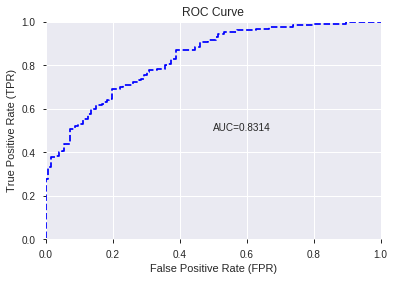

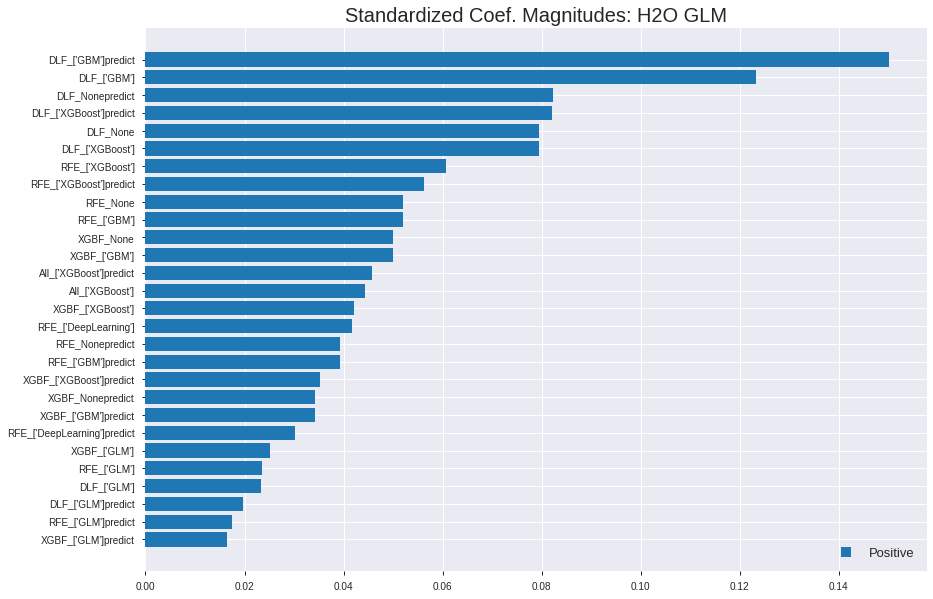

'log_likelihood'
--2019-12-08 08:27:46--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.161.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.161.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


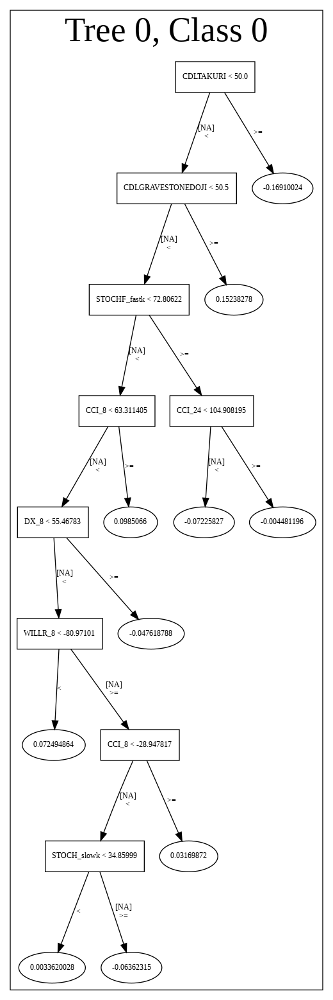

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_074715_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_074715_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_153_sid_9d28',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_153

["DLF_['GBM']predict",
 "DLF_['GBM']",
 'DLF_Nonepredict',
 "DLF_['XGBoost']predict",
 'DLF_None',
 "DLF_['XGBoost']",
 "RFE_['XGBoost']",
 "RFE_['XGBoost']predict",
 'RFE_None',
 "RFE_['GBM']",
 'XGBF_None',
 "XGBF_['GBM']",
 "All_['XGBoost']predict",
 "All_['XGBoost']",
 "XGBF_['XGBoost']",
 "RFE_['DeepLearning']",
 'RFE_Nonepredict',
 "RFE_['GBM']predict",
 "XGBF_['XGBoost']predict",
 'XGBF_Nonepredict',
 "XGBF_['GBM']predict",
 "RFE_['DeepLearning']predict",
 "XGBF_['GLM']",
 "RFE_['GLM']",
 "DLF_['GLM']",
 "DLF_['GLM']predict",
 "RFE_['GLM']predict",
 "XGBF_['GLM']predict"]

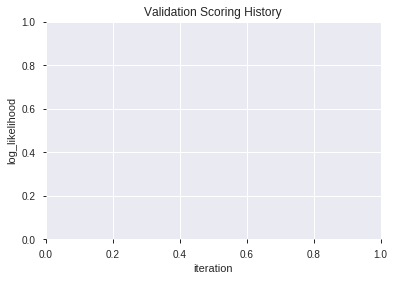

In [108]:
# Super learner
models_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_df[model_name] = pd.read_csv(model_name+".csv")['p1']
    models_df[model_name+'predict'] = pd.read_csv(model_name+".csv")['predict']

models_df[data_label_name] = pd.read_pickle('scaled_df')[[data_label_name]].values[-len(models_df):]

training_frame = h2o.H2OFrame(models_df)
training_frame[data_label_name] = training_frame[data_label_name].ascharacter().asfactor()

model_train(feature_name='Super_learner',model_algo=None,training_frame= training_frame,max_models=500)

In [109]:
# Majority Voting
models1_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models1_df[model_name] = pd.read_csv(model_name+".csv")['predict']

model_accuracy = accuracy_score(models1_df.mode(1)[0].values[index_splits[1]:],pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'MajorityVoting':[model_accuracy]},index=['All']))
display('MajorityVoting', model_accuracy)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


'MajorityVoting'

0.7265625

In [110]:
# LogReg SuperLearner
from sklearn.linear_model import LogisticRegression
models2_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models2_df[model_name] = pd.read_csv(model_name+".csv")['predict']
    models2_df[model_name+'p1'] = pd.read_csv(model_name+".csv")['p1']

clf = LogisticRegression(random_state=0, solver='lbfgs',
                         multi_class='multinomial').fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'LogReg':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.73046875

In [111]:
# DTree SuperLearner
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0).fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'DTree':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.62890625

In [112]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


All                0.770
DRF                0.727
DTree              0.629
DeepLearning       0.770
GBM                0.770
GLM                0.742
LogReg             0.730
MajorityVoting     0.727
StackedEnsemble    0.758
XGBoost            0.754
dtype: float64

,All,DRF,DTree,DeepLearning,GBM,GLM,LogReg,MajorityVoting,StackedEnsemble,XGBoost
All,NaN,NaN,0.629,0.730,NaN,0.730,0.73,0.727,0.758,0.742
DLF,0.738,0.707,NaN,0.723,0.742,0.742,NaN,NaN,NaN,0.738
Fwe,0.734,0.691,NaN,0.727,0.715,0.734,NaN,NaN,NaN,0.719
RFE,0.758,0.703,NaN,0.770,0.758,0.734,NaN,NaN,NaN,0.742
Super_learner,0.746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.770,0.727,NaN,0.746,0.770,0.734,NaN,NaN,NaN,0.754






F1


All                0.782
DRF                0.751
DeepLearning       0.782
GBM                0.782
GLM                0.769
StackedEnsemble    0.778
XGBoost            0.767
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.769,NaN,0.758,0.778,0.754
DLF,0.767,0.746,0.771,0.772,0.764,NaN,0.767
Fwe,0.751,0.751,0.749,0.752,0.751,NaN,0.763
RFE,0.770,0.726,0.782,0.770,0.769,NaN,0.761
Super_learner,0.774,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.782,0.746,0.759,0.782,0.766,NaN,0.763






auc


All                0.831
DRF                0.794
DeepLearning       0.854
GBM                0.828
GLM                0.820
StackedEnsemble    0.834
XGBoost            0.828
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.799,NaN,0.803,0.834,0.818
DLF,0.825,0.783,0.802,0.818,0.816,NaN,0.825
Fwe,0.800,0.770,0.804,0.798,0.800,NaN,0.798
RFE,0.826,0.771,0.854,0.826,0.817,NaN,0.819
Super_learner,0.831,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.828,0.794,0.801,0.828,0.820,NaN,0.828






logloss


All                0.536
DRF                0.802
DeepLearning       0.558
GBM                0.535
GLM                0.537
StackedEnsemble    0.504
XGBoost            0.532
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.558,NaN,0.537,0.504,0.529
DLF,0.511,0.544,0.511,0.514,0.515,NaN,0.511
Fwe,0.536,0.557,0.544,0.535,0.536,NaN,0.532
RFE,0.513,0.562,0.476,0.513,0.512,NaN,0.524
Super_learner,0.517,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.512,0.802,0.534,0.512,0.510,NaN,0.520






mean_per_class_error


All                0.264
DRF                0.307
DeepLearning       0.279
GBM                0.284
GLM                0.271
StackedEnsemble    0.242
XGBoost            0.283
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.272,NaN,0.271,0.242,0.258
DLF,0.262,0.293,0.279,0.259,0.259,NaN,0.262
Fwe,0.264,0.307,0.273,0.284,0.264,NaN,0.283
RFE,0.240,0.297,0.229,0.240,0.266,NaN,0.256
Super_learner,0.253,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.231,0.274,0.254,0.231,0.265,NaN,0.246






rmse


All                0.428
DRF                0.441
DeepLearning       0.438
GBM                0.428
GLM                0.428
StackedEnsemble    0.411
XGBoost            0.426
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.438,NaN,0.427,0.411,0.421
DLF,0.414,0.432,0.419,0.416,0.418,NaN,0.414
Fwe,0.428,0.441,0.430,0.428,0.428,NaN,0.426
RFE,0.414,0.440,0.397,0.414,0.417,NaN,0.419
Super_learner,0.415,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.413,0.433,0.426,0.413,0.415,NaN,0.416






mse


All                0.183
DRF                0.194
DeepLearning       0.191
GBM                0.183
GLM                0.183
StackedEnsemble    0.169
XGBoost            0.181
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.191,NaN,0.182,0.169,0.177
DLF,0.171,0.187,0.176,0.173,0.175,NaN,0.171
Fwe,0.183,0.194,0.185,0.183,0.183,NaN,0.181
RFE,0.172,0.194,0.158,0.172,0.174,NaN,0.176
Super_learner,0.172,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.171,0.187,0.181,0.171,0.172,NaN,0.173


{'F1':                  All    DRF  DeepLearning    GBM    GLM  StackedEnsemble  XGBoost
 All              NaN    NaN         0.769    NaN    NaN              NaN      NaN
 DLF              NaN    NaN         0.771    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN    NaN  0.764              NaN      NaN
 DLF              NaN    NaN           NaN    NaN    NaN              NaN    0.767
 DLF              NaN  0.746           NaN    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN  0.772    NaN              NaN      NaN
 DLF            0.767    NaN           NaN    NaN    NaN              NaN      NaN
 All              NaN    NaN           NaN    NaN  0.758              NaN      NaN
 All              NaN    NaN           NaN    NaN    NaN              NaN    0.754
 XGBF             NaN    NaN         0.759    NaN    NaN              NaN      NaN
 XGBF             NaN    NaN           NaN    NaN  0.766              NaN      Na